# Overlap Development

This notebook summarizes the development of a function (intersectGDF) which computes the overlaps between all geometries of two pandas GeoDataFrames



TODO: Summary of this project and it's main sections

In [1]:
# Data directory
DIR_DATA = 'Data/'
DIR_RESULTS = 'Results/'

import pandas as pd
import numpy as np
import geopandas
import pyproj # for more efficient coordinate transformations

# Line profiling  # https://mortada.net/easily-profile-python-code-in-jupyter.html
import line_profiler
%load_ext line_profiler

import matplotlib.pyplot as plt
%matplotlib inline

# FSA correspondence
import time
import dill # for saving/loading results to save on computation time
import gzip # for compressing results to fit on github
import shapely # for specific error identification
import ogr
import warnings
warnings.filterwarnings("ignore")
import logging
logging.getLogger('shapely.geos').setLevel(logging.CRITICAL)

In [2]:
def GMLtoGDF(filename):
    gdf = geopandas.read_file(filename)
    gdf.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
    gdf.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
    gdf = gdf.set_crs(epsg=3347) # Needed only for FSA file, the others are 3347 and parsed correctly by geopandas, and the pdf in the zip file has the same projection parameters (FSA vs. DA, ADA, CT)
    gdf['Area'] = gdf['Geometry'].to_crs(epsg=6931).area # Equal-area projection
    gdf['Centroid'] = gdf['Geometry'].centroid
    gdf['Geometry'] = gdf['Geometry'].to_crs(epsg=4326) # Latitude/Longitude representation
    gdf['Centroid'] = gdf['Centroid'].to_crs(epsg=4326) # Only the set geometry is converted with gdf.to_crs(); all other geometry-containing columns must be converted explicitly; here we convert all columns explicitly
    gdf = gdf.set_crs(epsg=4326) # The series and geodataframe can have separate crs; this was found necessary for the geopandas.union function to operate easily
    gdf['Centroid Latitude'] = gdf['Centroid'].geometry.y
    gdf['Centroid Longitude'] = gdf['Centroid'].geometry.x
    gdf.drop(columns = 'Centroid', inplace=True) # Because WKT Point cannot be serialized to JSON, we drop the Centroid column and keep only its float components
    return gdf

In [3]:
def extendBound(bound,direction='up',method='nearestLeadingDigit',scale=10):
    '''Extend bound to next 'round' number
    
    Parameters
    ----------
    bound: float or float castable number or a list thereof
    direction: {'up','down',nonzero number} or a list of these values indicating the direction to round in
    method: str describing the extension method
        'nearestLeadingDigit': Bound is nearest numbers with leading digit followed by zeros
        'nearestPower': Bound is nearest integer power of scale (scale must be > 1).  For negative numbers, the sign and direction are reversed, the extension performed, then the sign of the result is reversed back.
        'nearestMultiple': Bound is nearest multiple of scale (scale must be > 0)
        'round': Bound is rounded using the default method
    scale: numeric as described in method options or a list thereof
    
    Returns
    -------
    float: the extended bound
    
    Notes
    -----
    All inputs, if not single-valued, must be list-castable and of equal length
    If all inputs are single-valued, the output is a float, otherwise it is a list of floats
    '''
    import numpy as np
    
    # Check and adjust the length of inputs
    unlist = False
    try:
        bound = list(bound)
    except:
        try:
            bound = [bound]
            unlist = True
        except:
            print("Input 'bound' must be numeric or convertible to list type.")
            return None
    try:
        if type(direction)==str:
            direction = [direction]
        direction = list(direction)
    except:
        try:
            direction = [direction]
        except:
            print("Input 'direction' must be a string or nonzero number or convertible to list type.")
            return None
    try:
        if type(method)==str:
            method = [method]
        method = list(method)
    except:
        try:
            method = [method]
        except:
            print("Input 'method' must be a string or convertible to list type.")
            return None
    try:
        scale = list(scale)
    except:
        try:
            scale = [scale]
        except:
            print("Input 'scale' must be numeric or convertible to list type.")
            return None
    inputs = [bound, direction, method, scale]
    lengths = [len(i) for i in inputs]
    set_lengths = set(lengths)
    max_len = max(set_lengths)
    set_lengths.remove(1)
    if len(set_lengths)>1:
        print('Inputs must be of the same length or of length one.  See help(extendBound)')
        return None
    if max_len>1: # can this be converted to a looped statement?
        if len(bound)==1:
            bound = bound*max_len
        if len(direction)==1:
            direction = direction*max_len
        if len(method)==1:
            method = method*max_len
        if len(scale)==1:
            scale = scale*max_len
        unlist = False

    # If multiple methods are specified, recursively call this function for each method and reassemble results
    if len(bound)>1 and len(set(method))>1:
        ret = np.array([None for b in bound])
        for m in list(set(method)):
            ind = np.where(np.array(method)==m)
            ret[ind] = extendBound(list(np.array(bound)[ind]),list(np.array(direction)[ind]),m,list(np.array(scale)[ind]))
        return list(ret)
    
    # Convert direction to a logical array roundup
    try:
        roundup = [True if d=='up' else False if d=='down' else True if float(d)>0 else False if float(d)<0 else None for d in direction]
    except:
        print('direction must be "up", "down", or a non-negative number')
        return None
    if any([r==None for r in roundup]):
        print('direction must be "up", "down", or a non-negative number')
        return None
    
    # Cases for multiple methods handled above, return to string method
    method = method[0]
    
    # Execute the conversions
    if method=='nearestLeadingDigit':
        iszero = np.array(bound)==0
        isnegative = np.array(bound) < 0
        offsets = np.logical_xor(roundup, isnegative)
        power = [0 if z else np.floor(np.log10(abs(b))) for b, z in zip(bound, iszero)]
        firstdigit = [abs(b)//np.power(10,p) for b, p in zip(bound, power)]
        exceeds = [abs(b)>f*np.power(10,p) for b, f, p in zip(bound, firstdigit, power)]
        newbound = [abs(b) if not t else (f+o)*np.power(10,p) for b, t, n, f, o, p in zip(bound, exceeds, isnegative, firstdigit, offsets, power)]
        newbound = [-n if t else n for n, t in zip(newbound,isnegative)]
    elif method=='nearestPower':
        try:
            scale = [float(s) for s in scale]
            if any([s<=1 for s in scale]):
                print('scale should be greater than 1')
                return None
        except ValueError:
            print('scale should be a number or list of numbers greater than 1')
            return None
        isnegative = np.array(bound) < 0
        offsets = np.logical_xor(roundup, isnegative)
        roundfuns = [np.ceil if o else np.floor for o in offsets]
        newbound = [0 if b==0 else np.power(s, r(np.log10(abs(b))/np.log10(s))) for b, r, s in zip(bound,roundfuns,scale)]
        newbound = [-n if t else n for n, t in zip(newbound,isnegative)]
    elif method=='nearestMultiple':
        try:
            scale = [float(s) for s in scale]
            if any([s<=0 for s in scale]):
                print('scale should be greater than 0')
                return None
        except ValueError:
            print('scale should be a number or list of numbers greater than 0')
            return None
        roundfuns = [np.ceil if r else np.floor for r in roundup]
        newbound = [s*(r(b/s)) for b, r, s in zip(bound,roundfuns,scale)]
    elif method=='round':
        roundfuns = [np.ceil if r else np.floor for r in roundup]
        newbound = [f(b) for b, f in zip(bound, roundfuns)]
    else:
        print('Invalid method, see help(extendBound)')
        return None
    return newbound[0] if unlist else newbound

def extendBounds(bounds,method='nearestLeadingDigit',scale=10):
    if bounds[0]>bounds[1]:
        print('bounds must be ordered from least to greatest')
        return None    
    return extendBound(bounds,direction=['down','up'],method=method,scale=scale)

In [4]:
# Function(s) to encapsulate loading and saving long calculations
def loadResults_(name,tuples,fileformat='db',compress=False):
    '''Loads variables from files
    
    Parameters
    ----------
    name: str, file name base (including directory if desired)
    tuples: list of tuples (varname, suffix),
        varname: str, the key of the output dict where the data will be stored
        suffix: str, the string appended to name to generate a full file name
    fileformat: str, suffix to save the file with (do not include period)
    compress: bool, True to zip results (appends '.gz' to filename)
    
    Returns
    -------
    None if an error was encountered, or
    Tuple the length of tuples containing for each element of tuples:
        None if there was an error, or
        the variable loaded from file at the same position from tuples
    
    Notes
    -----
    Files read in binary format with optional gzip encoding
    This function is the complement to saveResults_()
    
    TODO
    ----
    Add option to change save format (text vs. binary)
    Make fileformat select the save format
    '''
    if type(name)!=str:
        print('Error: name must be a string')
        return None
    if type(fileformat)!=str:
        print('Error: fileformat must be a string')
        return None
    
    ret = []
    for n, s in tuples:
        fn = name+s+'.'+fileformat+('.gz' if compress else '')
        try:
            with open(fn,'rb') as file:
                ret.append(dill.loads(gzip.decompress(file.read()) if compress else file.read()))
        except (FileNotFoundError, IOError) as e:
            ret.append(None)
            print(f'An error was encountered while reading from file {fn}: {e}')
    return tuple(ret)

def loadResults(name):
    '''Loads variables 'gdf_union', 'times', and 'areas' from zipped files
    
    Parameters
    ----------
    name: str containing the base name of the files
    
    Returns
    -------
    None if an error was encountered, or
    Tuple the length of tuples containing:
        None if there was an error, or
        the variable loaded from file at the same position from tuples
    
    Notes
    -----
    File names area <name>_<variable>.db.gz and are in gzip dill binary format
    Uses outside variable DIR_RESULTS if available, otherwise put path in name
    '''
    tuples = [('gdf_union',''),
              ('times','_times'),
              ('areas','_areas')]
    
    return loadResults_(name,tuples,fileformat='db',compress=True)

def saveResults_(name,tuples,fileformat='db',compress=False):
    '''Saves variables to files
    
    Parameters
    ----------
    name: str, file name base (including directory if desired)
    tuples: list of tuples (varname, suffix),
        var: <any>, the variable to be output to file
        suffix: str, the string appended to name to generate a full file name
    fileformat: str, suffix to save the file with (do not include period)
    compress: bool, True to zip results (appends '.gz' to filename)
    
    Returns
    -------
    None if an error was encountered, or
    Tuple the same length as tuples containing return codes:
        0 Failure
        1 Success
    
    Notes
    -----
    Files written in binary format
    Files are created if they do not already exist
    Files are overwritten if they already exist

    TODO
    ----
    Make fileformat determine save format

    '''
    if type(name)!=str:
        print('Error: name must be a string')
        return None
    if type(fileformat)!=str:
        print('Error: fileformat must be a string')
        return None
    
    ret = []
    for v, s in tuples:
        fn = name+s+'.'+fileformat+('.gz' if compress else '')
        try:
            with open(fn,'wb+') as file:
                file.write(gzip.compress(dill.dumps(v)) if compress else dill.dumps(v))
                ret.append(1)
        except IOError as e:
            ret.append(0)
            print(f'An error was encountered while writing to file {fn}: {e}')
    return tuple(ret)

def saveResults(name, gdf_union, times, areas):
    '''Saves variables 'times', 'areas', and 'gdf_union' to zipped files
    
    Parameters
    ----------
    name: str, file name base (including directory if desired)
    gdf_union: geodataframe of geographic areas, produced from intersectGDF()
    times: 1d array of computation times, produced from intersectGDF()
    areas: list of lists of overlap areas, produced from intersectGDF()
    
    Returns
    -------
    None if an error was encountered, or
    Tuple the same length as tuples containing return codes:
        0 Failure
        1 Success
    
    Notes
    -----
    File names area <name><variable>.db.gz and are in gzip dill binary format
    Use outside variable DIR_RESULTS in construction of name
    '''
    tuples = [(gdf_union,''),
              (times,'_times'),
              (areas,'_areas')]
    
    return saveResults_(name,tuples,fileformat='db',compress=True)

def loadComputeSave(gdf_1, key_1, gdf_2, key_2, loadname=None, savename=None):
    '''Returns the overlap of geometries, defaulting to file versions if possible
    
    Parameters
    ----------
    gdf_1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    loadname: str or None, base name of files to load data from (None -> 'DEFAULT'), see saveResults()
    savename: str or None, base name of files to save data to (None -> loadname), see loadResults()
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    '''
    verbosity = 1
    
    if savename is None:
        savename = loadname if not loadname is None else 'DEFAULT'
    
    ret = None if loadname is None else loadResults(DIR_RESULTS+loadname)
    recompute = False
    saveresults = False
    if ret is None:
        recompute = True
        saveresults = True
    else:
        gdf_union, times, areas = ret
        if gdf_union is None:
            if areas is None: # Recompute
                recompute = True
                saveresults = True
            else:                # Reconstruct from areas
                print("Overlaps will be recomputed based on loaded variable 'areas'")
                gdf_union, times, areas = intersectGDFareas(gdf_1,key_1,gdf_2,key_2,areas_in=temp_areas,verbosity=1)
                saveresults = True
        else:
            print("Overlaps loaded from file")

    if recompute:
        print("Overlaps must be computed")
        gdf_union, times, areas = intersectGDF(gdf_1,key_1,gdf_2,key_2,verbosity=1)
    
    if saveresults:
        saveResults(DIR_RESULTS+savename, gdf_union, times, areas)
        print("Variables saved to file at "+DIR_RESULTS+savename)

    return gdf_union, times, areas

In [5]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0], units given by area_epsg
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    Relies on geopandas, shapely, pyproj
    '''
    if gdf1.crs!=gdf2.crs:
        print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        return None
    
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    gdf_appendlist = []
    gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
    project = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg).transform # https://gis.stackexchange.com/questions/127427/transforming-shapely-polygon-and-multipolygon-objects
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        try:
            gdf_tmp = gdf1['Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b['Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries

        areas.append([shapely.ops.transform(project, g).area for g in gdf_tmp.geometry])
        indmax = np.argmax(areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 56.4% to 34.1% total of execution time for this line, copying, appending, and key assignment vs. creating a new geodataframe each time in the loop
        gdf_pre[keyfield1] = gdf1[keyfield1].iloc[indmax] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
            #print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
    gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
    gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
    if verbosity>=1: print('Overlap processing complete')
        
    return gdf_union, times, areas

In [6]:
def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    areas must be supplied, 
    Relies on geopandas, shapely, pyproj
    '''
    if gdf1.crs!=gdf2.crs:
        print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        return None
    
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    gdf_appendlist = []
    gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
    project = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg).transform # https://gis.stackexchange.com/questions/127427/transforming-shapely-polygon-and-multipolygon-objects
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        try:
            gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
            
        areas_tmp = np.zeros(gdf1.shape[0])
        # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        areas.append(areas_tmp)
        indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        #gdf_loop = gdf_pre.copy(deep=True)
        gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 56.4% to 34.1% total of execution time for this line, copying, appending, and key assignment vs. creating a new geodataframe each time in the loop
        gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time, see below loop for alternate
        gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
            # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
    gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
    gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']

    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

In [7]:
def makeBuffered(gdf):
    '''Returns a zero buffered copy of input geodataframe (or list thereof)'''
    unlist=False
    if type(gdf)!=list:
        gdf = [gdf]
        unlist = True
    ret = []
    for g in gdf:
        gb = g.copy(deep=True)
        gb['Geometry'] = gb['Geometry'].buffer(0)
        ret.append(gb)
    if unlist:
        ret = ret[0]
    return ret

In [8]:
def makeValid(gdf):
    '''Returns a copy of the geodataframe passed through ogr MakeValid (lists also)'''
    unlist=False
    if type(gdf)!=list:
        gdf = [gdf]
        unlist = True
    ret = []
    for g in gdf:
        gb = g.copy(deep=True)
        gb['Geometry'] = [shapely.wkb.loads(ogr.CreateGeometryFromWkb(g.to_wkb()).MakeValid().ExportToWkb()) for g in gb['Geometry']]
        ret.append(gb)
    if unlist:
        ret = ret[0]
    return ret 

In [8]:
def normalizeRows(areas, aslist=False):
    '''Normalizes each row of the input by its sum (numpy.array)'''
    a = np.array(areas)
    a = a / np.sum(a,axis=1)[:, np.newaxis]
    return a.tolist() if aslist else a

def thresholdAreas(areas, threshold=1e-6, aslist=False):
    '''Zeros out elements of areas that are below the threshold (numpy.array(float))'''
    a = np.array(areas)
    a_ratio = normalizeRows(areas)
    a[a_ratio<threshold] = 0
    return a.tolist() if aslist else a

def normalizeAreas(areas, threshold=1e-6, aslist=False):
    '''Thresholds then normalizes areas (numpy.array(float))'''
    a = thresholdAreas(areas, threshold)
    a = normalizeRows(a)
    return a.tolist() if aslist else a

def maximumAreas(areas, aslist=False):
    '''Zeros out non-maximum elements in each row of areas (numpy.array(int))
    Test with e.g.: (max(np.sum(r,axis=1)), min(np.sum(r,axis=1)), np.sum(r))'''
    a = np.array(areas)
    a_max = np.max(a,axis=1)
    r = (a >= a_max[:,np.newaxis]).astype(int)
    return r.tolist() if aslist else r

In [9]:
def testGeomType(geom):
    if geom.type=='MultiPolygon':
        test = [testGeomType(g) for g in geom]
    elif geom.type=='Polygon':
        test = [True]
    else:
        print(f'Geometry is not strictly Polygon or MultiPolygon: {geom.type}')
    return all(test)

def countCoordinates(geom):
    '''Count the total coordinates in the geometry
    
    Parameters
    ----------
    geom: shapely.geometry.Polygon or shapely.geometry.MultiPolygon (consisting only of shapely.geometry.Polygon componenet)
    
    Returns
    -------
    int: number of coordinates in the geometry
    
    Notes
    -----
    Each geometry element repeats the first point as the last point, and these are included in the count
    '''
    if geom.type=='MultiPolygon':
        count = [countCoordinates(g) for g in geom]
    elif geom.type=='Polygon':
        count = [len(geom.exterior.coords) + sum([len(i.coords) for i in geom.interiors])]
    else:
        print(f'Geometry is not strictly Polygon or MultiPolygon: {geom.type}')
    return sum(count)

In [10]:
%%time
gdf_CA_FSA_D = GMLtoGDF(DIR_DATA+'lfsa000a16g_e.gml')
gdf_CA_DA_D = GMLtoGDF(DIR_DATA+'lda_000a16g_e.gml')
gdf_CA_FSA = GMLtoGDF(DIR_DATA+'lfsa000b16g_e.gml')
gdf_CA_DA = GMLtoGDF(DIR_DATA+'lda_000b16g_e.gml')

Wall time: 3min 47s


In [11]:
%%time
gdf_CA_FSA_Db = makeBuffered(gdf_CA_FSA_D)
gdf_CA_DA_Db = makeBuffered(gdf_CA_DA_D)
gdf_CA_FSAb = makeBuffered(gdf_CA_FSA)
gdf_CA_DAb = makeBuffered(gdf_CA_DA)

Wall time: 1min 48s


In [ ]:
%%time
gdf_CA_FSA_Dv = makeValid(gdf_CA_FSA_D)
gdf_CA_DA_Dv = makeValid(gdf_CA_DA_D)
gdf_CA_FSAv = makeValid(gdf_CA_FSA)
gdf_CA_DAv = makeValid(gdf_CA_DA)

In [12]:
key_fsa = 'CFSAUID'
key_da = 'DAUID'

In [15]:
# Digital Boundary Overlap Load-Compute-Save
gdf_fsa = gdf_CA_FSA_D
gdf_da = gdf_CA_DA_D
loadname = 'GDF_FSA-DA_D_M2AREA'
savename = loadname
gdf_union_D, times_D, areas_D = loadComputeSave(gdf_fsa, key_fsa, gdf_da, key_da, loadname, savename)

Overlaps loaded from file


In [16]:
# Cartographic Boundary Overlap Load-Compute-Save
gdf_fsa = gdf_CA_FSA
gdf_da = gdf_CA_DA
loadname = 'GDF_FSA-DA_M2AREA'
savename = loadname
gdf_union_C, times_C, areas_C = loadComputeSave(gdf_fsa, key_fsa, gdf_da, key_da, loadname, savename)

Overlaps loaded from file


# Section 1: Multiprocess Approach To Overlap Calculation

Using the multiprocess module was mildly successful.  Using 10 processes instead of 1, speedup was 20-50%, implying the limiting factor was overhead and dominince of single geometries.  This issue is addressed in the next section.

Index | Description | Time | Notes
---|---|---|---
1-1 | Digital, Single process, all overlaps | 01:57:35 | Original Function
1-2 | Digital, Single process, areas shortcut, no area reacalculation | 00:33:40 | 29% of full execution time
1-3 | Digital, Single process, areas shortcut, $m^2$ area recalculation | 01:46:41 | Even execution time distribution per 1000 DAs
1-4 | Digital, Single process, areas shortcut, sq deg area | 01:54:13 | Even execution time distribution per 1000 DAs, running concurrently with multiprocess calculation
1-5 | Cartographic, Single process, areas shortcut | 14:50:51 | Penultimate interval 3.6 hr, Ultimate interval 9 hr
1-6 | Cartographic, Single process, all overlaps | 17:16:55 | Penultimate interval 3.6 hr, Ultimate interval 11.1 hr, cuts processing time by ~3.5 hours (15%)
1-7 | Cartographic, Single process, all overlaps, buffered input, older? | 22:04:15 | Might be older version or run under higher processor load (28% longer)
1-8 | Cartographic, 10 processes, all overlaps | 15:04:59 | Penultimate interval 5.6 hr, Ultimate interval 7 hr, processor time 1d18:42:22 (2.83x)
1-9 | Digital, 10 processes, all overlaps | 01:10:04 | Processor time 11:09:04 (9.55x)
1-10 | Digital, 10 processes, areas shortcut | 00:44:53 | Processor time 07:06:35, speedup 9.5x

# Section 2: Area Calculation Refinement

By profiling the overlap code several improvements were made, reducing runtime significantly.  For example, for 10,000 digital geometries the runtime decreased from 19:08 to 00:33 (35x speedup).  These refinements did not greatly improve overall performance due to large numbers of geometries to search and large geometries which dominate cartographic calculation time.  Improvements described here are:

* Correcting the coordinate change and saving to correctly save areas taken from alternate coordinate reference systems (worsened performance but necessary for correct results)
* Using pyproj.Transformer and shapely.ops.transform to define the transform once instead of each iteration (most significant)
* Storing the union geodataframe from each iteration and concatenating all outside the loop
* Pre-allocating a geodataframe and its keys for storing the union information, modifying it for each run and storing a deep copy as the output

Index | Description | Time | Notes
---|---|---|---
2-1 | Cartographic, Single process, singular areas, line profile, 2k DAs | 00:01:54, total exceptions 5 | Baseline cartographic, corrected area conversion to use a crs and save properly
2-2 | Cartographic, Single process, singular areas, line profile, 1k DAs | 00:00:08, total exceptions 2, Total time: 9.89693 s | Uses pyproj.Transformer and shapely.ops.transform
2-3 | Cartographic, Single process, singular areas, line profile, 1k DAs | 00:00:06, total exceptions 2, Total time: 8.03953 s | Uses concat after loop for gdf_union
2-4 | Digital, Single process, singular areas, line profile, 1k DAs | 0d00:00:04, total exceptions 2, Total time: 5.43951 s | Baseline Digital
2-5 | Digital, Single process, singular areas, line profile, 10k DAs | 0d00:00:52, total exceptions 90, Total time: 57.8604 s | Longer Baseline Digital, with Transformer
2-6 | Digital, Single process, singular areas, line profile, 10k DAs | 0d00:00:42, total exceptions 90, Total time: 47.5247 s | With Transformer, With pre-allocation of return gdf lines
2-7 | Digital, Single process, singular areas, line profile, 10k DAs | 0d00:00:37, total exceptions 90, Total time: 42.1688 s | With Transformer, With pre-allocation of return gdf lines including keys, With gdf line copy before assignment
2-8 | Digital, Single process, singular areas, line profile, 10k DAs | 0d00:00:33, total exceptions 90, Total time: 40.2627 s | With Transformer, With pre-allocation of return gdf lines including keys, With gdf line copy before assignment
2-9 | Digital, Single process, all areas, 1k DAs | 0d00:01:49, total exceptions 13 | Gain is not as significant when all overlaps must be computed

# Section 3: Evaluation of New Overlap Function

Index | Description | Time
---|:--|:--
3-1 | Digital, Single process, all overlaps, final version | 0d01:49:41, total exceptions 1368
3-2 | Digital, Single process, all overlaps, final version, line profile | 0d02:23:57, total exceptions 1368
3-3 | Digital, Single process, significant overlaps, final version, line profile | 0d00:03:50, total exceptions 432
3-4 | Cartographic, Single process, singular areas only, buffered input, first 54000 DAs, line profile | 0d00:09:51, total exceptions 0
3-5 | Cartographic, Single process, singular areas only, buffered input, post-54000 DAs, line profile | 0d16:32:02, total exceptions 0
3-6 | Digital, Single process, areas shortcut, unoptimized area conversion | 01:54:44, total exceptions 618
3-7 | Digital, Single process, singular areas, line profile | 0d00:04:05, total exceptions 432
3-8 | Digital, Single process, singular areas | 0d00:02:50, total exceptions 432

Runs (1,2): line profiling can add 8637/6581-1 = 31% additional time; most time (80%) is spent performing overlaps, and most of the rest (17%) performing area calculations.

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
    67     56590 68938578922.0 1218211.3     79.6              gdf_tmp = gdf1['Geometry'].intersection(gdf2['Geometry'].iloc[i])
    71      1368 2080189353.0 1520606.3      2.4              gdf_tmp = gdf1b['Geometry'].intersection(gdf2b['Geometry'].iloc[i])
    73     56590 14353253346.0 253635.9     16.6          areas.append([shapely.ops.transform(project, g).area for g in gdf_tmp.geometry])
    74     56590   50413271.0    890.9      0.1          indmax = np.argmax(areas[-1])
    75     56590  232354075.0   4105.9      0.3          gdf_pre.geometry = [gdf_tmp.iloc[indmax]]
    76     56590  123903584.0   2189.5      0.1          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[indmax]
    77     56590  117697733.0   2079.8      0.1          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
    78     56590  451468625.0   7977.9      0.5          gdf_appendlist.append(gdf_pre.copy(deep=True))
    84         1  183100367.0 183100367.0      0.2      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0)
    
Runs (2,3): Runtime significantly reduced by avoiding calculation of non-overlapping geometries (38x speedup); overlap calculation still dominates (47%) but area conversion (8%) and overlap result collection (39%) now provide the balance.

    69     56590 1212816535.0  21431.6     46.9              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i])
    73       432   26450940.0  61229.0      1.0              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i])
    77     56590  208492219.0   3684.3      8.1          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry]
    81     56590  174424071.0   3082.2      6.8          gdf_pre.geometry = [gdf_tmp.iloc[indmax]]
    82     56590  108568541.0   1918.5      4.2          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]]
    83     56590  107511141.0   1899.8      4.2          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
    85     56590  405915488.0   7172.9     15.7          gdf_appendlist.append(gdf_pre.copy(deep=True))
    91         1  202047733.0 202047733.0      7.8      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0)
    
Runs (4,5): Though most geometries are significantly sped up, some large geometries are still dominating the caclulation time.

Runs (7,8): Line profiling increases execution time by 44%


# intersectGDF versions

### Original version

In [17]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0], units given by area_epsg
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    '''
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        try:
            gdf_tmp = gdf1['Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b['Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries

        areas.append(gdf_tmp.to_crs(epsg=area_epsg).area)
        indmax = np.argmax(areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[indmax],crs=gdf1['Geometry'].crs)
        gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp,crs=gdf_tmp.crs)
        gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[indmax]
        gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_union = gdf_union.append(gdf_tmp,ignore_index=True)
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

In [18]:
def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    areas must be supplied, 
    '''
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        try:
            gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
            
        areas_tmp = np.zeros(gdf1.shape[0])
        areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area
        areas.append(areas_tmp)
        ind = np.argmax(gdf_tmp.to_crs(epsg=area_epsg).area) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[ind],crs=gdf1['Geometry'].crs)
        gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp,crs=gdf_tmp.crs)
        gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][ind]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_union = gdf_union.append(gdf_tmp,ignore_index=True)
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

### "Final" version

Result after development in the first three sections of this file

* Optimized version that uses unmodified geopandas intersection
* Optional areas_in (unifies previous versions)
* Areas can be measured in arbitrary coordinate reference system
* Optional per-validated geometries can be supplied (allowing testing of make-valid methods besides geopandas buffer(0))

Optimizing transformations informed by:

* https://pyproj4.github.io/pyproj/stable/advanced_examples.html#optimize-transformations
* https://pyproj4.github.io/pyproj/stable/api/transformer.html

In [5]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0], units given by area_epsg
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    Relies on geopandas, shapely, pyproj
    '''
    if gdf1.crs!=gdf2.crs:
        print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        return None
    
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    gdf_appendlist = []
    gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
    project = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg).transform # https://gis.stackexchange.com/questions/127427/transforming-shapely-polygon-and-multipolygon-objects
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        try:
            gdf_tmp = gdf1['Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b['Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries

        areas.append([shapely.ops.transform(project, g).area for g in gdf_tmp.geometry])
        indmax = np.argmax(areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 56.4% to 34.1% total of execution time for this line, copying, appending, and key assignment vs. creating a new geodataframe each time in the loop
        gdf_pre[keyfield1] = gdf1[keyfield1].iloc[indmax] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
            #print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
    gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
    gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
    if verbosity>=1: print('Overlap processing complete')
        
    return gdf_union, times, areas

In [19]:
def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    areas must be supplied, 
    Relies on geopandas, shapely, pyproj
    '''
    if gdf1.crs!=gdf2.crs:
        print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        return None
    
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    gdf_appendlist = []
    gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
    project = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg).transform # https://gis.stackexchange.com/questions/127427/transforming-shapely-polygon-and-multipolygon-objects
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        try:
            gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
            
        areas_tmp = np.zeros(gdf1.shape[0])
        # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        areas.append(areas_tmp)
        indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        #gdf_loop = gdf_pre.copy(deep=True)
        gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 56.4% to 34.1% total of execution time for this line, copying, appending, and key assignment vs. creating a new geodataframe each time in the loop
        gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time, see below loop for alternate
        gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
            # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
    gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
    gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']

    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

### "Final" version, more efficient, optional areas_in, optional buffer application

In [1092]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, apply_buffer=False):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]], or None
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    apply_buffer: bool, set to True to apply .buffer(0) to all geometries to make them valid (can occasionally drop parts of geometry)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    If areas_in is None, calculate all overlaps
    Relies on geopandas, shapely, pyproj, numpy
    '''
    if gdf1.crs!=gdf2.crs:
        print(f'Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}')
        return None
    
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    # Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if apply_buffer:
        start_time = time.time()
        gdf1['Geometry'] = gdf1['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        start_time = time.time()
        gdf2['Geometry'] = gdf2['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    gdf_appendlist = []
    gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
    project = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg).transform
    gdf1inds = np.array(areas_in)>0 if not areas_in is None else np.full((gdf2.shape[0],gdf1.shape[0]),True)
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        gdf1ind = gdf1inds[i]
        try:
            gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        except (shapely.errors.TopologicalError): # This can occur if a geometry is invalid
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            print(f'WARNING: Output at index {i} invalid due to invalid geometry input.  Re-run with valid geometries.  Possible invalid geometries at gdf2 index {i}, gdf1 indices {np.where(gdf1ind)[0] if sum(gdf1ind)<gdf1.shape[0] else "[all]"}.')
            gdf_tmp = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)]},crs=gdf1.crs)
            #gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
            
        areas_tmp = np.zeros(gdf1.shape[0])
        areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry]
        areas.append(areas_tmp)
        indmax = np.argmax(areas_tmp[gdf1ind])
        gdf_pre.geometry = [gdf_tmp.iloc[indmax]]
        gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]]
        gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_appendlist.append(gdf_pre.copy(deep=True))
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0)
    gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
    gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']

    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

### Geopandas sjoin, elementwise intersection version

Alternative approach after upgrading GeoPandas - sjoin works properly in 0.9.0 (was 0.8.1).  Did not come across this function previously, or else needed to develop something that showed progress.

In [1093]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, apply_buffer=False, threshold=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must have valid geometries and match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must have valid geometries and match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    apply_buffer: bool, use .buffer(0) to coerce valid geometries in gdf1 and gdf2 (often works, sometimes corrupts geometry)
    threshold: float or None, a float value discards overlaps that area less than threshold fraction of the largest overlap for each geometry in gdf2
    
    Returns
    -------
    GeoDataFrame: gdf_joined where each row contains an overlap geometry between one row in gdf1 and one row in gdf2, with associated keys and indices
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates/spatially indexes over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries (optional)
    areas_in is optional
    Relies on geopandas, numpy as np, and time
    Returns None on input error
    '''
    if verbosity>=1: print("Beginning overlap determination")
    begin_time = time.time()
    start_time = time.time()
    
    # Ensure coordinate reference systems match
    if gdf1.crs!=gdf2.crs:
        print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        return None
    
    # Ensure geometries are valid
    n_invalid1 = gdf1.shape[0]-sum(gdf1.geometry.is_valid)
    n_invalid2 = gdf2.shape[0]-sum(gdf2.geometry.is_valid)
    if not apply_buffer and (n_invalid1>0 or n_invalid2>0):
        print(f"Input geometries must be valid: {n_invalid1} invalid geometries in gdf1, {n_invalid2} invalid geometries in gdf2")
        return None
    
    # Ensure areas_in is the proper size
    if not areas_in is None:
        irreg = not all([len(a)==len(areas_in[0]) for a in areas_in])
        if len(areas_in)!=gdf2.shape[0] or len(areas_in[0])!=gdf1.shape[0] or irreg:
            print(f"Input areas_in must have size [{gdf2.shape[0]}][{gdf1.shape[0]}], actual shape is [{len(areas_in)}][{len(areas_in[0])}]{' with irregular second dimension length' if irreg else ''}")
            return None
    
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Input checks passed')
        
    # Ensure we are computing with copies of the dataframes
    start_time = time.time()
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Input dataframes copied')
    
    # Apply buffer to ensure geometries are valid (optional, avoids overlap topological errors, risks occasionally discarding portions of the geometry)
    if apply_buffer:
        start_time = time.time()
        gdf1['Geometry'] = gdf1['Geometry'].buffer(0)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Polygon buffering for {keyfield1} completed')
        start_time = time.time()
        gdf2['Geometry'] = gdf2['Geometry'].buffer(0)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Polygon buffering for {keyfield1} completed')
    
    if areas_in is None:
        # Perform a spatial join to find which geometries potentially overlap
        start_time = time.time()
        gdf_joined = geopandas.tools.sjoin(gdf1,gdf2,how='inner')
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Spatial join completed, {gdf_joined.shape[0]} potential overlaps')
    else:
        # Use areas_in to construct potential overlaps
        start_time = time.time()
        gdf_joined = geopandas.GeoDataFrame()
        tmp = np.nonzero(areas_in)
        gdf_joined[keyfield1] = gdf1.iloc[tmp[1],:][keyfield1]
        gdf_joined[keyfield2] = gdf2.iloc[tmp[0],:][keyfield2]
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Interpretation of areas_in for overlaps completed, {gdf_joined.shape[0]} overlaps obtained')
    
    # Format the resultant geodataframe for convenience in subsequent calculation
    start_time = time.time()
    indexfield1 = keyfield1+' Index'
    indexfield2 = keyfield2+' Index'
    gdf_joined[indexfield2] = gdf_joined['index_right']
    gdf_joined[indexfield1] = gdf_joined.index
    gdf_joined = gdf_joined.loc[:,[indexfield1,keyfield1,indexfield2,keyfield2]].reset_index(drop=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  GeoDataFrame formatting completed')
    
    # Calculate the actual overlap for each potential overlap
    start_time = time.time()
    gdf_joined['Overlap Geometry'] = gdf1.geometry.iloc[gdf_joined[indexfield1]].intersection(gdf2.geometry.iloc[gdf_joined[indexfield2]],align=False).values
    gdf_joined.set_geometry('Overlap Geometry',inplace=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Overlaps calculated')

    # Calculate overlap area
    start_time = time.time()
    gdf_joined['Overlap Area'] = gdf_joined.to_crs(epsg=area_epsg).area
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Areas computed')
    
    # Downselect to relevant geometries
    if not threshold is None:
        start_time = time.time()
        a_ratio = gdf_joined['Overlap Area']/gdf_joined.groupby([keyfield2])['Overlap Area'].sum().loc[gdf_joined[keyfield2]].values
        ind_drop = np.where(a_ratio<threshold)[0]
        gdf_joined = gdf_joined.drop(index=ind_drop).reset_index(drop=True)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Area threshold applied')
    
    # Add area ratio column (ratio is with respect to all overlaps sharing the same keyfield2)
    gdf_joined[keyfield2+' Overlap Ratio'] = gdf_joined['Overlap Area']/gdf_joined.groupby([keyfield2])['Overlap Area'].sum().loc[gdf_joined[keyfield2]].values
    
    # Return results
    end_gmt = time.gmtime(time.time()-begin_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Total execution time upon completion')
    return gdf_joined

Because the natural return format of gdf_joined is different from the previous gdf_union (permitting multiple overlaps per DA), a conversion function is required to put results in the format expected for code using the previous overlap instances:

In [22]:
def convertToOldResults(gdf_joined):
    '''Convert gdf_joined to (gdf_union, times, areas) format for compatibility (times will be empty)'''
    indexfield1, keyfield1, indexfield2, keyfield2 = gdf_joined.columns[0:4]
    areas = np.zeros((len(gdf_joined[keyfield2].unique()),len(gdf_joined[keyfield1].unique())))
    for i, j, a in zip(gdf_joined[indexfield2],gdf_joined[indexfield1],gdf_joined['Overlap Area']):
        areas[i][j] = a
    areas = areas.tolist()
    gdf_union = gdf_joined.iloc[gdf_joined.groupby([keyfield2])['Overlap Area'].idxmax().values,:].reset_index(drop=True)
    gdf_union = gdf_union.sort_values(indexfield2).reset_index(drop=True)
    gdf_union = gdf_union[['Overlap Geometry',keyfield1,keyfield2]].rename_geometry('geometry')
    return gdf_union, [], areas

We can evaluate the execution time of the new function for cartographic and digital datasets (cartographic omitted in the interest of time):

    gdf_joined = intersectGDF(gdf_CA_FSAb,'CFSAUID',gdf_CA_DAb,'DAUID',threshold=1e-6)
    gdf_joined_C = gdf_joined
    gdf_joined.head(4)

In [23]:
gdf_joined = intersectGDF(gdf_CA_FSA_Db,'CFSAUID',gdf_CA_DA_Db,'DAUID',threshold=1e-6)
gdf_joined_D = gdf_joined
gdf_joined.head(4)

Beginning overlap determination
0d00:00:04  Input checks passed
0d00:00:00  Input dataframes copied
0d00:00:08  Spatial join completed, 80496 potential overlaps
0d00:00:00  GeoDataFrame formatting completed
0d00:04:25  Overlaps calculated
0d00:00:28  Areas computed
0d00:00:00  Area threshold applied
0d00:05:07  Total execution time upon completion


,CFSAUID Index,CFSAUID,DAUID Index,DAUID,Overlap Geometry,Overlap Area,DAUID Overlap Ratio
0,0,B0S,1630,12050051,"POLYGON ((-65.00609 45.03212, -65.00609 45.032...",3.448336e+07,1.0
1,66,B0P,1625,12050044,"POLYGON ((-65.01250 44.98509, -65.01140 44.985...",1.274906e+07,1.0
2,0,B0S,1527,12050089,"POLYGON ((-65.01952 45.05329, -65.01951 45.053...",9.177576e+07,1.0
3,0,B0S,1595,12050066,"POLYGON ((-65.41587 44.91355, -65.36061 44.940...",6.347201e+07,1.0


Execution time for sjoin-based intersectGDF is 1:49:41/4:09 = 26.4 times faster than the previous code for finding all overlaps ('final' version).

We check now that the results match the previous version:

In [24]:
%%time
gdf_union, times, areas = convertToOldResults(gdf_joined)
display(gdf_union.head(4))
print('gdf_union shape: ',gdf_union.shape)
print('times: ',times)
print('areas da count: ', len(areas), ', areas fsa count: ', len(areas[0]), ', nonzero areas elements: ', sum(sum(np.array(areas)>0)), ', excess overlaps: ', sum(sum(np.array(areas)>0))-len(areas))

,geometry,CFSAUID,DAUID
0,"POLYGON ((-52.75271 47.53963, -52.75284 47.538...",A1E,10010206
1,"POLYGON ((-52.76537 47.54127, -52.76557 47.541...",A1E,10010207
2,"POLYGON ((-52.78293 47.54078, -52.78049 47.543...",A1E,10010208
3,"POLYGON ((-52.74540 47.55560, -52.74540 47.555...",A1E,10010209


gdf_union shape:  (56590, 3)
times:  []
areas da count:  56590 , areas fsa count:  1620 , nonzero areas elements:  56613 , excess overlaps:  23
Wall time: 22.4 s


The excess overlaps matches previous results, so let's examine in detail if there are any differences:

In [25]:
gdf_union_new = gdf_union
areas_new = areas
gdf_union, times, areas = loadResults(DIR_RESULTS+'GDF_FSA-DA_D_M2AREA')

In [26]:
%%time
print('Number of invalid new geometries: ',sum(gdf_union_new.geometry.is_valid)-len(gdf_union_new.geometry))
adiff = gdf_union_new.to_crs(epsg=6931).area-gdf_union.to_crs(epsg=6931).area
adiff_frac = adiff/gdf_union.to_crs(epsg=6931).area
print('Overlap geometry area difference in square meters indexed by DA:')
display(adiff.loc[adiff.apply(abs)>0])
print('Normalized overlap geometry area difference indexed by DA:')
display(adiff_frac.loc[adiff_frac.apply(abs)>0])
adiff2 = np.array(areas_new)-np.array(areas)
print('Different areas entries: ', sum(sum(adiff2!=0)))
print('Sum of different areas absolute differences: ', np.sum(abs(adiff2)))
print('Sum of different areas differences: ', np.sum(adiff2))
print('Maximum absolute difference in areas: ', np.max(abs(adiff2)))
print('Average absolute difference in areas: ', np.mean(abs(adiff2)))

Number of invalid new geometries:  0
Overlap geometry area difference in square meters indexed by DA:


3979     1.490116e-08
38619    5.960464e-08
43446   -1.525879e-05
45125   -1.334388e-01
56031    3.077114e+00
dtype: float64

Different areas entries:  23591
Sum of different areas absolute differences:  94.35395640971218
Sum of different areas differences:  -88.19972805025135
Maximum absolute difference in areas:  3.0771141052246094
Average absolute difference in areas:  1.0292133410312448e-06
Wall time: 42.6 s


Since all geometries differ by less than about three square meters, we can call this adequately accurate, and use the new version (with conversion as necessary) in place of the old.

Out of curiosity we can look at the distribution of  overlap areas:

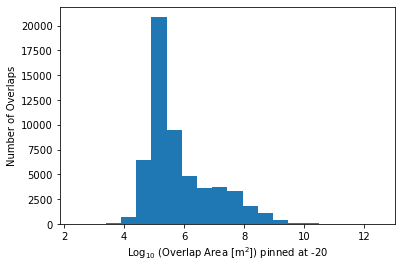

In [27]:
plt.hist(np.log10(gdf_joined['Overlap Area']+1e-20),bins=20)
plt.xlabel('Log$_{10}$ (Overlap Area [m$^2$]) pinned at -20')
plt.ylabel('Number of Overlaps');

And look at the number of coordinates involved in these calculations:

In [28]:
print('Total Coordinate Counts DA/FSA/All')
cc_DA_Db = sum(gdf_CA_DA_Db.geometry.apply(countCoordinates))
cc_FSA_Db = sum(gdf_CA_FSA_Db.geometry.apply(countCoordinates))
cc_all_Db = cc_DA_Db + cc_FSA_Db
print('Digital:', cc_DA_Db, cc_FSA_Db, cc_all_Db)
cc_DAb = sum(gdf_CA_DAb.geometry.apply(countCoordinates))
cc_FSAb = sum(gdf_CA_FSAb.geometry.apply(countCoordinates))
cc_allb = cc_DAb + cc_FSAb
print('Cartographic:', cc_DAb, cc_FSAb, cc_allb)
print('Ration C/D:', cc_DAb/cc_DA_Db, cc_FSAb/cc_FSA_Db, cc_allb/cc_all_Db)

Total Coordinate Counts DA/FSA/All
Digital: 8754768 1739384 10494152
Cartographic: 11672125 4912617 16584742
Ration C/D: 1.33323064643175 2.8243429857926716 1.580379434183915


And also look at the largest geometries:

In [29]:
print('Largest Geometry Coordinate Counts DA/FSA/All')
cc_DA_Db = max(gdf_CA_DA_Db.geometry.apply(countCoordinates))
cc_FSA_Db = max(gdf_CA_FSA_Db.geometry.apply(countCoordinates))
cc_all_Db = cc_DA_Db + cc_FSA_Db
print('Digital:', cc_DA_Db, cc_FSA_Db, cc_all_Db)
cc_DAb = max(gdf_CA_DAb.geometry.apply(countCoordinates))
cc_FSAb = max(gdf_CA_FSAb.geometry.apply(countCoordinates))
cc_allb = cc_DAb + cc_FSAb
print('Cartographic:', cc_DAb, cc_FSAb, cc_allb)
print('Ration C/D:', cc_DAb/cc_DA_Db, cc_FSAb/cc_FSA_Db, cc_allb/cc_all_Db)

Largest Geometry Coordinate Counts DA/FSA/All
Digital: 17772 47885 65657
Cartographic: 811264 1138221 1949485
Ration C/D: 45.64843574161603 23.769886185653128 29.691959730112554


### Summary

Geometries | sjoin time | intersection time | area time | TOTAL| Total Geometry Coordinate Count (DA, FSA, Sum) | Max Geometry Coordinate Count (DA, FSA, Sum) 
---|---|---|---|---|---|---
Digital buffered| 3.82 s | 3min 46s | 25 s | 5min 1s| (8754768, 1739384, 10494152) | (17772, 47885, 65657)
Cartographic buffered| 4min 11s | 13h 42min 56s | 29.2s | 13h 47min 36s | (11672125, 4912617, 16584742) | (811264, 1138221, 1949485)
Cartographic/Digital| 65.7 | 218 | ~1 | 165| (1.3, 2.8, 1.6) | (46, 24, 30)

The coordinate counts of the largest geometries seem closely related to the computation time, consistent with prior profiling (e.g. runs 4 and 5 of the "Evaluation of New Overlap Function" section)

This code is functioning under the following conditions:

geopandas.show_versions()

    SYSTEM INFO
    -----------
    python     : 3.7.8 | packaged by conda-forge | (default, Nov 27 2020, 18:48:03) [MSC v.1916 64 bit (AMD64)]
    executable : C:\Users\Arkadiatri\anaconda3\envs\Coursera\python.exe
    machine    : Windows-10-10.0.19041-SP0

    GEOS, GDAL, PROJ INFO
    ---------------------
    GEOS       : None
    GEOS lib   : None
    GDAL       : 3.1.4
    GDAL data dir: None
    PROJ       : 7.1.1
    PROJ data dir: C:\Users\Arkadiatri\anaconda3\envs\Coursera\Library\share\proj

    PYTHON DEPENDENCIES
    -------------------
    geopandas  : 0.9.0
    pandas     : 1.2.4
    fiona      : 1.8.18
    numpy      : 1.20.2
    shapely    : 1.7.1
    rtree      : 0.9.7
    pyproj     : 2.6.1.post1
    matplotlib : 3.3.3
    mapclassify: None
    geopy      : 2.0.0
    psycopg2   : None
    geoalchemy2: None
    pyarrow    : None
    pygeos     : None

# Intersection Splitting for Large Geometries

Clearly, the biggest driver of execution time is the intersection calculation.  The most likely driver for this is the geometry vertex count (though geometry component vertex count may also be a factor, the more general total vertex count will be simpler to address, and should produce similar results with less overhead).  We load up some data from the cartographic 'final' version and look at the longest intersections for which the main driver is the intersection function (which is the same between both functions).

In [1095]:
gdf1b = gdf_CA_FSAb
gdf2b = gdf_CA_DAb
l1 = np.array([countCoordinates(g) for g in gdf1b.geometry])
l2 = np.array([countCoordinates(g) for g in gdf2b.geometry])
g, t, a = loadResults(DIR_RESULTS+'GDF_FSA-DA_M2AREA')

In [1096]:
l1sub = np.array([countCoordinates(g) if g.type=='Polygon' else max([countCoordinates(gg) for gg in g]) for g in gdf1b.geometry])
l2sub = np.array([countCoordinates(g) if g.type=='Polygon' else max([countCoordinates(gg) for gg in g]) for g in gdf2b.geometry])

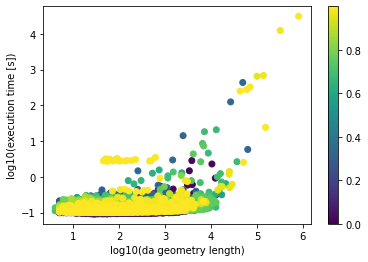

In [1100]:
inds = range(0,len(t))
cmap = np.array(list(inds))/len(np.array(t)[inds])
plt.scatter(np.log10(l2[inds]),np.log10(np.array(t)[inds]),c=cmap)
plt.xlabel('log10(da geometry length)')
plt.ylabel('log10(execution time [s])');
plt.colorbar();

The linear increase with a coefficient of 2 above 10k geometry length means that time increases as the square of the geometry length.

Thought - run this with reversed geometries - does it end up being any faster?

We can also look at combined geometry length as the ordinate:

In [32]:
fsa_ind = [gdf1b.index[gdf1b['CFSAUID']==d].values[0] for d in g['CFSAUID']]

In [33]:
lsum = l2+l1[fsa_ind]

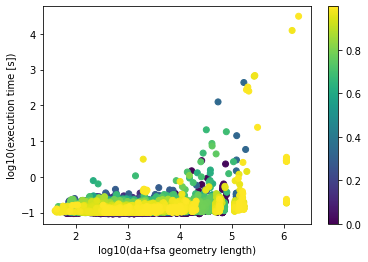

In [1102]:
inds = range(0,len(t))
cmap = np.array(list(inds))/len(np.array(t)[inds])
plt.scatter(np.log10(lsum[inds]),np.log10(np.array(t)[inds]),c=cmap)
plt.xlabel('log10(da+fsa geometry length)')
plt.ylabel('log10(execution time [s])')
plt.colorbar();

We can also look at the larger of the two geometry lengths as the ordinate:

In [35]:
lmax = np.maximum(l2,l1[fsa_ind])

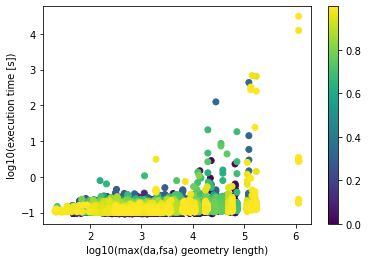

In [1104]:
inds = range(0,len(t))
cmap = np.array(list(inds))/len(np.array(t)[inds])
plt.scatter(np.log10(lmax[inds]),np.log10(np.array(t)[inds]),c=cmap)
plt.xlabel('log10(max(da,fsa) geometry length)')
plt.ylabel('log10(execution time [s])')
plt.colorbar();

We can also look at the combined sub-geometry length:

In [1108]:
lsumsub = l2sub + l1sub[fsa_ind]

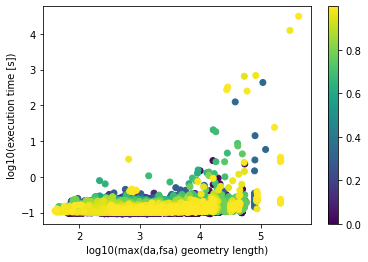

In [1109]:
inds = range(0,len(t))
cmap = np.array(list(inds))/len(np.array(t)[inds])
plt.scatter(np.log10(lsumsub[inds]),np.log10(np.array(t)[inds]),c=cmap)
plt.xlabel('log10(da+fsa sub-geometry length)')
plt.ylabel('log10(execution time [s])')
plt.colorbar();

We can also look at the maximum sub-geometry length:

In [1105]:
lmaxsub = np.maximum(l2sub,l1sub[fsa_ind])

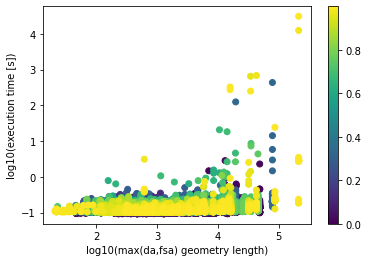

In [1106]:
inds = range(0,len(t))
cmap = np.array(list(inds))/len(np.array(t)[inds])
plt.scatter(np.log10(lmaxsub[inds]),np.log10(np.array(t)[inds]),c=cmap)
plt.xlabel('log10(max(da,fsa) geometry length)')
plt.ylabel('log10(execution time [s])')
plt.colorbar();

None of these approaches consolidates the trend as much as desired, though detailed analysis of the geometries might improve this.  However, we do note that in the initial plot there is a threshold at 10,000 points beyond which the time increases linearly with the geometry length, and that in the latter plots this threshold becomes more pronounced - almost no overlap calculation times above 1 second are observed below the threshold; the upper branch of times is due to larger FSA geometries that are shifted right when plotting with the combined length ordinates.

We can find how many geometries there are above this geometry length threshold:

In [37]:
threshold = 10000
sum(1 for l in l1 if l>=threshold), sum(1 for l in l2 if l>=threshold)

(69, 39)

(FSA, DA) count above threshold:

    10k (69, 39)
    20k (34, 18)
    40k (15, 11)

So not many geometries are of a size to greatly increase the computation time.

We can look at a description of the geometries involved in the longest overlap times:

In [38]:
display_length = 16
tind = np.argsort(np.array(t))[-1:-display_length:-1]
a_arr = normalizeAreas(a,threshold=1e-36)
t_arr = np.array(t)
for i, it in enumerate(tind):
    arrind = np.array([x[0] for x in np.argwhere(a_arr[it])])
    sortind = np.argsort(a_arr[it][arrind])[::-1]
    print(f'Long intersection index {i}: {t_arr[it]:,.0f} seconds')
    print(f'DA index {it} with coordinate count {countCoordinates(gdf2b.geometry[it]):,}')
    print(f'FSA indices {arrind[sortind].tolist()}')
    area_ratio_string = ["{0:#.3g}".format(a_arr[it][arrind[sortind]][s]) for s in range(len(sortind))]
    print(f'FSA area ratio [{", ".join(area_ratio_string)}]')
    fsa_ccount_string = ["{0:,d}".format([countCoordinates(g) for g in gdf1b.geometry[arrind[sortind]]][s]) for s in range(len(sortind))]
    print(f'FSA coordinate counts [{"  ".join(fsa_ccount_string)}]')
    print()

Long intersection index 0: 31,148 seconds
DA index 56531 with coordinate count 811,264
FSA indices [809, 811, 31, 483, 812]
FSA area ratio [1.00, 1.59e-13, 5.62e-15, 4.00e-15, 2.50e-16]
FSA coordinate counts [1,138,221  161,237  21,856  122,824  142,002]

Long intersection index 1: 12,463 seconds
DA index 55491 with coordinate count 323,296
FSA indices [809, 812, 811, 810]
FSA area ratio [1.00, 1.14e-12, 9.78e-13, 8.29e-14]
FSA coordinate counts [1,138,221  142,002  161,237  1,924]

Long intersection index 2: 685 seconds
DA index 55475 with coordinate count 138,261
FSA indices [812, 809, 815, 816]
FSA area ratio [1.00, 3.84e-13, 1.32e-13, 1.14e-13]
FSA coordinate counts [142,002  1,138,221  3,556  6,451]

Long intersection index 3: 652 seconds
DA index 54272 with coordinate count 100,893
FSA indices [1484, 1485, 1478, 1481, 1456, 1480]
FSA area ratio [1.00, 3.25e-13, 1.21e-13, 1.11e-13, 1.04e-13, 2.94e-14]
FSA coordinate counts [171,154  133,585  8,658  114,068  17,613  57,777]

Long i

We can look at the largest geometries in each dataset that we work with:

In [39]:
testset = ((gdf_CA_FSA_D, 'Digital FSA'),
           (gdf_CA_FSA_Db, 'Digital FSA buffered'),
           (gdf_CA_DA_D, 'Digital DA'),
           (gdf_CA_DA_Db, 'Digital DA buffered'),
           (gdf_CA_FSA, 'Cartographic FSA'),
           (gdf_CA_FSAb, 'Cartographic FSA buffered'),
           (gdf_CA_DA, 'Cartographic DA'),
           (gdf_CA_DAb, 'Cartographic DA buffered'))
displayhighest = 5

resultset = [] # At each index: # polygons in Polygon or MultiPolygon
for gdf_test, displayname in testset:
    print(f"Testing for {displayname}:")
    test_geomtype = [geom.type for geom in gdf_test['Geometry']]
    print(f"All geometries are Polygons or MultiPolygons: {all([t=='Polygon' or t=='MultiPolygon' for t in test_geomtype])}")
    print(f"Geometry types: {set(test_geomtype)}")
    print(f"Number of Polygons: {sum(1 for t in test_geomtype if t=='Polygon')}")
    print(f"Number of MultiPolygons: {sum(1 for t in test_geomtype if t=='MultiPolygon')}")
    test_multigeomtype = [[g.type for g in geom] for geom in gdf_test['Geometry'] if geom.type=='MultiPolygon']
    print(f"All MultiPolygons contain only Polygons: {all([all([g=='Polygon' for g in typelist]) for typelist in test_multigeomtype])}")
    ret = []
    for geom in gdf_test['Geometry']:
        if geom.type=='Polygon':
            geom = [geom]
        polys = list(geom)
        npoly = len(polys)
        extcoordcounts = [len(poly.exterior.coords) for poly in polys] # There is only one continuous exterior
        intcoordcounts = [[len(i.coords) for i in poly.interiors] for poly in polys]
        sumcoordcounts = np.array(extcoordcounts) + np.array([sum(i) if not i is [] else 0 for i in intcoordcounts])
        maxsumcoordcounts = max(sumcoordcounts)
        sumsumcoordcounts = sum(sumcoordcounts)
        ret.append((npoly, maxsumcoordcounts, sumsumcoordcounts, sumcoordcounts, extcoordcounts, intcoordcounts))
    resultset.append(ret)
    print(f"Total polygons comprising all geometries: {sum([r[0] for r in ret])}")
    maxpolyind = np.argsort([r[0] for r in ret])[-displayhighest:]
    print(f"Highest polygon counts: polygon counts {[x[0] for x in np.array(ret)[maxpolyind]]}, vertex counts {[x[2] for x in np.array(ret)[maxpolyind]]} at indices {maxpolyind}")
    maxvertind = np.argsort([r[2] for r in ret])[-displayhighest:]
    print(f"Highest vertex counts: polygon counts {[x[0] for x in np.array(ret)[maxvertind]]}, vertex counts {[x[2] for x in np.array(ret)[maxvertind]]} at indices {maxvertind}")
    print()

# resultset has each dataset as a row, with enties being a list for all geometries in the dataset of npoly, largest poly coord count, total coords
# resultset = [ret for each geometry (row)]
# ret = [(npoly <scalar, number of Polygons in the geometry>,
#         maxsumcoordcounts <scalar, number of vertices in the largest Polygon in the geometry>,
#         sumsumcoordcounts <scalar, number of vertices total in the geometry>,
#         sumcoordcounts <list, total vertices in each Polygon of the geometry (sum of extcoordcounts and all intcoordcounts)>,
#         extcoordcounts <list, number of vertices in the exterior of each Polygon in the geometry>,
#         intcoordcounts <list of lists, number of vertices in each interior polygon of each Polygon in the geometry>)]

Testing for Digital FSA:
All geometries are Polygons or MultiPolygons: True
Geometry types: {'Polygon', 'MultiPolygon'}
Number of Polygons: 1377
Number of MultiPolygons: 243
All MultiPolygons contain only Polygons: True
Total polygons comprising all geometries: 2103
Highest polygon counts: polygon counts [9, 10, 10, 13, 17], vertex counts [28087, 47885, 1105, 19264, 4130] at indices [1196 1199  916 1204 1277]
Highest vertex counts: polygon counts [4, 9, 4, 4, 10], vertex counts [26697, 28087, 35261, 46183, 47885] at indices [1201 1196 1200 1202 1199]

Testing for Digital FSA buffered:
All geometries are Polygons or MultiPolygons: True
Geometry types: {'Polygon', 'MultiPolygon'}
Number of Polygons: 1377
Number of MultiPolygons: 243
All MultiPolygons contain only Polygons: True
Total polygons comprising all geometries: 2103
Highest polygon counts: polygon counts [9, 10, 10, 13, 17], vertex counts [28087, 47885, 1105, 19264, 4130] at indices [1196 1199  916 1204 1277]
Highest vertex count

Note that the largest vertex count geometries of DAs or FSAs (or both) are involved in the most time-consuming overlaps, and that overlap times are tractable (10s of seconds) once the geometries involved are primarily 10k-20k coordinates in size.

For drilling down into individual geometry details something like the following code may be used (though this will not be pursued further):

In [40]:
testind = tind[3]
print(f"DA index {testind}")
geom = gdf2b.iloc[testind]['Geometry']
display(geom)
print(f"Geometry type: {geom.type}")
if geom.type=='Polygon': # Assume all types are Polygon or MultiPolygon, this is verified in subsequent cells
    geom = [geom]
elif geom.type=='MultiPolygon':
    print(f"All elements of MultiPolygon are Polygon: {all(g.type=='Polygon' for g in geom)}")
else:
    print(f"Unexpected geometry type: {geom.type}")
polys = list(geom)
npoly = len(polys)
print(f"{npoly} polygons")
extcoordcounts = [len(poly.exterior.coords) for poly in polys] # There is only one continuous exterior
intcoordcounts = [[len(i.coords) for i in poly.interiors] for poly in polys]
sumcoordcounts = np.array(extcoordcounts) + np.array([sum(i) if not i is [] else 0 for i in intcoordcounts])
maxsumcoordcounts = max(sumcoordcounts)
print(f"{maxsumcoordcounts} coordinates in largest polygon")
sumsumcoordcounts = sum(sumcoordcounts)
print(f"{sumsumcoordcounts} coordinates total")

DA index 54272


Geometry type: MultiPolygon
All elements of MultiPolygon are Polygon: True
470 polygons
19215 coordinates in largest polygon
100893 coordinates total


And finally, we can look at the computation time for an example DA with all relevant and all major FSAs.  For this example we'll use the 9th longest time overlap as found above:

    Long intersection index 9: 24 seconds
    DA index 56540 with coordinate count 154,433
    FSA indices [811, 1059, 812, 809, 1287]
    FSA area ratio [1.00, 7.45e-13, 2.42e-13, 3.95e-16, 1.05e-26]
    FSA coordinate counts [161,237  9,130  142,002  1,138,221  26,697]

In [41]:
testda = 56540 # 9
fsas = [811, 1059, 812, 809, 1287]
gdf1b = gdf_CA_FSAb
gdf2b = gdf_CA_DAb
ts = {}
start_time = time.time()
intergeom = gdf1b['Geometry'].intersection(gdf2b['Geometry'][testda])
ts['all'] = time.time()-start_time
for fsa in fsas:
    start_time = time.time()
    intergeom = gdf1b['Geometry'][fsa].intersection(gdf2b['Geometry'][testda])
    ts[fsa] = time.time()-start_time
ts

{'all': 40.69982671737671,
 811: 17.608171463012695,
 1059: 0.17085528373718262,
 812: 0.23460745811462402,
 809: 7.239597797393799,
 1287: 0.1144108772277832}

Note that the longest overlap is for FSA index 811 (the principal overlap) and not 809 (the largest geometry).  Also, these nonzero area overlaps comprise 43% of the total computation time (the significant overlaps only 30%), showing that there is significant gain in using the spatial indexing approach that allows us to calculate only the significant overlaps.

We can now attempt to reduce the computation time by focusing on a more efficient intersection of large geometries.  This will essentially involve applying the overlap logic of intersectGDF to each pair of large geometries after they have been split into collections of smaller geometries.  This splitting is accomplished by recursively cutting each geometry in half until the coordinate count is below a threshold (~10k as determined above).  Some [existing code](https://snorfalorpagus.net/blog/2016/03/13/splitting-large-polygons-for-faster-intersections) was found that does this, and adapted to the purposes here.

In [35]:
def katana(geometry, threshold, count=0):
    """Recursively split a geometry until the size of each component is below a threshold
    
    Parameters
    ----------
    geometry: shapely Polygon or MultiPolygon
    threshold: int>3, maximum number of coordinates in each returned geometry
    count: int>=0, internal variable tracking the recursion depth
    
    Returns
    -------
    list of shapely Polygons, the union of which comprises the input geometry, with each Polygon having at most threshold coordinates
    
    Notes
    -----
    Unsure if shapely.geometry.GeometryCollection will be handled properly
    Depends on shapely
    Recursion limit hard-coded to 250 (could be made dynamic with sys.getrecursionlimit()-3)
    Originally from # https://snorfalorpagus.net/blog/2016/03/13/splitting-large-polygons-for-faster-intersections/
    """
    '''
    The following code is released under the BSD 2-clause license:

    Copyright (c) 2016, Joshua Arnott
    Modifications Copyright (c) 2021, Daniel Nezich

    All rights reserved.

    Redistribution and use in source and binary forms, with or without modification, are permitted provided that the following conditions are met:

        Redistributions of source code must retain the above copyright notice, this list of conditions and the following disclaimer.
        Redistributions in binary form must reproduce the above copyright notice, this list of conditions and the following disclaimer in the documentation and/or other materials provided with the distribution.

    THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS “AS IS” AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE ARE DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER OR CONTRIBUTORS BE LIABLE FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY OUT OF THE USE OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.
    '''
    bounds = geometry.bounds
    width = bounds[2] - bounds[0]
    height = bounds[3] - bounds[1]
    ncoords = countCoordinates(geometry) # added DN 2021-05-12
    # if max(width, height) <= threshold or count == 250: # removed DN 2021-05-12
    if ncoords <= threshold or count == 250: # added DN 2021-05-12, can find the recursion limit and subtract 3 for equating with count with e.g.: import sys / print(sys.getrecursionlimit())
        # either the polygon is smaller than the threshold, or the maximum
        # number of recursions has been reached
        return [geometry] if isinstance(geometry, shapely.geometry.Polygon) else list(geometry)
    if height >= width:
        # split left to right
        a = shapely.geometry.box(bounds[0], bounds[1], bounds[2], bounds[1]+height/2)
        b = shapely.geometry.box(bounds[0], bounds[1]+height/2, bounds[2], bounds[3])
    else:
        # split top to bottom
        a = shapely.geometry.box(bounds[0], bounds[1], bounds[0]+width/2, bounds[3])
        b = shapely.geometry.box(bounds[0]+width/2, bounds[1], bounds[2], bounds[3])
    result = []
    for d in (a, b,):
        c = geometry.intersection(d)
        if not isinstance(c, shapely.geometry.GeometryCollection):
            c = [c]
        for e in c:
            if isinstance(e, (shapely.geometry.Polygon, shapely.geometry.MultiPolygon)):
                result.extend(katana(e, threshold, count+1))
    if count > 0:
        return result
    # convert multipart into singlepart
    final_result = [] # this will be a list of polygons
    for g in result:
        if isinstance(g, shapely.geometry.MultiPolygon):
            final_result.extend(g)
        else:
            final_result.append(g)
    return final_result

This new function can be tested on an example geometry to see the tradeoff in vertex threshold, polygon count, and computation time:

In [43]:
x = gdf_CA_DAb['Geometry'][56540] # 9
thresholds = [1000000,100000,10000,1000,100]
test_time = []
test_polycount = []
test_multipolygon = []
for threshold in thresholds:
    start_time = time.time()
    y = katana(x,threshold)
    end_time = time.time()
    print(f'{threshold: >8}', f'{end_time-start_time: >8.3f} s', '  Input: ', x.type, len(x) if x.type=='MultiPolygon' else 1, 'elements,  Output: ', len(y[0]) if type(y[0])==shapely.geometry.multipolygon.MultiPolygon else len(y),'MultiPolygon' if type(y[0])==shapely.geometry.multipolygon.MultiPolygon else 'Polygons')
    test_time.append(end_time-start_time)
    test_polycount.append((len(y[0]) if y[0].type=='MultiPolygon' else len(y)))
    test_multipolygon.append(y)

 1000000    0.049 s   Input:  MultiPolygon 1887 elements,  Output:  1887 MultiPolygon
  100000    0.763 s   Input:  MultiPolygon 1887 elements,  Output:  1909 Polygons
   10000    2.610 s   Input:  MultiPolygon 1887 elements,  Output:  2023 Polygons
    1000    4.302 s   Input:  MultiPolygon 1887 elements,  Output:  2877 Polygons
     100    7.747 s   Input:  MultiPolygon 1887 elements,  Output:  8086 Polygons


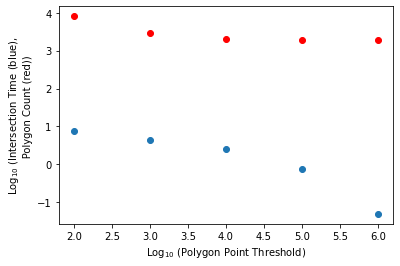

In [44]:
plt.scatter(np.log10(thresholds),np.log10(test_time))
plt.scatter(np.log10(thresholds),np.log10(test_polycount),color='red')
plt.xlabel('Log$_{10}$ (Polygon Point Threshold)')
plt.ylabel('Log$_{10}$ (Intersection Time (blue),\n      Polygon Count (red))');

In [45]:
test_multipolygon[0][0]

In [46]:
shapely.geometry.MultiPolygon(test_multipolygon[2])

Clearly we don't want to split the geometries too much, but at least this confirms our function is working.  Also note that that red fill indicates that the geometry is invalid (here because components share more than one point (i.e. they share line boundaries).  We will work around this by treating each polygon as an independent geometry (essentially a recursion of the FSA-DA intersection).

In [47]:
def intersectionByCut(geom1, geom2, vertex_limit=10000):
    '''Fast intersection of two geometries using cutting and spatial indexing.
    
    Recursibely cuts each input geometry until resulting geometries have less
    than vertex_limit vertices, performs a spatial join to find overlaps, and
    reassembles the full overlap by unary union.  Useful when the number of
    vertices in a geometry is very large (e.g. > 100k) and performance
    degradation occurs with the standard shapely intersection.
    
    Parameters
    ----------
    geom1: shapely Polygon or MultiPolygon
    geom2: shapely Polygon or MultiPolygon
    vertex_limit: int>3, maximum vertex count per polygon
    
    Returns
    -------
    shapely Polygon or Multipolygon of the overlap of geom1 and geom2
    
    TODO:
    optimize vertex_limit
    '''
    geom1cut = katana(geom1,vertex_limit)
    geom2cut = katana(geom2,vertex_limit)
    geom1cutseries = geopandas.GeoSeries(geom1cut)
    geom2cutseries = geopandas.GeoSeries(geom2cut)
    geom2_overlap_indices = [geom2cutseries.sindex.query(d, predicate='intersects') for d in geom1cutseries] # same time as query_bulk
    geomOverlap = [geom2cutseries.iloc[g].intersection(d) for g, d in zip(geom2_overlap_indices, geom1cutseries)]
    geomUnions = [shapely.ops.unary_union(a) for a in geomOverlap]
    return shapely.ops.unary_union(geomUnions)

Now we'll re-run our test from before:

In [48]:
testda = 56540 # 9
fsas = [811, 1059, 812, 809, 1287]
gdf1b = gdf_CA_FSAb
gdf2b = gdf_CA_DAb
ts = {}
start_time = time.time()
#intergeom = intersectionByCut(gdf1b['Geometry'],gdf2b['Geometry'][testda])
for fsa in fsas:
    start_time = time.time()
    intergeom = intersectionByCut(gdf1b['Geometry'][fsa],gdf2b['Geometry'][testda])
    ts[fsa] = time.time()-start_time
ts

{811: 16.892618656158447,
 1059: 3.442256212234497,
 812: 6.0636374950408936,
 809: 37.914897441864014,
 1287: 3.228952646255493}

This is a moderate improvement for the significant overlap (FSA 811, 21.3 sec to 16.0 sec), but not for the empty overlaps (e.g. FSA 809, 6.8 sec to 34.9 sec).

Reversing the order has negligible effect:

In [49]:
testda = 56540 # 9
fsas = [811, 1059, 812, 809, 1287]
gdf1b = gdf_CA_FSAb
gdf2b = gdf_CA_DAb
ts = {}
start_time = time.time()
#intergeom = intersectionByCut(gdf1b['Geometry'],gdf2b['Geometry'][testda])
for fsa in fsas:
    start_time = time.time()
    intergeom = intersectionByCut(gdf2b['Geometry'][testda],gdf1b['Geometry'][fsa])
    ts[fsa] = time.time()-start_time
ts

{811: 16.87311577796936,
 1059: 4.735072612762451,
 812: 5.876649618148804,
 809: 34.01455497741699,
 1287: 4.38066291809082}

That has no significant effect.

Note that we could also do this using GeoDataFrames and a spatial join:

In [57]:
def intersectionByCutGDF(geom1, geom2, vertex_limit=10000):
    '''Fast intersection of two geometries using cutting and spatial indexing.
    
    Recursibely cuts each input geometry until resulting geometries have less
    than vertex_limit vertices, performs a spatial join to find overlaps, and
    reassembles the full overlap by unary union.  Useful when the number of
    vertices in a geometry is very large (e.g. > 100k) and performance
    degradation occurs with the standard shapely intersection.
    
    Parameters
    ----------
    geom1: shapely Polygon or MultiPolygon
    geom2: shapely Polygon or MultiPolygon
    vertex_limit: int>3, maximum vertex count per polygon
    
    Returns
    -------
    shapely Polygon or Multipolygon of the overlap of geom1 and geom2
    
    TODO:
    optimize vertex_limit
    '''
    geom1cut = katana(geom1,vertex_limit)
    geom2cut = katana(geom2,vertex_limit)
    geom1cutgdf = geopandas.GeoDataFrame(geometry=geom1cut)
    geom2cutgdf = geopandas.GeoDataFrame(geometry=geom2cut)
    gdf_joined = geopandas.tools.sjoin(geom1cutgdf,geom2cutgdf,how='inner')
    gdf_joined['index_left'] = gdf_joined.index
    gdf_joined = gdf_joined.loc[:,['index_left','index_right']].reset_index(drop=True)
    gdf_joined['Overlap Geometry'] = geom1cutgdf.geometry.iloc[gdf_joined['index_left']].intersection(geom2cutgdf.geometry.iloc[gdf_joined['index_right']],align=False).values
    gdf_joined.set_geometry('Overlap Geometry',inplace=True)
    return shapely.ops.unary_union(gdf_joined.geometry)

And we can evaluate this approach in terms of runtime:

In [60]:
x = gdf_CA_DAb['Geometry'][56540]
y = gdf_CA_FSAb['Geometry'][811]
tim = time.time()
intersectionByCut(y, x, vertex_limit=10000)
print(f'Rtree intersection (GeoSeries):    {time.time()-tim:>8}')
tim = time.time()
intersectionByCutGDF(y, x, vertex_limit=10000)
print(f'Rtree intersection (GeoDataFrame):    {time.time()-tim:>8}')

Rtree intersection (GeoDataFrame):    13.775632858276367
Rtree intersection (GeoSeries):    14.676835775375366


The GeoDataFrame version is slightly faster, but they are roughly equivalent.

The improvement is expected to be larger for larger geometries.  Let's look at a longer execution time example:

    Long intersection index 1: 12,463 seconds
    DA index 55491 with coordinate count 323,296
    FSA indices [809, 812, 811, 810]
    FSA area ratio [1.00, 1.14e-12, 9.78e-13, 8.29e-14]
    FSA coordinate counts [1,138,221  142,002  161,237  1,924]

In [61]:
%%time
testda = 55491 # 1, 12463 seconds
fsas = [809, 812, 811, 810]
gdf1b = gdf_CA_FSAb
gdf2b = gdf_CA_DAb
ts = {}
ts2 = {}
start_time = time.time()
#intergeom = intersectionByCut(gdf1b['Geometry'],gdf2b['Geometry'][testda])
for fsa in fsas:
    start_time = time.time()
    intergeom = intersectionByCut(gdf1b['Geometry'][fsa],gdf2b['Geometry'][testda])
    ts[fsa] = time.time()-start_time
    start_time = time.time()
    intergeom = intersectionByCutGDF(gdf1b['Geometry'][fsa],gdf2b['Geometry'][testda])
    ts2[fsa] = time.time()-start_time
print('intersectionByCut:', ts, 'intersectionByCutGDF:', ts2)

Wall time: 2min 39s


({809: 56.9878249168396,
  812: 8.59435248374939,
  811: 11.56014347076416,
  810: 6.0964272022247314},
 {809: 52.8153235912323,
  812: 7.5390379428863525,
  811: 9.735162019729614,
  810: 6.061779499053955})

Again the GDF version comes out ahead, but the difference is small.  

Overall, the wall time of 90 seconds compares favorably to the wall time of 12463 seconds for the geopandas intersection method (138x speedup).

The real improvement in geometry cutting is protecting against the massive slowdown with intersecting large geometries.  This is a useful result, though we do note that there is room for optimizing the vertex_limit value (though this optimization will be somewhat dataset-dependent.  Before we consider optimization, there are a few more items of interest.

First, some unexpected behavior was noticed while testing the intersection method - the order of arguments mattered a great deal for one example.  Because the geopandas, shapely, and numpy versions were upgraded in an attempt (successful) to get the sjoin/sindex functionality to work correctly, in light of the following result it was possible that the internals of the intersection function were reworked to be more efficient:

In [1120]:
%%time
x = gdf_CA_FSAb.loc[1485,'Geometry']
y = gdf_CA_DAb.loc[56154,'Geometry']
print('Polygon count x y: ', len(x) if x.type=='MultiPolygon' else 1, len(y) if y.type=='MultiPolygon' else 1)
print('Coordinate count:  ', countCoordinates(x), countCoordinates(y))
ret_yx = y.intersection(x)

Polygon count x y:  600 298
Coordinate count:   133585 71289
Wall time: 2.26 s


In [1115]:
%%time
ret_xy = x.intersection(y)

Wall time: 5min 47s


Here the order of geometries makes a big difference!  Investigating why, look at if the results are the same:

In [1116]:
ret_yx==ret_xy

False

This inequivalence is likely due to the differing reconstructions of the results, and is likely not material.  We should look at the similarity of the geometries:

Overlap geometry area:  2.5109035384711036
Area difference yx-xy: -3.3731684112581206e-11
Symmetric difference geometry area: 1.905794312301928e-13


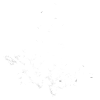

In [1119]:
ret_diff = ret_yx.symmetric_difference(ret_xy)
print('Overlap geometry area: ', ret_xy.area)
print('Area difference yx-xy:', ret_yx.area-ret_xy.area)
print('Symmetric difference geometry area:',ret_diff.area)
ret_diff

Attempting to understand the origin of this difference, let's recall the geometry sizes:

    Long intersection index 5: 326 seconds
    DA index 56154 with coordinate count 71,289
    FSA indices [1485, 1484, 1433, 1432, 1456]
    FSA area ratio [1.00, 8.82e-13, 5.90e-13, 5.54e-13, 1.69e-13]
    FSA coordinate counts [133,585  171,154  675  1,217  17,613]

The geometry counts are not very different, with the FSA being much larger.  Let's look at polygon count:

In [82]:
'Polygon count: ', len(x), len(y)

('Polygon count: ', 600, 298)

Again, these area not very different.  For comparison, here are the new intersectionByCut times:

In [62]:
testda = 56154 # 5, 326 seconds
fsas = [1485, 1484, 1433, 1432, 1456]
gdf1b = gdf_CA_FSAb
gdf2b = gdf_CA_DAb
ts = {}
start_time = time.time()
#intergeom = intersectionByCut(gdf1b['Geometry'],gdf2b['Geometry'][testda])
for fsa in fsas:
    start_time = time.time()
    intergeom = intersectionByCut(gdf1b['Geometry'][fsa],gdf2b['Geometry'][testda],100000)
    ts[fsa] = time.time()-start_time
ts

{1485: 12.411127090454102,
 1484: 2.147447109222412,
 1433: 0.048795461654663086,
 1432: 0.04311680793762207,
 1456: 0.16398143768310547}

The main intersectionByCut time is between the two intersection times, but definitely on the shorter side.  We should examine several geometry pairs to see if this is systematic.

Before we perform this systematic examination, there are a few other approaches to intersection calculation that are worth bringing in to the comparison.

First, there is the spatial join function available in geopandas, which uses a recursive tree of bounds of nearby geometry elements to speed up finding of overlaps.  Using this function with the arrays of Polygons that make up each of our input geometries as inputs, we can quickly find which sub-components possibly overlap and compute a limited number of intersections on these smaller Polygons:

In [29]:
def intersectionBySjoin(geom1, geom2):
    '''Fast intersection of two geometries using spatial indexing.
    
    Expands each input geometry to an array of polygons, performs a
    spatial join to find potential overlaps between these polygons, finds
    the actual intersections between these polygons, and reassembles the full
    overlap by unary union.  Useful when the number of
    vertices in a geometry is very large (e.g. > 100k) but the number of
    vertices in each polygon comprising the geometry is moderate (e.g. <= 10k)
    and when performance degradation occurs with the standard shapely
    intersection.
    
    Parameters
    ----------
    geom1: shapely Polygon or MultiPolygon, or array of shapely Polygons
    geom2: shapely Polygon or MultiPolygon, or array of shapely Polygons
    
    Returns
    -------
    shapely Polygon or Multipolygon of the overlap of geom1 and geom2
    '''
    geom1arr = geom1 if type(geom1)==list else [geom1] if geom1.type=='Polygon' else list(geom1)
    geom2arr = geom2 if type(geom2)==list else [geom2] if geom2.type=='Polygon' else list(geom2)
    geom1gdf = geopandas.GeoDataFrame(geometry=geom1arr)
    geom2gdf = geopandas.GeoDataFrame(geometry=geom2arr)
    gdf_joined = geopandas.tools.sjoin(geom1gdf,geom2gdf,how='inner')
    gdf_joined['index_left'] = gdf_joined.index
    gdf_joined = gdf_joined.loc[:,['index_left','index_right']].reset_index(drop=True)
    gdf_joined['Overlap Geometry'] = geom1gdf.geometry.iloc[gdf_joined['index_left']].intersection(geom2gdf.geometry.iloc[gdf_joined['index_right']],align=False).values
    gdf_joined.set_geometry('Overlap Geometry',inplace=True)
    return shapely.ops.unary_union(gdf_joined.geometry)

A quick test shows that this sjoin function can execute in less time (1.4s) than the intersection (2.3s and 5min 47s) and the intersectionByCut (12s) functions:

In [1141]:
x = gdf_CA_FSAb.loc[1485,'Geometry']
y = gdf_CA_DAb.loc[56232,'Geometry']
print('Polygon count x y: ', len(x) if x.type=='MultiPolygon' else 1, len(y) if y.type=='MultiPolygon' else 1)
print('Coordinate count:  ', countCoordinates(x), countCoordinates(y))

Polygon count x y:  600 295
Coordinate count:   133585 59480


In [1145]:
%%time
ret_yx = intersectionBySjoin(y,x)

Wall time: 1.68 s


In [1146]:
%%time
ret_xy = intersectionBySjoin(x,y)

Wall time: 1.69 s


This intersection geometry again matches the expected overlap area (equal to the input DA area):

In [1148]:
print('Sjoin area yx: ', ret_yx.area)
print('Sjoin area xy: ', ret_xy.area)
print('DA area: ', y.area)
print('Symmetric difference area: ', y.symmetric_difference(ret_xy).area)

Sjoin area yx:  0.9394174133644443
Sjoin area xy:  0.9394174133644442
DA area:  0.9394174134095213
Symmetric difference area:  5.253479743696018e-13


Second, the sjoin and cutting methods can be combined.  In this approach, the polygon components of each input geometry are cut only if their number of vertices exceeds a limit (e.g. 10,000), and then the collections of limited-size geometries are used as input to the sjoin method.

In [1134]:
def intersectionBySjoinCut(geom1, geom2, vertex_limit=10000):
    '''Fast intersection of two geometries using cutting and spatial indexing.
    
    Split geometry into a list of Polygons, then recursively cut each
    Polygon until all Polygons have less than vertex_limit vertices.
    Performs a spatial join to find overlaps between all Polygons.
    Perform an intersection for each overlap, then reassemble the full overlap
    by unary union.  Useful when the number of
    vertices in a geometry is very large (e.g. > 100k) and performance
    degradation occurs with the standard shapely intersection.
    
    Parameters
    ----------
    geom1: shapely Polygon or MultiPolygon
    geom2: shapely Polygon or MultiPolygon
    vertex_limit: int>3, maximum vertex count per polygon
    
    Returns
    -------
    shapely Polygon or Multipolygon of the overlap of geom1 and geom2
    '''
    geom1arr = [geom1] if geom1.type=='Polygon' else list(geom1)
    geom2arr = [geom2] if geom2.type=='Polygon' else list(geom2)
    geom1gdf = geopandas.GeoDataFrame(geometry=geom1arr)
    geom2gdf = geopandas.GeoDataFrame(geometry=geom2arr)
    geom1gdf['DoCut'] = geom1gdf.geometry.apply(countCoordinates)
    geom2gdf['DoCut'] = geom2gdf.geometry.apply(countCoordinates)
    newgeoms1 = [katana(g,vertex_limit) for g in geom1gdf.loc[geom1gdf['DoCut']>vertex_limit,'geometry']]
    newgeoms2 = [katana(g,vertex_limit) for g in geom2gdf.loc[geom2gdf['DoCut']>vertex_limit,'geometry']]
    geom1gdf.drop(index=geom1gdf.loc[geom1gdf['DoCut']>vertex_limit].index,inplace=True)
    geom2gdf.drop(index=geom2gdf.loc[geom2gdf['DoCut']>vertex_limit].index,inplace=True)
    gg1 = []
    [gg1.extend(n) for n in newgeoms1]
    geom1gdf = geom1gdf.append(geopandas.GeoDataFrame(geometry=gg1,crs=geom1gdf.crs),ignore_index=True)
    gg2 = []
    [gg2.extend(n) for n in newgeoms2]
    geom2gdf = geom2gdf.append(geopandas.GeoDataFrame(geometry=gg2,crs=geom2gdf.crs),ignore_index=True)
    gdf_joined = geopandas.tools.sjoin(geom1gdf,geom2gdf,how='inner')
    gdf_joined['index_left'] = gdf_joined.index
    gdf_joined = gdf_joined.loc[:,['index_left','index_right']].reset_index(drop=True)
    gdf_joined['Overlap Geometry'] = geom1gdf.geometry.iloc[gdf_joined['index_left']].intersection(geom2gdf.geometry.iloc[gdf_joined['index_right']],align=False).values
    gdf_joined.set_geometry('Overlap Geometry',inplace=True)
    return shapely.ops.unary_union(gdf_joined.geometry)

In [1149]:
x = gdf_CA_FSAb.loc[1485,'Geometry']
y = gdf_CA_DAb.loc[56232,'Geometry']
print('Polygon count x y: ', len(x) if x.type=='MultiPolygon' else 1, len(y) if y.type=='MultiPolygon' else 1)
print('Coordinate count:  ', countCoordinates(x), countCoordinates(y))

Polygon count x y:  600 295
Coordinate count:   133585 59480


In [1150]:
%%time
ret_yx = intersectionBySjoinCut(y,x)

Wall time: 2.1 s


In [1151]:
%%time
ret_xy = intersectionBySjoinCut(x,y)

Wall time: 2.02 s


This intersection geometry again matches the expected overlap area (equal to the input DA area):

In [1152]:
print('SjoinCut area yx: ', ret_yx.area)
print('SjoinCut area xy: ', ret_xy.area)
print('DA area: ', y.area)
print('Symmetric difference area: ', y.symmetric_difference(ret_yx).area)

SjoinCut area yx:  0.9394174133644436
SjoinCut area xy:  0.9394174133644455
DA area:  0.9394174134095213
Symmetric difference area:  4.638415358426504e-11


We can now evaluate the above intersection functions against a number of different geometries (using vertex_limit=20,000 where appropriate):

In [396]:
def evaluateRuntimes(fsa,da,vertex_limit = 20000,omit_original=False):
    times = []
    x = gdf_CA_FSAb.loc[fsa,'Geometry']
    y = gdf_CA_DAb.loc[da,'Geometry']
    print(f'Evaluating runtimes for FSA {fsa} and DA {da}')
    print('Polygon count x y: ', len(x) if x.type=='MultiPolygon' else 1, len(y) if y.type=='MultiPolygon' else 1)
    print('Coordinate count:  ', countCoordinates(x), countCoordinates(y))
    print('Max poly coord count:  ', max([countCoordinates(i) for i in x] if x.type=='MultiPolygon' else countCoordinates(x)), max([countCoordinates(i) for i in y] if y.type=='MultiPolygon' else countCoordinates(y)))
    if not omit_original:
        start_time = time.time()
        ret_yx = y.intersection(x)
        duration = time.time()-start_time
        times.append(duration)
        print(f'y.intersection(x): {duration:.3}')
        start_time = time.time()
        ret_xy = x.intersection(y)
        duration = time.time()-start_time
        times.append(duration)
        print(f'x.intersection(y): {duration:.3}')
    start_time = time.time()
    ret_yx = intersectionByCut(y,x)
    duration = time.time()-start_time
    times.append(duration)
    print(f'y.intersectionByCut(x): {duration:.3f}')
    start_time = time.time()
    ret_xy = intersectionByCut(x,y)
    duration = time.time()-start_time
    times.append(duration)
    print(f'x.intersectionByCut(y): {duration:.3f}')
    start_time = time.time()
    ret_yx = intersectionBySjoin(y,x)
    duration = time.time()-start_time
    times.append(duration)
    print(f'y.intersectionBySjoin(x): {duration:.3f}')
    start_time = time.time()
    ret_xy = intersectionBySjoin(x,y)
    duration = time.time()-start_time
    times.append(duration)
    print(f'x.intersectionBySjoin(y): {duration:.3f}')
    start_time = time.time()
    ret_yx = intersectionBySjoinCut(y,x)
    duration = time.time()-start_time
    times.append(duration)
    print(f'y.intersectionBySjoinCut(x): {duration:.3f}')
    start_time = time.time()
    ret_xy = intersectionBySjoinCut(x,y)
    duration = time.time()-start_time
    times.append(duration)
    print(f'x.intersectionBySjoinCut(y): {duration:.3f}')
    return times

An example run is shown below, which can be run with different geometry pairs:

In [405]:
evaluateRuntimes(1485,56154,omit_original=True);

Evaluating runtimes for FSA 1485 and DA 56154
Polygon count x y:  600 298
Coordinate count:   133585 71289
Max poly coord count:   15958 12717
y.intersectionByCut(x): 5.510
x.intersectionByCut(y): 5.070
y.intersectionBySjoin(x): 6.152
x.intersectionBySjoin(y): 9.970
y.intersectionBySjoinCut(x): 2.818
x.intersectionBySjoinCut(y): 2.692


We can summarize the results of many runs of the above code:

Method | Order (y=DA, x=FSA) | (9) 56540-811 | (8) 19049-492 | (7) 56231-1484 | (6) 56232-1485 | (5) 56154-1485 | (2) 55475-812 | (2 null) 55475-809 | (1) 55491-809 | (0) 56531-809
---|---|---|---|---|---|---|---|---|---|---
Polygon Count |           | 1964 1887 | 303 303 | 690 139 | 600 295 | 600 298 | 923 918 | 13794 918 | 13794 4823 | 13794 8979
Vertex Count |            | 161237 154433 | 28051 26735 | 171154 43022 | 133585 59480 | 133585 71289 | 142002 138261 | 1138221 138261 | 1138221 323296 | 1138221 811264
Max Vertex Count |        | 87124 82746 | 19694 18384 | 34624 25212 | 15958 11596 | 15958 12717 | 43199 40124 | 213843 40124 | 213843 92065 | 213843 212072
intersection | y,x        | 13.9s | 0.59s | 4min 33s | 4min 26s | 2.08s | 4.89s | 1.44s | (12463s) | (31148s)
intersection | x,y        | 13.9s | 4min 42s | 0.56s | 4min 37s | 5min 47s | 10min 59s | 1.34s | (12463s) | (31848s)
intersectionByCut | y,x   | 15s | 1.53s | 6.07s | 3.77s | 5.31s | 6.4s | 27.4s | 63.5s | 107s
intersectionByCut | x,y   | 15.3s | 1.73s | 6.63s | 3.75s | 4.81s | 7.29s | 31.9s | 80.1s | 99.6s
intersectionBySjoin | y,x | 19.9s | 0.95s | 16.3s | 1.5s  | 5.46s | 41.1s | 3.3s | 86.6s | 24min 40s
intersectionBySjoin | x,y | 18.2s | 1.09s | 16.5s | 1.35s | 8.95s | 42.7s | 1.85s | 64.5s | 23min 10s
intersectionBySjoinCut | y,x | 9.83s | 1.14s | 3.19s | 1.5s | 2.58s | 4.63s | 7.16s | 37.2s | 53.9s
intersectionBySjoinCut | x,y | 9.66s | 1.07s | 3.15s | 1.48s | 2.47s | 4.49s | 7.56s | 39.7s | 55.5s
intersectionBySjoinCut | Best | 10.05s | 0.96s | 2.55s | 1.56s | 2.87s | 4.95s | 4.11s | 26.6s | 52.4s
Optimal Threshold |          | 10k | 10M/100k | 4k | 10k-1M | 4k-10k | 10k | 100k-1M | 10k | 20k (10k-40k)

This table shows that the intersectionBySjoinCut algorithm is consistently good (if not the best in the case of small geometries or non-intersecting geometries.)  The table also contains the best time found by varying the vertex threshold for cutting (shown below; though only single datapoints are plotted, repeated runs at high vertex_limits for some of these runs indicate that the variance in runtime can be quite large, but a statistical analysis is not performed because the trends are clear and more accurate characterization would not lead to significant benefit).  Note that the best time is often higher than listed in the individual runs, presumably due to increased processor load with consequent throttling.  Regardless, the trends are clear and we see that a choice of 10,000 for vertex_limit is near optimal.

The threshold optimization follows:

In [1069]:
def evaluateThreshold(fsa,da,thresholds):
    x = gdf_CA_FSAb.loc[fsa,'Geometry']
    y = gdf_CA_DAb.loc[da,'Geometry']
    test_time = []
    test_polycount = []
    test_multipolygon = []
    for threshold in thresholds:
        start_time = time.time()
        ret_yx = intersectionBySjoinCut(y,x,threshold)
        end_time = time.time()
        xlen = len(katana(x,threshold))
        ylen = len(katana(y,threshold))
        print(f'{threshold: >8}', f'{end_time-start_time: >8.3f} s', '  Input FSA: ', x.type, xlen, 'elements,  Input DA: ', y.type, ylen, ' elements')
        test_time.append(end_time-start_time)
        test_polycount.append([xlen,ylen])
        test_multipolygon.append(ret_yx)
    fig, (ax1,ax2) = plt.subplots(1,2)
    ax1.scatter(np.log10(thresholds),np.log10(test_time))
    ax1.set_xlabel('Log$_{10}$ (Polygon Point Threshold)')
    ax1.set_ylabel('Log$_{10}$ (Intersection Time [s])')
    ax2.scatter(np.log10(thresholds),np.log10([sum(x) for x in test_polycount]),color='blue',label='Total Polygon Count')
    ax2.scatter(np.log10(thresholds),np.log10([x[0] for x in test_polycount]),color='red',label='FSA Polygon Count')
    ax2.scatter(np.log10(thresholds),np.log10([x[1] for x in test_polycount]),color='green',label='DA Polygon Count')
    ax2.legend()
    ax2.set_xlabel('Log$_{10}$ (Polygon Point Threshold)')
    ax2.set_ylabel('Log$_{10}$ (Polygon Count)')
    plt.tight_layout()
    return test_time, test_polycount, test_multipolygon

10000000    5.888 s   Input FSA:  MultiPolygon 600 elements,  Input DA:  MultiPolygon 298  elements
 1000000    5.920 s   Input FSA:  MultiPolygon 600 elements,  Input DA:  MultiPolygon 298  elements
  100000    5.549 s   Input FSA:  MultiPolygon 619 elements,  Input DA:  MultiPolygon 298  elements
   40000    5.513 s   Input FSA:  MultiPolygon 643 elements,  Input DA:  MultiPolygon 327  elements
   20000    5.730 s   Input FSA:  MultiPolygon 699 elements,  Input DA:  MultiPolygon 338  elements
   10000    2.516 s   Input FSA:  MultiPolygon 747 elements,  Input DA:  MultiPolygon 357  elements
    8000    2.772 s   Input FSA:  MultiPolygon 778 elements,  Input DA:  MultiPolygon 375  elements
    6000    3.277 s   Input FSA:  MultiPolygon 815 elements,  Input DA:  MultiPolygon 393  elements
    4000    2.882 s   Input FSA:  MultiPolygon 870 elements,  Input DA:  MultiPolygon 425  elements
    1000    3.685 s   Input FSA:  MultiPolygon 1297 elements,  Input DA:  MultiPolygon 667  elements

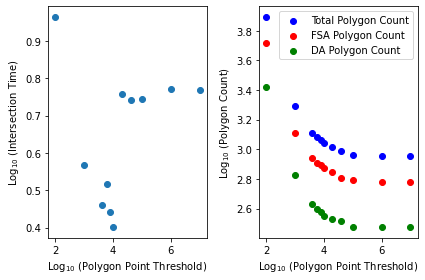

In [1070]:
evaluateThreshold(1485,56154,[10000000,1000000,100000,40000,20000,10000,8000,6000,4000,1000,100]);

10000000    1.052 s   Input FSA:  MultiPolygon 303 elements,  Input DA:  MultiPolygon 303  elements
 1000000    1.103 s   Input FSA:  MultiPolygon 303 elements,  Input DA:  MultiPolygon 303  elements
  100000    0.970 s   Input FSA:  MultiPolygon 303 elements,  Input DA:  MultiPolygon 303  elements
   10000    1.183 s   Input FSA:  MultiPolygon 327 elements,  Input DA:  MultiPolygon 315  elements
    1000    1.359 s   Input FSA:  MultiPolygon 479 elements,  Input DA:  MultiPolygon 476  elements
     100    2.576 s   Input FSA:  MultiPolygon 1313 elements,  Input DA:  MultiPolygon 1264  elements


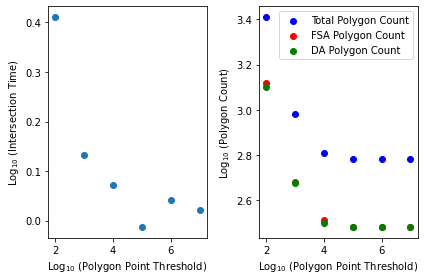

In [1071]:
evaluateThreshold(492,19049,[10000000,1000000,100000,10000,1000,100]);

10000000    1.554 s   Input FSA:  MultiPolygon 600 elements,  Input DA:  MultiPolygon 295  elements
 1000000    1.501 s   Input FSA:  MultiPolygon 600 elements,  Input DA:  MultiPolygon 295  elements
  100000    1.542 s   Input FSA:  MultiPolygon 619 elements,  Input DA:  MultiPolygon 295  elements
   10000    1.529 s   Input FSA:  MultiPolygon 747 elements,  Input DA:  MultiPolygon 341  elements
    1000    3.110 s   Input FSA:  MultiPolygon 1297 elements,  Input DA:  MultiPolygon 634  elements
     100    7.562 s   Input FSA:  MultiPolygon 5186 elements,  Input DA:  MultiPolygon 2450  elements


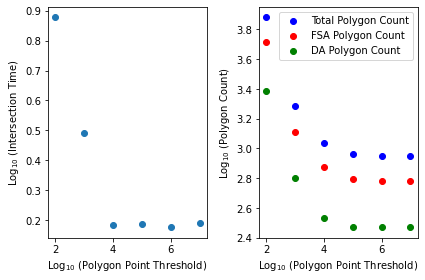

In [1072]:
evaluateThreshold(1485,56232,[10000000,1000000,100000,10000,1000,100]);

10000000   21.975 s   Input FSA:  MultiPolygon 1964 elements,  Input DA:  MultiPolygon 1887  elements
 1000000   22.265 s   Input FSA:  MultiPolygon 1964 elements,  Input DA:  MultiPolygon 1887  elements
  100000   23.151 s   Input FSA:  MultiPolygon 1996 elements,  Input DA:  MultiPolygon 1909  elements
   40000   10.807 s   Input FSA:  MultiPolygon 2020 elements,  Input DA:  MultiPolygon 1935  elements
   20000   11.022 s   Input FSA:  MultiPolygon 2065 elements,  Input DA:  MultiPolygon 1977  elements
   10000   10.046 s   Input FSA:  MultiPolygon 2133 elements,  Input DA:  MultiPolygon 2023  elements
    8000   10.959 s   Input FSA:  MultiPolygon 2164 elements,  Input DA:  MultiPolygon 2088  elements
    6000   10.483 s   Input FSA:  MultiPolygon 2205 elements,  Input DA:  MultiPolygon 2125  elements
    4000   11.271 s   Input FSA:  MultiPolygon 2304 elements,  Input DA:  MultiPolygon 2214  elements
    1000   12.465 s   Input FSA:  MultiPolygon 2910 elements,  Input DA:  MultiPol

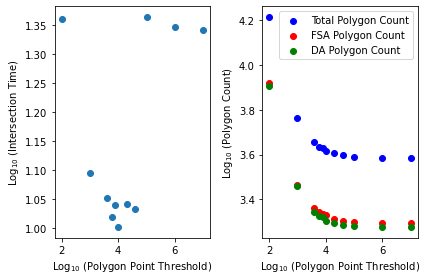

In [1073]:
evaluateThreshold(811,56540,[10000000,1000000,100000,40000,20000,10000,8000,6000,4000,1000,100]);

10000000   44.893 s   Input FSA:  MultiPolygon 923 elements,  Input DA:  MultiPolygon 918  elements
 1000000   44.394 s   Input FSA:  MultiPolygon 923 elements,  Input DA:  MultiPolygon 918  elements
  100000   44.885 s   Input FSA:  MultiPolygon 927 elements,  Input DA:  MultiPolygon 922  elements
   10000    4.975 s   Input FSA:  MultiPolygon 1009 elements,  Input DA:  MultiPolygon 1014  elements
    1000    7.382 s   Input FSA:  MultiPolygon 1608 elements,  Input DA:  MultiPolygon 1617  elements
     100   16.093 s   Input FSA:  MultiPolygon 6147 elements,  Input DA:  MultiPolygon 6026  elements


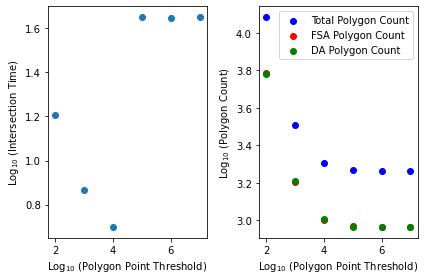

In [1074]:
evaluateThreshold(812,55475,[10000000,1000000,100000,10000,1000,100]);

10000000   16.565 s   Input FSA:  MultiPolygon 690 elements,  Input DA:  MultiPolygon 139  elements
 1000000   15.965 s   Input FSA:  MultiPolygon 690 elements,  Input DA:  MultiPolygon 139  elements
  100000   17.746 s   Input FSA:  MultiPolygon 697 elements,  Input DA:  MultiPolygon 139  elements
   40000   15.535 s   Input FSA:  MultiPolygon 753 elements,  Input DA:  MultiPolygon 148  elements
   10000    3.434 s   Input FSA:  MultiPolygon 875 elements,  Input DA:  MultiPolygon 172  elements
    4000    2.155 s   Input FSA:  MultiPolygon 1017 elements,  Input DA:  MultiPolygon 205  elements
    1000    2.957 s   Input FSA:  MultiPolygon 1581 elements,  Input DA:  MultiPolygon 321  elements
     400    3.922 s   Input FSA:  MultiPolygon 2432 elements,  Input DA:  MultiPolygon 504  elements
     100    9.691 s   Input FSA:  MultiPolygon 6182 elements,  Input DA:  MultiPolygon 1324  elements


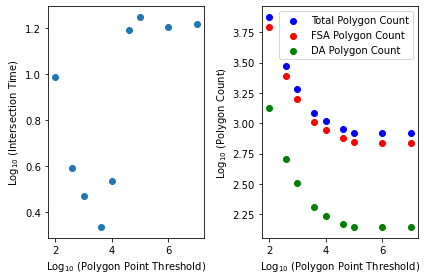

In [1075]:
evaluateThreshold(1484,56231,[10000000,1000000,100000,40000,10000,4000,1000,400,100]);

10000000    3.949 s   Input FSA:  MultiPolygon 13794 elements,  Input DA:  MultiPolygon 918  elements
 1000000    3.886 s   Input FSA:  MultiPolygon 13820 elements,  Input DA:  MultiPolygon 918  elements
  100000    3.477 s   Input FSA:  MultiPolygon 13969 elements,  Input DA:  MultiPolygon 922  elements
   10000   11.849 s   Input FSA:  MultiPolygon 14988 elements,  Input DA:  MultiPolygon 1014  elements
    1000   12.280 s   Input FSA:  MultiPolygon 20166 elements,  Input DA:  MultiPolygon 1617  elements
     100   29.691 s   Input FSA:  MultiPolygon 53867 elements,  Input DA:  MultiPolygon 6026  elements


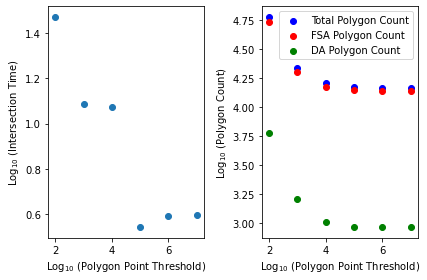

In [1076]:
evaluateThreshold(809,55475,[10000000,1000000,100000,10000,1000,100]);

  100000   51.848 s   Input FSA:  MultiPolygon 13969 elements,  Input DA:  MultiPolygon 4861  elements
   60000   38.772 s   Input FSA:  MultiPolygon 14064 elements,  Input DA:  MultiPolygon 4898  elements
   40000   39.081 s   Input FSA:  MultiPolygon 14175 elements,  Input DA:  MultiPolygon 4921  elements
   20000   34.653 s   Input FSA:  MultiPolygon 14464 elements,  Input DA:  MultiPolygon 4979  elements
   10000   33.426 s   Input FSA:  MultiPolygon 14988 elements,  Input DA:  MultiPolygon 5170  elements
    5000   33.902 s   Input FSA:  MultiPolygon 15734 elements,  Input DA:  MultiPolygon 5402  elements
    2500   38.968 s   Input FSA:  MultiPolygon 17034 elements,  Input DA:  MultiPolygon 5765  elements
    1000   42.922 s   Input FSA:  MultiPolygon 20166 elements,  Input DA:  MultiPolygon 6755  elements


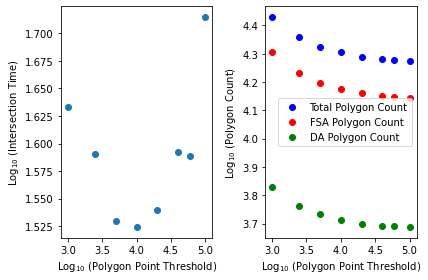

In [1077]:
evaluateThreshold(809,55491,[100000,60000,40000,20000,10000,5000,2500,1000]);

  100000  251.208 s   Input FSA:  MultiPolygon 13969 elements,  Input DA:  MultiPolygon 9194  elements
   80000  242.690 s   Input FSA:  MultiPolygon 13997 elements,  Input DA:  MultiPolygon 9203  elements
   60000   65.328 s   Input FSA:  MultiPolygon 14064 elements,  Input DA:  MultiPolygon 9248  elements
   40000   60.191 s   Input FSA:  MultiPolygon 14175 elements,  Input DA:  MultiPolygon 9364  elements
   20000   56.927 s   Input FSA:  MultiPolygon 14464 elements,  Input DA:  MultiPolygon 9563  elements
   10000   63.281 s   Input FSA:  MultiPolygon 14988 elements,  Input DA:  MultiPolygon 9864  elements
    5000   60.450 s   Input FSA:  MultiPolygon 15734 elements,  Input DA:  MultiPolygon 10442  elements
    2500   62.062 s   Input FSA:  MultiPolygon 17034 elements,  Input DA:  MultiPolygon 11319  elements
    1000   66.485 s   Input FSA:  MultiPolygon 20166 elements,  Input DA:  MultiPolygon 13518  elements


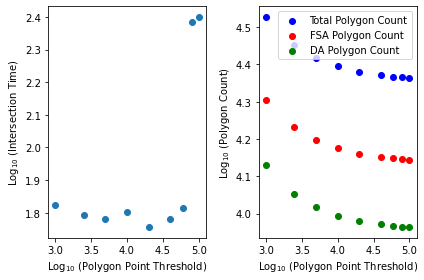

In [1078]:
evaluateThreshold(809,56531,[100000,80000,60000,40000,20000,10000,5000,2500,1000]);

We now roll this intersectionBySjoinCut algorithm back into the entire intersection calculation, taking the geometry cutting outside of the function so that it can be done only once per geometry because each geometry will likely be involved in many intersections.

In [31]:
def katanaByParts(geom, vertex_limit=10000):
    '''Break geom into a list of shapely Polygons each with at most vertex_limit vertices.
    
    Parameters
    ----------
    geom: shapely Polygon or MultiPolygon
    vertex_limit: int>3, maximum number of vertices per output Polygon
    
    Returns
    -------
    list of shapely Polygon where each Polygon has at most vertex_limit vertices
    
    Notes
    -----
    The union of all returned Polygons is equal to the input geom.
    Cuts only the pieces of geom with vertex count greater than vertex_limit.
    Might be improved with an approach similar to intersectionBySjoinCut to avoid excessive looping and appending
    '''
    geomarr = [geom] if geom.type=='Polygon' else list(geom)
    newgeoms = []
    [newgeoms.extend(katana(g,vertex_limit)) if countCoordinates(g)>vertex_limit else newgeoms.append(g) for g in geomarr]
    return newgeoms

In [39]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, apply_buffer=False, threshold=None, vertex_limit=10000, check_inputs=True):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must have valid geometries and match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must have valid geometries and match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]] (default None)
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions (default 1)
    area_epsg: int, convert to this epsg for area calculation (default 6931)
    apply_buffer: bool, use .buffer(0) to coerce valid geometries in gdf1 and gdf2 (often works, sometimes corrupts geometry) (default False)
    threshold: float or None, a float value discards overlaps that area less than threshold fraction of the largest overlap for each geometry in gdf2 (default None)
    vertex_limit: int>3, limit geometry elements to at most this number of vertices when performing internal calculations (default 10000)
    check_inputs: bool, set to False to circumvent input checks (crs match, geometry validity, areas_in shape) for speedup (default True)
    
    Returns
    -------
    GeoDataFrame: gdf_joined where each row contains an overlap geometry between one row in gdf1 and one row in gdf2
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs and have reset index range(0,N)
    Iterates/spatially indexes over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries (optional)
    areas must be supplied, 
    Relies on geopandas, numpy as np, and time
    Returns None on input error
    
    TODO in this version:
    change area_epsg logic to choose epsg based on input geometry location/extent (potentially cutting geometry to evaluate area in multiple crs where those sections are more valid)
    '''
    if verbosity>=1: print("Beginning overlap determination")
    begin_time = time.time()
    start_time = time.time()
    
    if check_inputs:
        # Ensure coordinate reference systems match
        if gdf1.crs!=gdf2.crs:
            print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
            return None

        # Ensure geometries are valid
        n_invalid1 = gdf1.shape[0]-sum(gdf1.geometry.is_valid)
        n_invalid2 = gdf2.shape[0]-sum(gdf2.geometry.is_valid)
        if not apply_buffer and (n_invalid1>0 or n_invalid2>0):
            print(f"Input geometries must be valid: {n_invalid1} invalid geometries in gdf1, {n_invalid2} invalid geometries in gdf2")
            return None

        # Ensure areas_in is the proper size
        if not areas_in is None:
            N2 = len(areas_in)
            if N2!=gdf2.shape[0]:
                print(f"Input areas_in must have length {gdf2.shape[0]}, actual length is {N2}")
                return None
            N1 = len(areas_in[0])
            irreg = not all([len(a)==N1 for a in areas_in])
            if len(areas_in)!=gdf2.shape[0] or N1!=gdf1.shape[0] or irreg:
                print(f"Input areas_in must have size [{gdf2.shape[0]}][{gdf1.shape[0]}], actual shape is [{N2}][{N1}]{' with irregular second dimension length' if irreg else ''}")
                return None
    
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}'+('  Input checks passed' if check_inputs else '  Input checks bypassed'))
    
    # Ensure we are computing with copies of the dataframes
    start_time = time.time()
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Input dataframes copied')
    
    # Apply buffer to ensure geometries are valid (optional, avoids overlap topological errors, risks occasionally discarding portions of the geometry)
    if apply_buffer:
        start_time = time.time()
        gdf1.geometry = gdf1.geometry.buffer(0)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Polygon buffering for {keyfield1} completed')
        start_time = time.time()
        gdf2.geometry = gdf2.geometry.buffer(0)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Polygon buffering for {keyfield1} completed')
    
    if areas_in is None:
        # Perform a spatial join to find which geometries potentially overlap
        start_time = time.time()
        gdf_joined = geopandas.tools.sjoin(gdf1,gdf2,how='inner')
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Spatial join completed, {gdf_joined.shape[0]} potential overlaps')
    else:
        # Use areas_in to construct potential overlaps
        start_time = time.time()
        gdf_joined = geopandas.GeoDataFrame(crs=gdf1.crs)
        tmp = np.nonzero(areas_in)
        gdf_joined[keyfield1] = gdf1.iloc[tmp[1],:][keyfield1].values
        gdf_joined[keyfield2] = gdf2.iloc[tmp[0],:][keyfield2].values
        gdf_joined.index = tmp[1]
        gdf_joined['index_right'] = tmp[0]
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Interpretation of areas_in for overlaps completed, {gdf_joined.shape[0]} overlaps obtained')
    
    # ADDED Create a column indicating if the geometry needs to be cut and a column with the cut geometry (array of polygons)
    start_time = time.time()
    gdf1['Do Cut'] = gdf1.geometry.apply(countCoordinates)>vertex_limit
    gdf2['Do Cut'] = gdf2.geometry.apply(countCoordinates)>vertex_limit
    gdf1['Cut Array Geometry'] = [katanaByParts(g,vertex_limit) if d else [g] if g.type=='Polygon' else list(g) for d, g in zip(gdf1['Do Cut'].values, gdf1.geometry.values)]
    gdf2['Cut Array Geometry'] = [katanaByParts(g,vertex_limit) if d else [g] if g.type=='Polygon' else list(g) for d, g in zip(gdf2['Do Cut'].values, gdf2.geometry.values)]
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Geometry cutting completed, {gdf1["Do Cut"].sum()} in gdf1 and {gdf2["Do Cut"].sum()} in gdf2')
    
    # Format the resultant geodataframe for convenience in subsequent calculation
    start_time = time.time()
    indexfield1 = keyfield1+' Index'
    indexfield2 = keyfield2+' Index'
    gdf_joined[indexfield2] = gdf_joined['index_right']
    gdf_joined[indexfield1] = gdf_joined.index
    gdf_joined = gdf_joined.loc[:,[indexfield1,keyfield1,indexfield2,keyfield2]].reset_index(drop=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Output GeoDataFrame formatting completed')
    
    # MODIFIED Part 1: Calculate the actual overlap for each potential overlap, in sections based on the 'Do Cut' properties of the input GDFs
    start_time = time.time()
    # Make a boolean index for gdf_joined for if a cut geometry is involved in that row
    indb_cut = gdf1.loc[gdf_joined[indexfield1],'Do Cut'].values | gdf2.loc[gdf_joined[indexfield2],'Do Cut'].values
    # Perform a simple intersection if no cutting is involved
    gdf_joined.loc[~indb_cut,'Overlap Geometry'] = gdf1.geometry.loc[gdf_joined.loc[~indb_cut,indexfield1]].intersection(gdf2.geometry.loc[gdf_joined.loc[~indb_cut,indexfield2]],align=False).values
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Unmodified geomety overlaps calculated, {sum(~indb_cut)} total')
    
    # MODIFIED Part 2: Perform a sjoin intersection if cutting is involved (Polygon array input version)
    start_time = time.time()
    gdf_joined.loc[indb_cut,'Overlap Geometry'] = [intersectionBySjoin(g1,g2) for g1, g2 in zip(gdf1.loc[gdf_joined.loc[indb_cut,indexfield1],'Cut Array Geometry'],gdf2.loc[gdf_joined.loc[indb_cut,indexfield2],'Cut Array Geometry'])]
    gdf_joined.set_geometry('Overlap Geometry',inplace=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Cut geometry overlaps calculated, {sum(indb_cut)} total')
    
    # Calculate overlap area
    start_time = time.time()
    gdf_joined['Overlap Area'] = gdf_joined.to_crs(epsg=area_epsg).area
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Areas computed')
    
    # Downselect to relevant geometries
    if not threshold is None:
        start_time = time.time()
        a_ratio = gdf_joined['Overlap Area']/gdf_joined.groupby([keyfield2])['Overlap Area'].sum().loc[gdf_joined[keyfield2]].values
        ind_drop = np.where(a_ratio<threshold)[0]
        gdf_joined = gdf_joined.drop(index=ind_drop).reset_index(drop=True)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Area threshold applied, {gdf_joined.shape[0]} overlaps retained, {len(indb_cut)-gdf_joined.shape[0]} overlaps dropped')
    
    # Add area ratio column (ratio is with respect to all overlaps sharing the same keyfield2)
    gdf_joined[keyfield2+' Overlap Ratio'] = gdf_joined['Overlap Area']/gdf_joined.groupby([keyfield2])['Overlap Area'].sum().loc[gdf_joined[keyfield2]].values
    
    # Return results
    end_gmt = time.gmtime(time.time()-begin_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Total execution time upon completion')
    return gdf_joined

In [50]:
def maxSubCoordinates(geom):
    '''Find the largest number of coordinates among components of geometry
    
    Parameters
    ----------
    geom: shapely.geometry.Polygon or shapely.geometry.MultiPolygon (consisting only of shapely.geometry.Polygon componenet)
    
    Returns
    -------
    int: number of coordinates in the largest geometry
    
    Notes
    -----
    Each geometry element repeats the first point as the last point, and these are included in the count
    '''
    if geom.type=='MultiPolygon':
        count = [countCoordinates(g) for g in geom]
    elif geom.type=='Polygon':
        count = [len(geom.exterior.coords) + sum([len(i.coords) for i in geom.interiors])]
    else:
        print(f'Geometry is not strictly Polygon or MultiPolygon: {geom.type}')
    return max(count)

In [59]:
def cleanGeometry(geom):
    '''Coerces geometry into a Polygon or MultiPolygon
    
    Selects only components of input shapely geometry that are non-empty
    Polygons or MultiPolygons and returns:
        an empty GeometryCollection if there are no selected elements
        the non-empty element if there is one selected element
        a multipolygon if there are multiple selected elements
    
    Requires shapely
    TODO: add case of nested GeometryCollections
    '''
    if geom.is_empty:
        return shapely.geometry.Polygon([])
    if geom.type in {'Polygon','MultiPolygon'}:
        return geom
    if not geom.type in {'GeometryCollection'}:
        return shapely.geometry.Polygon([])
    # A GeometryCollection contains only Points, LineStrings, or Polygons...
    polys = [g for g in list(geom) if g.type in {'Polygon','MultiPolygon'} and not g.is_empty]
    if len(polys)==0:
        return shapely.geometry.Polygon([])
    elif len(polys)==1:
        return polys[0]
    else:
        polys = [g if g.type=='Polygon' else list(g) for g in polys]
        return shapely.geometry.MultiPolygon(polys)
    return None # This should never be reached

In [65]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, apply_buffer=False, threshold=None, vertex_limit=10000, check_inputs=True):
    '''Find all intersections between geometries in two geodataframes
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, and have valid geometries if apply_buffer is False)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, and have valid geometries if apply_buffer is False)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]], intersections will be calculated only for geometry pairs with nonzero entries (default None)
    verbosity: int, detail level of reporting during execution: 0=none, 1+=announce computation sections (default 1)
    area_epsg: int, convert to this epsg for area calculation (default 6931)
    apply_buffer: bool, use .buffer(0) to coerce valid geometries in gdf1 and gdf2 (often works, sometimes corrupts geometry) (default False)
    threshold: float or None, a float value discards overlaps that area less than threshold fraction of the largest overlap for each geometry in gdf2 (default None)
    vertex_limit: int>3, limit geometry elements to at most this number of vertices when performing internal calculations (default 10000)
    check_inputs: bool, set to False to circumvent input checks (crs match, geometry validity, areas_in shape) for speedup (default True)
    
    Returns
    -------
    GeoDataFrame: each row contains an overlap geometry between one row in gdf1 and one row in gdf2, with the following fields:
        keyfield1: entry from gdf1[keyfield1]
        keyfield1+' Index': index of row from gdf1
        keyfield2: entry from gdf2[keyfield2]
        keyfield2_' Index': index of row from gdf2
        'Overlap Geometry': intersection as shapely Polygon or MultiPolygon
        'Overlap Area': area of intersection geometry in units of area_epsg coordinate reference system
        'Overlap Ratio': fraction of area that this geometry represents out of all intersection geometries involving the source row in gdf2
    
    Notes
    -----
    Relies on geopandas, numpy as np, and time
    Returns None on input error after printing error description
    
    TODO:
    check that operation is correct with input gdf index not reset to range(0,N)
    change area_epsg logic to choose epsg based on input geometry location/extent (potentially cutting geometry to evaluate area in multiple crs where those sections are more valid)
    '''
    if verbosity>=1: print("Beginning overlap determination")
    begin_time = time.time()
    start_time = time.time()
    
    if check_inputs:
        # Ensure coordinate reference systems match
        if gdf1.crs!=gdf2.crs:
            print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
            return None

        # Ensure geometries are valid
        n_invalid1 = gdf1.shape[0]-sum(gdf1.geometry.is_valid)
        n_invalid2 = gdf2.shape[0]-sum(gdf2.geometry.is_valid)
        if not apply_buffer and (n_invalid1>0 or n_invalid2>0):
            print(f"Input geometries must be valid: {n_invalid1} invalid geometries in gdf1, {n_invalid2} invalid geometries in gdf2")
            return None

        # Ensure areas_in is the proper size
        if not areas_in is None:
            N2 = len(areas_in)
            if N2!=gdf2.shape[0]:
                print(f"Input areas_in must have length {gdf2.shape[0]}, actual length is {N2}")
                return None
            N1 = len(areas_in[0])
            irreg = not all([len(a)==N1 for a in areas_in])
            if len(areas_in)!=gdf2.shape[0] or N1!=gdf1.shape[0] or irreg:
                print(f"Input areas_in must have size [{gdf2.shape[0]}][{gdf1.shape[0]}], actual shape is [{N2}][{N1}]{' with irregular second dimension length' if irreg else ''}")
                return None
    
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}'+(' Input checks passed' if check_inputs else ' Input checks bypassed'))
    
    # Ensure we are computing with copies of the dataframes
    start_time = time.time()
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Input dataframes copied')
    
    # Apply buffer to ensure geometries are valid (optional, avoids overlap topological errors, risks occasionally discarding portions of the geometry)
    if apply_buffer:
        start_time = time.time()
        gdf1.geometry = gdf1.geometry.buffer(0)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Polygon buffering for {keyfield1} completed')
        start_time = time.time()
        gdf2.geometry = gdf2.geometry.buffer(0)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Polygon buffering for {keyfield1} completed')
    
    if areas_in is None:
        # Perform a spatial join to find which geometries potentially overlap
        start_time = time.time()
        gdf_joined = geopandas.tools.sjoin(gdf1,gdf2,how='inner')
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Spatial join completed, {gdf_joined.shape[0]} potential overlaps')
    else:
        # Use areas_in to construct potential overlaps
        start_time = time.time()
        gdf_joined = geopandas.GeoDataFrame(crs=gdf1.crs)
        tmp = np.nonzero(areas_in)
        gdf_joined[keyfield1] = gdf1.iloc[tmp[1],:][keyfield1].values
        gdf_joined[keyfield2] = gdf2.iloc[tmp[0],:][keyfield2].values
        gdf_joined.index = tmp[1]
        gdf_joined['index_right'] = tmp[0]
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Interpretation of areas_in for overlaps completed, {gdf_joined.shape[0]} overlaps obtained')
    
    # Create a column indicating if the geometry needs to be cut and a column with the cut geometry (as array of polygons)
    start_time = time.time()
    gdf1['Do Cut'] = gdf1.geometry.apply(maxSubCoordinates)>vertex_limit
    gdf2['Do Cut'] = gdf2.geometry.apply(maxSubCoordinates)>vertex_limit
    gdf1['Cut Array Geometry'] = [katanaByParts(g,vertex_limit) if d else [g] if g.type=='Polygon' else list(g) for d, g in zip(gdf1['Do Cut'].values, gdf1.geometry.values)]
    gdf2['Cut Array Geometry'] = [katanaByParts(g,vertex_limit) if d else [g] if g.type=='Polygon' else list(g) for d, g in zip(gdf2['Do Cut'].values, gdf2.geometry.values)]
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Geometry cutting completed, {gdf1["Do Cut"].sum()} in gdf1 and {gdf2["Do Cut"].sum()} in gdf2')
    
    # Format the resultant geodataframe for convenience in subsequent calculation
    start_time = time.time()
    indexfield1 = keyfield1+' Index'
    indexfield2 = keyfield2+' Index'
    gdf_joined[indexfield2] = gdf_joined['index_right']
    gdf_joined[indexfield1] = gdf_joined.index
    gdf_joined = gdf_joined.loc[:,[indexfield1,keyfield1,indexfield2,keyfield2]].reset_index(drop=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Output GeoDataFrame formatting completed')
    
    # Overlap Part 1: Calculate the actual overlap for each potential overlap, in sections based on the 'Do Cut' properties of the input GDFs
    start_time = time.time()
    indb_cut = gdf1.loc[gdf_joined[indexfield1],'Do Cut'].values | gdf2.loc[gdf_joined[indexfield2],'Do Cut'].values
    gdf_joined.loc[~indb_cut,'Overlap Geometry'] = gdf1.geometry.loc[gdf_joined.loc[~indb_cut,indexfield1]].intersection(gdf2.geometry.loc[gdf_joined.loc[~indb_cut,indexfield2]],align=False).values
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Unmodified geomety overlaps calculated, {sum(~indb_cut)} total')
    
    # Overlap Part 2: Perform a sjoin intersection if cutting is involved (Polygon array input version)
    start_time = time.time()
    gdf_joined['Overlap Geometry'].iloc[np.nonzero(indb_cut)] = [intersectionBySjoin(g1,g2) for g1, g2 in zip(gdf1.loc[gdf_joined.loc[indb_cut,indexfield1],'Cut Array Geometry'],gdf2.loc[gdf_joined.loc[indb_cut,indexfield2],'Cut Array Geometry'])]
    gdf_joined.set_geometry('Overlap Geometry',inplace=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Cut geometry overlaps calculated, {sum(indb_cut)} total')
    
    # Overlap Cleanup: Remove empty and non-polygon geometries
    start_time = time.time()
    init_len = gdf_joined.shape[0]
    gdf_joined.geometry = [cleanGeometry(g) for g in gdf_joined.geometry]
    gdf_joined = gdf_joined.drop(np.where(gdf_joined.geometry.is_empty)[0]).reset_index(drop=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Empty overlaps removed, {init_len-gdf_joined.shape[0]} total')
        
    # Calculate overlap area
    start_time = time.time()
    gdf_joined['Overlap Area'] = gdf_joined.to_crs(epsg=area_epsg).area
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Areas computed')
    
    # Downselect to relevant geometries
    if not threshold is None:
        start_time = time.time()
        a_ratio = gdf_joined['Overlap Area']/gdf_joined.groupby([keyfield2])['Overlap Area'].sum().loc[gdf_joined[keyfield2]].values
        ind_drop = np.where(a_ratio<threshold)[0]
        gdf_joined = gdf_joined.drop(index=ind_drop).reset_index(drop=True)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Area threshold applied, {gdf_joined.shape[0]} overlaps retained, {len(indb_cut)-gdf_joined.shape[0]} overlaps dropped')
    
    # Add area ratio column (ratio is with respect to all overlaps sharing the same keyfield2)
    gdf_joined[keyfield2+' Overlap Ratio'] = gdf_joined['Overlap Area']/gdf_joined.groupby([keyfield2])['Overlap Area'].sum().loc[gdf_joined[keyfield2]].values
    
    # Return results
    end_gmt = time.gmtime(time.time()-begin_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Total execution time upon completion')
    return gdf_joined

In [57]:
gdf1 = gdf_CA_FSA_Db
key1 = 'CFSAUID'
gdf2 = gdf_CA_DA_Db
key2 = 'DAUID'
areas_in=None
verbosity=1
area_epsg=6931
apply_buffer=False
threshold=None
vertex_limit=10000
check_inputs=False

In [58]:
ret = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, apply_buffer, threshold, vertex_limit, check_inputs)

Beginning overlap determination
0d00:00:00 Input checks bypassed
0d00:00:00  Input dataframes copied
0d00:00:07  Spatial join completed, 80496 potential overlaps
0d00:00:02  Geometry cutting completed, 17 in gdf1 and 11 in gdf2
0d00:00:00  Output GeoDataFrame formatting completed
0d00:01:21  Unmodified geomety overlaps calculated, 77719 total
0d00:01:31  Cut geometry overlaps calculated, 2777 total
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygons
selecting only polygon

In [64]:
sum(ret[0].geometry.is_empty)

0

In [36]:
ret = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, apply_buffer, threshold, vertex_limit, check_inputs)

Beginning overlap determination
0d00:00:04  Input checks passed
0d00:00:00  Input dataframes copied
0d00:00:08  Spatial join completed, 80496 potential overlaps
0d00:00:03  Geometry cutting completed, 21 in gdf1 and 11 in gdf2
0d00:00:00  Output GeoDataFrame formatting completed
0d00:01:09  Unmodified geomety overlaps calculated, 77150 total
0d00:01:36  Cut geometry overlaps calculated, 3346 total
0d00:00:30  Areas computed
0d00:03:33  Total execution time upon completion


In [41]:
inds = list(range(10000,20000))
ret01 = intersectGDF(gdf1, keyfield1, gdf2.iloc[inds,:], keyfield2, areas_in, verbosity, area_epsg, apply_buffer, threshold, vertex_limit, check_inputs)

Beginning overlap determination
0d00:00:00  Input checks passed
0d00:00:00  Input dataframes copied
0d00:00:01  Spatial join completed, 13874 potential overlaps
0d00:00:00  Geometry cutting completed, 21 in gdf1 and 2 in gdf2
0d00:00:00  Output GeoDataFrame formatting completed
0d00:00:08  Unmodified geomety overlaps calculated, 13849 total
0d00:00:00  Cut geometry overlaps calculated, 25 total
0d00:00:02  Areas computed
0d00:00:15  Total execution time upon completion


The evaluation code and results follow as markdown (to avoid excessive execution time on re-running this notebook).

Digital overlap evaluation code:

    g, t, a = loadResults(DIR_RESULTS+'GDF_FSA-DA_D_M2AREA')
    gdf1 = gdf_CA_FSA_Db
    gdf2 = gdf_CA_DA_Db
    keyfield1 = 'CFSAUID'
    keyfield2 = 'DAUID'
    areas_in=None
    verbosity=1
    area_epsg=6931
    apply_buffer=False
    threshold=1e-6
    vertex_limit=20000
    times_D = []

    labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
    areas_arr = [None, a, normalizeAreas(a,threshold=threshold,aslist=True),maximumAreas(a,aslist=True)]
    vertex_arr = [100000, 50000, 20000, 10000, 5000]

    for label, areas_in in zip(labels,areas_arr):
        ttimes = []
        for vertex_limit in vertex_arr:
            print(f'Running intersectGDF with areas_in: {label}, vertex_limit: {vertex_limit}')
            start_time = time.time()
            gdf_joined = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, apply_buffer, threshold, vertex_limit)
            ttimes.append(time.time()-start_time)
            print()
        times_D.append(ttimes)

    plt.plot(np.log10(vertex_arr), np.transpose(times_D),'.-')
    plt.ylabel('Execution Time [s]')
    plt.xlabel('Log$_{10}$ (Vertex Threshold)')
    plt.legend(labels);

Output of digital overlap evaluation code:

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 100000
    Beginning overlap determination
    0d00:00:09  Input checks passed
    0d00:00:06  Input dataframes copied
    0d00:00:09  Spatial join completed, 80496 potential overlaps
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:04:24  Unmodified geomety overlaps calculated, 80496 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:37  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23883 overlaps dropped
    0d00:05:30  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 50000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Spatial join completed, 80496 potential overlaps
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:04:26  Unmodified geomety overlaps calculated, 80496 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:27  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23883 overlaps dropped
    0d00:05:08  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 20000
    Beginning overlap determination
    0d00:00:04  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:09  Spatial join completed, 80496 potential overlaps
    0d00:00:02  Geometry cutting completed, 6 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:28  Unmodified geomety overlaps calculated, 79204 total
    0d00:01:09  Cut geometry overlaps calculated, 1292 total
    0d00:00:32  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23883 overlaps dropped
    0d00:04:26  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 10000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Spatial join completed, 80496 potential overlaps
    0d00:00:02  Geometry cutting completed, 21 in gdf1 and 11 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:17  Unmodified geomety overlaps calculated, 77150 total
    0d00:01:40  Cut geometry overlaps calculated, 3346 total
    0d00:00:34  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23883 overlaps dropped
    0d00:03:45  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 5000
    Beginning overlap determination
    0d00:00:04  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Spatial join completed, 80496 potential overlaps
    0d00:00:04  Geometry cutting completed, 60 in gdf1 and 105 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:42  Unmodified geomety overlaps calculated, 72711 total
    0d00:02:55  Cut geometry overlaps calculated, 7785 total
    0d00:00:26  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23883 overlaps dropped
    0d00:04:20  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:08  Unmodified geomety overlaps calculated, 80199 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:22  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:02:38  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:00:04  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:09  Unmodified geomety overlaps calculated, 80199 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:28  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:02:44  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:01  Geometry cutting completed, 6 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:38  Unmodified geomety overlaps calculated, 78923 total
    0d00:00:33  Cut geometry overlaps calculated, 1276 total
    0d00:00:25  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:02:44  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:00  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:02  Geometry cutting completed, 21 in gdf1 and 11 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:03  Unmodified geomety overlaps calculated, 76893 total
    0d00:01:08  Cut geometry overlaps calculated, 3306 total
    0d00:00:27  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:02:46  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:04  Geometry cutting completed, 60 in gdf1 and 105 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:44  Unmodified geomety overlaps calculated, 72475 total
    0d00:02:29  Cut geometry overlaps calculated, 7724 total
    0d00:00:25  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:03:49  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:00:04  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:09  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:29  Unmodified geomety overlaps calculated, 56613 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:13  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 0 overlaps dropped
    0d00:01:59  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:30  Unmodified geomety overlaps calculated, 56613 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:15  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 0 overlaps dropped
    0d00:01:57  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:01  Geometry cutting completed, 6 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:08  Unmodified geomety overlaps calculated, 55618 total
    0d00:00:23  Cut geometry overlaps calculated, 995 total
    0d00:00:12  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 0 overlaps dropped
    0d00:01:56  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:02  Geometry cutting completed, 21 in gdf1 and 11 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:44  Unmodified geomety overlaps calculated, 54226 total
    0d00:00:47  Cut geometry overlaps calculated, 2387 total
    0d00:00:15  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 0 overlaps dropped
    0d00:01:59  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:00:04  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:04  Geometry cutting completed, 60 in gdf1 and 105 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:24  Unmodified geomety overlaps calculated, 51220 total
    0d00:01:45  Cut geometry overlaps calculated, 5393 total
    0d00:00:17  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 0 overlaps dropped
    0d00:02:43  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:00:04  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:26  Unmodified geomety overlaps calculated, 56590 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:10  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 0 overlaps dropped
    0d00:01:51  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:03  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:29  Unmodified geomety overlaps calculated, 56590 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:13  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 0 overlaps dropped
    0d00:01:58  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:00:05  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:03  Geometry cutting completed, 6 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:03  Unmodified geomety overlaps calculated, 55595 total
    0d00:00:24  Cut geometry overlaps calculated, 995 total
    0d00:00:11  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 0 overlaps dropped
    0d00:01:57  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:02  Geometry cutting completed, 21 in gdf1 and 11 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:44  Unmodified geomety overlaps calculated, 54203 total
    0d00:00:47  Cut geometry overlaps calculated, 2387 total
    0d00:00:11  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 0 overlaps dropped
    0d00:01:56  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:00:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:04  Geometry cutting completed, 60 in gdf1 and 105 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:30  Unmodified geomety overlaps calculated, 51198 total
    0d00:01:43  Cut geometry overlaps calculated, 5392 total
    0d00:00:13  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 0 overlaps dropped
    0d00:02:43  Total execution time upon completion

We now load the runtimes listed above and plot them:

In [ ]:
times_D = [[330.40247082710266,
  308.49437284469604,
  266.91889357566833,
  225.89409565925598,
  260.9325444698334],
 [158.41800808906555,
  165.09121799468994,
  165.02210521697998,
  166.26445269584656,
  229.5123770236969],
 [119.5935411453247,
  118.10588812828064,
  117.11229014396667,
  119.66714215278625,
  163.70456743240356],
 [111.93452453613281,
  118.1929018497467,
  117.57408595085144,
  116.56983780860901,
  164.03852343559265]]

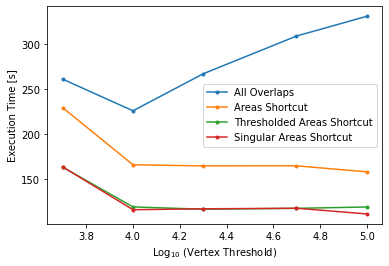

In [1003]:
plt.plot(np.log10(vertex_arr), np.transpose(times_D),'.-')
plt.ylabel('Execution Time [s]')
plt.xlabel('Log$_{10}$ (Vertex Threshold)')
plt.legend(labels);

For digital geometries in the general case (All Overlaps) our estimated vertex_limit of 10k is optimal; larger limits enounter slowdown in the intersection function, and lower limits encounter slowdown in the cutting and reassembly functions.  Using an areas array to circumvent the finding of overlapping geometries is optimal at vertex_limit 100k(+), though the runtime is relatively flat down to 10k, indicating that the sjoin function which determines which geometries overlap (without determining the geometry of their overlap) is the main source of slowdown for large geometries.  The time between the blue and yellow lines is attributable to the sjoin function, and that below the yellow line attributable to the cut/intersection/union functions.

We can perform the same evaluation for the cartographic geometries:

Cartographic overlap evaluation code:

    g, t, a = loadResults(DIR_RESULTS+'GDF_FSA-DA_M2AREA')
    gdf1 = gdf_CA_FSAb
    gdf2 = gdf_CA_DAb
    keyfield1 = 'CFSAUID'
    keyfield2 = 'DAUID'
    areas_in=None
    verbosity=1
    area_epsg=6931
    apply_buffer=False
    threshold=1e-6
    vertex_limit=20000
    times_C = []

    labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
    areas_arr = [None, a, normalizeAreas(a,threshold=threshold,aslist=True),maximumAreas(a,aslist=True)]
    vertex_arr = [100000, 50000, 20000, 10000, 5000]

    for label, areas_in in zip(labels,areas_arr):
        ttimes = []
        for vertex_limit in vertex_arr:
            print(f'Running intersectGDF with areas_in: {label}, vertex_limit: {vertex_limit}')
            start_time = time.time()
            gdf_joined = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, apply_buffer, threshold, vertex_limit)
            ttimes.append(time.time()-start_time)
            print()
        times_C.append(ttimes)

    plt.plot(np.log10(vertex_arr), np.transpose(times_C),'.-')
    plt.ylabel('Execution Time [s]')
    plt.xlabel('Log$_{10}$ (Vertex Threshold)')
    plt.legend(labels);

Output of cartographic overlap evaluation code:

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 100000
    Beginning overlap determination
    0d00:04:21  Input checks passed
    0d00:00:02  Input dataframes copied
    0d00:05:46  Spatial join completed, 79431 potential overlaps
    0d00:00:08  Geometry cutting completed, 7 in gdf1 and 5 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:05:35  Unmodified geomety overlaps calculated, 79124 total
    0d00:09:03  Cut geometry overlaps calculated, 307 total
    0d00:00:35  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22819 overlaps dropped
    0d00:25:33  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 50000
    Beginning overlap determination
    0d00:04:06  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:05:00  Spatial join completed, 79431 potential overlaps
    0d00:00:09  Geometry cutting completed, 12 in gdf1 and 9 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:04:49  Unmodified geomety overlaps calculated, 78498 total
    0d00:05:44  Cut geometry overlaps calculated, 933 total
    0d00:00:32  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22819 overlaps dropped
    0d00:20:23  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 20000
    Beginning overlap determination
    0d00:04:27  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:05:57  Spatial join completed, 79431 potential overlaps
    0d00:00:19  Geometry cutting completed, 34 in gdf1 and 18 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:21  Unmodified geomety overlaps calculated, 75637 total
    0d00:06:17  Cut geometry overlaps calculated, 3794 total
    0d00:00:35  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22819 overlaps dropped
    0d00:19:59  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 10000
    Beginning overlap determination
    0d00:04:10  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:05:06  Spatial join completed, 79431 potential overlaps
    0d00:00:27  Geometry cutting completed, 69 in gdf1 and 39 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:04  Unmodified geomety overlaps calculated, 71964 total
    0d00:07:12  Cut geometry overlaps calculated, 7467 total
    0d00:00:31  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22819 overlaps dropped
    0d00:18:32  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 5000
    Beginning overlap determination
    0d00:04:08  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:05:33  Spatial join completed, 79431 potential overlaps
    0d00:00:34  Geometry cutting completed, 113 in gdf1 and 158 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:45  Unmodified geomety overlaps calculated, 67638 total
    0d00:08:04  Cut geometry overlaps calculated, 11793 total
    0d00:00:37  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22819 overlaps dropped
    0d00:19:43  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:04:05  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:00:07  Geometry cutting completed, 7 in gdf1 and 5 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:03:22  Unmodified geomety overlaps calculated, 78810 total
    0d00:09:06  Cut geometry overlaps calculated, 306 total
    0d00:00:28  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22504 overlaps dropped
    0d00:17:13  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:04:02  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:00:10  Geometry cutting completed, 12 in gdf1 and 9 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:42  Unmodified geomety overlaps calculated, 78184 total
    0d00:05:25  Cut geometry overlaps calculated, 932 total
    0d00:00:31  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22504 overlaps dropped
    0d00:12:54  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:04:02  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:00:18  Geometry cutting completed, 34 in gdf1 and 18 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:29  Unmodified geomety overlaps calculated, 75343 total
    0d00:05:32  Cut geometry overlaps calculated, 3773 total
    0d00:00:27  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22504 overlaps dropped
    0d00:11:53  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:04:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:00:22  Geometry cutting completed, 69 in gdf1 and 39 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:55  Unmodified geomety overlaps calculated, 71701 total
    0d00:06:34  Cut geometry overlaps calculated, 7415 total
    0d00:00:27  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22504 overlaps dropped
    0d00:12:24  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:03:59  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:00:34  Geometry cutting completed, 113 in gdf1 and 158 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:39  Unmodified geomety overlaps calculated, 67397 total
    0d00:07:46  Cut geometry overlaps calculated, 11719 total
    0d00:00:28  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22504 overlaps dropped
    0d00:13:29  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:04:06  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:11  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:00:06  Geometry cutting completed, 7 in gdf1 and 5 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:21  Unmodified geomety overlaps calculated, 56391 total
    0d00:07:50  Cut geometry overlaps calculated, 221 total
    0d00:00:20  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 0 overlaps dropped
    0d00:14:56  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:03:56  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:00:11  Geometry cutting completed, 12 in gdf1 and 9 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:45  Unmodified geomety overlaps calculated, 55893 total
    0d00:04:30  Cut geometry overlaps calculated, 719 total
    0d00:00:19  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 0 overlaps dropped
    0d00:10:51  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:04:00  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:00:15  Geometry cutting completed, 34 in gdf1 and 18 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:02  Unmodified geomety overlaps calculated, 53739 total
    0d00:04:26  Cut geometry overlaps calculated, 2873 total
    0d00:00:19  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 0 overlaps dropped
    0d00:10:12  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:03:58  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:00:24  Geometry cutting completed, 69 in gdf1 and 39 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:35  Unmodified geomety overlaps calculated, 51146 total
    0d00:05:01  Cut geometry overlaps calculated, 5466 total
    0d00:00:19  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 0 overlaps dropped
    0d00:10:27  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:03:57  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:00:33  Geometry cutting completed, 113 in gdf1 and 158 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:24  Unmodified geomety overlaps calculated, 48032 total
    0d00:05:58  Cut geometry overlaps calculated, 8580 total
    0d00:00:18  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 0 overlaps dropped
    0d00:11:18  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:03:56  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:00:07  Geometry cutting completed, 7 in gdf1 and 5 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:18  Unmodified geomety overlaps calculated, 56368 total
    0d00:07:39  Cut geometry overlaps calculated, 221 total
    0d00:00:22  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 0 overlaps dropped
    0d00:14:33  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:04:03  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:00:09  Geometry cutting completed, 12 in gdf1 and 9 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:44  Unmodified geomety overlaps calculated, 55870 total
    0d00:04:26  Cut geometry overlaps calculated, 719 total
    0d00:00:20  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 0 overlaps dropped
    0d00:10:51  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:04:00  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:00:18  Geometry cutting completed, 34 in gdf1 and 18 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:05  Unmodified geomety overlaps calculated, 53716 total
    0d00:04:24  Cut geometry overlaps calculated, 2873 total
    0d00:00:16  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 0 overlaps dropped
    0d00:10:14  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:03:58  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:00:25  Geometry cutting completed, 69 in gdf1 and 39 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:34  Unmodified geomety overlaps calculated, 51123 total
    0d00:05:00  Cut geometry overlaps calculated, 5466 total
    0d00:00:21  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 0 overlaps dropped
    0d00:10:29  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:03:59  Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:00:33  Geometry cutting completed, 113 in gdf1 and 158 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:23  Unmodified geomety overlaps calculated, 48010 total
    0d00:05:57  Cut geometry overlaps calculated, 8579 total
    0d00:00:19  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 0 overlaps dropped
    0d00:11:21  Total execution time upon completion

We now load the runtimes listed above and plot them:

In [ ]:
times_C = [[1533.975516319275,
  1224.1160945892334,
  1199.377555847168,
  1112.6807696819305,
  1184.2519626617432],
 [1033.5560727119446,
  774.4552805423737,
  713.5734899044037,
  745.1544923782349,
  809.9362435340881],
 [896.7061414718628,
  651.7278215885162,
  612.7914433479309,
  627.7660784721375,
  679.1032476425171],
 [873.2488992214203,
  651.6544237136841,
  614.6562421321869,
  629.8860635757446,
  681.3160536289215]]

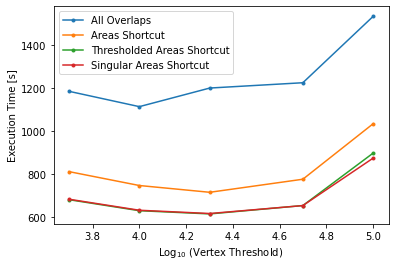

In [1013]:
plt.plot(np.log10(vertex_arr), np.transpose(times_C),'.-')
plt.ylabel('Execution Time [s]')
plt.xlabel('Log$_{10}$ (Vertex Threshold)')
plt.legend(labels);

From this we see that the optimal vertex_limit for general operation (All Overlaps) is again about 10,000 (in line with the threshold of intersection time identified previously from the scatter plot of original evaluation times and the plots of optimal vertex_limit for single geometry pairs).  This choice is driven by an equal preference for calculating all overlaps anew and for re-calculating overlaps starting from an overlap area array.  It would be useful in the future to examine the origin of this threshold so as to know under given computing environment parameters (environment variables) what input parameters (vertex_limit) will minimize computation time, but it is beyond the scope of this work to delve into the shapely codebase to make that identification.  We note that, similar to the digital geometry results, about a quarter of the computation time is attributable to the sjoin function, with the remainder being the cut/intersection/union functions.

We summarize the performance of the various import functions developed (optimized at vertex_limit = 10,000 unless otherwise noted):

#### Digital Boundaries:

Version | All Overlaps | Areas Shortcut | Thresholded A.S. | Singular A.S.
---|---:|---:|---:|---:
Original | 1:57:35 | 1:46:41
Original w/ Multiprocess (P=10) | 1:10:04 | 44:53
Final | 1:49:41 | | 2:40 | 2:50
Final (revised) | 4:18:21 | 5:21 | 4:12 | 3:51
Final (revised), after kernel restart | 2:09:13 | 4:06 | 3:24 | 3:24
Cut | (5k) 3:00 | 2:08 | 1:34 | 1:32
Sjoin | 30:31 | 28:51 | 21:53 | 18:12
Sjoin/Cut/10k | 3:45 | 2:46 | 2:00 | 1:57
Sjoin/Cut/10k w/ Multiprocess (P=10, D=2000) | 2:42 | 1:34 | 3:39

#### Cartographic Boundaries:

Version | All Overlaps | Areas Shortcut | Thresholded A.S. | Singular A.S.
---|---:|---:|---:|---:
Original | 17:16:55 | 14:50:51
Original w/ Multiprocess (N=10) | 15:04:59
Final | 
Final (revised) (memory slowdown) | 19:59:08 | 13:39:44 | 15:10:18 | 15:11:39
Cut | (50k) 26:58 | (50k) 19:07 | (50k) 15:46 | (50k) 15:50
Sjoin | 1:18:09 | 1:03:00 | 1:03:55 | 1:05:00
Sjoin/Cut/10k | 18:33 (14:23) | 12:24 (8:21) | 10:27 (6:29) | 10:29 (6:31)
Sjoin/Cut/10k w/ Multiprocess (P=10, D=2000) | 14:36 (10:56) |  |  | 

## Evaluation of intersectionBySjoin

In [1156]:
help(intersectionBySjoin)

Help on function intersectionBySjoin in module __main__:

intersectionBySjoin(geom1, geom2, vertex_limit=10000)
    Fast intersection of two geometries using cutting and spatial indexing.
    
    Recursively cuts each input geometry until resulting geometries have less
    than vertex_limit vertices, performs a spatial join to find overlaps, and
    reassembles the full overlap by unary union.  Useful when the number of
    vertices in a geometry is very large (e.g. > 100k) and performance
    degradation occurs with the standard shapely intersection.
    
    Parameters
    ----------
    geom1: shapely Polygon or MultiPolygon, or array of shapely Polygons
    geom2: shapely Polygon or MultiPolygon, or array of shapely Polygons
    vertex_limit: int>3, maximum vertex count per polygon
    
    Returns
    -------
    shapely Polygon or Multipolygon of the overlap of geom1 and geom2
    
    TODO:
    optimize vertex_limit



In [1228]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, apply_buffer=False, threshold=None, vertex_limit=10000, check_inputs=True):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must have valid geometries and match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must have valid geometries and match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]] (default None)
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions (default 1)
    area_epsg: int, convert to this epsg for area calculation (default 6931)
    apply_buffer: bool, use .buffer(0) to coerce valid geometries in gdf1 and gdf2 (often works, sometimes corrupts geometry) (default False)
    threshold: float or None, a float value discards overlaps that area less than threshold fraction of the largest overlap for each geometry in gdf2 (default None)
    vertex_limit: int>3, limit geometry elements to at most this number of vertices when performing internal calculations (default 10000)
    check_inputs: bool, set to False to circumvent input checks (crs match, geometry validity, areas_in shape) for speedup (default True)
    
    Returns
    -------
    GeoDataFrame: gdf_joined where each row contains an overlap geometry between one row in gdf1 and one row in gdf2
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs and have reset index range(0,N)
    Iterates/spatially indexes over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries (optional)
    areas must be supplied, 
    Relies on geopandas, numpy as np, and time
    Returns None on input error
    
    TODO in this version:
    change gdf_joined to have uniform geometry label
    change area_epsg logic to choose epsg based on input geometry location/extent (potentially cutting geometry to evaluate area in multiple crs where those sections are more valid)
    '''
    if verbosity>=1: print("Beginning overlap determination")
    begin_time = time.time()
    start_time = time.time()
    
    if check_inputs:
        # Ensure coordinate reference systems match
        if gdf1.crs!=gdf2.crs:
            print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
            return None

        # Ensure geometries are valid
        n_invalid1 = gdf1.shape[0]-sum(gdf1.geometry.is_valid)
        n_invalid2 = gdf2.shape[0]-sum(gdf2.geometry.is_valid)
        if not apply_buffer and (n_invalid1>0 or n_invalid2>0):
            print(f"Input geometries must be valid: {n_invalid1} invalid geometries in gdf1, {n_invalid2} invalid geometries in gdf2")
            return None

        # Ensure areas_in is the proper size
        if not areas_in is None:
            N1 = len(areas_in[0])
            N2 = len(areas_in)
            irreg = not all([len(a)==N1 for a in areas_in])
            if N2!=gdf2.shape[0] or N1!=gdf1.shape[0] or irreg:
                print(f"Input areas_in must have size [{gdf2.shape[0]}][{gdf1.shape[0]}], actual shape is [{len(areas_in)}][{len(areas_in[0])}]{' with irregular second dimension length' if irreg else ''}")
                return None
    
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}'+(' Input checks passed' if check_inputs else ' Input checks bypassed'))
    
    # Ensure we are computing with copies of the dataframes
    start_time = time.time()
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Input dataframes copied')
    
    # Apply buffer to ensure geometries are valid (optional, avoids overlap topological errors, risks occasionally discarding portions of the geometry)
    if apply_buffer:
        start_time = time.time()
        gdf1.geometry = gdf1.geometry.buffer(0)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Polygon buffering for {keyfield1} completed')
        start_time = time.time()
        gdf2.geometry = gdf2.geometry.buffer(0)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Polygon buffering for {keyfield1} completed')
    
    if areas_in is None:
        # Perform a spatial join to find which geometries potentially overlap
        start_time = time.time()
        gdf_joined = geopandas.tools.sjoin(gdf1,gdf2,how='inner')
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Spatial join completed, {gdf_joined.shape[0]} potential overlaps')
    else:
        # Use areas_in to construct potential overlaps
        start_time = time.time()
        gdf_joined = geopandas.GeoDataFrame(crs=gdf1.crs)
        tmp = np.nonzero(areas_in)
        gdf_joined[keyfield1] = gdf1.iloc[tmp[1],:][keyfield1].values
        gdf_joined[keyfield2] = gdf2.iloc[tmp[0],:][keyfield2].values
        gdf_joined.index = tmp[1]
        gdf_joined['index_right'] = tmp[0]
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Interpretation of areas_in for overlaps completed, {gdf_joined.shape[0]} overlaps obtained')
    
    # Format the resultant geodataframe for convenience in subsequent calculation
    start_time = time.time()
    indexfield1 = keyfield1+' Index'
    indexfield2 = keyfield2+' Index'
    gdf_joined[indexfield2] = gdf_joined['index_right']
    gdf_joined[indexfield1] = gdf_joined.index
    gdf_joined = gdf_joined.loc[:,[indexfield1,keyfield1,indexfield2,keyfield2]].reset_index(drop=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Output GeoDataFrame formatting completed')
    
    # MODIFIED Part 1: Calculate the actual overlap for each potential overlap, in sections based on the 'Do Cut' properties of the input GDFs
    start_time = time.time()
    gdf_joined['Geometry'] = np.zeros_like(gdf_joined.index)
    for i, ind1, ind2 in zip(range(gdf_joined.shape[0]),gdf_joined[indexfield1],gdf_joined[indexfield2]):
        gdf_joined['Geometry'].iloc[i] = intersectionBySjoin(gdf1.geometry.iloc[ind1],gdf2.geometry.iloc[ind2])
    gdf_joined.set_geometry('Geometry',inplace=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Geomety overlaps calculated, {gdf_joined.shape[0]} total')
    
    # Calculate overlap area
    start_time = time.time()
    gdf_joined['Overlap Area'] = gdf_joined.to_crs(epsg=area_epsg).area
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Areas computed')
    
    # Downselect to relevant geometries
    if not threshold is None:
        start_time = time.time()
        a_ratio = gdf_joined['Overlap Area']/gdf_joined.groupby([keyfield2])['Overlap Area'].sum().loc[gdf_joined[keyfield2]].values
        ind_drop = np.where(a_ratio<threshold)[0]
        gdf_joined = gdf_joined.drop(index=ind_drop).reset_index(drop=True)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Area threshold applied, {gdf_joined.shape[0]} overlaps retained, {len(indb_cut)-gdf_joined.shape[0]} overlaps dropped')
    
    # Add area ratio column (ratio is with respect to all overlaps sharing the same keyfield2)
    gdf_joined[keyfield2+' Overlap Ratio'] = gdf_joined['Overlap Area']/gdf_joined.groupby([keyfield2])['Overlap Area'].sum().loc[gdf_joined[keyfield2]].values
    
    # Return results
    end_gmt = time.gmtime(time.time()-begin_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Total execution time upon completion')
    return gdf_joined

Sjoin Digital overlap evaluation code:

    g, t, a = loadResults(DIR_RESULTS+'GDF_FSA-DA_D_M2AREA')
    gdf1 = gdf_CA_FSA_Db
    gdf2 = gdf_CA_DA_Db
    keyfield1 = 'CFSAUID'
    keyfield2 = 'DAUID'
    areas_in=None
    verbosity=1
    area_epsg=6931
    apply_buffer=False
    threshold=1e-6
    vertex_limit=20000
    times_D = []

    labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
    areas_arr = [None, a, normalizeAreas(a,threshold=threshold,aslist=True),maximumAreas(a,aslist=True)]

    for label, areas_in in zip(labels,areas_arr):
        ttimes = []
        for vertex_limit in vertex_arr:
            print(f'Running intersectGDF with areas_in: {label}')
            start_time = time.time()
            gdf_joined = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, apply_buffer, threshold, vertex_limit)
            ttimes.append(time.time()-start_time)
            print()
        times_D.append(ttimes)

    plt.plot(range(len(labels)), np.transpose(times_D),'.-')
    plt.ylabel('Execution Time [s]')
    plt.xlabel('Calculation Mode')
    plt.xticks(ticks=range(len(labels)),labels=labels,rotation=-15);
    
Sjoin Digital overlap evaluation code oputput:

    Running intersectGDF with areas_in: All Overlaps
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Spatial join completed, 80496 potential overlaps
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:29:49  Geomety overlaps calculated, 80496 total
    0d00:00:29  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:30:31  Total execution time upon completion
    
    Running intersectGDF with areas_in: Areas Shortcut
    Beginning overlap determination
    0d00:00:02 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:28:14  Geomety overlaps calculated, 80199 total
    0d00:00:33  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:28:51  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut
    Beginning overlap determination
    0d00:00:08 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:10  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:21:17  Geomety overlaps calculated, 56613 total
    0d00:00:16  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:21:53  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:17:49  Geomety overlaps calculated, 56590 total
    0d00:00:12  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 23609 overlaps dropped
    0d00:18:12  Total execution time upon completion

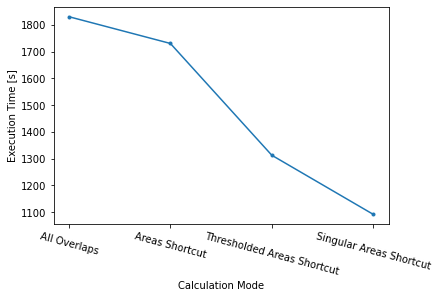

In [1230]:
times_D = [1831, 1731, 1313, 1092]
labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
plt.plot(range(len(labels)), np.transpose(times_D),'.-')
plt.ylabel('Execution Time [s]')
plt.xlabel('Calculation Mode')
plt.xticks(ticks=range(len(labels)),labels=labels,rotation=-15);

Sjoin Cartographic overlap evaluation code:

    g, t, a = loadResults(DIR_RESULTS+'GDF_FSA-DA_M2AREA')
    gdf1 = gdf_CA_FSAb
    gdf2 = gdf_CA_DAb
    keyfield1 = 'CFSAUID'
    keyfield2 = 'DAUID'
    areas_in=None
    verbosity=1
    area_epsg=6931
    apply_buffer=False
    threshold=1e-6
    vertex_limit=10
    times_C = []

    labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
    areas_arr = [None, a, normalizeAreas(a,threshold=threshold,aslist=True),maximumAreas(a,aslist=True)]
    vertex_arr = [10]

    for label, areas_in in zip(labels,areas_arr):
        ttimes = []
        for vertex_limit in vertex_arr:
            print(f'Running intersectGDF with areas_in: {label}')
            start_time = time.time()
            gdf_joined = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, apply_buffer, threshold, vertex_limit)
            ttimes.append(time.time()-start_time)
            print()
        times_C.append(ttimes)
    
    plt.plot(range(len(labels)), np.transpose(times_C),'.-')
    plt.ylabel('Execution Time [s]')
    plt.xlabel('Calculation Mode')
    plt.xticks(ticks=range(len(labels)),labels=labels,rotation=-15);

Sjoin Cartographic overlap evaluation code output:

    Running intersectGDF with areas_in: All Overlaps
    Beginning overlap determination
    0d00:04:18 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:08:18  Spatial join completed, 79431 potential overlaps
    0d00:00:00  Output GeoDataFrame formatting completed
    0d01:04:55  Geomety overlaps calculated, 79431 total
    0d00:00:36  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 23587 overlaps dropped
    0d01:18:09  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut
    Beginning overlap determination
    0d00:04:13 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:58:15  Geomety overlaps calculated, 79116 total
    0d00:00:30  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 23587 overlaps dropped
    0d01:03:00  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut
    Beginning overlap determination
    0d00:04:19 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:10  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:59:04  Geomety overlaps calculated, 56612 total
    0d00:00:20  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 23587 overlaps dropped
    0d01:03:55  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut
    Beginning overlap determination
    0d00:04:16 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:00:00  Output GeoDataFrame formatting completed
    0d01:00:10  Geomety overlaps calculated, 56589 total
    0d00:00:26  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 23610 overlaps dropped
    0d01:05:00  Total execution time upon completion

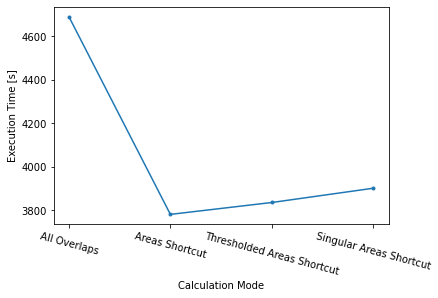

In [1231]:
times_C = [4689.764709234238, 3780.8350620269775, 3835.478933095932, 3901.0761301517487]
labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
plt.plot(range(len(labels)), np.transpose(times_C),'.-')
plt.ylabel('Execution Time [s]')
plt.xlabel('Calculation Mode')
plt.xticks(ticks=range(len(labels)),labels=labels,rotation=-15);

## Evaluation of intersectionByCut

In [ ]:
help(intersectionByCut)

In [1207]:
def intersectionByCutParts(geom1cut, geom2cut):
    '''Fast intersection of two geometries using cutting and spatial indexing.
    
    Recursibely cuts each input geometry until resulting geometries have less
    than vertex_limit vertices, performs a spatial join to find overlaps, and
    reassembles the full overlap by unary union.  Useful when the number of
    vertices in a geometry is very large (e.g. > 100k) and performance
    degradation occurs with the standard shapely intersection.
    
    Parameters
    ----------
    geom1cut: list of shapely Polygon
    geom2cut: list of shapely Polygon
    
    Returns
    -------
    shapely Polygon or Multipolygon of the overlap of geom1 and geom2
    
    TODO:
    optimize vertex_limit
    '''
    geom1cutseries = geopandas.GeoSeries(geom1cut)
    geom2cutseries = geopandas.GeoSeries(geom2cut)
    geom2_overlap_indices = [geom2cutseries.sindex.query(d, predicate='intersects') for d in geom1cutseries] # same time as query_bulk
    geomOverlap = [geom2cutseries.iloc[g].intersection(d) for g, d in zip(geom2_overlap_indices, geom1cutseries)]
    geomUnions = [shapely.ops.unary_union(a) for a in geomOverlap]
    return shapely.ops.unary_union(geomUnions)

In [1208]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, apply_buffer=False, threshold=None, vertex_limit=10000, check_inputs=True):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must have valid geometries and match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must have valid geometries and match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]] (default None)
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions (default 1)
    area_epsg: int, convert to this epsg for area calculation (default 6931)
    apply_buffer: bool, use .buffer(0) to coerce valid geometries in gdf1 and gdf2 (often works, sometimes corrupts geometry) (default False)
    threshold: float or None, a float value discards overlaps that area less than threshold fraction of the largest overlap for each geometry in gdf2 (default None)
    vertex_limit: int>3, limit geometry elements to at most this number of vertices when performing internal calculations (default 10000)
    check_inputs: bool, set to False to circumvent input checks (crs match, geometry validity, areas_in shape) for speedup (default True)
    
    Returns
    -------
    GeoDataFrame: gdf_joined where each row contains an overlap geometry between one row in gdf1 and one row in gdf2
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs and have reset index range(0,N)
    Iterates/spatially indexes over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries (optional)
    areas must be supplied, 
    Relies on geopandas, numpy as np, and time
    Returns None on input error
    
    TODO in this version:
    change area_epsg logic to choose epsg based on input geometry location/extent (potentially cutting geometry to evaluate area in multiple crs where those sections are more valid)
    '''
    if verbosity>=1: print("Beginning overlap determination")
    begin_time = time.time()
    start_time = time.time()
    
    if check_inputs:
        # Ensure coordinate reference systems match
        if gdf1.crs!=gdf2.crs:
            print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
            return None

        # Ensure geometries are valid
        n_invalid1 = gdf1.shape[0]-sum(gdf1.geometry.is_valid)
        n_invalid2 = gdf2.shape[0]-sum(gdf2.geometry.is_valid)
        if not apply_buffer and (n_invalid1>0 or n_invalid2>0):
            print(f"Input geometries must be valid: {n_invalid1} invalid geometries in gdf1, {n_invalid2} invalid geometries in gdf2")
            return None

        # Ensure areas_in is the proper size
        if not areas_in is None:
            N2 = len(areas_in)
            if N2!=gdf2.shape[0]:
                print(f"Input areas_in must have length {gdf2.shape[0]}, actual length is {N2}")
                return None
            N1 = len(areas_in[0])
            irreg = not all([len(a)==N1 for a in areas_in])
            if len(areas_in)!=gdf2.shape[0] or N1!=gdf1.shape[0] or irreg:
                print(f"Input areas_in must have size [{gdf2.shape[0]}][{gdf1.shape[0]}], actual shape is [{N2}][{N1}]{' with irregular second dimension length' if irreg else ''}")
                return None
    
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}'+(' Input checks passed' if check_inputs else ' Input checks bypassed'))
    
    # Ensure we are computing with copies of the dataframes
    start_time = time.time()
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Input dataframes copied')
    
    # Apply buffer to ensure geometries are valid (optional, avoids overlap topological errors, risks occasionally discarding portions of the geometry)
    if apply_buffer:
        start_time = time.time()
        gdf1.geometry = gdf1.geometry.buffer(0)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Polygon buffering for {keyfield1} completed')
        start_time = time.time()
        gdf2.geometry = gdf2.geometry.buffer(0)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Polygon buffering for {keyfield1} completed')
    
    if areas_in is None:
        # Perform a spatial join to find which geometries potentially overlap
        start_time = time.time()
        gdf_joined = geopandas.tools.sjoin(gdf1,gdf2,how='inner')
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Spatial join completed, {gdf_joined.shape[0]} potential overlaps')
    else:
        # Use areas_in to construct potential overlaps
        start_time = time.time()
        gdf_joined = geopandas.GeoDataFrame(crs=gdf1.crs)
        tmp = np.nonzero(areas_in)
        gdf_joined[keyfield1] = gdf1.iloc[tmp[1],:][keyfield1].values
        gdf_joined[keyfield2] = gdf2.iloc[tmp[0],:][keyfield2].values
        gdf_joined.index = tmp[1]
        gdf_joined['index_right'] = tmp[0]
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Interpretation of areas_in for overlaps completed, {gdf_joined.shape[0]} overlaps obtained')
    
    # ADDED Create a column indicating if the geometry needs to be cut and a column with the cut geometry (array of polygons)
    start_time = time.time()
    gdf1['Do Cut'] = gdf1.geometry.apply(countCoordinates)>vertex_limit
    gdf2['Do Cut'] = gdf2.geometry.apply(countCoordinates)>vertex_limit
    gdf1['Cut Array Geometry'] = [katana(g,vertex_limit) if d else [g] if g.type=='Polygon' else list(g) for d, g in zip(gdf1['Do Cut'].values, gdf1.geometry.values)]
    gdf2['Cut Array Geometry'] = [katana(g,vertex_limit) if d else [g] if g.type=='Polygon' else list(g) for d, g in zip(gdf2['Do Cut'].values, gdf2.geometry.values)]
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Geometry cutting completed, {gdf1["Do Cut"].sum()} in gdf1 and {gdf2["Do Cut"].sum()} in gdf2')
    
    # Format the resultant geodataframe for convenience in subsequent calculation
    start_time = time.time()
    indexfield1 = keyfield1+' Index'
    indexfield2 = keyfield2+' Index'
    gdf_joined[indexfield2] = gdf_joined['index_right']
    gdf_joined[indexfield1] = gdf_joined.index
    gdf_joined = gdf_joined.loc[:,[indexfield1,keyfield1,indexfield2,keyfield2]].reset_index(drop=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Output GeoDataFrame formatting completed')
    
    # MODIFIED Part 1: Calculate the actual overlap for each potential overlap, in sections based on the 'Do Cut' properties of the input GDFs
    start_time = time.time()
    # Make a boolean index for gdf_joined for if a cut geometry is involved in that row
    indb_cut = gdf1.loc[gdf_joined[indexfield1],'Do Cut'].values | gdf2.loc[gdf_joined[indexfield2],'Do Cut'].values
    # Perform a simple intersection if no cutting is involved
    gdf_joined.loc[~indb_cut,'Overlap Geometry'] = gdf1.geometry.iloc[gdf_joined.loc[~indb_cut,indexfield1]].intersection(gdf2.geometry.iloc[gdf_joined.loc[~indb_cut,indexfield2]],align=False).values
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Unmodified geomety overlaps calculated, {sum(~indb_cut)} total')
    
    # MODIFIED Part 2: Perform a sjoin intersection if cutting is involved (Polygon array input version)
    start_time = time.time()
    gdf_joined.loc[indb_cut,'Overlap Geometry'] = [intersectionByCutParts(g1,g2) for g1, g2 in zip(gdf1.loc[gdf_joined.loc[indb_cut,indexfield1],'Cut Array Geometry'],gdf2.loc[gdf_joined.loc[indb_cut,indexfield2],'Cut Array Geometry'])]
    gdf_joined.set_geometry('Overlap Geometry',inplace=True)
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Cut geometry overlaps calculated, {sum(indb_cut)} total')
    
    # Calculate overlap area
    start_time = time.time()
    gdf_joined['Overlap Area'] = gdf_joined.to_crs(epsg=area_epsg).area
    end_gmt = time.gmtime(time.time()-start_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Areas computed')
    
    # Downselect to relevant geometries
    if not threshold is None:
        start_time = time.time()
        a_ratio = gdf_joined['Overlap Area']/gdf_joined.groupby([keyfield2])['Overlap Area'].sum().loc[gdf_joined[keyfield2]].values
        ind_drop = np.where(a_ratio<threshold)[0]
        gdf_joined = gdf_joined.drop(index=ind_drop).reset_index(drop=True)
        end_gmt = time.gmtime(time.time()-start_time)
        if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Area threshold applied, {gdf_joined.shape[0]} overlaps retained, {len(indb_cut)-gdf_joined.shape[0]} overlaps dropped')
    
    # Add area ratio column (ratio is with respect to all overlaps sharing the same keyfield2)
    gdf_joined[keyfield2+' Overlap Ratio'] = gdf_joined['Overlap Area']/gdf_joined.groupby([keyfield2])['Overlap Area'].sum().loc[gdf_joined[keyfield2]].values
    
    # Return results
    end_gmt = time.gmtime(time.time()-begin_time)
    if verbosity>=1: print(f'{end_gmt.tm_yday-1}d{time.strftime("%H:%M:%S",end_gmt)}  Total execution time upon completion')
    return gdf_joined

Cut Digital overlap evaluation code:

    g, t, a = loadResults(DIR_RESULTS+'GDF_FSA-DA_D_M2AREA')
    gdf1 = gdf_CA_FSA_Db
    gdf2 = gdf_CA_DA_Db
    keyfield1 = 'CFSAUID'
    keyfield2 = 'DAUID'
    areas_in=None
    verbosity=1
    area_epsg=6931
    apply_buffer=False
    threshold=1e-6
    vertex_limit=20000
    times_D = []

    labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
    areas_arr = [None, a, normalizeAreas(a,threshold=threshold,aslist=True),maximumAreas(a,aslist=True)]
    vertex_arr = [100000, 50000, 20000, 10000, 5000]

    for label, areas_in in zip(labels,areas_arr):
        ttimes = []
        for vertex_limit in vertex_arr:
            print(f'Running intersectGDF with areas_in: {label}, vertex_limit: {vertex_limit}')
            start_time = time.time()
            gdf_joined = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, apply_buffer, threshold, vertex_limit)
            ttimes.append(time.time()-start_time)
            print()
        times_D.append(ttimes)

    plt.plot(np.log10(vertex_arr), np.transpose(times_D),'.-')
    plt.ylabel('Execution Time [s]')
    plt.xlabel('Log$_{10}$ (Vertex Threshold)')
    plt.legend(labels);

Output of Cut Digital overlap evaluation code:

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 100000
    Beginning overlap determination
    0d00:00:09 Input checks passed
    0d00:00:06  Input dataframes copied
    0d00:00:08  Spatial join completed, 80496 potential overlaps
    0d00:00:03  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:04:27  Unmodified geomety overlaps calculated, 80496 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:26  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23883 overlaps dropped
    0d00:05:22  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 50000
    Beginning overlap determination
    0d00:00:03 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:09  Spatial join completed, 80496 potential overlaps
    0d00:00:04  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:04:24  Unmodified geomety overlaps calculated, 80496 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:28  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23883 overlaps dropped
    0d00:05:11  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 20000
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:09  Spatial join completed, 80496 potential overlaps
    0d00:00:03  Geometry cutting completed, 6 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:26  Unmodified geomety overlaps calculated, 79204 total
    0d00:00:59  Cut geometry overlaps calculated, 1292 total
    0d00:00:25  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23883 overlaps dropped
    0d00:04:08  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 10000
    Beginning overlap determination
    0d00:00:03 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Spatial join completed, 80496 potential overlaps
    0d00:00:04  Geometry cutting completed, 21 in gdf1 and 11 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:17  Unmodified geomety overlaps calculated, 77150 total
    0d00:01:03  Cut geometry overlaps calculated, 3346 total
    0d00:00:27  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23883 overlaps dropped
    0d00:03:03  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 5000
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Spatial join completed, 80496 potential overlaps
    0d00:00:06  Geometry cutting completed, 60 in gdf1 and 105 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:47  Unmodified geomety overlaps calculated, 72711 total
    0d00:01:24  Cut geometry overlaps calculated, 7785 total
    0d00:00:27  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23883 overlaps dropped
    0d00:02:59  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:00:03 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:05  Unmodified geomety overlaps calculated, 80199 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:23  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:02:35  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:00:05 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:00  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:03  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:05  Unmodified geomety overlaps calculated, 80199 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:20  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:02:35  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:00:03 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:03  Geometry cutting completed, 6 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:37  Unmodified geomety overlaps calculated, 78923 total
    0d00:00:23  Cut geometry overlaps calculated, 1276 total
    0d00:00:23  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:02:33  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:04  Geometry cutting completed, 21 in gdf1 and 11 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:01  Unmodified geomety overlaps calculated, 76893 total
    0d00:00:34  Cut geometry overlaps calculated, 3306 total
    0d00:00:21  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:02:08  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:00:03 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:00  Interpretation of areas_in for overlaps completed, 80199 overlaps obtained
    0d00:00:07  Geometry cutting completed, 60 in gdf1 and 105 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:43  Unmodified geomety overlaps calculated, 72475 total
    0d00:01:07  Cut geometry overlaps calculated, 7724 total
    0d00:00:26  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 23586 overlaps dropped
    0d00:02:28  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:28  Unmodified geomety overlaps calculated, 56613 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:12  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 0 overlaps dropped
    0d00:01:55  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:29  Unmodified geomety overlaps calculated, 56613 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:11  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 0 overlaps dropped
    0d00:01:53  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:01  Geometry cutting completed, 6 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:05  Unmodified geomety overlaps calculated, 55618 total
    0d00:00:13  Cut geometry overlaps calculated, 995 total
    0d00:00:12  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 0 overlaps dropped
    0d00:01:44  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:00:03 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:02  Geometry cutting completed, 21 in gdf1 and 11 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:42  Unmodified geomety overlaps calculated, 54226 total
    0d00:00:22  Cut geometry overlaps calculated, 2387 total
    0d00:00:14  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 0 overlaps dropped
    0d00:01:33  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Interpretation of areas_in for overlaps completed, 56613 overlaps obtained
    0d00:00:05  Geometry cutting completed, 60 in gdf1 and 105 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:28  Unmodified geomety overlaps calculated, 51220 total
    0d00:00:46  Cut geometry overlaps calculated, 5393 total
    0d00:00:15  Areas computed
    0d00:00:00  Area threshold applied, 56613 overlaps retained, 0 overlaps dropped
    0d00:01:50  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:31  Unmodified geomety overlaps calculated, 56590 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:12  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 0 overlaps dropped
    0d00:01:57  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:01  Geometry cutting completed, 0 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:34  Unmodified geomety overlaps calculated, 56590 total
    0d00:00:00  Cut geometry overlaps calculated, 0 total
    0d00:00:14  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 0 overlaps dropped
    0d00:02:02  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:00:03 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:01  Geometry cutting completed, 6 in gdf1 and 0 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:09  Unmodified geomety overlaps calculated, 55595 total
    0d00:00:15  Cut geometry overlaps calculated, 995 total
    0d00:00:10  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 0 overlaps dropped
    0d00:01:47  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut1, vertex_limit: 10000
    Beginning overlap determination
    0d00:00:04 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:04  Geometry cutting completed, 21 in gdf1 and 11 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:41  Unmodified geomety overlaps calculated, 54203 total
    0d00:00:23  Cut geometry overlaps calculated, 2387 total
    0d00:00:10  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 0 overlaps dropped
    0d00:01:32  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:00:03 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56590 overlaps obtained
    0d00:00:04  Geometry cutting completed, 60 in gdf1 and 105 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:30  Unmodified geomety overlaps calculated, 51198 total
    0d00:00:44  Cut geometry overlaps calculated, 5392 total
    0d00:00:13  Areas computed
    0d00:00:00  Area threshold applied, 56590 overlaps retained, 0 overlaps dropped
    0d00:01:44  Total execution time upon completion

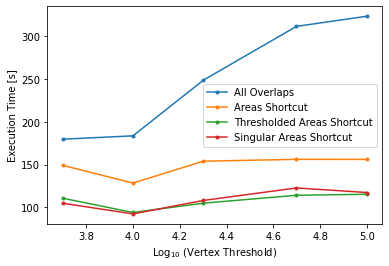

In [1232]:
times_D = [[323.23914313316345,  311.4095540046692,  248.5431251525879,  183.5009114742279,  179.59136962890625],
 [155.97914266586304,  156.04481744766235,  153.8974301815033,  128.3293113708496,  149.1232705116272],
 [115.25110745429993,  114.05846238136292,  104.84516835212708,  93.95632314682007,  110.6795928478241],
 [117.2920789718628,  122.63272094726562,  108.01881742477417,  92.28382968902588,  104.83230400085449]]
labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
vertex_arr = [100000, 50000, 20000, 10000, 5000]
plt.plot(np.log10(vertex_arr), np.transpose(times_D),'.-')
plt.ylabel('Execution Time [s]')
plt.xlabel('Log$_{10}$ (Vertex Threshold)')
plt.legend(labels);

Cut Cartographic overlap evaluation code:

    g, t, a = loadResults(DIR_RESULTS+'GDF_FSA-DA_M2AREA')
    gdf1 = gdf_CA_FSAb
    gdf2 = gdf_CA_DAb
    keyfield1 = 'CFSAUID'
    keyfield2 = 'DAUID'
    areas_in=None
    verbosity=1
    area_epsg=6931
    apply_buffer=False
    threshold=1e-6
    vertex_limit=10
    times_C = []

    labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
    areas_arr = [None, a, normalizeAreas(a,threshold=threshold,aslist=True),maximumAreas(a,aslist=True)]
    vertex_arr = [100000, 50000, 20000, 10000, 5000]

    for label, areas_in in zip(labels,areas_arr):
        ttimes = []
        for vertex_limit in vertex_arr:
            print(f'Running intersectGDF with areas_in: {label}, vertex_limit: {vertex_limit}')
            start_time = time.time()
            gdf_joined = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, apply_buffer, threshold, vertex_limit)
            ttimes.append(time.time()-start_time)
            print()
        times_C.append(ttimes)

    plt.plot(np.log10(vertex_arr), np.transpose(times_C),'.-')
    plt.ylabel('Execution Time [s]')
    plt.xlabel('Log$_{10}$ (Vertex Threshold)')
    plt.legend(labels);

Output of Cut Cartographic overlap evaluation code:

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 100000
    Beginning overlap determination
    0d00:04:29 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:05:19  Spatial join completed, 79431 potential overlaps
    0d00:00:47  Geometry cutting completed, 7 in gdf1 and 5 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:05:27  Unmodified geomety overlaps calculated, 79124 total
    0d00:10:18  Cut geometry overlaps calculated, 307 total
    0d00:00:34  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22819 overlaps dropped
    0d00:26:58  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 50000
    Beginning overlap determination
    0d00:04:11 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:05:05  Spatial join completed, 79431 potential overlaps
    0d00:00:57  Geometry cutting completed, 12 in gdf1 and 9 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:04:52  Unmodified geomety overlaps calculated, 78498 total
    0d00:10:35  Cut geometry overlaps calculated, 933 total
    0d00:00:32  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22819 overlaps dropped
    0d00:26:14  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 20000
    Beginning overlap determination
    0d00:04:14 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:05:21  Spatial join completed, 79431 potential overlaps
    0d00:01:17  Geometry cutting completed, 34 in gdf1 and 18 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:21  Unmodified geomety overlaps calculated, 75637 total
    0d00:13:07  Cut geometry overlaps calculated, 3794 total
    0d00:00:35  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22819 overlaps dropped
    0d00:26:57  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 10000
    Beginning overlap determination
    0d00:04:11 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:05:28  Spatial join completed, 79431 potential overlaps
    0d00:01:36  Geometry cutting completed, 69 in gdf1 and 39 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:05  Unmodified geomety overlaps calculated, 71964 total
    0d00:14:50  Cut geometry overlaps calculated, 7467 total
    0d00:00:31  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22819 overlaps dropped
    0d00:27:43  Total execution time upon completion

    Running intersectGDF with areas_in: All Overlaps, vertex_limit: 5000
    Beginning overlap determination
    0d00:04:24 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:05:50  Spatial join completed, 79431 potential overlaps
    0d00:01:54  Geometry cutting completed, 113 in gdf1 and 158 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:42  Unmodified geomety overlaps calculated, 67638 total
    0d00:16:15  Cut geometry overlaps calculated, 11793 total
    0d00:00:35  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22819 overlaps dropped
    0d00:29:43  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:04:12 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:00:45  Geometry cutting completed, 7 in gdf1 and 5 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:03:34  Unmodified geomety overlaps calculated, 78810 total
    0d00:10:14  Cut geometry overlaps calculated, 306 total
    0d00:00:29  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22504 overlaps dropped
    0d00:19:18  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:04:07 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:00:57  Geometry cutting completed, 12 in gdf1 and 9 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:49  Unmodified geomety overlaps calculated, 78184 total
    0d00:10:39  Cut geometry overlaps calculated, 932 total
    0d00:00:30  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22504 overlaps dropped
    0d00:19:06  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:04:12 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:01:26  Geometry cutting completed, 34 in gdf1 and 18 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:32  Unmodified geomety overlaps calculated, 75343 total
    0d00:12:45  Cut geometry overlaps calculated, 3773 total
    0d00:00:28  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22504 overlaps dropped
    0d00:20:27  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:04:12 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:01:33  Geometry cutting completed, 69 in gdf1 and 39 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:55  Unmodified geomety overlaps calculated, 71701 total
    0d00:14:17  Cut geometry overlaps calculated, 7415 total
    0d00:00:30  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22504 overlaps dropped
    0d00:21:31  Total execution time upon completion

    Running intersectGDF with areas_in: Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:04:16 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:01  Interpretation of areas_in for overlaps completed, 79116 overlaps obtained
    0d00:01:59  Geometry cutting completed, 113 in gdf1 and 158 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:38  Unmodified geomety overlaps calculated, 67397 total
    0d00:15:58  Cut geometry overlaps calculated, 11719 total
    0d00:00:31  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 22504 overlaps dropped
    0d00:23:26  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:04:13 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:00:49  Geometry cutting completed, 7 in gdf1 and 5 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:39  Unmodified geomety overlaps calculated, 56391 total
    0d00:08:13  Cut geometry overlaps calculated, 221 total
    0d00:00:18  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 0 overlaps dropped
    0d00:16:23  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:04:10 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:01:02  Geometry cutting completed, 12 in gdf1 and 9 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:57  Unmodified geomety overlaps calculated, 55893 total
    0d00:08:10  Cut geometry overlaps calculated, 719 total
    0d00:00:17  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 0 overlaps dropped
    0d00:15:45  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:04:12 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:01:26  Geometry cutting completed, 34 in gdf1 and 18 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:11  Unmodified geomety overlaps calculated, 53739 total
    0d00:09:28  Cut geometry overlaps calculated, 2873 total
    0d00:00:17  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 0 overlaps dropped
    0d00:16:43  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:04:08 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:01:45  Geometry cutting completed, 69 in gdf1 and 39 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:40  Unmodified geomety overlaps calculated, 51146 total
    0d00:10:38  Cut geometry overlaps calculated, 5466 total
    0d00:00:20  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 0 overlaps dropped
    0d00:17:42  Total execution time upon completion

    Running intersectGDF with areas_in: Thresholded Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:04:17 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Interpretation of areas_in for overlaps completed, 56612 overlaps obtained
    0d00:02:03  Geometry cutting completed, 113 in gdf1 and 158 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:25  Unmodified geomety overlaps calculated, 48032 total
    0d00:11:55  Cut geometry overlaps calculated, 8580 total
    0d00:00:20  Areas computed
    0d00:00:00  Area threshold applied, 56612 overlaps retained, 0 overlaps dropped
    0d00:19:10  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 100000
    Beginning overlap determination
    0d00:04:16 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:08  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:00:47  Geometry cutting completed, 7 in gdf1 and 5 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:02:48  Unmodified geomety overlaps calculated, 56368 total
    0d00:08:07  Cut geometry overlaps calculated, 221 total
    0d00:00:20  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 0 overlaps dropped
    0d00:16:28  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 50000
    Beginning overlap determination
    0d00:04:12 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:01:00  Geometry cutting completed, 12 in gdf1 and 9 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:59  Unmodified geomety overlaps calculated, 55870 total
    0d00:08:08  Cut geometry overlaps calculated, 719 total
    0d00:00:20  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 0 overlaps dropped
    0d00:15:49  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 20000
    Beginning overlap determination
    0d00:04:15 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:01:32  Geometry cutting completed, 34 in gdf1 and 18 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:01:12  Unmodified geomety overlaps calculated, 53716 total
    0d00:09:30  Cut geometry overlaps calculated, 2873 total
    0d00:00:21  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 0 overlaps dropped
    0d00:16:59  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 10000
    Beginning overlap determination
    0d00:04:13 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:06  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:01:43  Geometry cutting completed, 69 in gdf1 and 39 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:40  Unmodified geomety overlaps calculated, 51123 total
    0d00:10:41  Cut geometry overlaps calculated, 5466 total
    0d00:00:20  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 0 overlaps dropped
    0d00:17:46  Total execution time upon completion

    Running intersectGDF with areas_in: Singular Areas Shortcut, vertex_limit: 5000
    Beginning overlap determination
    0d00:04:14 Input checks passed
    0d00:00:00  Input dataframes copied
    0d00:00:07  Interpretation of areas_in for overlaps completed, 56589 overlaps obtained
    0d00:02:04  Geometry cutting completed, 113 in gdf1 and 158 in gdf2
    0d00:00:00  Output GeoDataFrame formatting completed
    0d00:00:30  Unmodified geomety overlaps calculated, 48010 total
    0d00:11:49  Cut geometry overlaps calculated, 8579 total
    0d00:00:18  Areas computed
    0d00:00:00  Area threshold applied, 56589 overlaps retained, 0 overlaps dropped
    0d00:19:04  Total execution time upon completion

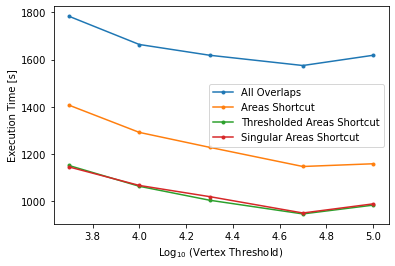

In [1234]:
times_C = [[1618.357495546341,  1574.911672592163,  1618.325813293457,  1663.9141919612885,  1783.6049437522888],
 [1158.7910974025726,  1147.2172889709473,  1228.2636964321136,  1291.6163635253906,  1407.0959587097168],
 [983.6005458831787,  946.3496851921082,  1004.2190542221069,  1063.3370134830475,  1151.4986491203308],
 [988.9933819770813,  950.2832806110382,  1019.4902307987213,  1066.9313139915466,  1145.4294154644012]]
labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
vertex_arr = [100000, 50000, 20000, 10000, 5000]
plt.plot(np.log10(vertex_arr), np.transpose(times_C),'.-')
plt.ylabel('Execution Time [s]')
plt.xlabel('Log$_{10}$ (Vertex Threshold)')
plt.legend(labels);

## Evaluation of Final (revised)

In [13]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, apply_buffer=False):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]], or None
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    apply_buffer: bool, set to True to apply .buffer(0) to all geometries to make them valid (can occasionally drop parts of geometry)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    If areas_in is None, calculate all overlaps
    Relies on geopandas, shapely, pyproj, numpy
    '''
    if gdf1.crs!=gdf2.crs:
        print(f'Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}')
        return None
    
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    # Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if apply_buffer:
        start_time = time.time()
        gdf1['Geometry'] = gdf1['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        start_time = time.time()
        gdf2['Geometry'] = gdf2['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    gdf_appendlist = []
    gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
    project = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg).transform
    gdf1inds = np.array(areas_in)>0 if not areas_in is None else np.full((gdf2.shape[0],gdf1.shape[0]),True)
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        gdf1ind = gdf1inds[i]
        try:
            gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        except (shapely.errors.TopologicalError): # This can occur if a geometry is invalid
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            print(f'WARNING: Output at index {i} invalid due to invalid geometry input.  Re-run with valid geometries.  Possible invalid geometries at gdf2 index {i}, gdf1 indices {np.where(gdf1ind)[0] if sum(gdf1ind)<gdf1.shape[0] else "[all]"}.')
            gdf_tmp = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)]},crs=gdf1.crs)
            #gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
            
        areas_tmp = np.zeros(gdf1.shape[0])
        areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry]
        areas.append(areas_tmp)
        indmax = np.argmax(areas_tmp[gdf1ind])
        gdf_pre.geometry = [gdf_tmp.iloc[indmax]]
        gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]]
        gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_appendlist.append(gdf_pre.copy(deep=True))
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0)
    gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
    gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']

    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

Final (revised) Digital overlap evaluation code:

    g, t, a = loadResults(DIR_RESULTS+'GDF_FSA-DA_D_M2AREA')
    gdf1 = gdf_CA_FSA_Db
    gdf2 = gdf_CA_DA_Db
    keyfield1 = 'CFSAUID'
    keyfield2 = 'DAUID'
    areas_in=None
    verbosity=1
    area_epsg=6931
    apply_buffer=False
    threshold=1e-6
    vertex_limit=20000
    times_D = []

    labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
    areas_arr = [None, a, normalizeAreas(a,threshold=threshold,aslist=True),maximumAreas(a,aslist=True)]
    vertex_arr = [10]

    for label, areas_in in zip(labels,areas_arr):
        ttimes = []
        for vertex_limit in vertex_arr:
            print(f'Running intersectGDF with areas_in: {label}')
            start_time = time.time()
            gdf_joined = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, apply_buffer)
            ttimes.append(time.time()-start_time)
            print()
        times_D.append(ttimes)

    times_D = [x[0] for x in times_D]
    plt.plot(range(len(labels)), np.transpose(times_D),'.-')
    plt.ylabel('Execution Time [s]')
    plt.xlabel('Calculation Mode')
    plt.xticks(ticks=range(len(labels)),labels=labels,rotation=-15);

Final (revised) Digital overlap evaluation code output:

    Running intersectGDF with areas_in: All Overlaps
    Processed row 1/56590 in 0.4 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 1001/56590 in 0.3 sec, 1001 overlaps total in 0d00:05:52, total exceptions 0
    Processed row 2001/56590 in 0.3 sec, 2001 overlaps total in 0d00:13:00, total exceptions 0
    Processed row 3001/56590 in 0.2 sec, 3001 overlaps total in 0d00:20:00, total exceptions 0
    Processed row 4001/56590 in 0.3 sec, 4001 overlaps total in 0d00:26:02, total exceptions 0
    Processed row 5001/56590 in 0.3 sec, 5001 overlaps total in 0d00:31:11, total exceptions 0
    Processed row 6001/56590 in 0.3 sec, 6001 overlaps total in 0d00:35:52, total exceptions 0
    Processed row 7001/56590 in 0.2 sec, 7001 overlaps total in 0d00:40:32, total exceptions 0
    Processed row 8001/56590 in 0.4 sec, 8001 overlaps total in 0d00:45:11, total exceptions 0
    Processed row 9001/56590 in 0.3 sec, 9001 overlaps total in 0d00:49:43, total exceptions 0
    Processed row 10001/56590 in 0.2 sec, 10001 overlaps total in 0d00:54:07, total exceptions 0
    Processed row 11001/56590 in 0.2 sec, 11001 overlaps total in 0d00:58:41, total exceptions 0
    Processed row 12001/56590 in 0.2 sec, 12001 overlaps total in 0d01:02:59, total exceptions 0
    Processed row 13001/56590 in 0.2 sec, 13001 overlaps total in 0d01:07:14, total exceptions 0
    Processed row 14001/56590 in 0.2 sec, 14001 overlaps total in 0d01:11:30, total exceptions 0
    Processed row 15001/56590 in 0.2 sec, 15001 overlaps total in 0d01:15:45, total exceptions 0
    Processed row 16001/56590 in 0.2 sec, 16001 overlaps total in 0d01:20:00, total exceptions 0
    Processed row 17001/56590 in 0.3 sec, 17001 overlaps total in 0d01:24:33, total exceptions 0
    Processed row 18001/56590 in 0.2 sec, 18001 overlaps total in 0d01:29:03, total exceptions 0
    Processed row 19001/56590 in 0.3 sec, 19001 overlaps total in 0d01:33:28, total exceptions 0
    Processed row 20001/56590 in 0.3 sec, 20001 overlaps total in 0d01:37:30, total exceptions 0
    Processed row 21001/56590 in 0.2 sec, 21001 overlaps total in 0d01:41:34, total exceptions 0
    Processed row 22001/56590 in 0.2 sec, 22001 overlaps total in 0d01:45:36, total exceptions 0
    Processed row 23001/56590 in 0.2 sec, 23001 overlaps total in 0d01:49:34, total exceptions 0
    Processed row 24001/56590 in 0.2 sec, 24001 overlaps total in 0d01:53:27, total exceptions 0
    Processed row 25001/56590 in 0.2 sec, 25001 overlaps total in 0d01:57:22, total exceptions 0
    Processed row 26001/56590 in 0.2 sec, 26001 overlaps total in 0d02:01:17, total exceptions 0
    Processed row 27001/56590 in 0.2 sec, 27001 overlaps total in 0d02:05:12, total exceptions 0
    Processed row 28001/56590 in 0.2 sec, 28001 overlaps total in 0d02:09:06, total exceptions 0
    Processed row 29001/56590 in 0.2 sec, 29001 overlaps total in 0d02:13:00, total exceptions 0
    Processed row 30001/56590 in 0.2 sec, 30001 overlaps total in 0d02:16:57, total exceptions 0
    Processed row 31001/56590 in 0.2 sec, 31001 overlaps total in 0d02:20:52, total exceptions 0
    Processed row 32001/56590 in 0.2 sec, 32001 overlaps total in 0d02:24:49, total exceptions 0
    Processed row 33001/56590 in 0.3 sec, 33001 overlaps total in 0d02:28:43, total exceptions 0
    Processed row 34001/56590 in 0.2 sec, 34001 overlaps total in 0d02:32:39, total exceptions 0
    Processed row 35001/56590 in 0.2 sec, 35001 overlaps total in 0d02:36:37, total exceptions 0
    Processed row 36001/56590 in 0.2 sec, 36001 overlaps total in 0d02:40:35, total exceptions 0
    Processed row 37001/56590 in 0.2 sec, 37001 overlaps total in 0d02:44:42, total exceptions 0
    Processed row 38001/56590 in 0.2 sec, 38001 overlaps total in 0d02:48:50, total exceptions 0
    Processed row 39001/56590 in 0.2 sec, 39001 overlaps total in 0d02:53:24, total exceptions 0
    Processed row 40001/56590 in 0.3 sec, 40001 overlaps total in 0d02:58:19, total exceptions 0
    Processed row 41001/56590 in 0.2 sec, 41001 overlaps total in 0d03:03:43, total exceptions 0
    Processed row 42001/56590 in 0.2 sec, 42001 overlaps total in 0d03:09:28, total exceptions 0
    Processed row 43001/56590 in 0.2 sec, 43001 overlaps total in 0d03:15:26, total exceptions 0
    Processed row 44001/56590 in 0.2 sec, 44001 overlaps total in 0d03:20:13, total exceptions 0
    Processed row 45001/56590 in 0.3 sec, 45001 overlaps total in 0d03:24:11, total exceptions 0
    Processed row 46001/56590 in 0.3 sec, 46001 overlaps total in 0d03:28:16, total exceptions 0
    Processed row 47001/56590 in 0.3 sec, 47001 overlaps total in 0d03:33:31, total exceptions 0
    Processed row 48001/56590 in 0.4 sec, 48001 overlaps total in 0d03:37:44, total exceptions 0
    Processed row 49001/56590 in 0.3 sec, 49001 overlaps total in 0d03:41:48, total exceptions 0
    Processed row 50001/56590 in 0.2 sec, 50001 overlaps total in 0d03:46:59, total exceptions 0
    Processed row 51001/56590 in 0.2 sec, 51001 overlaps total in 0d03:51:30, total exceptions 0
    Processed row 52001/56590 in 0.3 sec, 52001 overlaps total in 0d03:56:35, total exceptions 0
    Processed row 53001/56590 in 0.2 sec, 53001 overlaps total in 0d04:01:25, total exceptions 0
    Processed row 54001/56590 in 0.2 sec, 54001 overlaps total in 0d04:06:42, total exceptions 0
    Processed row 55001/56590 in 0.2 sec, 55001 overlaps total in 0d04:10:56, total exceptions 0
    Processed row 56001/56590 in 0.2 sec, 56001 overlaps total in 0d04:15:25, total exceptions 0
    Processed row 56590/56590 in 0.7 sec, 56590 overlaps total in 0d04:18:21, total exceptions 0
    Overlap processing complete

    Running intersectGDF with areas_in: Areas Shortcut
    Processed row 1/56590 in 0.0 sec, 1 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 1001/56590 in 0.0 sec, 1001 overlaps total in 0d00:00:09, total exceptions 0
    Processed row 2001/56590 in 0.0 sec, 2001 overlaps total in 0d00:00:18, total exceptions 0
    Processed row 3001/56590 in 0.0 sec, 3001 overlaps total in 0d00:00:26, total exceptions 0
    Processed row 4001/56590 in 0.0 sec, 4001 overlaps total in 0d00:00:34, total exceptions 0
    Processed row 5001/56590 in 0.0 sec, 5001 overlaps total in 0d00:00:39, total exceptions 0
    Processed row 6001/56590 in 0.0 sec, 6001 overlaps total in 0d00:00:42, total exceptions 0
    Processed row 7001/56590 in 0.0 sec, 7001 overlaps total in 0d00:00:46, total exceptions 0
    Processed row 8001/56590 in 0.0 sec, 8001 overlaps total in 0d00:00:52, total exceptions 0
    Processed row 9001/56590 in 0.0 sec, 9001 overlaps total in 0d00:00:58, total exceptions 0
    Processed row 10001/56590 in 0.0 sec, 10001 overlaps total in 0d00:01:01, total exceptions 0
    Processed row 11001/56590 in 0.0 sec, 11001 overlaps total in 0d00:01:05, total exceptions 0
    Processed row 12001/56590 in 0.0 sec, 12001 overlaps total in 0d00:01:08, total exceptions 0
    Processed row 13001/56590 in 0.0 sec, 13001 overlaps total in 0d00:01:10, total exceptions 0
    Processed row 14001/56590 in 0.0 sec, 14001 overlaps total in 0d00:01:12, total exceptions 0
    Processed row 15001/56590 in 0.0 sec, 15001 overlaps total in 0d00:01:14, total exceptions 0
    Processed row 16001/56590 in 0.0 sec, 16001 overlaps total in 0d00:01:17, total exceptions 0
    Processed row 17001/56590 in 0.0 sec, 17001 overlaps total in 0d00:01:23, total exceptions 0
    Processed row 18001/56590 in 0.0 sec, 18001 overlaps total in 0d00:01:29, total exceptions 0
    Processed row 19001/56590 in 0.0 sec, 19001 overlaps total in 0d00:01:34, total exceptions 0
    Processed row 20001/56590 in 0.0 sec, 20001 overlaps total in 0d00:01:37, total exceptions 0
    Processed row 21001/56590 in 0.0 sec, 21001 overlaps total in 0d00:01:40, total exceptions 0
    Processed row 22001/56590 in 0.0 sec, 22001 overlaps total in 0d00:01:43, total exceptions 0
    Processed row 23001/56590 in 0.0 sec, 23001 overlaps total in 0d00:01:45, total exceptions 0
    Processed row 24001/56590 in 0.0 sec, 24001 overlaps total in 0d00:01:47, total exceptions 0
    Processed row 25001/56590 in 0.0 sec, 25001 overlaps total in 0d00:01:49, total exceptions 0
    Processed row 26001/56590 in 0.0 sec, 26001 overlaps total in 0d00:01:51, total exceptions 0
    Processed row 27001/56590 in 0.0 sec, 27001 overlaps total in 0d00:01:54, total exceptions 0
    Processed row 28001/56590 in 0.0 sec, 28001 overlaps total in 0d00:01:57, total exceptions 0
    Processed row 29001/56590 in 0.0 sec, 29001 overlaps total in 0d00:01:59, total exceptions 0
    Processed row 30001/56590 in 0.0 sec, 30001 overlaps total in 0d00:02:01, total exceptions 0
    Processed row 31001/56590 in 0.0 sec, 31001 overlaps total in 0d00:02:03, total exceptions 0
    Processed row 32001/56590 in 0.0 sec, 32001 overlaps total in 0d00:02:06, total exceptions 0
    Processed row 33001/56590 in 0.0 sec, 33001 overlaps total in 0d00:02:09, total exceptions 0
    Processed row 34001/56590 in 0.0 sec, 34001 overlaps total in 0d00:02:12, total exceptions 0
    Processed row 35001/56590 in 0.0 sec, 35001 overlaps total in 0d00:02:15, total exceptions 0
    Processed row 36001/56590 in 0.0 sec, 36001 overlaps total in 0d00:02:18, total exceptions 0
    Processed row 37001/56590 in 0.0 sec, 37001 overlaps total in 0d00:02:23, total exceptions 0
    Processed row 38001/56590 in 0.0 sec, 38001 overlaps total in 0d00:02:31, total exceptions 0
    Processed row 39001/56590 in 0.0 sec, 39001 overlaps total in 0d00:02:41, total exceptions 0
    Processed row 40001/56590 in 0.0 sec, 40001 overlaps total in 0d00:02:58, total exceptions 0
    Processed row 41001/56590 in 0.0 sec, 41001 overlaps total in 0d00:03:20, total exceptions 0
    Processed row 42001/56590 in 0.0 sec, 42001 overlaps total in 0d00:03:40, total exceptions 0
    Processed row 43001/56590 in 0.0 sec, 43001 overlaps total in 0d00:03:58, total exceptions 0
    Processed row 44001/56590 in 0.0 sec, 44001 overlaps total in 0d00:04:07, total exceptions 0
    Processed row 45001/56590 in 0.0 sec, 45001 overlaps total in 0d00:04:10, total exceptions 0
    Processed row 46001/56590 in 0.0 sec, 46001 overlaps total in 0d00:04:16, total exceptions 0
    Processed row 47001/56590 in 0.0 sec, 47001 overlaps total in 0d00:04:23, total exceptions 0
    Processed row 48001/56590 in 0.0 sec, 48001 overlaps total in 0d00:04:26, total exceptions 0
    Processed row 49001/56590 in 0.0 sec, 49001 overlaps total in 0d00:04:31, total exceptions 0
    Processed row 50001/56590 in 0.0 sec, 50001 overlaps total in 0d00:04:37, total exceptions 0
    Processed row 51001/56590 in 0.0 sec, 51001 overlaps total in 0d00:04:40, total exceptions 0
    Processed row 52001/56590 in 0.0 sec, 52001 overlaps total in 0d00:04:42, total exceptions 0
    Processed row 53001/56590 in 0.0 sec, 53001 overlaps total in 0d00:04:46, total exceptions 0
    Processed row 54001/56590 in 0.0 sec, 54001 overlaps total in 0d00:04:51, total exceptions 0
    Processed row 55001/56590 in 0.0 sec, 55001 overlaps total in 0d00:04:59, total exceptions 0
    Processed row 56001/56590 in 0.0 sec, 56001 overlaps total in 0d00:05:09, total exceptions 0
    Processed row 56590/56590 in 0.1 sec, 56590 overlaps total in 0d00:05:21, total exceptions 0
    Overlap processing complete

    Running intersectGDF with areas_in: Thresholded Areas Shortcut
    Processed row 1/56590 in 0.0 sec, 1 overlaps total in 0d00:00:10, total exceptions 0
    Processed row 1001/56590 in 0.0 sec, 1001 overlaps total in 0d00:00:15, total exceptions 0
    Processed row 2001/56590 in 0.0 sec, 2001 overlaps total in 0d00:00:23, total exceptions 0
    Processed row 3001/56590 in 0.0 sec, 3001 overlaps total in 0d00:00:27, total exceptions 0
    Processed row 4001/56590 in 0.0 sec, 4001 overlaps total in 0d00:00:30, total exceptions 0
    Processed row 5001/56590 in 0.0 sec, 5001 overlaps total in 0d00:00:34, total exceptions 0
    Processed row 6001/56590 in 0.0 sec, 6001 overlaps total in 0d00:00:37, total exceptions 0
    Processed row 7001/56590 in 0.0 sec, 7001 overlaps total in 0d00:00:39, total exceptions 0
    Processed row 8001/56590 in 0.0 sec, 8001 overlaps total in 0d00:00:42, total exceptions 0
    Processed row 9001/56590 in 0.0 sec, 9001 overlaps total in 0d00:00:44, total exceptions 0
    Processed row 10001/56590 in 0.0 sec, 10001 overlaps total in 0d00:00:46, total exceptions 0
    Processed row 11001/56590 in 0.0 sec, 11001 overlaps total in 0d00:00:49, total exceptions 0
    Processed row 12001/56590 in 0.0 sec, 12001 overlaps total in 0d00:00:51, total exceptions 0
    Processed row 13001/56590 in 0.0 sec, 13001 overlaps total in 0d00:00:54, total exceptions 0
    Processed row 14001/56590 in 0.0 sec, 14001 overlaps total in 0d00:00:56, total exceptions 0
    Processed row 15001/56590 in 0.0 sec, 15001 overlaps total in 0d00:00:58, total exceptions 0
    Processed row 16001/56590 in 0.0 sec, 16001 overlaps total in 0d00:01:00, total exceptions 0
    Processed row 17001/56590 in 0.0 sec, 17001 overlaps total in 0d00:01:03, total exceptions 0
    Processed row 18001/56590 in 0.0 sec, 18001 overlaps total in 0d00:01:08, total exceptions 0
    Processed row 19001/56590 in 0.0 sec, 19001 overlaps total in 0d00:01:12, total exceptions 0
    Processed row 20001/56590 in 0.0 sec, 20001 overlaps total in 0d00:01:14, total exceptions 0
    Processed row 21001/56590 in 0.0 sec, 21001 overlaps total in 0d00:01:17, total exceptions 0
    Processed row 22001/56590 in 0.0 sec, 22001 overlaps total in 0d00:01:19, total exceptions 0
    Processed row 23001/56590 in 0.0 sec, 23001 overlaps total in 0d00:01:22, total exceptions 0
    Processed row 24001/56590 in 0.0 sec, 24001 overlaps total in 0d00:01:28, total exceptions 0
    Processed row 25001/56590 in 0.0 sec, 25001 overlaps total in 0d00:01:29, total exceptions 0
    Processed row 26001/56590 in 0.0 sec, 26001 overlaps total in 0d00:01:31, total exceptions 0
    Processed row 27001/56590 in 0.0 sec, 27001 overlaps total in 0d00:01:33, total exceptions 0
    Processed row 28001/56590 in 0.0 sec, 28001 overlaps total in 0d00:01:35, total exceptions 0
    Processed row 29001/56590 in 0.0 sec, 29001 overlaps total in 0d00:01:37, total exceptions 0
    Processed row 30001/56590 in 0.0 sec, 30001 overlaps total in 0d00:01:39, total exceptions 0
    Processed row 31001/56590 in 0.0 sec, 31001 overlaps total in 0d00:01:41, total exceptions 0
    Processed row 32001/56590 in 0.0 sec, 32001 overlaps total in 0d00:01:43, total exceptions 0
    Processed row 33001/56590 in 0.0 sec, 33001 overlaps total in 0d00:01:45, total exceptions 0
    Processed row 34001/56590 in 0.0 sec, 34001 overlaps total in 0d00:01:47, total exceptions 0
    Processed row 35001/56590 in 0.0 sec, 35001 overlaps total in 0d00:01:49, total exceptions 0
    Processed row 36001/56590 in 0.0 sec, 36001 overlaps total in 0d00:01:52, total exceptions 0
    Processed row 37001/56590 in 0.0 sec, 37001 overlaps total in 0d00:01:57, total exceptions 0
    Processed row 38001/56590 in 0.0 sec, 38001 overlaps total in 0d00:02:01, total exceptions 0
    Processed row 39001/56590 in 0.0 sec, 39001 overlaps total in 0d00:02:06, total exceptions 0
    Processed row 40001/56590 in 0.0 sec, 40001 overlaps total in 0d00:02:12, total exceptions 0
    Processed row 41001/56590 in 0.0 sec, 41001 overlaps total in 0d00:02:27, total exceptions 0
    Processed row 42001/56590 in 0.0 sec, 42001 overlaps total in 0d00:02:42, total exceptions 0
    Processed row 43001/56590 in 0.0 sec, 43001 overlaps total in 0d00:03:01, total exceptions 0
    Processed row 44001/56590 in 0.0 sec, 44001 overlaps total in 0d00:03:08, total exceptions 0
    Processed row 45001/56590 in 0.0 sec, 45001 overlaps total in 0d00:03:11, total exceptions 0
    Processed row 46001/56590 in 0.0 sec, 46001 overlaps total in 0d00:03:17, total exceptions 0
    Processed row 47001/56590 in 0.0 sec, 47001 overlaps total in 0d00:03:23, total exceptions 0
    Processed row 48001/56590 in 0.0 sec, 48001 overlaps total in 0d00:03:26, total exceptions 0
    Processed row 49001/56590 in 0.0 sec, 49001 overlaps total in 0d00:03:29, total exceptions 0
    Processed row 50001/56590 in 0.0 sec, 50001 overlaps total in 0d00:03:37, total exceptions 0
    Processed row 51001/56590 in 0.0 sec, 51001 overlaps total in 0d00:03:39, total exceptions 0
    Processed row 52001/56590 in 0.0 sec, 52001 overlaps total in 0d00:03:41, total exceptions 0
    Processed row 53001/56590 in 0.0 sec, 53001 overlaps total in 0d00:03:43, total exceptions 0
    Processed row 54001/56590 in 0.0 sec, 54001 overlaps total in 0d00:03:47, total exceptions 0
    Processed row 55001/56590 in 0.0 sec, 55001 overlaps total in 0d00:03:53, total exceptions 0
    Processed row 56001/56590 in 0.0 sec, 56001 overlaps total in 0d00:03:58, total exceptions 0
    Processed row 56590/56590 in 0.0 sec, 56590 overlaps total in 0d00:04:12, total exceptions 0
    Overlap processing complete

    Running intersectGDF with areas_in: Singular Areas Shortcut
    Processed row 1/56590 in 0.0 sec, 1 overlaps total in 0d00:00:06, total exceptions 0
    Processed row 1001/56590 in 0.0 sec, 1001 overlaps total in 0d00:00:11, total exceptions 0
    Processed row 2001/56590 in 0.0 sec, 2001 overlaps total in 0d00:00:17, total exceptions 0
    Processed row 3001/56590 in 0.0 sec, 3001 overlaps total in 0d00:00:21, total exceptions 0
    Processed row 4001/56590 in 0.0 sec, 4001 overlaps total in 0d00:00:24, total exceptions 0
    Processed row 5001/56590 in 0.0 sec, 5001 overlaps total in 0d00:00:26, total exceptions 0
    Processed row 6001/56590 in 0.0 sec, 6001 overlaps total in 0d00:00:29, total exceptions 0
    Processed row 7001/56590 in 0.0 sec, 7001 overlaps total in 0d00:00:32, total exceptions 0
    Processed row 8001/56590 in 0.0 sec, 8001 overlaps total in 0d00:00:35, total exceptions 0
    Processed row 9001/56590 in 0.0 sec, 9001 overlaps total in 0d00:00:38, total exceptions 0
    Processed row 10001/56590 in 0.0 sec, 10001 overlaps total in 0d00:00:40, total exceptions 0
    Processed row 11001/56590 in 0.0 sec, 11001 overlaps total in 0d00:00:44, total exceptions 0
    Processed row 12001/56590 in 0.0 sec, 12001 overlaps total in 0d00:00:47, total exceptions 0
    Processed row 13001/56590 in 0.0 sec, 13001 overlaps total in 0d00:00:49, total exceptions 0
    Processed row 14001/56590 in 0.0 sec, 14001 overlaps total in 0d00:00:51, total exceptions 0
    Processed row 15001/56590 in 0.0 sec, 15001 overlaps total in 0d00:00:53, total exceptions 0
    Processed row 16001/56590 in 0.0 sec, 16001 overlaps total in 0d00:00:55, total exceptions 0
    Processed row 17001/56590 in 0.0 sec, 17001 overlaps total in 0d00:00:58, total exceptions 0
    Processed row 18001/56590 in 0.0 sec, 18001 overlaps total in 0d00:01:03, total exceptions 0
    Processed row 19001/56590 in 0.0 sec, 19001 overlaps total in 0d00:01:06, total exceptions 0
    Processed row 20001/56590 in 0.0 sec, 20001 overlaps total in 0d00:01:08, total exceptions 0
    Processed row 21001/56590 in 0.0 sec, 21001 overlaps total in 0d00:01:11, total exceptions 0
    Processed row 22001/56590 in 0.0 sec, 22001 overlaps total in 0d00:01:14, total exceptions 0
    Processed row 23001/56590 in 0.0 sec, 23001 overlaps total in 0d00:01:16, total exceptions 0
    Processed row 24001/56590 in 0.0 sec, 24001 overlaps total in 0d00:01:18, total exceptions 0
    Processed row 25001/56590 in 0.0 sec, 25001 overlaps total in 0d00:01:20, total exceptions 0
    Processed row 26001/56590 in 0.0 sec, 26001 overlaps total in 0d00:01:22, total exceptions 0
    Processed row 27001/56590 in 0.0 sec, 27001 overlaps total in 0d00:01:24, total exceptions 0
    Processed row 28001/56590 in 0.0 sec, 28001 overlaps total in 0d00:01:26, total exceptions 0
    Processed row 29001/56590 in 0.0 sec, 29001 overlaps total in 0d00:01:27, total exceptions 0
    Processed row 30001/56590 in 0.0 sec, 30001 overlaps total in 0d00:01:29, total exceptions 0
    Processed row 31001/56590 in 0.0 sec, 31001 overlaps total in 0d00:01:31, total exceptions 0
    Processed row 32001/56590 in 0.0 sec, 32001 overlaps total in 0d00:01:35, total exceptions 0
    Processed row 33001/56590 in 0.0 sec, 33001 overlaps total in 0d00:01:37, total exceptions 0
    Processed row 34001/56590 in 0.0 sec, 34001 overlaps total in 0d00:01:39, total exceptions 0
    Processed row 35001/56590 in 0.0 sec, 35001 overlaps total in 0d00:01:41, total exceptions 0
    Processed row 36001/56590 in 0.0 sec, 36001 overlaps total in 0d00:01:43, total exceptions 0
    Processed row 37001/56590 in 0.0 sec, 37001 overlaps total in 0d00:01:47, total exceptions 0
    Processed row 38001/56590 in 0.0 sec, 38001 overlaps total in 0d00:01:52, total exceptions 0
    Processed row 39001/56590 in 0.0 sec, 39001 overlaps total in 0d00:01:57, total exceptions 0
    Processed row 40001/56590 in 0.0 sec, 40001 overlaps total in 0d00:02:02, total exceptions 0
    Processed row 41001/56590 in 0.0 sec, 41001 overlaps total in 0d00:02:17, total exceptions 0
    Processed row 42001/56590 in 0.0 sec, 42001 overlaps total in 0d00:02:33, total exceptions 0
    Processed row 43001/56590 in 0.0 sec, 43001 overlaps total in 0d00:02:48, total exceptions 0
    Processed row 44001/56590 in 0.0 sec, 44001 overlaps total in 0d00:02:56, total exceptions 0
    Processed row 45001/56590 in 0.0 sec, 45001 overlaps total in 0d00:02:59, total exceptions 0
    Processed row 46001/56590 in 0.0 sec, 46001 overlaps total in 0d00:03:03, total exceptions 0
    Processed row 47001/56590 in 0.0 sec, 47001 overlaps total in 0d00:03:09, total exceptions 0
    Processed row 48001/56590 in 0.0 sec, 48001 overlaps total in 0d00:03:12, total exceptions 0
    Processed row 49001/56590 in 0.0 sec, 49001 overlaps total in 0d00:03:15, total exceptions 0
    Processed row 50001/56590 in 0.0 sec, 50001 overlaps total in 0d00:03:18, total exceptions 0
    Processed row 51001/56590 in 0.0 sec, 51001 overlaps total in 0d00:03:21, total exceptions 0
    Processed row 52001/56590 in 0.0 sec, 52001 overlaps total in 0d00:03:24, total exceptions 0
    Processed row 53001/56590 in 0.0 sec, 53001 overlaps total in 0d00:03:27, total exceptions 0
    Processed row 54001/56590 in 0.0 sec, 54001 overlaps total in 0d00:03:30, total exceptions 0
    Processed row 55001/56590 in 0.0 sec, 55001 overlaps total in 0d00:03:35, total exceptions 0
    Processed row 56001/56590 in 0.0 sec, 56001 overlaps total in 0d00:03:40, total exceptions 0
    Processed row 56590/56590 in 0.0 sec, 56590 overlaps total in 0d00:03:51, total exceptions 0
    Overlap processing complete
    
Results repeated after kernel reset:

    Running intersectGDF with areas_in: All Overlaps
    Processed row 1/56590 in 0.2 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 1001/56590 in 0.1 sec, 1001 overlaps total in 0d00:02:54, total exceptions 0
    Processed row 2001/56590 in 0.1 sec, 2001 overlaps total in 0d00:05:33, total exceptions 0
    Processed row 3001/56590 in 0.1 sec, 3001 overlaps total in 0d00:08:03, total exceptions 0
    Processed row 4001/56590 in 0.1 sec, 4001 overlaps total in 0d00:10:23, total exceptions 0
    Processed row 5001/56590 in 0.1 sec, 5001 overlaps total in 0d00:12:36, total exceptions 0
    Processed row 6001/56590 in 0.1 sec, 6001 overlaps total in 0d00:14:39, total exceptions 0
    Processed row 7001/56590 in 0.1 sec, 7001 overlaps total in 0d00:16:47, total exceptions 0
    Processed row 8001/56590 in 0.1 sec, 8001 overlaps total in 0d00:18:50, total exceptions 0
    Processed row 9001/56590 in 0.1 sec, 9001 overlaps total in 0d00:20:53, total exceptions 0
    Processed row 10001/56590 in 0.1 sec, 10001 overlaps total in 0d00:22:52, total exceptions 0
    Processed row 11001/56590 in 0.1 sec, 11001 overlaps total in 0d00:24:53, total exceptions 0
    Processed row 12001/56590 in 0.1 sec, 12001 overlaps total in 0d00:26:52, total exceptions 0
    Processed row 13001/56590 in 0.1 sec, 13001 overlaps total in 0d00:28:47, total exceptions 0
    Processed row 14001/56590 in 0.1 sec, 14001 overlaps total in 0d00:30:50, total exceptions 0
    Processed row 15001/56590 in 0.1 sec, 15001 overlaps total in 0d00:32:42, total exceptions 0
    Processed row 16001/56590 in 0.1 sec, 16001 overlaps total in 0d00:34:40, total exceptions 0
    Processed row 17001/56590 in 0.1 sec, 17001 overlaps total in 0d00:36:51, total exceptions 0
    Processed row 18001/56590 in 0.1 sec, 18001 overlaps total in 0d00:39:02, total exceptions 0
    Processed row 19001/56590 in 0.1 sec, 19001 overlaps total in 0d00:41:10, total exceptions 0
    Processed row 20001/56590 in 0.1 sec, 20001 overlaps total in 0d00:43:11, total exceptions 0
    Processed row 21001/56590 in 0.1 sec, 21001 overlaps total in 0d00:45:10, total exceptions 0
    Processed row 22001/56590 in 0.1 sec, 22001 overlaps total in 0d00:47:12, total exceptions 0
    Processed row 23001/56590 in 0.1 sec, 23001 overlaps total in 0d00:49:12, total exceptions 0
    Processed row 24001/56590 in 0.1 sec, 24001 overlaps total in 0d00:51:12, total exceptions 0
    Processed row 25001/56590 in 1.3 sec, 25001 overlaps total in 0d00:53:05, total exceptions 0
    Processed row 26001/56590 in 0.1 sec, 26001 overlaps total in 0d00:55:04, total exceptions 0
    Processed row 27001/56590 in 0.1 sec, 27001 overlaps total in 0d00:57:01, total exceptions 0
    Processed row 28001/56590 in 0.1 sec, 28001 overlaps total in 0d00:58:55, total exceptions 0
    Processed row 29001/56590 in 0.1 sec, 29001 overlaps total in 0d01:00:52, total exceptions 0
    Processed row 30001/56590 in 0.1 sec, 30001 overlaps total in 0d01:02:50, total exceptions 0
    Processed row 31001/56590 in 0.1 sec, 31001 overlaps total in 0d01:04:45, total exceptions 0
    Processed row 32001/56590 in 0.1 sec, 32001 overlaps total in 0d01:06:42, total exceptions 0
    Processed row 33001/56590 in 0.1 sec, 33001 overlaps total in 0d01:08:40, total exceptions 0
    Processed row 34001/56590 in 0.1 sec, 34001 overlaps total in 0d01:11:04, total exceptions 0
    Processed row 35001/56590 in 0.2 sec, 35001 overlaps total in 0d01:13:20, total exceptions 0
    Processed row 36001/56590 in 0.1 sec, 36001 overlaps total in 0d01:15:38, total exceptions 0
    Processed row 37001/56590 in 0.2 sec, 37001 overlaps total in 0d01:18:04, total exceptions 0
    Processed row 38001/56590 in 0.2 sec, 38001 overlaps total in 0d01:20:36, total exceptions 0
    Processed row 39001/56590 in 0.2 sec, 39001 overlaps total in 0d01:23:24, total exceptions 0
    Processed row 40001/56590 in 0.3 sec, 40001 overlaps total in 0d01:26:54, total exceptions 0
    Processed row 41001/56590 in 0.1 sec, 41001 overlaps total in 0d01:30:32, total exceptions 0
    Processed row 42001/56590 in 0.2 sec, 42001 overlaps total in 0d01:33:51, total exceptions 0
    Processed row 43001/56590 in 0.2 sec, 43001 overlaps total in 0d01:37:14, total exceptions 0
    Processed row 44001/56590 in 0.2 sec, 44001 overlaps total in 0d01:39:59, total exceptions 0
    Processed row 45001/56590 in 0.1 sec, 45001 overlaps total in 0d01:42:22, total exceptions 0
    Processed row 46001/56590 in 0.2 sec, 46001 overlaps total in 0d01:44:45, total exceptions 0
    Processed row 47001/56590 in 0.1 sec, 47001 overlaps total in 0d01:47:18, total exceptions 0
    Processed row 48001/56590 in 0.2 sec, 48001 overlaps total in 0d01:49:47, total exceptions 0
    Processed row 49001/56590 in 0.2 sec, 49001 overlaps total in 0d01:52:11, total exceptions 0
    Processed row 50001/56590 in 0.1 sec, 50001 overlaps total in 0d01:54:32, total exceptions 0
    Processed row 51001/56590 in 0.1 sec, 51001 overlaps total in 0d01:56:32, total exceptions 0
    Processed row 52001/56590 in 0.1 sec, 52001 overlaps total in 0d01:58:32, total exceptions 0
    Processed row 53001/56590 in 0.1 sec, 53001 overlaps total in 0d02:00:34, total exceptions 0
    Processed row 54001/56590 in 0.1 sec, 54001 overlaps total in 0d02:02:36, total exceptions 0
    Processed row 55001/56590 in 0.1 sec, 55001 overlaps total in 0d02:04:56, total exceptions 0
    Processed row 56001/56590 in 0.1 sec, 56001 overlaps total in 0d02:07:22, total exceptions 0
    Processed row 56590/56590 in 0.3 sec, 56590 overlaps total in 0d02:09:13, total exceptions 0
    Overlap processing complete

    Running intersectGDF with areas_in: Areas Shortcut
    Processed row 1/56590 in 0.0 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 1001/56590 in 0.0 sec, 1001 overlaps total in 0d00:00:05, total exceptions 0
    Processed row 2001/56590 in 0.0 sec, 2001 overlaps total in 0d00:00:09, total exceptions 0
    Processed row 3001/56590 in 0.0 sec, 3001 overlaps total in 0d00:00:13, total exceptions 0
    Processed row 4001/56590 in 0.0 sec, 4001 overlaps total in 0d00:00:16, total exceptions 0
    Processed row 5001/56590 in 0.0 sec, 5001 overlaps total in 0d00:00:20, total exceptions 0
    Processed row 6001/56590 in 0.0 sec, 6001 overlaps total in 0d00:00:22, total exceptions 0
    Processed row 7001/56590 in 0.0 sec, 7001 overlaps total in 0d00:00:25, total exceptions 0
    Processed row 8001/56590 in 0.0 sec, 8001 overlaps total in 0d00:00:27, total exceptions 0
    Processed row 9001/56590 in 0.0 sec, 9001 overlaps total in 0d00:00:31, total exceptions 0
    Processed row 10001/56590 in 0.0 sec, 10001 overlaps total in 0d00:00:33, total exceptions 0
    Processed row 11001/56590 in 0.0 sec, 11001 overlaps total in 0d00:00:35, total exceptions 0
    Processed row 12001/56590 in 0.0 sec, 12001 overlaps total in 0d00:00:37, total exceptions 0
    Processed row 13001/56590 in 0.0 sec, 13001 overlaps total in 0d00:00:39, total exceptions 0
    Processed row 14001/56590 in 0.0 sec, 14001 overlaps total in 0d00:00:41, total exceptions 0
    Processed row 15001/56590 in 0.0 sec, 15001 overlaps total in 0d00:00:43, total exceptions 0
    Processed row 16001/56590 in 0.0 sec, 16001 overlaps total in 0d00:00:46, total exceptions 0
    Processed row 17001/56590 in 0.0 sec, 17001 overlaps total in 0d00:00:49, total exceptions 0
    Processed row 18001/56590 in 0.0 sec, 18001 overlaps total in 0d00:00:54, total exceptions 0
    Processed row 19001/56590 in 0.0 sec, 19001 overlaps total in 0d00:00:59, total exceptions 0
    Processed row 20001/56590 in 0.0 sec, 20001 overlaps total in 0d00:01:02, total exceptions 0
    Processed row 21001/56590 in 0.0 sec, 21001 overlaps total in 0d00:01:05, total exceptions 0
    Processed row 22001/56590 in 0.0 sec, 22001 overlaps total in 0d00:01:07, total exceptions 0
    Processed row 23001/56590 in 0.0 sec, 23001 overlaps total in 0d00:01:10, total exceptions 0
    Processed row 24001/56590 in 0.0 sec, 24001 overlaps total in 0d00:01:14, total exceptions 0
    Processed row 25001/56590 in 0.0 sec, 25001 overlaps total in 0d00:01:16, total exceptions 0
    Processed row 26001/56590 in 0.0 sec, 26001 overlaps total in 0d00:01:18, total exceptions 0
    Processed row 27001/56590 in 0.0 sec, 27001 overlaps total in 0d00:01:20, total exceptions 0
    Processed row 28001/56590 in 0.0 sec, 28001 overlaps total in 0d00:01:22, total exceptions 0
    Processed row 29001/56590 in 0.0 sec, 29001 overlaps total in 0d00:01:24, total exceptions 0
    Processed row 30001/56590 in 0.0 sec, 30001 overlaps total in 0d00:01:26, total exceptions 0
    Processed row 31001/56590 in 0.0 sec, 31001 overlaps total in 0d00:01:29, total exceptions 0
    Processed row 32001/56590 in 0.0 sec, 32001 overlaps total in 0d00:01:32, total exceptions 0
    Processed row 33001/56590 in 0.0 sec, 33001 overlaps total in 0d00:01:34, total exceptions 0
    Processed row 34001/56590 in 0.0 sec, 34001 overlaps total in 0d00:01:36, total exceptions 0
    Processed row 35001/56590 in 0.0 sec, 35001 overlaps total in 0d00:01:40, total exceptions 0
    Processed row 36001/56590 in 0.0 sec, 36001 overlaps total in 0d00:01:43, total exceptions 0
    Processed row 37001/56590 in 0.0 sec, 37001 overlaps total in 0d00:01:46, total exceptions 0
    Processed row 38001/56590 in 0.0 sec, 38001 overlaps total in 0d00:01:51, total exceptions 0
    Processed row 39001/56590 in 0.0 sec, 39001 overlaps total in 0d00:01:56, total exceptions 0
    Processed row 40001/56590 in 0.0 sec, 40001 overlaps total in 0d00:02:12, total exceptions 0
    Processed row 41001/56590 in 0.0 sec, 41001 overlaps total in 0d00:02:27, total exceptions 0
    Processed row 42001/56590 in 0.0 sec, 42001 overlaps total in 0d00:02:43, total exceptions 0
    Processed row 43001/56590 in 0.0 sec, 43001 overlaps total in 0d00:03:00, total exceptions 0
    Processed row 44001/56590 in 0.0 sec, 44001 overlaps total in 0d00:03:09, total exceptions 0
    Processed row 45001/56590 in 0.0 sec, 45001 overlaps total in 0d00:03:12, total exceptions 0
    Processed row 46001/56590 in 0.0 sec, 46001 overlaps total in 0d00:03:16, total exceptions 0
    Processed row 47001/56590 in 0.0 sec, 47001 overlaps total in 0d00:03:22, total exceptions 0
    Processed row 48001/56590 in 0.0 sec, 48001 overlaps total in 0d00:03:24, total exceptions 0
    Processed row 49001/56590 in 0.0 sec, 49001 overlaps total in 0d00:03:27, total exceptions 0
    Processed row 50001/56590 in 0.0 sec, 50001 overlaps total in 0d00:03:31, total exceptions 0
    Processed row 51001/56590 in 0.0 sec, 51001 overlaps total in 0d00:03:33, total exceptions 0
    Processed row 52001/56590 in 0.0 sec, 52001 overlaps total in 0d00:03:35, total exceptions 0
    Processed row 53001/56590 in 0.0 sec, 53001 overlaps total in 0d00:03:37, total exceptions 0
    Processed row 54001/56590 in 0.0 sec, 54001 overlaps total in 0d00:03:40, total exceptions 0
    Processed row 55001/56590 in 0.0 sec, 55001 overlaps total in 0d00:03:46, total exceptions 0
    Processed row 56001/56590 in 0.0 sec, 56001 overlaps total in 0d00:03:52, total exceptions 0
    Processed row 56590/56590 in 0.1 sec, 56590 overlaps total in 0d00:04:06, total exceptions 0
    Overlap processing complete

    Running intersectGDF with areas_in: Thresholded Areas Shortcut
    Processed row 1/56590 in 0.0 sec, 1 overlaps total in 0d00:00:08, total exceptions 0
    Processed row 1001/56590 in 0.0 sec, 1001 overlaps total in 0d00:00:12, total exceptions 0
    Processed row 2001/56590 in 0.0 sec, 2001 overlaps total in 0d00:00:15, total exceptions 0
    Processed row 3001/56590 in 0.0 sec, 3001 overlaps total in 0d00:00:18, total exceptions 0
    Processed row 4001/56590 in 0.0 sec, 4001 overlaps total in 0d00:00:20, total exceptions 0
    Processed row 5001/56590 in 0.0 sec, 5001 overlaps total in 0d00:00:23, total exceptions 0
    Processed row 6001/56590 in 0.0 sec, 6001 overlaps total in 0d00:00:25, total exceptions 0
    Processed row 7001/56590 in 0.0 sec, 7001 overlaps total in 0d00:00:27, total exceptions 0
    Processed row 8001/56590 in 0.0 sec, 8001 overlaps total in 0d00:00:31, total exceptions 0
    Processed row 9001/56590 in 0.0 sec, 9001 overlaps total in 0d00:00:33, total exceptions 0
    Processed row 10001/56590 in 0.0 sec, 10001 overlaps total in 0d00:00:35, total exceptions 0
    Processed row 11001/56590 in 0.0 sec, 11001 overlaps total in 0d00:00:38, total exceptions 0
    Processed row 12001/56590 in 0.0 sec, 12001 overlaps total in 0d00:00:40, total exceptions 0
    Processed row 13001/56590 in 0.0 sec, 13001 overlaps total in 0d00:00:42, total exceptions 0
    Processed row 14001/56590 in 0.0 sec, 14001 overlaps total in 0d00:00:44, total exceptions 0
    Processed row 15001/56590 in 0.0 sec, 15001 overlaps total in 0d00:00:46, total exceptions 0
    Processed row 16001/56590 in 0.0 sec, 16001 overlaps total in 0d00:00:48, total exceptions 0
    Processed row 17001/56590 in 0.0 sec, 17001 overlaps total in 0d00:00:51, total exceptions 0
    Processed row 18001/56590 in 0.0 sec, 18001 overlaps total in 0d00:00:54, total exceptions 0
    Processed row 19001/56590 in 0.0 sec, 19001 overlaps total in 0d00:00:57, total exceptions 0
    Processed row 20001/56590 in 0.0 sec, 20001 overlaps total in 0d00:00:59, total exceptions 0
    Processed row 21001/56590 in 0.0 sec, 21001 overlaps total in 0d00:01:01, total exceptions 0
    Processed row 22001/56590 in 0.0 sec, 22001 overlaps total in 0d00:01:03, total exceptions 0
    Processed row 23001/56590 in 0.0 sec, 23001 overlaps total in 0d00:01:06, total exceptions 0
    Processed row 24001/56590 in 0.0 sec, 24001 overlaps total in 0d00:01:08, total exceptions 0
    Processed row 25001/56590 in 0.0 sec, 25001 overlaps total in 0d00:01:10, total exceptions 0
    Processed row 26001/56590 in 0.0 sec, 26001 overlaps total in 0d00:01:13, total exceptions 0
    Processed row 27001/56590 in 0.0 sec, 27001 overlaps total in 0d00:01:15, total exceptions 0
    Processed row 28001/56590 in 0.0 sec, 28001 overlaps total in 0d00:01:17, total exceptions 0
    Processed row 29001/56590 in 0.0 sec, 29001 overlaps total in 0d00:01:18, total exceptions 0
    Processed row 30001/56590 in 0.0 sec, 30001 overlaps total in 0d00:01:20, total exceptions 0
    Processed row 31001/56590 in 0.0 sec, 31001 overlaps total in 0d00:01:22, total exceptions 0
    Processed row 32001/56590 in 0.0 sec, 32001 overlaps total in 0d00:01:23, total exceptions 0
    Processed row 33001/56590 in 0.0 sec, 33001 overlaps total in 0d00:01:26, total exceptions 0
    Processed row 34001/56590 in 0.0 sec, 34001 overlaps total in 0d00:01:28, total exceptions 0
    Processed row 35001/56590 in 0.0 sec, 35001 overlaps total in 0d00:01:30, total exceptions 0
    Processed row 36001/56590 in 0.0 sec, 36001 overlaps total in 0d00:01:32, total exceptions 0
    Processed row 37001/56590 in 0.0 sec, 37001 overlaps total in 0d00:01:34, total exceptions 0
    Processed row 38001/56590 in 0.0 sec, 38001 overlaps total in 0d00:01:37, total exceptions 0
    Processed row 39001/56590 in 0.0 sec, 39001 overlaps total in 0d00:01:41, total exceptions 0
    Processed row 40001/56590 in 0.0 sec, 40001 overlaps total in 0d00:01:46, total exceptions 0
    Processed row 41001/56590 in 0.0 sec, 41001 overlaps total in 0d00:02:02, total exceptions 0
    Processed row 42001/56590 in 0.0 sec, 42001 overlaps total in 0d00:02:16, total exceptions 0
    Processed row 43001/56590 in 0.0 sec, 43001 overlaps total in 0d00:02:31, total exceptions 0
    Processed row 44001/56590 in 0.0 sec, 44001 overlaps total in 0d00:02:36, total exceptions 0
    Processed row 45001/56590 in 0.0 sec, 45001 overlaps total in 0d00:02:39, total exceptions 0
    Processed row 46001/56590 in 0.0 sec, 46001 overlaps total in 0d00:02:42, total exceptions 0
    Processed row 47001/56590 in 0.0 sec, 47001 overlaps total in 0d00:02:46, total exceptions 0
    Processed row 48001/56590 in 0.0 sec, 48001 overlaps total in 0d00:02:48, total exceptions 0
    Processed row 49001/56590 in 0.0 sec, 49001 overlaps total in 0d00:02:52, total exceptions 0
    Processed row 50001/56590 in 0.0 sec, 50001 overlaps total in 0d00:02:55, total exceptions 0
    Processed row 51001/56590 in 0.0 sec, 51001 overlaps total in 0d00:02:57, total exceptions 0
    Processed row 52001/56590 in 0.0 sec, 52001 overlaps total in 0d00:02:59, total exceptions 0
    Processed row 53001/56590 in 0.0 sec, 53001 overlaps total in 0d00:03:01, total exceptions 0
    Processed row 54001/56590 in 0.0 sec, 54001 overlaps total in 0d00:03:03, total exceptions 0
    Processed row 55001/56590 in 0.0 sec, 55001 overlaps total in 0d00:03:07, total exceptions 0
    Processed row 56001/56590 in 0.0 sec, 56001 overlaps total in 0d00:03:11, total exceptions 0
    Processed row 56590/56590 in 0.0 sec, 56590 overlaps total in 0d00:03:24, total exceptions 0
    Overlap processing complete

    Running intersectGDF with areas_in: Singular Areas Shortcut
    Processed row 1/56590 in 0.0 sec, 1 overlaps total in 0d00:00:06, total exceptions 0
    Processed row 1001/56590 in 0.0 sec, 1001 overlaps total in 0d00:00:10, total exceptions 0
    Processed row 2001/56590 in 0.0 sec, 2001 overlaps total in 0d00:00:13, total exceptions 0
    Processed row 3001/56590 in 0.0 sec, 3001 overlaps total in 0d00:00:17, total exceptions 0
    Processed row 4001/56590 in 0.0 sec, 4001 overlaps total in 0d00:00:19, total exceptions 0
    Processed row 5001/56590 in 0.0 sec, 5001 overlaps total in 0d00:00:21, total exceptions 0
    Processed row 6001/56590 in 0.0 sec, 6001 overlaps total in 0d00:00:23, total exceptions 0
    Processed row 7001/56590 in 0.0 sec, 7001 overlaps total in 0d00:00:25, total exceptions 0
    Processed row 8001/56590 in 0.0 sec, 8001 overlaps total in 0d00:00:28, total exceptions 0
    Processed row 9001/56590 in 0.0 sec, 9001 overlaps total in 0d00:00:30, total exceptions 0
    Processed row 10001/56590 in 0.0 sec, 10001 overlaps total in 0d00:00:32, total exceptions 0
    Processed row 11001/56590 in 0.0 sec, 11001 overlaps total in 0d00:00:34, total exceptions 0
    Processed row 12001/56590 in 0.0 sec, 12001 overlaps total in 0d00:00:36, total exceptions 0
    Processed row 13001/56590 in 0.0 sec, 13001 overlaps total in 0d00:00:37, total exceptions 0
    Processed row 14001/56590 in 0.0 sec, 14001 overlaps total in 0d00:00:40, total exceptions 0
    Processed row 15001/56590 in 0.0 sec, 15001 overlaps total in 0d00:00:41, total exceptions 0
    Processed row 16001/56590 in 0.0 sec, 16001 overlaps total in 0d00:00:43, total exceptions 0
    Processed row 17001/56590 in 0.0 sec, 17001 overlaps total in 0d00:00:46, total exceptions 0
    Processed row 18001/56590 in 0.0 sec, 18001 overlaps total in 0d00:00:49, total exceptions 0
    Processed row 19001/56590 in 0.0 sec, 19001 overlaps total in 0d00:00:51, total exceptions 0
    Processed row 20001/56590 in 0.0 sec, 20001 overlaps total in 0d00:00:53, total exceptions 0
    Processed row 21001/56590 in 0.0 sec, 21001 overlaps total in 0d00:00:55, total exceptions 0
    Processed row 22001/56590 in 0.0 sec, 22001 overlaps total in 0d00:00:59, total exceptions 0
    Processed row 23001/56590 in 0.0 sec, 23001 overlaps total in 0d00:01:01, total exceptions 0
    Processed row 24001/56590 in 0.0 sec, 24001 overlaps total in 0d00:01:04, total exceptions 0
    Processed row 25001/56590 in 0.0 sec, 25001 overlaps total in 0d00:01:06, total exceptions 0
    Processed row 26001/56590 in 0.0 sec, 26001 overlaps total in 0d00:01:08, total exceptions 0
    Processed row 27001/56590 in 0.0 sec, 27001 overlaps total in 0d00:01:09, total exceptions 0
    Processed row 28001/56590 in 0.0 sec, 28001 overlaps total in 0d00:01:11, total exceptions 0
    Processed row 29001/56590 in 0.0 sec, 29001 overlaps total in 0d00:01:13, total exceptions 0
    Processed row 30001/56590 in 0.0 sec, 30001 overlaps total in 0d00:01:15, total exceptions 0
    Processed row 31001/56590 in 0.0 sec, 31001 overlaps total in 0d00:01:17, total exceptions 0
    Processed row 32001/56590 in 0.0 sec, 32001 overlaps total in 0d00:01:21, total exceptions 0
    Processed row 33001/56590 in 0.0 sec, 33001 overlaps total in 0d00:01:23, total exceptions 0
    Processed row 34001/56590 in 0.0 sec, 34001 overlaps total in 0d00:01:25, total exceptions 0
    Processed row 35001/56590 in 0.0 sec, 35001 overlaps total in 0d00:01:27, total exceptions 0
    Processed row 36001/56590 in 0.0 sec, 36001 overlaps total in 0d00:01:30, total exceptions 0
    Processed row 37001/56590 in 0.0 sec, 37001 overlaps total in 0d00:01:32, total exceptions 0
    Processed row 38001/56590 in 0.0 sec, 38001 overlaps total in 0d00:01:35, total exceptions 0
    Processed row 39001/56590 in 0.0 sec, 39001 overlaps total in 0d00:01:39, total exceptions 0
    Processed row 40001/56590 in 0.0 sec, 40001 overlaps total in 0d00:01:42, total exceptions 0
    Processed row 41001/56590 in 0.0 sec, 41001 overlaps total in 0d00:01:59, total exceptions 0
    Processed row 42001/56590 in 0.0 sec, 42001 overlaps total in 0d00:02:15, total exceptions 0
    Processed row 43001/56590 in 0.0 sec, 43001 overlaps total in 0d00:02:29, total exceptions 0
    Processed row 44001/56590 in 0.0 sec, 44001 overlaps total in 0d00:02:34, total exceptions 0
    Processed row 45001/56590 in 0.0 sec, 45001 overlaps total in 0d00:02:36, total exceptions 0
    Processed row 46001/56590 in 0.0 sec, 46001 overlaps total in 0d00:02:41, total exceptions 0
    Processed row 47001/56590 in 0.0 sec, 47001 overlaps total in 0d00:02:45, total exceptions 0
    Processed row 48001/56590 in 0.0 sec, 48001 overlaps total in 0d00:02:47, total exceptions 0
    Processed row 49001/56590 in 0.0 sec, 49001 overlaps total in 0d00:02:50, total exceptions 0
    Processed row 50001/56590 in 0.0 sec, 50001 overlaps total in 0d00:02:53, total exceptions 0
    Processed row 51001/56590 in 0.0 sec, 51001 overlaps total in 0d00:02:56, total exceptions 0
    Processed row 52001/56590 in 0.0 sec, 52001 overlaps total in 0d00:02:58, total exceptions 0
    Processed row 53001/56590 in 0.0 sec, 53001 overlaps total in 0d00:03:01, total exceptions 0
    Processed row 54001/56590 in 0.0 sec, 54001 overlaps total in 0d00:03:03, total exceptions 0
    Processed row 55001/56590 in 0.0 sec, 55001 overlaps total in 0d00:03:08, total exceptions 0
    Processed row 56001/56590 in 0.0 sec, 56001 overlaps total in 0d00:03:13, total exceptions 0
    Processed row 56590/56590 in 0.0 sec, 56590 overlaps total in 0d00:03:24, total exceptions 0
    Overlap processing complete

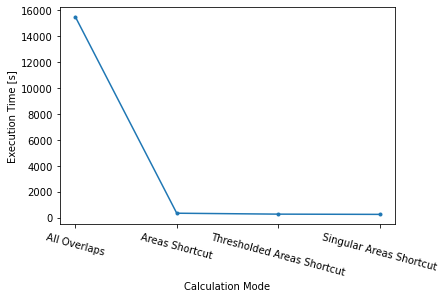

In [1246]:
times_D = [15514.007189273834, 333.5103397369385, 262.33665442466736, 243.68571949005127]
times_D = [7753, 246 , 204, 204] # After kernel reset but not server reset
plt.plot(range(len(labels)), np.transpose(times_D),'.-')
plt.ylabel('Execution Time [s]')
plt.xlabel('Calculation Mode')
plt.xticks(ticks=range(len(labels)),labels=labels,rotation=-15);

Final (revised) Cartographic overlap evaluation code:

    g, t, a = loadResults(DIR_RESULTS+'GDF_FSA-DA_M2AREA')
    gdf1 = gdf_CA_FSAb
    gdf2 = gdf_CA_DAb
    keyfield1 = 'CFSAUID'
    keyfield2 = 'DAUID'
    areas_in=None
    verbosity=1
    area_epsg=6931
    apply_buffer=False
    threshold=1e-6
    vertex_limit=10
    times_C = []

    labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
    areas_arr = [None, a, normalizeAreas(a,threshold=threshold,aslist=True),maximumAreas(a,aslist=True)]
    vertex_arr = [10]

    for label, areas_in in zip(labels,areas_arr):
        ttimes = []
        for vertex_limit in vertex_arr:
            print(f'Running intersectGDF with areas_in: {label}')
            start_time = time.time()
            gdf_joined = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, apply_buffer)
            ttimes.append(time.time()-start_time)
            print()
        times_C.append(ttimes)

    times_C = [x[0] for x in times_C]
    plt.plot(range(len(labels)), np.transpose(times_D),'.-')
    plt.ylabel('Execution Time [s]')
    plt.xlabel('Calculation Mode')
    plt.xticks(ticks=range(len(labels)),labels=labels,rotation=-15);

Final (revised) Cartographic overlap evaluation code output:

    Running intersectGDF with areas_in: All Overlaps
    Processed row 1/56589 in 0.9 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 1001/56589 in 0.4 sec, 1001 overlaps total in 0d00:07:38, total exceptions 0
    Processed row 2001/56589 in 0.3 sec, 2001 overlaps total in 0d00:14:42, total exceptions 0
    Processed row 3001/56589 in 0.3 sec, 3001 overlaps total in 0d00:20:46, total exceptions 0
    Processed row 4001/56589 in 0.3 sec, 4001 overlaps total in 0d00:26:27, total exceptions 0
    Processed row 5001/56589 in 0.4 sec, 5001 overlaps total in 0d00:31:54, total exceptions 0
    Processed row 6001/56589 in 0.3 sec, 6001 overlaps total in 0d00:37:17, total exceptions 0
    Processed row 7001/56589 in 0.3 sec, 7001 overlaps total in 0d00:42:30, total exceptions 0
    Processed row 8001/56589 in 0.3 sec, 8001 overlaps total in 0d00:47:42, total exceptions 0
    Processed row 9001/56589 in 0.3 sec, 9001 overlaps total in 0d00:52:58, total exceptions 0
    Processed row 10001/56589 in 0.3 sec, 10001 overlaps total in 0d00:58:07, total exceptions 0
    Processed row 11001/56589 in 0.3 sec, 11001 overlaps total in 0d01:03:14, total exceptions 0
    Processed row 12001/56589 in 0.4 sec, 12001 overlaps total in 0d01:08:22, total exceptions 0
    Processed row 13001/56589 in 0.3 sec, 13001 overlaps total in 0d01:13:31, total exceptions 0
    Processed row 14001/56589 in 0.4 sec, 14001 overlaps total in 0d01:18:35, total exceptions 0
    Processed row 15001/56589 in 0.4 sec, 15001 overlaps total in 0d01:23:37, total exceptions 0
    Processed row 16001/56589 in 0.3 sec, 16001 overlaps total in 0d01:28:39, total exceptions 0
    Processed row 17001/56589 in 0.4 sec, 17001 overlaps total in 0d01:34:00, total exceptions 0
    Processed row 18001/56589 in 0.4 sec, 18001 overlaps total in 0d01:39:26, total exceptions 0
    Processed row 19001/56589 in 0.3 sec, 19001 overlaps total in 0d01:45:19, total exceptions 0
    Processed row 20001/56589 in 0.3 sec, 20001 overlaps total in 0d01:57:19, total exceptions 0
    Processed row 21001/56589 in 0.3 sec, 21001 overlaps total in 0d02:02:27, total exceptions 0
    Processed row 22001/56589 in 0.3 sec, 22001 overlaps total in 0d02:07:32, total exceptions 0
    Processed row 23001/56589 in 0.3 sec, 23001 overlaps total in 0d02:12:36, total exceptions 0
    Processed row 24001/56589 in 0.3 sec, 24001 overlaps total in 0d02:17:36, total exceptions 0
    Processed row 25001/56589 in 0.3 sec, 25001 overlaps total in 0d02:22:34, total exceptions 0
    Processed row 26001/56589 in 0.3 sec, 26001 overlaps total in 0d02:27:32, total exceptions 0
    Processed row 27001/56589 in 0.3 sec, 27001 overlaps total in 0d02:32:33, total exceptions 0
    Processed row 28001/56589 in 0.4 sec, 28001 overlaps total in 0d02:37:34, total exceptions 0
    Processed row 29001/56589 in 0.3 sec, 29001 overlaps total in 0d02:42:35, total exceptions 0
    Processed row 30001/56589 in 0.3 sec, 30001 overlaps total in 0d02:47:35, total exceptions 0
    Processed row 31001/56589 in 0.3 sec, 31001 overlaps total in 0d02:52:39, total exceptions 0
    Processed row 32001/56589 in 0.3 sec, 32001 overlaps total in 0d02:57:53, total exceptions 0
    Processed row 33001/56589 in 0.3 sec, 33001 overlaps total in 0d03:03:03, total exceptions 0
    Processed row 34001/56589 in 0.3 sec, 34001 overlaps total in 0d03:08:09, total exceptions 0
    Processed row 35001/56589 in 0.3 sec, 35001 overlaps total in 0d03:13:22, total exceptions 0
    Processed row 36001/56589 in 0.3 sec, 36001 overlaps total in 0d03:18:37, total exceptions 0
    Processed row 37001/56589 in 0.3 sec, 37001 overlaps total in 0d03:23:55, total exceptions 0
    Processed row 38001/56589 in 0.5 sec, 38001 overlaps total in 0d03:29:08, total exceptions 0
    Processed row 39001/56589 in 0.3 sec, 39001 overlaps total in 0d03:35:39, total exceptions 0
    Processed row 40001/56589 in 0.4 sec, 40001 overlaps total in 0d03:41:06, total exceptions 0
    Processed row 41001/56589 in 0.3 sec, 41001 overlaps total in 0d03:46:57, total exceptions 0
    Processed row 42001/56589 in 0.3 sec, 42001 overlaps total in 0d03:52:38, total exceptions 0
    Processed row 43001/56589 in 0.3 sec, 43001 overlaps total in 0d03:58:42, total exceptions 0
    Processed row 44001/56589 in 0.3 sec, 44001 overlaps total in 0d04:03:55, total exceptions 0
    Processed row 45001/56589 in 0.3 sec, 45001 overlaps total in 0d04:09:06, total exceptions 0
    Processed row 46001/56589 in 0.4 sec, 46001 overlaps total in 0d04:14:16, total exceptions 0
    Processed row 47001/56589 in 0.3 sec, 47001 overlaps total in 0d04:19:28, total exceptions 0
    Processed row 48001/56589 in 0.3 sec, 48001 overlaps total in 0d04:24:21, total exceptions 0
    Processed row 49001/56589 in 0.4 sec, 49001 overlaps total in 0d04:29:19, total exceptions 0
    Processed row 50001/56589 in 0.3 sec, 50001 overlaps total in 0d04:34:19, total exceptions 0
    Processed row 51001/56589 in 0.3 sec, 51001 overlaps total in 0d04:39:20, total exceptions 0
    Processed row 52001/56589 in 0.3 sec, 52001 overlaps total in 0d04:44:21, total exceptions 0
    Processed row 53001/56589 in 0.3 sec, 53001 overlaps total in 0d04:49:22, total exceptions 0
    Processed row 54001/56589 in 0.3 sec, 54001 overlaps total in 0d04:54:25, total exceptions 0
    Processed row 55001/56589 in 0.3 sec, 55001 overlaps total in 0d05:11:39, total exceptions 0
    Processed row 56001/56589 in 0.4 sec, 56001 overlaps total in 0d09:18:28, total exceptions 0
    Processed row 56589/56589 in 0.5 sec, 56589 overlaps total in 0d19:59:08, total exceptions 0
    Overlap processing complete

    Running intersectGDF with areas_in: Areas Shortcut
    Processed row 1/56589 in 0.0 sec, 1 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 1001/56589 in 0.0 sec, 1001 overlaps total in 0d00:00:24, total exceptions 0
    Processed row 2001/56589 in 0.0 sec, 2001 overlaps total in 0d00:00:46, total exceptions 0
    Processed row 3001/56589 in 0.0 sec, 3001 overlaps total in 0d00:00:57, total exceptions 0
    Processed row 4001/56589 in 0.0 sec, 4001 overlaps total in 0d00:01:03, total exceptions 0
    Processed row 5001/56589 in 0.0 sec, 5001 overlaps total in 0d00:01:11, total exceptions 0
    Processed row 6001/56589 in 0.0 sec, 6001 overlaps total in 0d00:01:14, total exceptions 0
    Processed row 7001/56589 in 0.0 sec, 7001 overlaps total in 0d00:01:17, total exceptions 0
    Processed row 8001/56589 in 0.0 sec, 8001 overlaps total in 0d00:01:20, total exceptions 0
    Processed row 9001/56589 in 0.0 sec, 9001 overlaps total in 0d00:01:23, total exceptions 0
    Processed row 10001/56589 in 0.0 sec, 10001 overlaps total in 0d00:01:26, total exceptions 0
    Processed row 11001/56589 in 0.0 sec, 11001 overlaps total in 0d00:01:29, total exceptions 0
    Processed row 12001/56589 in 0.0 sec, 12001 overlaps total in 0d00:01:31, total exceptions 0
    Processed row 13001/56589 in 0.0 sec, 13001 overlaps total in 0d00:01:33, total exceptions 0
    Processed row 14001/56589 in 0.0 sec, 14001 overlaps total in 0d00:01:35, total exceptions 0
    Processed row 15001/56589 in 0.0 sec, 15001 overlaps total in 0d00:01:37, total exceptions 0
    Processed row 16001/56589 in 0.0 sec, 16001 overlaps total in 0d00:01:39, total exceptions 0
    Processed row 17001/56589 in 0.0 sec, 17001 overlaps total in 0d00:01:43, total exceptions 0
    Processed row 18001/56589 in 0.0 sec, 18001 overlaps total in 0d00:01:49, total exceptions 0
    Processed row 19001/56589 in 0.0 sec, 19001 overlaps total in 0d00:02:19, total exceptions 0
    Processed row 20001/56589 in 0.0 sec, 20001 overlaps total in 0d00:08:39, total exceptions 0
    Processed row 21001/56589 in 0.0 sec, 21001 overlaps total in 0d00:08:43, total exceptions 0
    Processed row 22001/56589 in 0.0 sec, 22001 overlaps total in 0d00:08:46, total exceptions 0
    Processed row 23001/56589 in 0.0 sec, 23001 overlaps total in 0d00:08:49, total exceptions 0
    Processed row 24001/56589 in 0.0 sec, 24001 overlaps total in 0d00:08:51, total exceptions 0
    Processed row 25001/56589 in 0.0 sec, 25001 overlaps total in 0d00:08:54, total exceptions 0
    Processed row 26001/56589 in 0.0 sec, 26001 overlaps total in 0d00:08:55, total exceptions 0
    Processed row 27001/56589 in 0.0 sec, 27001 overlaps total in 0d00:08:57, total exceptions 0
    Processed row 28001/56589 in 0.0 sec, 28001 overlaps total in 0d00:08:59, total exceptions 0
    Processed row 29001/56589 in 0.0 sec, 29001 overlaps total in 0d00:09:01, total exceptions 0
    Processed row 30001/56589 in 0.0 sec, 30001 overlaps total in 0d00:09:03, total exceptions 0
    Processed row 31001/56589 in 0.0 sec, 31001 overlaps total in 0d00:09:05, total exceptions 0
    Processed row 32001/56589 in 0.0 sec, 32001 overlaps total in 0d00:09:08, total exceptions 0
    Processed row 33001/56589 in 0.0 sec, 33001 overlaps total in 0d00:09:10, total exceptions 0
    Processed row 34001/56589 in 0.0 sec, 34001 overlaps total in 0d00:09:13, total exceptions 0
    Processed row 35001/56589 in 0.0 sec, 35001 overlaps total in 0d00:09:16, total exceptions 0
    Processed row 36001/56589 in 0.0 sec, 36001 overlaps total in 0d00:09:26, total exceptions 0
    Processed row 37001/56589 in 0.0 sec, 37001 overlaps total in 0d00:09:32, total exceptions 0
    Processed row 38001/56589 in 0.0 sec, 38001 overlaps total in 0d00:09:38, total exceptions 0
    Processed row 39001/56589 in 0.0 sec, 39001 overlaps total in 0d00:10:21, total exceptions 0
    Processed row 40001/56589 in 0.0 sec, 40001 overlaps total in 0d00:10:48, total exceptions 0
    Processed row 41001/56589 in 0.0 sec, 41001 overlaps total in 0d00:11:06, total exceptions 0
    Processed row 42001/56589 in 0.0 sec, 42001 overlaps total in 0d00:11:17, total exceptions 0
    Processed row 43001/56589 in 0.0 sec, 43001 overlaps total in 0d00:11:33, total exceptions 0
    Processed row 44001/56589 in 0.0 sec, 44001 overlaps total in 0d00:11:40, total exceptions 0
    Processed row 45001/56589 in 0.0 sec, 45001 overlaps total in 0d00:11:46, total exceptions 0
    Processed row 46001/56589 in 0.0 sec, 46001 overlaps total in 0d00:11:51, total exceptions 0
    Processed row 47001/56589 in 0.0 sec, 47001 overlaps total in 0d00:11:56, total exceptions 0
    Processed row 48001/56589 in 0.0 sec, 48001 overlaps total in 0d00:12:00, total exceptions 0
    Processed row 49001/56589 in 0.0 sec, 49001 overlaps total in 0d00:12:04, total exceptions 0
    Processed row 50001/56589 in 0.0 sec, 50001 overlaps total in 0d00:12:07, total exceptions 0
    Processed row 51001/56589 in 0.0 sec, 51001 overlaps total in 0d00:12:10, total exceptions 0
    Processed row 52001/56589 in 0.0 sec, 52001 overlaps total in 0d00:12:13, total exceptions 0
    Processed row 53001/56589 in 0.0 sec, 53001 overlaps total in 0d00:12:18, total exceptions 0
    Processed row 54001/56589 in 0.0 sec, 54001 overlaps total in 0d00:12:21, total exceptions 0
    Processed row 55001/56589 in 0.0 sec, 55001 overlaps total in 0d00:24:52, total exceptions 0
    Processed row 56001/56589 in 0.0 sec, 56001 overlaps total in 0d04:23:36, total exceptions 0
    Processed row 56589/56589 in 0.0 sec, 56589 overlaps total in 0d13:39:44, total exceptions 0
    Overlap processing complete

    Running intersectGDF with areas_in: Thresholded Areas Shortcut
    Processed row 1/56589 in 0.0 sec, 1 overlaps total in 0d00:00:07, total exceptions 0
    Processed row 1001/56589 in 0.0 sec, 1001 overlaps total in 0d00:00:23, total exceptions 0
    Processed row 2001/56589 in 0.0 sec, 2001 overlaps total in 0d00:00:44, total exceptions 0
    Processed row 3001/56589 in 0.0 sec, 3001 overlaps total in 0d00:00:50, total exceptions 0
    Processed row 4001/56589 in 0.0 sec, 4001 overlaps total in 0d00:00:55, total exceptions 0
    Processed row 5001/56589 in 0.0 sec, 5001 overlaps total in 0d00:00:59, total exceptions 0
    Processed row 6001/56589 in 0.0 sec, 6001 overlaps total in 0d00:01:02, total exceptions 0
    Processed row 7001/56589 in 0.0 sec, 7001 overlaps total in 0d00:01:05, total exceptions 0
    Processed row 8001/56589 in 0.0 sec, 8001 overlaps total in 0d00:01:08, total exceptions 0
    Processed row 9001/56589 in 0.0 sec, 9001 overlaps total in 0d00:01:11, total exceptions 0
    Processed row 10001/56589 in 0.0 sec, 10001 overlaps total in 0d00:01:16, total exceptions 0
    Processed row 11001/56589 in 0.0 sec, 11001 overlaps total in 0d00:01:19, total exceptions 0
    Processed row 12001/56589 in 0.0 sec, 12001 overlaps total in 0d00:01:22, total exceptions 0
    Processed row 13001/56589 in 0.0 sec, 13001 overlaps total in 0d00:01:25, total exceptions 0
    Processed row 14001/56589 in 0.0 sec, 14001 overlaps total in 0d00:01:27, total exceptions 0
    Processed row 15001/56589 in 0.0 sec, 15001 overlaps total in 0d00:01:29, total exceptions 0
    Processed row 16001/56589 in 0.0 sec, 16001 overlaps total in 0d00:01:31, total exceptions 0
    Processed row 17001/56589 in 0.0 sec, 17001 overlaps total in 0d00:01:38, total exceptions 0
    Processed row 18001/56589 in 0.0 sec, 18001 overlaps total in 0d00:01:42, total exceptions 0
    Processed row 19001/56589 in 0.0 sec, 19001 overlaps total in 0d00:02:08, total exceptions 0
    Processed row 20001/56589 in 0.0 sec, 20001 overlaps total in 0d00:06:21, total exceptions 0
    Processed row 21001/56589 in 0.0 sec, 21001 overlaps total in 0d00:06:24, total exceptions 0
    Processed row 22001/56589 in 0.0 sec, 22001 overlaps total in 0d00:06:28, total exceptions 0
    Processed row 23001/56589 in 0.0 sec, 23001 overlaps total in 0d00:06:32, total exceptions 0
    Processed row 24001/56589 in 0.0 sec, 24001 overlaps total in 0d00:06:34, total exceptions 0
    Processed row 25001/56589 in 0.0 sec, 25001 overlaps total in 0d00:06:36, total exceptions 0
    Processed row 26001/56589 in 0.0 sec, 26001 overlaps total in 0d00:06:39, total exceptions 0
    Processed row 27001/56589 in 0.0 sec, 27001 overlaps total in 0d00:06:42, total exceptions 0
    Processed row 28001/56589 in 0.0 sec, 28001 overlaps total in 0d00:06:44, total exceptions 0
    Processed row 29001/56589 in 0.0 sec, 29001 overlaps total in 0d00:06:46, total exceptions 0
    Processed row 30001/56589 in 0.0 sec, 30001 overlaps total in 0d00:06:48, total exceptions 0
    Processed row 31001/56589 in 0.0 sec, 31001 overlaps total in 0d00:06:50, total exceptions 0
    Processed row 32001/56589 in 0.0 sec, 32001 overlaps total in 0d00:06:53, total exceptions 0
    Processed row 33001/56589 in 0.0 sec, 33001 overlaps total in 0d00:06:57, total exceptions 0
    Processed row 34001/56589 in 0.0 sec, 34001 overlaps total in 0d00:06:59, total exceptions 0
    Processed row 35001/56589 in 0.0 sec, 35001 overlaps total in 0d00:07:02, total exceptions 0
    Processed row 36001/56589 in 0.0 sec, 36001 overlaps total in 0d00:07:07, total exceptions 0
    Processed row 37001/56589 in 0.0 sec, 37001 overlaps total in 0d00:07:11, total exceptions 0
    Processed row 38001/56589 in 0.1 sec, 38001 overlaps total in 0d00:07:15, total exceptions 0
    Processed row 39001/56589 in 0.0 sec, 39001 overlaps total in 0d00:07:35, total exceptions 0
    Processed row 40001/56589 in 0.0 sec, 40001 overlaps total in 0d00:08:01, total exceptions 0
    Processed row 41001/56589 in 0.0 sec, 41001 overlaps total in 0d00:08:17, total exceptions 0
    Processed row 42001/56589 in 0.0 sec, 42001 overlaps total in 0d00:08:25, total exceptions 0
    Processed row 43001/56589 in 0.0 sec, 43001 overlaps total in 0d00:08:41, total exceptions 0
    Processed row 44001/56589 in 0.0 sec, 44001 overlaps total in 0d00:08:47, total exceptions 0
    Processed row 45001/56589 in 0.0 sec, 45001 overlaps total in 0d00:08:53, total exceptions 0
    Processed row 46001/56589 in 0.0 sec, 46001 overlaps total in 0d00:08:56, total exceptions 0
    Processed row 47001/56589 in 0.0 sec, 47001 overlaps total in 0d00:09:03, total exceptions 0
    Processed row 48001/56589 in 0.0 sec, 48001 overlaps total in 0d00:09:05, total exceptions 0
    Processed row 49001/56589 in 0.0 sec, 49001 overlaps total in 0d00:09:07, total exceptions 0
    Processed row 50001/56589 in 0.0 sec, 50001 overlaps total in 0d00:09:09, total exceptions 0
    Processed row 51001/56589 in 0.0 sec, 51001 overlaps total in 0d00:09:12, total exceptions 0
    Processed row 52001/56589 in 0.0 sec, 52001 overlaps total in 0d00:09:14, total exceptions 0
    Processed row 53001/56589 in 0.0 sec, 53001 overlaps total in 0d00:09:19, total exceptions 0
    Processed row 54001/56589 in 0.0 sec, 54001 overlaps total in 0d00:09:22, total exceptions 0
    Processed row 55001/56589 in 0.0 sec, 55001 overlaps total in 0d00:21:21, total exceptions 0
    Processed row 56001/56589 in 0.0 sec, 56001 overlaps total in 0d04:47:34, total exceptions 0
    Processed row 56589/56589 in 0.0 sec, 56589 overlaps total in 0d15:10:18, total exceptions 0
    Overlap processing complete

    Running intersectGDF with areas_in: Singular Areas Shortcut
    Processed row 1/56589 in 0.0 sec, 1 overlaps total in 0d00:00:05, total exceptions 0
    Processed row 1001/56589 in 0.0 sec, 1001 overlaps total in 0d00:00:20, total exceptions 0
    Processed row 2001/56589 in 0.0 sec, 2001 overlaps total in 0d00:00:35, total exceptions 0
    Processed row 3001/56589 in 0.0 sec, 3001 overlaps total in 0d00:00:41, total exceptions 0
    Processed row 4001/56589 in 0.0 sec, 4001 overlaps total in 0d00:00:45, total exceptions 0
    Processed row 5001/56589 in 0.0 sec, 5001 overlaps total in 0d00:00:49, total exceptions 0
    Processed row 6001/56589 in 0.0 sec, 6001 overlaps total in 0d00:00:51, total exceptions 0
    Processed row 7001/56589 in 0.0 sec, 7001 overlaps total in 0d00:00:54, total exceptions 0
    Processed row 8001/56589 in 0.0 sec, 8001 overlaps total in 0d00:00:57, total exceptions 0
    Processed row 9001/56589 in 0.0 sec, 9001 overlaps total in 0d00:00:59, total exceptions 0
    Processed row 10001/56589 in 0.0 sec, 10001 overlaps total in 0d00:01:02, total exceptions 0
    Processed row 11001/56589 in 0.0 sec, 11001 overlaps total in 0d00:01:03, total exceptions 0
    Processed row 12001/56589 in 0.0 sec, 12001 overlaps total in 0d00:01:05, total exceptions 0
    Processed row 13001/56589 in 0.0 sec, 13001 overlaps total in 0d00:01:07, total exceptions 0
    Processed row 14001/56589 in 0.0 sec, 14001 overlaps total in 0d00:01:09, total exceptions 0
    Processed row 15001/56589 in 0.0 sec, 15001 overlaps total in 0d00:01:11, total exceptions 0
    Processed row 16001/56589 in 0.0 sec, 16001 overlaps total in 0d00:01:13, total exceptions 0
    Processed row 17001/56589 in 0.0 sec, 17001 overlaps total in 0d00:01:18, total exceptions 0
    Processed row 18001/56589 in 0.0 sec, 18001 overlaps total in 0d00:01:21, total exceptions 0
    Processed row 19001/56589 in 0.0 sec, 19001 overlaps total in 0d00:01:45, total exceptions 0
    Processed row 20001/56589 in 0.0 sec, 20001 overlaps total in 0d00:05:16, total exceptions 0
    Processed row 21001/56589 in 0.0 sec, 21001 overlaps total in 0d00:05:18, total exceptions 0
    Processed row 22001/56589 in 0.0 sec, 22001 overlaps total in 0d00:05:21, total exceptions 0
    Processed row 23001/56589 in 0.0 sec, 23001 overlaps total in 0d00:05:23, total exceptions 0
    Processed row 24001/56589 in 0.0 sec, 24001 overlaps total in 0d00:05:25, total exceptions 0
    Processed row 25001/56589 in 0.0 sec, 25001 overlaps total in 0d00:05:26, total exceptions 0
    Processed row 26001/56589 in 0.0 sec, 26001 overlaps total in 0d00:05:28, total exceptions 0
    Processed row 27001/56589 in 0.0 sec, 27001 overlaps total in 0d00:05:30, total exceptions 0
    Processed row 28001/56589 in 0.0 sec, 28001 overlaps total in 0d00:05:31, total exceptions 0
    Processed row 29001/56589 in 0.0 sec, 29001 overlaps total in 0d00:05:33, total exceptions 0
    Processed row 30001/56589 in 0.0 sec, 30001 overlaps total in 0d00:05:36, total exceptions 0
    Processed row 31001/56589 in 0.0 sec, 31001 overlaps total in 0d00:05:38, total exceptions 0
    Processed row 32001/56589 in 0.0 sec, 32001 overlaps total in 0d00:05:40, total exceptions 0
    Processed row 33001/56589 in 0.0 sec, 33001 overlaps total in 0d00:05:42, total exceptions 0
    Processed row 34001/56589 in 0.0 sec, 34001 overlaps total in 0d00:05:45, total exceptions 0
    Processed row 35001/56589 in 0.0 sec, 35001 overlaps total in 0d00:05:47, total exceptions 0
    Processed row 36001/56589 in 0.0 sec, 36001 overlaps total in 0d00:05:52, total exceptions 0
    Processed row 37001/56589 in 0.0 sec, 37001 overlaps total in 0d00:05:56, total exceptions 0
    Processed row 38001/56589 in 0.1 sec, 38001 overlaps total in 0d00:06:00, total exceptions 0
    Processed row 39001/56589 in 0.0 sec, 39001 overlaps total in 0d00:06:15, total exceptions 0
    Processed row 40001/56589 in 0.0 sec, 40001 overlaps total in 0d00:06:40, total exceptions 0
    Processed row 41001/56589 in 0.0 sec, 41001 overlaps total in 0d00:06:53, total exceptions 0
    Processed row 42001/56589 in 0.0 sec, 42001 overlaps total in 0d00:07:02, total exceptions 0
    Processed row 43001/56589 in 0.0 sec, 43001 overlaps total in 0d00:07:16, total exceptions 0
    Processed row 44001/56589 in 0.0 sec, 44001 overlaps total in 0d00:07:21, total exceptions 0
    Processed row 45001/56589 in 0.0 sec, 45001 overlaps total in 0d00:07:25, total exceptions 0
    Processed row 46001/56589 in 0.0 sec, 46001 overlaps total in 0d00:07:27, total exceptions 0
    Processed row 47001/56589 in 0.0 sec, 47001 overlaps total in 0d00:07:31, total exceptions 0
    Processed row 48001/56589 in 0.0 sec, 48001 overlaps total in 0d00:07:33, total exceptions 0
    Processed row 49001/56589 in 0.0 sec, 49001 overlaps total in 0d00:07:36, total exceptions 0
    Processed row 50001/56589 in 0.0 sec, 50001 overlaps total in 0d00:07:38, total exceptions 0
    Processed row 51001/56589 in 0.0 sec, 51001 overlaps total in 0d00:07:41, total exceptions 0
    Processed row 52001/56589 in 0.0 sec, 52001 overlaps total in 0d00:07:43, total exceptions 0
    Processed row 53001/56589 in 0.0 sec, 53001 overlaps total in 0d00:07:47, total exceptions 0
    Processed row 54001/56589 in 0.0 sec, 54001 overlaps total in 0d00:07:50, total exceptions 0
    Processed row 55001/56589 in 0.0 sec, 55001 overlaps total in 0d00:18:20, total exceptions 0
    Processed row 56001/56589 in 0.0 sec, 56001 overlaps total in 0d04:25:09, total exceptions 0
    Processed row 56589/56589 in 0.0 sec, 56589 overlaps total in 0d15:11:39, total exceptions 0
    Overlap processing complete

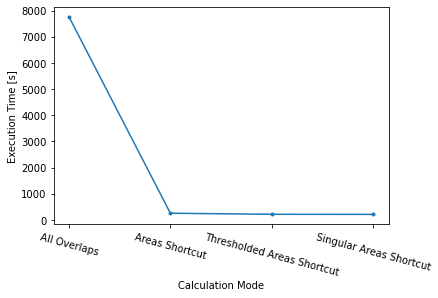

In [18]:
times_C = [71961.47724246979, 49195.27588105202, 54631.0334610939, 54715.60195541382]
labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
plt.plot(range(len(labels)), np.transpose(times_D),'.-')
plt.ylabel('Execution Time [s]')
plt.xlabel('Calculation Mode')
plt.xticks(ticks=range(len(labels)),labels=labels,rotation=-15);

## Evaluation of Final

In [1251]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0], units given by area_epsg
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    '''
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        try:
            gdf_tmp = gdf1['Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b['Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries

        areas.append(gdf_tmp.area)
        indmax = np.argmax(areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[indmax],crs=gdf1['Geometry'].crs)
        gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp,crs=gdf_tmp.crs)
        gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[indmax]
        gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_union = gdf_union.append(gdf_tmp,ignore_index=True)
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

In [1249]:
def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    areas must be supplied, 
    '''
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        try:
            gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
            
        areas_tmp = np.zeros(gdf1.shape[0])
        areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area
        areas.append(areas_tmp)
        ind = np.argmax(gdf_tmp.to_crs(epsg=area_epsg).area) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[ind],crs=gdf1['Geometry'].crs)
        gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp,crs=gdf_tmp.crs)
        gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][ind]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_union = gdf_union.append(gdf_tmp,ignore_index=True)
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

Final Digital overlap evaluation code:

    g, t, a = loadResults(DIR_RESULTS+'GDF_FSA-DA_D_M2AREA')
    gdf1 = gdf_CA_FSA_Db
    gdf2 = gdf_CA_DA_Db
    keyfield1 = 'CFSAUID'
    keyfield2 = 'DAUID'
    areas_in=None
    verbosity=1
    area_epsg=6931
    apply_buffer=False
    threshold=1e-6
    vertex_limit=20000
    times_D = []

    labels = ['All Overlaps','Areas Shortcut','Thresholded Areas Shortcut','Singular Areas Shortcut']
    areas_arr = [None, a, normalizeAreas(a,threshold=threshold,aslist=True),maximumAreas(a,aslist=True)]
    vertex_arr = [10]

    for label, areas_in in zip(labels,areas_arr):
        ttimes = []
        for vertex_limit in vertex_arr:
            print(f'Running intersectGDF with areas_in: {label}')
            start_time = time.time()
            if areas_in is None:
                gdf_joined = intersectGDF(gdf1, keyfield1, gdf2, keyfield2, verbosity, area_epsg, gdf1, gdf2)
            else:
                gdf_joined = intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in, verbosity, area_epsg, gdf1, gdf2)
            ttimes.append(time.time()-start_time)
            print()
        times_D.append(ttimes)

    times_D = [x[0] for x in times_D]
    plt.plot(range(len(labels)), np.transpose(times_D),'.-')
    plt.ylabel('Execution Time [s]')
    plt.xlabel('Calculation Mode')
    plt.xticks(ticks=range(len(labels)),labels=labels,rotation=-15);

Final Digital overlap evaluation code output:

    Running intersectGDF with areas_in: All Overlaps
    Processed row 1/56590, 1 overlap found in 0.5 sec, 1 overlaps total in 00:00:00, total exceptions 0
    Processed row 1001/56590, 1 overlap found in 0.3 sec, 1001 overlaps total in 00:05:41, total exceptions 0
    Processed row 2001/56590, 1 overlap found in 0.3 sec, 2001 overlaps total in 00:11:47, total exceptions 0
    Processed row 3001/56590, 1 overlap found in 0.4 sec, 3001 overlaps total in 00:18:52, total exceptions 0
    Processed row 4001/56590, 1 overlap found in 0.3 sec, 4001 overlaps total in 00:24:48, total exceptions 0
    Processed row 5001/56590, 1 overlap found in 0.2 sec, 5001 overlaps total in 00:30:08, total exceptions 0
    Processed row 6001/56590, 1 overlap found in 0.3 sec, 6001 overlaps total in 00:35:08, total exceptions 0
    Processed row 7001/56590, 1 overlap found in 0.3 sec, 7001 overlaps total in 00:40:01, total exceptions 0
    Processed row 8001/56590, 1 overlap found in 0.3 sec, 8001 overlaps total in 00:44:58, total exceptions 0
    Processed row 9001/56590, 1 overlap found in 0.3 sec, 9001 overlaps total in 00:49:46, total exceptions 0
    <terminated early, system bogged down>

Not evaluated in the interest of time

## Evaluation of Original

In [1253]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0], units given by area_epsg
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    '''
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        try:
            gdf_tmp = gdf1['Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b['Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries

        areas.append(gdf_tmp.to_crs(epsg=area_epsg).area)
        indmax = np.argmax(areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[indmax],crs=gdf1['Geometry'].crs)
        gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp,crs=gdf_tmp.crs)
        gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[indmax]
        gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_union = gdf_union.append(gdf_tmp,ignore_index=True)
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

In [1254]:
def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    areas must be supplied, 
    '''
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        try:
            gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
            
        areas_tmp = np.zeros(gdf1.shape[0])
        areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area
        areas.append(areas_tmp)
        ind = np.argmax(gdf_tmp.to_crs(epsg=area_epsg).area) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[ind],crs=gdf1['Geometry'].crs)
        gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp,crs=gdf_tmp.crs)
        gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][ind]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_union = gdf_union.append(gdf_tmp,ignore_index=True)
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

Not evaluated in the interest of time

## Evaluation of Multiprocess Sjoin/Cut/10k, Process Pool P=10, Divisions D=100

See OverlapDevelopmentMPTest and OverlapDevelopmentMP

In [22]:
gdf_joined, gdf_union, areas = gdf_joined

In [24]:
gdf_union.head()

AttributeError: 'list' object has no attribute 'head'

# Section 0: Initial Development

### Original FSA-DA overlap calculator

This code contains alternate gdf massaging options, along with some comments recording the effects of massaging on execution time.  This naive code ended up executing buffering on all DA geometries each time an intersection calculation failed, which was quite often, and led to very long computation times.  The code retained in the main section is a cleaned up version of this final code which computes buffering once at the beginning of execution, saving a lot of time.

In [ ]:
gdf1 = gdf_CA_FSA.copy(deep=True)
keyfield1 = 'CFSAUID'
gdf2 = gdf_CA_DA.copy(deep=True)
keyfield2 = 'DAUID'

gdf_union = geopandas.GeoDataFrame()
times = []
areas = []

start_time = time.time()

from shapely.geometry import shape, mapping
'''
def _set_precision(coords, precision):
    result = []
    try:
        return round(coords, int(precision))
    except TypeError:
        for coord in coords:
            result.append(_set_precision(coord, precision))
    return result

gdf1['Geometry'] = [shapely.ops.unary_union(g) for g in gdf1['Geometry']]
geo1 = [mapping(g) for g in gdf1['Geometry']]
for g in geo1:
    g['coordinates'] = _set_precision(g['coordinates'],8)
gdf1['Geometry'] = [shape(g) for g in geo1]'''

gdf1['Geometry'] = gdf1['Geometry'].buffer(0)
#gdf1['Geometry'] = [shapely.geometry.MultiPolygon(shapely.ops.polygonize(shapely.ops.unary_union(g))) for g in gdf1['Geometry']]
#gdf1['Geometry'] = [shapely.ops.unary_union(g) for g in gdf1['Geometry'].buffer(0)]
print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
start_time = time.time()
'''
gdf2['Geometry'] = [shapely.ops.unary_union(g) for g in gdf2['Geometry']]
geo2 = [mapping(g) for g in gdf2['Geometry']]
for g in geo2:
    g['coordinates'] = _set_precision(g['coordinates'],8)
gdf2['Geometry'] = [shape(g) for g in geo2]'''

gdf2['Geometry'] = gdf2['Geometry'].buffer(0)
#gdf2['Geometry'] = [shapely.geometry.MultiPolygon(shapely.ops.polygonize(shapely.ops.unary_union(g))) for g in gdf2['Geometry']]
#gdf2['Geometry'] = [shapely.ops.unary_union(g) for g in gdf2['Geometry'].buffer(0)]
print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

# Using unary_union only: [shapely.ops.unary_union(g) for g in gdf1['Geometry']]
# Processed row 1001/56589, 1 overlap found in 0.3 sec, 1001 overlaps total in 00:07:45, total exceptions 1
# Processed row 2001/56589, 1 overlap found in 0.3 sec, 2001 overlaps total in 00:16:04, total exceptions 3
# Processed row 3001/56589, 1 overlap found in 0.3 sec, 3001 overlaps total in 00:21:41, total exceptions 3
# Processed row 4001/56589, 1 overlap found in 0.3 sec, 4001 overlaps total in 00:27:00, total exceptions 3
# Processed row 5001/56589, 1 overlap found in 0.4 sec, 5001 overlaps total in 00:43:14, total exceptions 15
# Processed row 6001/56589, 1 overlap found in 75.4 sec, 6001 overlaps total in 01:25:24, total exceptions 52

# Using polygonize: [shapely.geometry.MultiPolygon(shapely.ops.polygonize(shapely.ops.unary_union(g))) for g in gdf1['Geometry']]
# Polygon conversion for CFSAUID completed in 00:02:07
# Polygon conversion for DAUID completed in 00:01:56
# Processed row 1001/56589, 1 overlap found in 0.3 sec, 1001 overlaps total in 00:28:54, total exceptions 22
# Processed row 2001/56589, 1 overlap found in 0.3 sec, 2001 overlaps total in 00:44:38, total exceptions 32

# Using _set_precision: https://gis.stackexchange.com/questions/188622/rounding-all-coordinates-in-shapely/276512
# Polygon conversion for CFSAUID completed in 00:00:28
# Polygon conversion for DAUID completed in 00:01:21
# Exception at 308, 414, 422,...
# Adding unary_union afterward:
# Polygon conversion for CFSAUID completed in 00:01:26
# Polygon conversion for DAUID completed in 00:01:49
# Exceptions at 414, 532, 890, 
# Processed row 1001/56589, 1 overlap found in 0.4 sec, 1001 overlaps total in 00:07:35, total exceptions 3
# Processed row 2001/56589, 1 overlap found in 0.2 sec, 2001 overlaps total in 00:14:49, total exceptions 6
# Switching order so unary union is first:
# Exceptions at 308, 414, 532, 567, 648...
# Processed row 1001/56589, 1 overlap found in 0.3 sec, 1001 overlaps total in 00:22:10, total exceptions 23

# Using buffered geometry only: gdf1['Geometry'] = gdf1['Geometry'].buffer(0)
# Processed row 1001/56589, 1 overlap found in 0.2 sec, 1001 overlaps total in 00:05:11, total exceptions 0
# Processed row 2001/56589, 1 overlap found in 0.2 sec, 2001 overlaps total in 00:10:10, total exceptions 0


# gdf11 = gdf_CA_FSA.copy(deep=True)
# gdf22 = gdf_CA_DA.copy(deep=True)
# ratio1 = gdf11['Geometry'].area/gdf1['Geometry'].area
# ratio1.unique()
#  array([1.])

exceptioncount = 0
start_time = time.time()
for i in range(gdf2.shape[0]):
    loop_start = time.time()
    # gdf_tmp = geopandas.overlay(gdf1[['Geometry']], gdf2[['Geometry']].iloc[[i],:], how='intersection') # This takes about 50 seconds per execution
    try:
        gdf_tmp = gdf1['Geometry'].intersection(gdf2['Geometry'].iloc[i]) # This takes about 0.3 seconds per execution
    except (shapely.errors.TopologicalError): # This sometimes occurs e.g. index 421/422 calling a self-intersection; not sure what to make of it
        print(f'Handling exception at index {i}')
        exceptioncount += 1
        gdf_tmp = gdf1['Geometry'].buffer(0).intersection(gdf2['Geometry'].iloc[i].buffer(0)) # This takes a long time again, e.g. 52 sec for row 423, but better than failure!
        # Actually, these errors are discussed online, e.g. https://github.com/Toblerity/Shapely/issues/599 and https://stackoverflow.com/questions/35110632/splitting-self-intersecting-polygon-only-returned-one-polygon-in-shapely
        # The errors arise when geometry lines cross when not at a node
        # The buffer(0) trick can actually cause dropping of polygons, hence we use it only as a fallback
        # For example, there were ~29 exceptions in the first 5000/56589 rows of gdf1, roughly doubling the expected computation time from 5 to 10 hours
        # As a solution we perform the unary union on both input datasets before the looped intersection; this takes only ~2 minutes and prevents those errors which double the time
    areas.append(gdf_tmp.area)
    ind = np.argmax(areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
    gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[ind],crs=gdf1['Geometry'].crs)
    gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp,crs=gdf_tmp.crs)
    gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[ind]
    gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
    gdf_union = gdf_union.append(gdf_tmp,ignore_index=True)
    loop_end = time.time()
    times.append(loop_end-loop_start)
    if i%1000==0 or i+1==gdf2.shape[0]:
        print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
print('Overlap processing complete')

In [ ]:
gdf1 = gdf_CA_FSA_D.copy(deep=True)
gdf1b = gdf1.copy(deep=True)
keyfield1 = 'CFSAUID'
gdf2 = gdf_CA_DA_D.copy(deep=True)
gdf2b = gdf2.copy(deep=True)
keyfield2 = 'DAUID'

gdf_union = geopandas.GeoDataFrame()
times = []
areas = []

from shapely.geometry import shape, mapping

start_time = time.time()
gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

start_time = time.time()
gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

exceptioncount = 0
start_time = time.time()
for i in range(gdf2.shape[0]):
    loop_start = time.time()
    try:
        gdf_tmp = gdf1['Geometry'].intersection(gdf2['Geometry'].iloc[i]) # This takes about 0.3 seconds per execution
    except (shapely.errors.TopologicalError): # This sometimes occurs
        #print(f'Handling exception at index {i}')
        exceptioncount += 1
        gdf_tmp = gdf1b['Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # This may corrupt the area but usually works as fast as the original and reliably does not fail

    areas.append(gdf_tmp.area)
    ind = np.argmax(areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
    gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[ind],crs=gdf1['Geometry'].crs)
    gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp,crs=gdf_tmp.crs)
    gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[ind]
    gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
    gdf_union = gdf_union.append(gdf_tmp,ignore_index=True)
    loop_end = time.time()
    times.append(loop_end-loop_start)
    if i%1000==0 or i+1==gdf2.shape[0]:
        print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
print('Overlap processing complete')

# Section 1: Multiprocess Approach To Overlap Calculation

Using the multiprocess module was mildly successful.  Using 10 processes instead of 1, speedup was 20-50%, implying the limiting factor was overhead and dominince of single geometries.  This issue is addressed in the next section.

Index | Description | Time | Notes
---|---|---|---
1-1 | Digital, Single process, all overlaps | 01:57:35 | Original Function
1-2 | Digital, Single process, areas shortcut, no area reacalculation | 00:33:40 | 29% of full execution time
1-3 | Digital, Single process, areas shortcut, $m^2$ area recalculation | 01:46:41 | Even execution time distribution per 1000 DAs
1-4 | Digital, Single process, areas shortcut, sq deg area | 01:54:13 | Even execution time distribution per 1000 DAs, running concurrently with multiprocess calculation
1-5 | Cartographic, Single process, areas shortcut | 14:50:51 | Penultimate interval 3.6 hr, Ultimate interval 9 hr
1-6 | Cartographic, Single process, all overlaps | 17:16:55 | Penultimate interval 3.6 hr, Ultimate interval 11.1 hr, cuts processing time by ~3.5 hours (15%)
1-7 | Cartographic, Single process, all overlaps, buffered input, older? | 22:04:15 | Might be older version or run under higher processor load (28% longer)
1-8 | Cartographic, 10 processes, all overlaps | 15:04:59 | Penultimate interval 5.6 hr, Ultimate interval 7 hr, processor time 1d18:42:22 (2.83x)
1-9 | Digital, 10 processes, all overlaps | 01:10:04 | Processor time 11:09:04 (9.55x)
1-10 | Digital, 10 processes, areas shortcut | 00:44:53 | Processor time 07:06:35, speedup 9.5x

### Code summary

Note that the function executed in another process must be in a separate file from the main code, and the pool creation/execution code must be wrapped in a name==main statement (in Jupyterlab/Jupyter Notebook).

Within testmp.py:

    import multiprocess
    import geopandas
    import shapely
    import time
    import numpy as np
    <Copies of functions extendBound() and intersectGDF()>
    
Within main file:

    import multiprocess
    import testmp
    import time
    import ipypb # Lightweight progress bar, source copied from GitHub
    import geopandas
    DIR_DATA = 'Data/'
    <Copy of GMLtoGDF()>
    <Copy of file loading for gdf_CA_*>
    
    # Example execution definition:
    gdf1 = gdf_CA_FSA
    key1 = 'CFSAUID'
    gdf2 = gdf_CA_DA
    key2 = 'DAUID'
    gdf1b = gdf1.copy(deep=True)
    gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
    gdf2b = gdf2.copy(deep=True)
    gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
    
    # Multiprocessing code:
    if __name__ == '__main__':
        from multiprocessing import get_context

        completed = 0
        N = gdf2.shape[0]
        NUM_PROCESSES = 10
        DIV = 100
        NDIV = N//DIV+(0 if N%DIV==0 else 1)
        results = [None]*NDIV

        start_time = time.time()
        with multiprocess.get_context("spawn").Pool(NUM_PROCESSES) as pool:
            print(f'Generating pool, P={NUM_PROCESSES}, N={N}')
            ret = [pool.apply_async(testmp.intersectGDF,(gdf1,key1,gdf2.iloc[ind*DIV:((ind+1)*DIV if (ind+1)*DIV<N else N),:],key2,0,6931,gdf1b,gdf2b.iloc[ind*DIV:((ind+1)*DIV if (ind+1)*DIV<N else N),:])) for ind in range(NDIV)]
            print('Processing pool')
            for i in ipypb.track(range(NDIV)): # Alternative: initialize pb and call next(pb) in loop, instead of having a while loop to process all updates since last loop
                while True:
                    indb_finished = [r.ready() for r in ret]
                    indb_empty = [r==None for r in results]
                    indb_update = [f and e for f, e in zip(indb_finished, indb_empty)]
                    if any(indb_update):
                        ind_update = indb_update.index(True)
                        results[ind_update] = ret[ind_update].get(999999) # Set finite timeout so that it returns properly
                        completed += 1
                        if completed%10==0 or completed==1 or completed==(NDIV):
                            print(f'Finished {completed}/{NDIV}, wall time {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
                        break
                    time.sleep(5) # Make the infinite loop run slower; might be improved with explicit async

        wall_time = time.time()-start_time
        processor_time = sum([sum(r[1]) for r in results])
        print(f'Pool processing concluded, process count {sum([r!=None for r in results])}/{NDIV}, wall time {time.strftime("%H:%M:%S", time.gmtime(wall_time))}, processor time {time.strftime("%H:%M:%S", time.gmtime(processor_time))}, speedup {processor_time/wall_time:.3}x')
    

### Run Outputs

### (1-1) Digital overlap, Single process, all overlaps

    Polygon conversion for CFSAUID completed in 00:00:01
    Polygon conversion for DAUID completed in 00:00:04
    Processed row 1/56590, 1 overlap found in 0.1 sec, 1 overlaps total in 00:00:00, total exceptions 0
    Processed row 1001/56590, 1 overlap found in 0.1 sec, 1001 overlaps total in 00:02:19, total exceptions 13
    Processed row 2001/56590, 1 overlap found in 0.2 sec, 2001 overlaps total in 00:04:54, total exceptions 17
    Processed row 3001/56590, 1 overlap found in 0.1 sec, 3001 overlaps total in 00:07:22, total exceptions 17
    Processed row 4001/56590, 1 overlap found in 0.1 sec, 4001 overlaps total in 00:09:39, total exceptions 17
    Processed row 5001/56590, 1 overlap found in 0.1 sec, 5001 overlaps total in 00:11:37, total exceptions 35
    Processed row 6001/56590, 1 overlap found in 0.1 sec, 6001 overlaps total in 00:13:30, total exceptions 111
    Processed row 7001/56590, 1 overlap found in 0.1 sec, 7001 overlaps total in 00:15:22, total exceptions 171
    Processed row 8001/56590, 1 overlap found in 0.1 sec, 8001 overlaps total in 00:17:20, total exceptions 171
    Processed row 9001/56590, 1 overlap found in 0.1 sec, 9001 overlaps total in 00:19:15, total exceptions 207
    Processed row 10001/56590, 1 overlap found in 0.1 sec, 10001 overlaps total in 00:21:07, total exceptions 295
    Processed row 11001/56590, 1 overlap found in 0.1 sec, 11001 overlaps total in 00:23:00, total exceptions 472
    Processed row 12001/56590, 1 overlap found in 0.1 sec, 12001 overlaps total in 00:24:52, total exceptions 472
    Processed row 13001/56590, 1 overlap found in 0.1 sec, 13001 overlaps total in 00:26:34, total exceptions 472
    Processed row 14001/56590, 1 overlap found in 0.1 sec, 14001 overlaps total in 00:28:22, total exceptions 472
    Processed row 15001/56590, 1 overlap found in 0.1 sec, 15001 overlaps total in 00:30:08, total exceptions 472
    Processed row 16001/56590, 1 overlap found in 0.1 sec, 16001 overlaps total in 00:31:59, total exceptions 473
    Processed row 17001/56590, 1 overlap found in 0.1 sec, 17001 overlaps total in 00:33:53, total exceptions 474
    Processed row 18001/56590, 1 overlap found in 0.1 sec, 18001 overlaps total in 00:35:58, total exceptions 475
    Processed row 19001/56590, 1 overlap found in 0.1 sec, 19001 overlaps total in 00:37:56, total exceptions 476
    Processed row 20001/56590, 1 overlap found in 0.1 sec, 20001 overlaps total in 00:39:46, total exceptions 476
    Processed row 21001/56590, 1 overlap found in 0.1 sec, 21001 overlaps total in 00:41:31, total exceptions 476
    Processed row 22001/56590, 1 overlap found in 0.2 sec, 22001 overlaps total in 00:43:20, total exceptions 477
    Processed row 23001/56590, 1 overlap found in 0.1 sec, 23001 overlaps total in 00:45:09, total exceptions 477
    Processed row 24001/56590, 1 overlap found in 0.1 sec, 24001 overlaps total in 00:46:58, total exceptions 477
    Processed row 25001/56590, 1 overlap found in 0.1 sec, 25001 overlaps total in 00:48:45, total exceptions 477
    Processed row 26001/56590, 1 overlap found in 0.1 sec, 26001 overlaps total in 00:50:33, total exceptions 477
    Processed row 27001/56590, 1 overlap found in 0.1 sec, 27001 overlaps total in 00:52:22, total exceptions 478
    Processed row 28001/56590, 1 overlap found in 0.1 sec, 28001 overlaps total in 00:54:09, total exceptions 479
    Processed row 29001/56590, 1 overlap found in 0.1 sec, 29001 overlaps total in 00:55:56, total exceptions 479
    Processed row 30001/56590, 1 overlap found in 0.1 sec, 30001 overlaps total in 00:57:42, total exceptions 479
    Processed row 31001/56590, 1 overlap found in 0.1 sec, 31001 overlaps total in 00:59:31, total exceptions 479
    Processed row 32001/56590, 1 overlap found in 0.1 sec, 32001 overlaps total in 01:01:25, total exceptions 479
    Processed row 33001/56590, 1 overlap found in 0.1 sec, 33001 overlaps total in 01:03:15, total exceptions 480
    Processed row 34001/56590, 1 overlap found in 0.1 sec, 34001 overlaps total in 01:05:06, total exceptions 480
    Processed row 35001/56590, 1 overlap found in 0.1 sec, 35001 overlaps total in 01:07:06, total exceptions 481
    Processed row 36001/56590, 1 overlap found in 0.1 sec, 36001 overlaps total in 01:09:03, total exceptions 484
    Processed row 37001/56590, 1 overlap found in 0.1 sec, 37001 overlaps total in 01:11:06, total exceptions 517
    Processed row 38001/56590, 1 overlap found in 0.1 sec, 38001 overlaps total in 01:13:13, total exceptions 607
    Processed row 39001/56590, 1 overlap found in 0.1 sec, 39001 overlaps total in 01:15:33, total exceptions 747
    Processed row 40001/56590, 1 overlap found in 0.2 sec, 40001 overlaps total in 01:18:16, total exceptions 876
    Processed row 41001/56590, 1 overlap found in 0.1 sec, 41001 overlaps total in 01:21:24, total exceptions 1118
    Processed row 42001/56590, 1 overlap found in 0.1 sec, 42001 overlaps total in 01:24:29, total exceptions 1190
    Processed row 43001/56590, 1 overlap found in 0.1 sec, 43001 overlaps total in 01:27:36, total exceptions 1236
    Processed row 44001/56590, 1 overlap found in 0.1 sec, 44001 overlaps total in 01:30:12, total exceptions 1320
    Processed row 45001/56590, 1 overlap found in 0.1 sec, 45001 overlaps total in 01:32:26, total exceptions 1354
    Processed row 46001/56590, 1 overlap found in 0.2 sec, 46001 overlaps total in 01:34:42, total exceptions 1355
    Processed row 47001/56590, 1 overlap found in 0.1 sec, 47001 overlaps total in 01:37:05, total exceptions 1356
    Processed row 48001/56590, 1 overlap found in 0.1 sec, 48001 overlaps total in 01:39:18, total exceptions 1359
    Processed row 49001/56590, 1 overlap found in 0.2 sec, 49001 overlaps total in 01:41:24, total exceptions 1361
    Processed row 50001/56590, 1 overlap found in 0.1 sec, 50001 overlaps total in 01:43:32, total exceptions 1364
    Processed row 51001/56590, 1 overlap found in 0.1 sec, 51001 overlaps total in 01:45:23, total exceptions 1364
    Processed row 52001/56590, 1 overlap found in 0.1 sec, 52001 overlaps total in 01:47:14, total exceptions 1364
    Processed row 53001/56590, 1 overlap found in 0.1 sec, 53001 overlaps total in 01:49:13, total exceptions 1364
    Processed row 54001/56590, 1 overlap found in 0.1 sec, 54001 overlaps total in 01:51:15, total exceptions 1365
    Processed row 55001/56590, 1 overlap found in 0.1 sec, 55001 overlaps total in 01:53:22, total exceptions 1365
    Processed row 56001/56590, 1 overlap found in 0.1 sec, 56001 overlaps total in 01:55:39, total exceptions 1366
    Processed row 56590/56590, 1 overlap found in 0.3 sec, 56590 overlaps total in 01:57:35, total exceptions 1368
    Overlap processing complete

### (1-2) Digital overlap, Single process, using areas shortcut

    Processed row 56590/56590, 56590 overlaps total in 00:33:40, total exceptions 618, 29% of full execution time
Equality of reconstruction verified with all(gdf_union==gdf_union_areas) $\rightarrow$ True (variable versioning to allow this not shown).

### (1-3) Digital overlap, Single process, using areas shortcut, square meters area

    gdf_fsa = gdf_CA_FSA_D
    key_fsa = 'CFSAUID'
    gdf_da  = gdf_CA_DA_D
    key_da  = 'DAUID'
    gdf_union, times, areas = loadResults(DIR_RESULTS+'GDF_FSA-DA_D')
    gdf_union, times, areas = intersectGDFareas(gdf_fsa,key_fsa,gdf_da,key_da,areas_in=areas,verbosity=1)
    saveResults(DIR_RESULTS+'GDF_FSA-DA_D_M2AREA',gdf_union, times, areas)

    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:04
    Processed row 1/56590, 1 overlap found in 0.1 sec, 1 overlaps total in 00:00:00, total exceptions 0
    Processed row 1001/56590, 1 overlap found in 0.1 sec, 1001 overlaps total in 00:01:55, total exceptions 9
    Processed row 2001/56590, 1 overlap found in 0.1 sec, 2001 overlaps total in 00:04:03, total exceptions 13
    Processed row 3001/56590, 1 overlap found in 0.1 sec, 3001 overlaps total in 00:06:15, total exceptions 13
    Processed row 4001/56590, 1 overlap found in 0.1 sec, 4001 overlaps total in 00:08:23, total exceptions 13
    Processed row 5001/56590, 1 overlap found in 0.1 sec, 5001 overlaps total in 00:10:17, total exceptions 18
    Processed row 6001/56590, 1 overlap found in 0.1 sec, 6001 overlaps total in 00:12:05, total exceptions 47
    Processed row 7001/56590, 1 overlap found in 0.1 sec, 7001 overlaps total in 00:13:56, total exceptions 71
    Processed row 8001/56590, 1 overlap found in 0.1 sec, 8001 overlaps total in 00:15:46, total exceptions 71
    Processed row 9001/56590, 1 overlap found in 0.1 sec, 9001 overlaps total in 00:17:34, total exceptions 81
    Processed row 10001/56590, 1 overlap found in 0.1 sec, 10001 overlaps total in 00:19:21, total exceptions 137
    Processed row 11001/56590, 1 overlap found in 0.1 sec, 11001 overlaps total in 00:21:08, total exceptions 199
    Processed row 12001/56590, 1 overlap found in 0.1 sec, 12001 overlaps total in 00:22:55, total exceptions 199
    Processed row 13001/56590, 1 overlap found in 0.1 sec, 13001 overlaps total in 00:24:42, total exceptions 199
    Processed row 14001/56590, 1 overlap found in 0.1 sec, 14001 overlaps total in 00:26:29, total exceptions 199
    Processed row 15001/56590, 1 overlap found in 0.1 sec, 15001 overlaps total in 00:28:17, total exceptions 199
    Processed row 16001/56590, 1 overlap found in 0.1 sec, 16001 overlaps total in 00:30:05, total exceptions 200
    Processed row 17001/56590, 1 overlap found in 0.1 sec, 17001 overlaps total in 00:31:53, total exceptions 201
    Processed row 18001/56590, 1 overlap found in 0.1 sec, 18001 overlaps total in 00:33:44, total exceptions 202
    Processed row 19001/56590, 1 overlap found in 0.1 sec, 19001 overlaps total in 00:35:34, total exceptions 203
    Processed row 20001/56590, 1 overlap found in 0.1 sec, 20001 overlaps total in 00:37:26, total exceptions 203
    Processed row 21001/56590, 1 overlap found in 0.1 sec, 21001 overlaps total in 00:39:14, total exceptions 203
    Processed row 22001/56590, 1 overlap found in 0.1 sec, 22001 overlaps total in 00:41:02, total exceptions 204
    Processed row 23001/56590, 1 overlap found in 0.1 sec, 23001 overlaps total in 00:42:51, total exceptions 204
    Processed row 24001/56590, 1 overlap found in 0.1 sec, 24001 overlaps total in 00:44:39, total exceptions 204
    Processed row 25001/56590, 1 overlap found in 0.1 sec, 25001 overlaps total in 00:46:27, total exceptions 204
    Processed row 26001/56590, 1 overlap found in 0.1 sec, 26001 overlaps total in 00:48:18, total exceptions 204
    Processed row 27001/56590, 1 overlap found in 0.1 sec, 27001 overlaps total in 00:50:06, total exceptions 205
    Processed row 28001/56590, 1 overlap found in 0.1 sec, 28001 overlaps total in 00:51:54, total exceptions 206
    Processed row 29001/56590, 1 overlap found in 0.1 sec, 29001 overlaps total in 00:53:43, total exceptions 206
    Processed row 30001/56590, 1 overlap found in 0.1 sec, 30001 overlaps total in 00:55:30, total exceptions 206
    Processed row 31001/56590, 1 overlap found in 0.1 sec, 31001 overlaps total in 00:57:19, total exceptions 206
    Processed row 32001/56590, 1 overlap found in 0.1 sec, 32001 overlaps total in 00:59:08, total exceptions 206
    Processed row 33001/56590, 1 overlap found in 0.1 sec, 33001 overlaps total in 01:00:57, total exceptions 207
    Processed row 34001/56590, 1 overlap found in 0.1 sec, 34001 overlaps total in 01:02:47, total exceptions 207
    Processed row 35001/56590, 1 overlap found in 0.1 sec, 35001 overlaps total in 01:04:36, total exceptions 208
    Processed row 36001/56590, 1 overlap found in 0.1 sec, 36001 overlaps total in 01:06:25, total exceptions 209
    Processed row 37001/56590, 1 overlap found in 0.1 sec, 37001 overlaps total in 01:08:15, total exceptions 231
    Processed row 38001/56590, 1 overlap found in 0.1 sec, 38001 overlaps total in 01:10:07, total exceptions 276
    Processed row 39001/56590, 1 overlap found in 0.1 sec, 39001 overlaps total in 01:12:00, total exceptions 355
    Processed row 40001/56590, 1 overlap found in 0.1 sec, 40001 overlaps total in 01:14:05, total exceptions 415
    Processed row 41001/56590, 1 overlap found in 0.1 sec, 41001 overlaps total in 01:16:11, total exceptions 473
    Processed row 42001/56590, 1 overlap found in 0.1 sec, 42001 overlaps total in 01:18:17, total exceptions 531
    Processed row 43001/56590, 1 overlap found in 0.1 sec, 43001 overlaps total in 01:20:22, total exceptions 551
    Processed row 44001/56590, 1 overlap found in 0.1 sec, 44001 overlaps total in 01:22:20, total exceptions 582
    Processed row 45001/56590, 1 overlap found in 0.1 sec, 45001 overlaps total in 01:24:13, total exceptions 605
    Processed row 46001/56590, 1 overlap found in 0.2 sec, 46001 overlaps total in 01:26:10, total exceptions 606
    Processed row 47001/56590, 1 overlap found in 0.1 sec, 47001 overlaps total in 01:28:06, total exceptions 607
    Processed row 48001/56590, 1 overlap found in 0.1 sec, 48001 overlaps total in 01:30:00, total exceptions 610
    Processed row 49001/56590, 1 overlap found in 0.1 sec, 49001 overlaps total in 01:31:56, total exceptions 612
    Processed row 50001/56590, 1 overlap found in 0.1 sec, 50001 overlaps total in 01:33:51, total exceptions 615
    Processed row 51001/56590, 1 overlap found in 0.1 sec, 51001 overlaps total in 01:35:47, total exceptions 615
    Processed row 52001/56590, 1 overlap found in 0.1 sec, 52001 overlaps total in 01:37:40, total exceptions 615
    Processed row 53001/56590, 1 overlap found in 0.1 sec, 53001 overlaps total in 01:39:35, total exceptions 615
    Processed row 54001/56590, 1 overlap found in 0.1 sec, 54001 overlaps total in 01:41:29, total exceptions 616
    Processed row 55001/56590, 1 overlap found in 0.2 sec, 55001 overlaps total in 01:43:29, total exceptions 616
    Processed row 56001/56590, 1 overlap found in 0.1 sec, 56001 overlaps total in 01:45:26, total exceptions 617
    Processed row 56590/56590, 1 overlap found in 0.2 sec, 56590 overlaps total in 01:46:41, total exceptions 618

### (1-4) Digital overlap, Single process, using areas shortcut, without square meter conversion (but with to_crs computation?)

    gdf_fsa = gdf_CA_FSA_D
    key_fsa = 'CFSAUID'
    gdf_da  = gdf_CA_DA_D
    key_da  = 'DAUID'
    gdf_union, times, areas = loadResults(DIR_RESULTS+'GDF_FSA-DA_D')
    gdf_union, times, areas = intersectGDFareas(gdf_fsa,key_fsa,gdf_da,key_da,areas_in=areas,verbosity=1)
    saveResults(DIR_RESULTS+'GDF_FSA-DA_D_v2',gdf_union, times, areas)
    
    Polygon conversion for CFSAUID completed in 00:00:04
    Polygon conversion for DAUID completed in 00:00:11
    Processed row 1/56590, 1 overlap found in 0.1 sec, 1 overlaps total in 00:00:00, total exceptions 0
    Processed row 1001/56590, 1 overlap found in 0.1 sec, 1001 overlaps total in 00:01:59, total exceptions 9
    Processed row 2001/56590, 1 overlap found in 0.1 sec, 2001 overlaps total in 00:03:43, total exceptions 13
    Processed row 3001/56590, 1 overlap found in 0.1 sec, 3001 overlaps total in 00:05:34, total exceptions 13
    Processed row 4001/56590, 1 overlap found in 0.1 sec, 4001 overlaps total in 00:07:29, total exceptions 13
    Processed row 5001/56590, 1 overlap found in 0.1 sec, 5001 overlaps total in 00:09:17, total exceptions 18
    Processed row 6001/56590, 1 overlap found in 0.1 sec, 6001 overlaps total in 00:11:32, total exceptions 47
    Processed row 7001/56590, 1 overlap found in 0.1 sec, 7001 overlaps total in 00:13:35, total exceptions 71
    Processed row 8001/56590, 1 overlap found in 0.1 sec, 8001 overlaps total in 00:15:25, total exceptions 71
    Processed row 9001/56590, 1 overlap found in 0.2 sec, 9001 overlaps total in 00:17:18, total exceptions 81
    Processed row 10001/56590, 1 overlap found in 0.1 sec, 10001 overlaps total in 00:19:16, total exceptions 137
    Processed row 11001/56590, 1 overlap found in 0.2 sec, 11001 overlaps total in 00:21:26, total exceptions 199
    Processed row 12001/56590, 1 overlap found in 0.1 sec, 12001 overlaps total in 00:23:31, total exceptions 199
    Processed row 13001/56590, 1 overlap found in 0.1 sec, 13001 overlaps total in 00:25:29, total exceptions 199
    Processed row 14001/56590, 1 overlap found in 0.1 sec, 14001 overlaps total in 00:27:31, total exceptions 199
    Processed row 15001/56590, 1 overlap found in 0.1 sec, 15001 overlaps total in 00:29:29, total exceptions 199
    Processed row 16001/56590, 1 overlap found in 0.1 sec, 16001 overlaps total in 00:31:26, total exceptions 200
    Processed row 17001/56590, 1 overlap found in 0.1 sec, 17001 overlaps total in 00:33:21, total exceptions 201
    Processed row 18001/56590, 1 overlap found in 0.1 sec, 18001 overlaps total in 00:35:15, total exceptions 202
    Processed row 19001/56590, 1 overlap found in 0.1 sec, 19001 overlaps total in 00:37:10, total exceptions 203
    Processed row 20001/56590, 1 overlap found in 0.1 sec, 20001 overlaps total in 00:39:04, total exceptions 203
    Processed row 21001/56590, 1 overlap found in 0.1 sec, 21001 overlaps total in 00:41:07, total exceptions 203
    Processed row 22001/56590, 1 overlap found in 0.1 sec, 22001 overlaps total in 00:43:10, total exceptions 204
    Processed row 23001/56590, 1 overlap found in 0.1 sec, 23001 overlaps total in 00:45:06, total exceptions 204
    Processed row 24001/56590, 1 overlap found in 0.1 sec, 24001 overlaps total in 00:47:03, total exceptions 204
    Processed row 25001/56590, 1 overlap found in 0.1 sec, 25001 overlaps total in 00:49:05, total exceptions 204
    Processed row 26001/56590, 1 overlap found in 0.1 sec, 26001 overlaps total in 00:51:05, total exceptions 204
    Processed row 27001/56590, 1 overlap found in 0.2 sec, 27001 overlaps total in 00:53:00, total exceptions 205
    Processed row 28001/56590, 1 overlap found in 0.1 sec, 28001 overlaps total in 00:54:55, total exceptions 206
    Processed row 29001/56590, 1 overlap found in 0.1 sec, 29001 overlaps total in 00:56:55, total exceptions 206
    Processed row 30001/56590, 1 overlap found in 0.1 sec, 30001 overlaps total in 00:58:58, total exceptions 206
    Processed row 31001/56590, 1 overlap found in 0.1 sec, 31001 overlaps total in 01:00:56, total exceptions 206
    Processed row 32001/56590, 1 overlap found in 0.1 sec, 32001 overlaps total in 01:02:51, total exceptions 206
    Processed row 33001/56590, 1 overlap found in 0.1 sec, 33001 overlaps total in 01:04:50, total exceptions 207
    Processed row 34001/56590, 1 overlap found in 0.1 sec, 34001 overlaps total in 01:06:52, total exceptions 207
    Processed row 35001/56590, 1 overlap found in 0.1 sec, 35001 overlaps total in 01:08:50, total exceptions 208
    Processed row 36001/56590, 1 overlap found in 0.1 sec, 36001 overlaps total in 01:10:49, total exceptions 209
    Processed row 37001/56590, 1 overlap found in 0.1 sec, 37001 overlaps total in 01:12:50, total exceptions 231
    Processed row 38001/56590, 1 overlap found in 0.1 sec, 38001 overlaps total in 01:14:50, total exceptions 276
    Processed row 39001/56590, 1 overlap found in 0.1 sec, 39001 overlaps total in 01:16:53, total exceptions 355
    Processed row 40001/56590, 1 overlap found in 0.2 sec, 40001 overlaps total in 01:19:10, total exceptions 415
    Processed row 41001/56590, 1 overlap found in 0.1 sec, 41001 overlaps total in 01:21:25, total exceptions 473
    Processed row 42001/56590, 1 overlap found in 0.1 sec, 42001 overlaps total in 01:23:49, total exceptions 531
    Processed row 43001/56590, 1 overlap found in 0.1 sec, 43001 overlaps total in 01:26:05, total exceptions 551
    Processed row 44001/56590, 1 overlap found in 0.1 sec, 44001 overlaps total in 01:28:14, total exceptions 582
    Processed row 45001/56590, 1 overlap found in 0.1 sec, 45001 overlaps total in 01:30:11, total exceptions 605
    Processed row 46001/56590, 1 overlap found in 0.2 sec, 46001 overlaps total in 01:32:07, total exceptions 606
    Processed row 47001/56590, 1 overlap found in 0.1 sec, 47001 overlaps total in 01:34:13, total exceptions 607
    Processed row 48001/56590, 1 overlap found in 0.1 sec, 48001 overlaps total in 01:36:14, total exceptions 610
    Processed row 49001/56590, 1 overlap found in 0.1 sec, 49001 overlaps total in 01:38:13, total exceptions 612
    Processed row 50001/56590, 1 overlap found in 0.1 sec, 50001 overlaps total in 01:40:13, total exceptions 615
    Processed row 51001/56590, 1 overlap found in 0.1 sec, 51001 overlaps total in 01:42:14, total exceptions 615
    Processed row 52001/56590, 1 overlap found in 0.1 sec, 52001 overlaps total in 01:44:18, total exceptions 615
    Processed row 53001/56590, 1 overlap found in 0.2 sec, 53001 overlaps total in 01:46:19, total exceptions 615
    Processed row 54001/56590, 1 overlap found in 0.1 sec, 54001 overlaps total in 01:48:21, total exceptions 616
    Processed row 55001/56590, 1 overlap found in 0.2 sec, 55001 overlaps total in 01:50:36, total exceptions 616
    Processed row 56001/56590, 1 overlap found in 0.1 sec, 56001 overlaps total in 01:52:49, total exceptions 617
    Processed row 56590/56590, 1 overlap found in 0.2 sec, 56590 overlaps total in 01:54:13, total exceptions 618

### (1-5) Cartographic overlap, Single process, using areas shortcut

    gdf_fsa = gdf_CA_FSA
    key_fsa = 'CFSAUID'
    gdf_da  = gdf_CA_DA
    key_da  = 'DAUID'
    gdf_union, times, areas = loadResults(DIR_RESULTS+'GDF_FSA-DA')
    gdf_union, times, areas = intersectGDFareas(gdf_fsa,key_fsa,gdf_da,key_da,areas_in=areas,verbosity=1)
    saveResults(DIR_RESULTS+'GDF_FSA-DA_M2AREA',gdf_union, times, areas)
    
    Polygon conversion for CFSAUID completed in 00:00:42
    Polygon conversion for DAUID completed in 00:00:29
    Processed row 1/56589, 1 overlap found in 0.1 sec, 1 overlaps total in 00:00:00, total exceptions 0
    Processed row 1001/56589, 1 overlap found in 0.1 sec, 1001 overlaps total in 00:01:53, total exceptions 10
    Processed row 2001/56589, 1 overlap found in 0.1 sec, 2001 overlaps total in 00:03:48, total exceptions 15
    Processed row 3001/56589, 1 overlap found in 0.1 sec, 3001 overlaps total in 00:05:35, total exceptions 15
    Processed row 4001/56589, 1 overlap found in 0.1 sec, 4001 overlaps total in 00:07:21, total exceptions 15
    Processed row 5001/56589, 1 overlap found in 0.1 sec, 5001 overlaps total in 00:09:05, total exceptions 15
    Processed row 6001/56589, 1 overlap found in 0.1 sec, 6001 overlaps total in 00:10:51, total exceptions 38
    Processed row 7001/56589, 1 overlap found in 0.1 sec, 7001 overlaps total in 00:12:46, total exceptions 73
    Processed row 8001/56589, 1 overlap found in 0.1 sec, 8001 overlaps total in 00:14:57, total exceptions 73
    Processed row 9001/56589, 1 overlap found in 0.1 sec, 9001 overlaps total in 00:17:01, total exceptions 73
    Processed row 10001/56589, 1 overlap found in 0.1 sec, 10001 overlaps total in 00:19:07, total exceptions 79
    Processed row 11001/56589, 1 overlap found in 0.1 sec, 11001 overlaps total in 00:21:12, total exceptions 184
    Processed row 12001/56589, 1 overlap found in 0.1 sec, 12001 overlaps total in 00:23:18, total exceptions 201
    Processed row 13001/56589, 1 overlap found in 0.1 sec, 13001 overlaps total in 00:25:20, total exceptions 201
    Processed row 14001/56589, 1 overlap found in 0.1 sec, 14001 overlaps total in 00:27:09, total exceptions 201
    Processed row 15001/56589, 1 overlap found in 0.1 sec, 15001 overlaps total in 00:29:13, total exceptions 201
    Processed row 16001/56589, 1 overlap found in 0.1 sec, 16001 overlaps total in 00:31:20, total exceptions 201
    Processed row 17001/56589, 1 overlap found in 0.1 sec, 17001 overlaps total in 00:33:31, total exceptions 204
    Processed row 18001/56589, 1 overlap found in 0.1 sec, 18001 overlaps total in 00:35:38, total exceptions 204
    Processed row 19001/56589, 1 overlap found in 0.1 sec, 19001 overlaps total in 00:38:17, total exceptions 208
    Processed row 20001/56589, 1 overlap found in 0.1 sec, 20001 overlaps total in 00:49:30, total exceptions 211
    Processed row 21001/56589, 1 overlap found in 0.1 sec, 21001 overlaps total in 00:51:20, total exceptions 211
    Processed row 22001/56589, 1 overlap found in 0.1 sec, 22001 overlaps total in 00:53:20, total exceptions 212
    Processed row 23001/56589, 1 overlap found in 0.1 sec, 23001 overlaps total in 00:55:21, total exceptions 212
    Processed row 24001/56589, 1 overlap found in 0.1 sec, 24001 overlaps total in 00:57:23, total exceptions 212
    Processed row 25001/56589, 1 overlap found in 0.2 sec, 25001 overlaps total in 00:59:26, total exceptions 212
    Processed row 26001/56589, 1 overlap found in 0.1 sec, 26001 overlaps total in 01:01:32, total exceptions 212
    Processed row 27001/56589, 1 overlap found in 0.1 sec, 27001 overlaps total in 01:03:38, total exceptions 212
    Processed row 28001/56589, 1 overlap found in 0.1 sec, 28001 overlaps total in 01:05:39, total exceptions 212
    Processed row 29001/56589, 1 overlap found in 0.1 sec, 29001 overlaps total in 01:07:33, total exceptions 213
    Processed row 30001/56589, 1 overlap found in 0.1 sec, 30001 overlaps total in 01:09:35, total exceptions 214
    Processed row 31001/56589, 1 overlap found in 0.1 sec, 31001 overlaps total in 01:11:45, total exceptions 214
    Processed row 32001/56589, 1 overlap found in 0.2 sec, 32001 overlaps total in 01:13:49, total exceptions 214
    Processed row 33001/56589, 1 overlap found in 0.1 sec, 33001 overlaps total in 01:15:51, total exceptions 215
    Processed row 34001/56589, 1 overlap found in 0.1 sec, 34001 overlaps total in 01:18:00, total exceptions 215
    Processed row 35001/56589, 1 overlap found in 0.1 sec, 35001 overlaps total in 01:20:04, total exceptions 215
    Processed row 36001/56589, 1 overlap found in 0.1 sec, 36001 overlaps total in 01:22:21, total exceptions 226
    Processed row 37001/56589, 1 overlap found in 0.1 sec, 37001 overlaps total in 01:24:28, total exceptions 244
    Processed row 38001/56589, 1 overlap found in 0.2 sec, 38001 overlaps total in 01:26:44, total exceptions 254
    Processed row 39001/56589, 1 overlap found in 0.1 sec, 39001 overlaps total in 01:29:24, total exceptions 352
    Processed row 40001/56589, 1 overlap found in 0.1 sec, 40001 overlaps total in 01:31:53, total exceptions 397
    Processed row 41001/56589, 1 overlap found in 0.1 sec, 41001 overlaps total in 01:34:16, total exceptions 448
    Processed row 42001/56589, 1 overlap found in 0.1 sec, 42001 overlaps total in 01:36:31, total exceptions 498
    Processed row 43001/56589, 1 overlap found in 0.1 sec, 43001 overlaps total in 01:38:54, total exceptions 512
    Processed row 44001/56589, 1 overlap found in 0.1 sec, 44001 overlaps total in 01:40:48, total exceptions 569
    Processed row 45001/56589, 1 overlap found in 0.1 sec, 45001 overlaps total in 01:42:54, total exceptions 580
    Processed row 46001/56589, 1 overlap found in 0.1 sec, 46001 overlaps total in 01:44:56, total exceptions 581
    Processed row 47001/56589, 1 overlap found in 0.1 sec, 47001 overlaps total in 01:46:49, total exceptions 583
    Processed row 48001/56589, 1 overlap found in 0.1 sec, 48001 overlaps total in 01:48:52, total exceptions 584
    Processed row 49001/56589, 1 overlap found in 0.1 sec, 49001 overlaps total in 01:50:57, total exceptions 587
    Processed row 50001/56589, 1 overlap found in 0.1 sec, 50001 overlaps total in 01:53:11, total exceptions 588
    Processed row 51001/56589, 1 overlap found in 0.1 sec, 51001 overlaps total in 01:55:10, total exceptions 591
    Processed row 52001/56589, 1 overlap found in 0.1 sec, 52001 overlaps total in 01:57:06, total exceptions 592
    Processed row 53001/56589, 1 overlap found in 0.1 sec, 53001 overlaps total in 01:59:01, total exceptions 593
    Processed row 54001/56589, 1 overlap found in 0.1 sec, 54001 overlaps total in 02:00:57, total exceptions 593
    Processed row 55001/56589, 1 overlap found in 0.1 sec, 55001 overlaps total in 02:13:50, total exceptions 611
    Processed row 56001/56589, 1 overlap found in 0.1 sec, 56001 overlaps total in 05:55:01, total exceptions 616
    Processed row 56589/56589, 1 overlap found in 0.1 sec, 56589 overlaps total in 14:50:51, total exceptions 658
    
    Another run produced:
    
    Processed row 56589/56589, 56589 overlaps total in 14:46:37, total exceptions 658

### (1-6) Cartographic overlap, Single process, all overlaps

    Polygon conversion for CFSAUID completed in 00:00:39
    Polygon conversion for DAUID completed in 00:00:28
    Processed row 1/56589, 1 overlap found in 0.3 sec, 1 overlaps total in 00:00:00, total exceptions 0
    Processed row 1001/56589, 1 overlap found in 0.2 sec, 1001 overlaps total in 00:05:02, total exceptions 0
    Processed row 2001/56589, 1 overlap found in 0.2 sec, 2001 overlaps total in 00:09:46, total exceptions 0
    Processed row 3001/56589, 1 overlap found in 0.3 sec, 3001 overlaps total in 00:14:15, total exceptions 0
    Processed row 4001/56589, 1 overlap found in 0.3 sec, 4001 overlaps total in 00:18:41, total exceptions 0
    Processed row 5001/56589, 1 overlap found in 0.2 sec, 5001 overlaps total in 00:23:00, total exceptions 0
    Processed row 6001/56589, 1 overlap found in 0.2 sec, 6001 overlaps total in 00:27:11, total exceptions 0
    Processed row 7001/56589, 1 overlap found in 0.3 sec, 7001 overlaps total in 00:31:21, total exceptions 0
    Processed row 8001/56589, 1 overlap found in 0.4 sec, 8001 overlaps total in 00:35:38, total exceptions 0
    Processed row 9001/56589, 1 overlap found in 0.2 sec, 9001 overlaps total in 00:39:53, total exceptions 0
    Processed row 10001/56589, 1 overlap found in 0.3 sec, 10001 overlaps total in 00:44:14, total exceptions 0
    Processed row 11001/56589, 1 overlap found in 0.3 sec, 11001 overlaps total in 00:48:30, total exceptions 0
    Processed row 12001/56589, 1 overlap found in 0.3 sec, 12001 overlaps total in 00:52:45, total exceptions 0
    Processed row 13001/56589, 1 overlap found in 0.3 sec, 13001 overlaps total in 00:57:00, total exceptions 0
    Processed row 14001/56589, 1 overlap found in 0.3 sec, 14001 overlaps total in 01:01:15, total exceptions 0
    Processed row 15001/56589, 1 overlap found in 0.2 sec, 15001 overlaps total in 01:05:32, total exceptions 0
    Processed row 16001/56589, 1 overlap found in 0.3 sec, 16001 overlaps total in 01:09:49, total exceptions 0
    Processed row 17001/56589, 1 overlap found in 0.3 sec, 17001 overlaps total in 01:14:16, total exceptions 0
    Processed row 18001/56589, 1 overlap found in 0.2 sec, 18001 overlaps total in 01:18:47, total exceptions 0
    Processed row 19001/56589, 1 overlap found in 0.2 sec, 19001 overlaps total in 01:23:40, total exceptions 0
    Processed row 20001/56589, 1 overlap found in 0.2 sec, 20001 overlaps total in 01:33:37, total exceptions 0
    Processed row 21001/56589, 1 overlap found in 0.3 sec, 21001 overlaps total in 01:37:55, total exceptions 0
    Processed row 22001/56589, 1 overlap found in 0.3 sec, 22001 overlaps total in 01:42:12, total exceptions 0
    Processed row 23001/56589, 1 overlap found in 0.2 sec, 23001 overlaps total in 01:46:26, total exceptions 0
    Processed row 24001/56589, 1 overlap found in 0.3 sec, 24001 overlaps total in 01:50:42, total exceptions 0
    Processed row 25001/56589, 1 overlap found in 0.3 sec, 25001 overlaps total in 01:54:55, total exceptions 0
    Processed row 26001/56589, 1 overlap found in 0.2 sec, 26001 overlaps total in 01:59:11, total exceptions 0
    Processed row 27001/56589, 1 overlap found in 0.2 sec, 27001 overlaps total in 02:03:25, total exceptions 0
    Processed row 28001/56589, 1 overlap found in 0.3 sec, 28001 overlaps total in 02:07:38, total exceptions 0
    Processed row 29001/56589, 1 overlap found in 0.2 sec, 29001 overlaps total in 02:11:54, total exceptions 0
    Processed row 30001/56589, 1 overlap found in 0.3 sec, 30001 overlaps total in 02:16:09, total exceptions 0
    Processed row 31001/56589, 1 overlap found in 0.3 sec, 31001 overlaps total in 02:20:25, total exceptions 0
    Processed row 32001/56589, 1 overlap found in 0.2 sec, 32001 overlaps total in 02:24:40, total exceptions 0
    Processed row 33001/56589, 1 overlap found in 0.3 sec, 33001 overlaps total in 02:29:04, total exceptions 0
    Processed row 34001/56589, 1 overlap found in 0.3 sec, 34001 overlaps total in 02:33:23, total exceptions 0
    Processed row 35001/56589, 1 overlap found in 0.2 sec, 35001 overlaps total in 02:37:43, total exceptions 0
    Processed row 36001/56589, 1 overlap found in 0.3 sec, 36001 overlaps total in 02:42:11, total exceptions 0
    Processed row 37001/56589, 1 overlap found in 0.3 sec, 37001 overlaps total in 02:46:40, total exceptions 0
    Processed row 38001/56589, 1 overlap found in 0.4 sec, 38001 overlaps total in 02:51:08, total exceptions 0
    Processed row 39001/56589, 1 overlap found in 0.3 sec, 39001 overlaps total in 02:56:51, total exceptions 0
    Processed row 40001/56589, 1 overlap found in 0.3 sec, 40001 overlaps total in 03:01:38, total exceptions 0
    Processed row 41001/56589, 1 overlap found in 0.3 sec, 41001 overlaps total in 03:06:38, total exceptions 0
    Processed row 42001/56589, 1 overlap found in 0.3 sec, 42001 overlaps total in 03:11:34, total exceptions 0
    Processed row 43001/56589, 1 overlap found in 0.2 sec, 43001 overlaps total in 03:16:47, total exceptions 0
    Processed row 44001/56589, 1 overlap found in 0.3 sec, 44001 overlaps total in 03:21:20, total exceptions 0
    Processed row 45001/56589, 1 overlap found in 0.2 sec, 45001 overlaps total in 03:25:50, total exceptions 0
    Processed row 46001/56589, 1 overlap found in 0.3 sec, 46001 overlaps total in 03:30:20, total exceptions 0
    Processed row 47001/56589, 1 overlap found in 0.2 sec, 47001 overlaps total in 03:34:45, total exceptions 0
    Processed row 48001/56589, 1 overlap found in 0.3 sec, 48001 overlaps total in 03:39:02, total exceptions 0
    Processed row 49001/56589, 1 overlap found in 0.3 sec, 49001 overlaps total in 03:43:24, total exceptions 0
    Processed row 50001/56589, 1 overlap found in 0.2 sec, 50001 overlaps total in 03:47:42, total exceptions 0
    Processed row 51001/56589, 1 overlap found in 0.3 sec, 51001 overlaps total in 03:52:01, total exceptions 0
    Processed row 52001/56589, 1 overlap found in 0.3 sec, 52001 overlaps total in 03:56:22, total exceptions 0
    Processed row 53001/56589, 1 overlap found in 0.3 sec, 53001 overlaps total in 04:00:44, total exceptions 0
    Processed row 54001/56589, 1 overlap found in 0.3 sec, 54001 overlaps total in 04:05:03, total exceptions 0
    Processed row 55001/56589, 1 overlap found in 0.2 sec, 55001 overlaps total in 04:21:02, total exceptions 0
    Processed row 56001/56589, 1 overlap found in 0.4 sec, 56001 overlaps total in 08:05:59, total exceptions 0
    Processed row 56589/56589, 1 overlap found in 0.3 sec, 56589 overlaps total in 17:16:55, total exceptions 0

### (1-7) Cartographic overlaps, Single process, all overlaps, buffered input, older version or slower execution?

    gdf_union, times, areas = intersectGDF(gdf1b,'CFSAUID',gdf2b,'DAUID',verbosity=1)
    
    Polygon conversion for CFSAUID completed in 00:01:17
    Polygon conversion for DAUID completed in 00:00:44
    Processed row 1/56589, 1 overlap found in 0.3 sec, 1 overlaps total in 00:00:00, total exceptions 0
    Processed row 1001/56589, 1 overlap found in 0.4 sec, 1001 overlaps total in 00:10:39, total exceptions 0
    Processed row 2001/56589, 1 overlap found in 0.4 sec, 2001 overlaps total in 00:20:33, total exceptions 0
    Processed row 3001/56589, 1 overlap found in 0.3 sec, 3001 overlaps total in 00:29:11, total exceptions 0
    Processed row 4001/56589, 1 overlap found in 0.4 sec, 4001 overlaps total in 00:36:18, total exceptions 0
    Processed row 5001/56589, 1 overlap found in 0.4 sec, 5001 overlaps total in 00:43:08, total exceptions 0
    Processed row 6001/56589, 1 overlap found in 0.3 sec, 6001 overlaps total in 00:49:45, total exceptions 0
    Processed row 7001/56589, 1 overlap found in 0.5 sec, 7001 overlaps total in 00:56:25, total exceptions 0
    Processed row 8001/56589, 1 overlap found in 0.3 sec, 8001 overlaps total in 01:03:07, total exceptions 0
    Processed row 9001/56589, 1 overlap found in 0.4 sec, 9001 overlaps total in 01:09:47, total exceptions 0
    Processed row 10001/56589, 1 overlap found in 0.3 sec, 10001 overlaps total in 01:16:21, total exceptions 0
    Processed row 11001/56589, 1 overlap found in 0.4 sec, 11001 overlaps total in 01:22:52, total exceptions 0
    Processed row 12001/56589, 1 overlap found in 0.4 sec, 12001 overlaps total in 01:29:18, total exceptions 0
    Processed row 13001/56589, 1 overlap found in 0.3 sec, 13001 overlaps total in 01:35:43, total exceptions 0
    Processed row 14001/56589, 1 overlap found in 0.4 sec, 14001 overlaps total in 01:42:06, total exceptions 0
    Processed row 15001/56589, 1 overlap found in 0.4 sec, 15001 overlaps total in 01:48:32, total exceptions 0
    Processed row 16001/56589, 1 overlap found in 0.4 sec, 16001 overlaps total in 01:55:01, total exceptions 0
    Processed row 17001/56589, 1 overlap found in 0.5 sec, 17001 overlaps total in 02:01:41, total exceptions 0
    Processed row 18001/56589, 1 overlap found in 0.3 sec, 18001 overlaps total in 02:08:25, total exceptions 0
    Processed row 19001/56589, 1 overlap found in 0.3 sec, 19001 overlaps total in 02:15:45, total exceptions 0
    Processed row 20001/56589, 1 overlap found in 0.3 sec, 20001 overlaps total in 02:29:54, total exceptions 0
    Processed row 21001/56589, 1 overlap found in 0.3 sec, 21001 overlaps total in 02:36:21, total exceptions 0
    Processed row 22001/56589, 1 overlap found in 0.6 sec, 22001 overlaps total in 02:42:48, total exceptions 0
    Processed row 23001/56589, 1 overlap found in 0.3 sec, 23001 overlaps total in 02:49:07, total exceptions 0
    Processed row 24001/56589, 1 overlap found in 0.3 sec, 24001 overlaps total in 02:55:26, total exceptions 0
    Processed row 25001/56589, 1 overlap found in 0.3 sec, 25001 overlaps total in 03:01:46, total exceptions 0
    Processed row 26001/56589, 1 overlap found in 0.3 sec, 26001 overlaps total in 03:08:05, total exceptions 0
    Processed row 27001/56589, 1 overlap found in 0.3 sec, 27001 overlaps total in 03:14:27, total exceptions 0
    Processed row 28001/56589, 1 overlap found in 0.4 sec, 28001 overlaps total in 03:20:48, total exceptions 0
    Processed row 29001/56589, 1 overlap found in 0.5 sec, 29001 overlaps total in 03:27:09, total exceptions 0
    Processed row 30001/56589, 1 overlap found in 0.3 sec, 30001 overlaps total in 03:33:31, total exceptions 0
    Processed row 31001/56589, 1 overlap found in 0.7 sec, 31001 overlaps total in 03:39:52, total exceptions 0
    Processed row 32001/56589, 1 overlap found in 0.4 sec, 32001 overlaps total in 03:46:10, total exceptions 0
    Processed row 33001/56589, 1 overlap found in 0.4 sec, 33001 overlaps total in 03:52:35, total exceptions 0
    Processed row 34001/56589, 1 overlap found in 0.6 sec, 34001 overlaps total in 03:59:05, total exceptions 0
    Processed row 35001/56589, 1 overlap found in 0.4 sec, 35001 overlaps total in 04:05:35, total exceptions 0
    Processed row 36001/56589, 1 overlap found in 0.3 sec, 36001 overlaps total in 04:12:30, total exceptions 0
    Processed row 37001/56589, 1 overlap found in 0.3 sec, 37001 overlaps total in 04:19:20, total exceptions 0
    Processed row 38001/56589, 1 overlap found in 0.5 sec, 38001 overlaps total in 04:26:27, total exceptions 0
    Processed row 39001/56589, 1 overlap found in 0.3 sec, 39001 overlaps total in 04:34:49, total exceptions 0
    Processed row 40001/56589, 1 overlap found in 0.3 sec, 40001 overlaps total in 04:42:04, total exceptions 0
    Processed row 41001/56589, 1 overlap found in 0.4 sec, 41001 overlaps total in 04:49:37, total exceptions 0
    Processed row 42001/56589, 1 overlap found in 0.4 sec, 42001 overlaps total in 04:57:04, total exceptions 0
    Processed row 43001/56589, 1 overlap found in 0.4 sec, 43001 overlaps total in 05:04:53, total exceptions 0
    Processed row 44001/56589, 1 overlap found in 0.3 sec, 44001 overlaps total in 05:11:46, total exceptions 0
    Processed row 45001/56589, 1 overlap found in 0.3 sec, 45001 overlaps total in 05:18:31, total exceptions 0
    Processed row 46001/56589, 1 overlap found in 0.4 sec, 46001 overlaps total in 05:25:16, total exceptions 0
    Processed row 47001/56589, 1 overlap found in 0.5 sec, 47001 overlaps total in 05:31:55, total exceptions 0
    Processed row 48001/56589, 1 overlap found in 0.3 sec, 48001 overlaps total in 05:38:24, total exceptions 0
    Processed row 49001/56589, 1 overlap found in 0.6 sec, 49001 overlaps total in 05:44:59, total exceptions 0
    Processed row 50001/56589, 1 overlap found in 0.3 sec, 50001 overlaps total in 05:51:33, total exceptions 0
    Processed row 51001/56589, 1 overlap found in 0.6 sec, 51001 overlaps total in 05:58:04, total exceptions 0
    Processed row 52001/56589, 1 overlap found in 0.3 sec, 52001 overlaps total in 06:04:34, total exceptions 0
    Processed row 53001/56589, 1 overlap found in 0.3 sec, 53001 overlaps total in 06:11:02, total exceptions 0
    Processed row 54001/56589, 1 overlap found in 0.6 sec, 54001 overlaps total in 06:17:33, total exceptions 0
    Processed row 55001/56589, 1 overlap found in 0.4 sec, 55001 overlaps total in 06:39:19, total exceptions 0
    Processed row 56001/56589, 1 overlap found in 0.4 sec, 56001 overlaps total in 07:08:02, total exceptions 0
    Processed row 56589/56589, 1 overlap found in 0.8 sec, 56589 overlaps total in 22:04:15, total exceptions 0
    Overlap processing complete

### (1-8) Cartographic, 10 processes/100 geometries, all overlaps:

    Finished 1/566, wall time 00:01:25
    Finished 10/566, wall time 00:04:01
    Finished 20/566, wall time 00:06:21
    Finished 30/566, wall time 00:08:47
    Finished 40/566, wall time 00:11:23
    Finished 50/566, wall time 00:13:48
    Finished 60/566, wall time 00:16:25
    Finished 70/566, wall time 00:18:50
    Finished 80/566, wall time 00:21:21
    Finished 90/566, wall time 00:23:41
    Finished 100/566, wall time 00:26:07
    Finished 110/566, wall time 00:28:43
    Finished 120/566, wall time 00:31:04
    Finished 130/566, wall time 00:33:25
    Finished 140/566, wall time 00:35:35
    Finished 150/566, wall time 00:38:01
    Finished 160/566, wall time 00:40:22
    Finished 170/566, wall time 00:42:57
    Finished 180/566, wall time 00:45:33
    Finished 190/566, wall time 00:48:19
    Finished 200/566, wall time 00:50:49
    Finished 210/566, wall time 00:53:25
    Finished 220/566, wall time 00:55:51
    Finished 230/566, wall time 00:58:11
    Finished 240/566, wall time 01:00:37
    Finished 250/566, wall time 01:03:08
    Finished 260/566, wall time 01:05:38
    Finished 270/566, wall time 01:08:39
    Finished 280/566, wall time 01:11:20
    Finished 290/566, wall time 01:14:01
    Finished 300/566, wall time 01:16:21
    Finished 310/566, wall time 01:18:47
    Finished 320/566, wall time 01:21:23
    Finished 330/566, wall time 01:23:48
    Finished 340/566, wall time 01:26:14
    Finished 350/566, wall time 01:29:05
    Finished 360/566, wall time 01:32:10
    Finished 370/566, wall time 01:35:06
    Finished 380/566, wall time 01:37:47
    Finished 390/566, wall time 01:40:48
    Finished 400/566, wall time 01:43:44
    Finished 410/566, wall time 01:46:54
    Finished 420/566, wall time 01:50:15
    Finished 430/566, wall time 01:53:06
    Finished 440/566, wall time 01:56:02
    Finished 450/566, wall time 01:58:33
    Finished 460/566, wall time 02:01:13
    Finished 470/566, wall time 02:03:39
    Finished 480/566, wall time 02:06:05
    Finished 490/566, wall time 02:08:35
    Finished 500/566, wall time 02:11:11
    Finished 510/566, wall time 02:13:37
    Finished 520/566, wall time 02:16:07
    Finished 530/566, wall time 02:18:43
    Finished 540/566, wall time 02:21:09
    Finished 550/566, wall time 02:23:55
    Finished 560/566, wall time 02:28:06
    Finished 566/566, wall time 15:04:59
    Pool processing concluded, process count 566/566, wall time 15:04:59, processor time 18:42:22, speedup 2.83x
    
    Last two progress bar updates:
    565/566 [08:05:30<05:17:42, 51.56s/it]
    565/566 [15:04:57<06:59:28, 95.93s/it]

### (1-9) Digital, 10 processes/100 geometries, all overlaps

    Finished 1/566, wall time 00:00:45
    Finished 10/566, wall time 00:01:00
    Finished 20/566, wall time 00:02:16
    Finished 30/566, wall time 00:03:31
    Finished 40/566, wall time 00:04:47
    Finished 50/566, wall time 00:05:57
    Finished 60/566, wall time 00:07:08
    Finished 70/566, wall time 00:08:13
    Finished 80/566, wall time 00:09:24
    Finished 90/566, wall time 00:10:29
    Finished 100/566, wall time 00:11:35
    Finished 110/566, wall time 00:12:41
    Finished 120/566, wall time 00:13:46
    Finished 130/566, wall time 00:14:47
    Finished 140/566, wall time 00:15:57
    Finished 150/566, wall time 00:17:03
    Finished 160/566, wall time 00:18:13
    Finished 170/566, wall time 00:19:24
    Finished 180/566, wall time 00:20:29
    Finished 190/566, wall time 00:21:40
    Finished 200/566, wall time 00:22:50
    Finished 210/566, wall time 00:24:01
    Finished 220/566, wall time 00:25:07
    Finished 230/566, wall time 00:26:17
    Finished 240/566, wall time 00:27:23
    Finished 250/566, wall time 00:28:29
    Finished 260/566, wall time 00:29:34
    Finished 270/566, wall time 00:30:40
    Finished 280/566, wall time 00:31:45
    Finished 290/566, wall time 00:33:01
    Finished 300/566, wall time 00:34:11
    Finished 310/566, wall time 00:35:22
    Finished 320/566, wall time 00:36:27
    Finished 330/566, wall time 00:37:33
    Finished 340/566, wall time 00:38:38
    Finished 350/566, wall time 00:39:59
    Finished 360/566, wall time 00:41:05
    Finished 370/566, wall time 00:42:21
    Finished 380/566, wall time 00:43:46
    Finished 390/566, wall time 00:44:57
    Finished 400/566, wall time 00:46:32
    Finished 410/566, wall time 00:48:28
    Finished 420/566, wall time 00:50:19
    Finished 430/566, wall time 00:52:00
    Finished 440/566, wall time 00:53:31
    Finished 450/566, wall time 00:54:51
    Finished 460/566, wall time 00:56:33
    Finished 470/566, wall time 00:57:58
    Finished 480/566, wall time 00:59:29
    Finished 490/566, wall time 01:00:45
    Finished 500/566, wall time 01:02:00
    Finished 510/566, wall time 01:03:11
    Finished 520/566, wall time 01:04:16
    Finished 530/566, wall time 01:05:27
    Finished 540/566, wall time 01:06:32
    Finished 550/566, wall time 01:07:58
    Finished 560/566, wall time 01:09:19
    Pool processing concluded, process count 566/566, wall time 01:10:04, processor time 11:09:04, speedup 9.55x

### (1-10) Digital overlap, 10 processes/100 geometries, area shortcut

    Finished 1/566, wall time 00:00:28
    Finished 10/566, wall time 00:00:54
    Finished 20/566, wall time 00:01:29
    Finished 30/566, wall time 00:02:04
    Finished 40/566, wall time 00:02:39
    Finished 50/566, wall time 00:03:14
    Finished 60/566, wall time 00:03:49
    Finished 70/566, wall time 00:04:34
    Finished 80/566, wall time 00:05:20
    Finished 90/566, wall time 00:05:55
    Finished 100/566, wall time 00:06:40
    Finished 110/566, wall time 00:07:20
    Finished 120/566, wall time 00:08:05
    Finished 130/566, wall time 00:08:51
    Finished 140/566, wall time 00:09:36
    Finished 150/566, wall time 00:10:17
    Finished 160/566, wall time 00:11:07
    Finished 170/566, wall time 00:11:57
    Finished 180/566, wall time 00:12:47
    Finished 190/566, wall time 00:13:38
    Finished 200/566, wall time 00:14:23
    Finished 210/566, wall time 00:15:23
    Finished 220/566, wall time 00:16:13
    Finished 230/566, wall time 00:16:48
    Finished 240/566, wall time 00:17:39
    Finished 250/566, wall time 00:18:24
    Finished 260/566, wall time 00:19:19
    Finished 270/566, wall time 00:20:04
    Finished 280/566, wall time 00:20:50
    Finished 290/566, wall time 00:21:40
    Finished 300/566, wall time 00:22:35
    Finished 310/566, wall time 00:23:15
    Finished 320/566, wall time 00:24:00
    Finished 330/566, wall time 00:24:56
    Finished 340/566, wall time 00:25:46
    Finished 350/566, wall time 00:26:36
    Finished 360/566, wall time 00:27:22
    Finished 370/566, wall time 00:28:07
    Finished 380/566, wall time 00:28:57
    Finished 390/566, wall time 00:29:48
    Finished 400/566, wall time 00:30:53
    Finished 410/566, wall time 00:32:03
    Finished 420/566, wall time 00:32:58
    Finished 430/566, wall time 00:33:49
    Finished 440/566, wall time 00:34:39
    Finished 450/566, wall time 00:35:39
    Finished 460/566, wall time 00:36:34
    Finished 470/566, wall time 00:37:25
    Finished 480/566, wall time 00:38:15
    Finished 490/566, wall time 00:39:06
    Finished 500/566, wall time 00:39:56
    Finished 510/566, wall time 00:40:41
    Finished 520/566, wall time 00:41:21
    Finished 530/566, wall time 00:42:12
    Finished 540/566, wall time 00:42:57
    Finished 550/566, wall time 00:43:52
    Finished 560/566, wall time 00:44:28
    Finished 566/566, wall time 00:44:53
    Pool processing concluded, process count 566/566, wall time 00:44:53, processor time 07:06:35, speedup 9.5x

# Section 2: Area Calculation Refinement

By profiling the overlap code several improvements were made, reducing runtime significantly.  For example, for 10,000 digital geometries the runtime decreased from 19:08 to 00:33 (35x speedup).  These refinements did not greatly improve overall performance due to large numbers of geometries to search and large geometries which dominate cartographic calculation time.  Improvements described here are:

* Correcting the coordinate change and saving to correctly save areas taken from alternate coordinate reference systems (worsened performance but necessary for correct results)
* Using pyproj.Transformer and shapely.ops.transform to define the transform once instead of each iteration (most significant)
* Storing the union geodataframe from each iteration and concatenating all outside the loop
* Pre-allocating a geodataframe and its keys for storing the union information, modifying it for each run and storing a deep copy as the output

Index | Description | Time | Notes
---|---|---|---
2-1 | Cartographic, Single process, singular areas, line profile, 2k DAs | 00:01:54, total exceptions 5 | Baseline cartographic, corrected area conversion to use a crs and save properly
2-2 | Cartographic, Single process, singular areas, line profile, 1k DAs | 00:00:08, total exceptions 2, Total time: 9.89693 s | Uses pyproj.Transformer and shapely.ops.transform
2-3 | Cartographic, Single process, singular areas, line profile, 1k DAs | 00:00:06, total exceptions 2, Total time: 8.03953 s | Uses concat after loop for gdf_union
2-4 | Digital, Single process, singular areas, line profile, 1k DAs | 0d00:00:04, total exceptions 2, Total time: 5.43951 s | Baseline Digital
2-5 | Digital, Single process, singular areas, line profile, 10k DAs | 0d00:00:52, total exceptions 90, Total time: 57.8604 s | Longer Baseline Digital, with Transformer
2-6 | Digital, Single process, singular areas, line profile, 10k DAs | 0d00:00:42, total exceptions 90, Total time: 47.5247 s | With Transformer, With pre-allocation of return gdf lines
2-7 | Digital, Single process, singular areas, line profile, 10k DAs | 0d00:00:37, total exceptions 90, Total time: 42.1688 s | With Transformer, With pre-allocation of return gdf lines including keys, With gdf line copy before assignment
2-8 | Digital, Single process, singular areas, line profile, 10k DAs | 0d00:00:33, total exceptions 90, Total time: 40.2627 s | With Transformer, With pre-allocation of return gdf lines including keys, With gdf line copy before assignment
2-9 | Digital, Single process, all areas, 1k DAs | 0d00:01:49, total exceptions 13 | Gain is not as significant when all overlaps must be computed

### (2-1) Cartographic, Single process, singular areas, line profile, 2k DAs
00:01:54, total exceptions 5

    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:00
    Processed row 1/2000, 1 overlap found in 0.1 sec, 1 overlaps total in 00:00:00, total exceptions 0
    Processed row 101/2000, 1 overlap found in 0.1 sec, 101 overlaps total in 00:00:06, total exceptions 0
    Processed row 201/2000, 1 overlap found in 0.1 sec, 201 overlaps total in 00:00:12, total exceptions 0
    Processed row 301/2000, 1 overlap found in 0.1 sec, 301 overlaps total in 00:00:18, total exceptions 0
    Processed row 401/2000, 1 overlap found in 0.1 sec, 401 overlaps total in 00:00:23, total exceptions 0
    Processed row 501/2000, 1 overlap found in 0.1 sec, 501 overlaps total in 00:00:29, total exceptions 0
    Processed row 601/2000, 1 overlap found in 0.1 sec, 601 overlaps total in 00:00:35, total exceptions 0
    Processed row 701/2000, 1 overlap found in 0.1 sec, 701 overlaps total in 00:00:41, total exceptions 1
    Processed row 801/2000, 1 overlap found in 0.1 sec, 801 overlaps total in 00:00:46, total exceptions 2
    Processed row 901/2000, 1 overlap found in 0.1 sec, 901 overlaps total in 00:00:52, total exceptions 2
    Processed row 1001/2000, 1 overlap found in 0.1 sec, 1001 overlaps total in 00:00:57, total exceptions 2
    Processed row 1101/2000, 1 overlap found in 0.1 sec, 1101 overlaps total in 00:01:03, total exceptions 2
    Processed row 1201/2000, 1 overlap found in 0.1 sec, 1201 overlaps total in 00:01:09, total exceptions 2
    Processed row 1301/2000, 1 overlap found in 0.1 sec, 1301 overlaps total in 00:01:14, total exceptions 3
    Processed row 1401/2000, 1 overlap found in 0.1 sec, 1401 overlaps total in 00:01:20, total exceptions 3
    Processed row 1501/2000, 1 overlap found in 0.1 sec, 1501 overlaps total in 00:01:26, total exceptions 4
    Processed row 1601/2000, 1 overlap found in 0.1 sec, 1601 overlaps total in 00:01:31, total exceptions 4
    Processed row 1701/2000, 1 overlap found in 0.1 sec, 1701 overlaps total in 00:01:37, total exceptions 5
    Processed row 1801/2000, 1 overlap found in 0.1 sec, 1801 overlaps total in 00:01:43, total exceptions 5
    Processed row 1901/2000, 1 overlap found in 0.1 sec, 1901 overlaps total in 00:01:48, total exceptions 5
    Processed row 2000/2000, 1 overlap found in 0.1 sec, 2000 overlaps total in 00:01:54, total exceptions 5
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 115.596 s
    File: <ipython-input-575-dedfe6c7d9b5>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29                                               # Initialize the return variables
        30         1       6422.0   6422.0      0.0      gdf_union = geopandas.GeoDataFrame()
        31         1         12.0     12.0      0.0      times = []
        32         1          7.0      7.0      0.0      areas = []
        33                                           
        34                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        35         1       3131.0   3131.0      0.0      gdf1 = gdf1.copy(deep=True)
        36         1       4321.0   4321.0      0.0      gdf2 = gdf2.copy(deep=True)
        37                                               
        38                                               # Create new dataframes to hold buffered geometries
        39                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        40         1         11.0     11.0      0.0      if gdf1b is None:
        41         1         22.0     22.0      0.0          start_time = time.time()
        42         1       2004.0   2004.0      0.0          gdf1b = gdf1.copy(deep=True)
        43         1    8238829.0 8238829.0      0.7          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        44         1       1352.0   1352.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        45                                           
        46         1         12.0     12.0      0.0      if gdf2b is None:
        47         1         13.0     13.0      0.0          start_time = time.time()
        48         1       7008.0   7008.0      0.0          gdf2b = gdf2.copy(deep=True)
        49         1    2648354.0 2648354.0      0.2          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        50         1       1209.0   1209.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        51                                           
        52         1         11.0     11.0      0.0      exceptioncount = 0
        53         1         14.0     14.0      0.0      start_time = time.time()
        54         1       1315.0   1315.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        55      2001      21611.0     10.8      0.0      for i in range(gdf2.shape[0]):
        56      2000      20107.0     10.1      0.0          loop_start = time.time()
        57      2000     325283.0    162.6      0.0          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        58      2000      17422.0      8.7      0.0          try:
        59      2000   39984845.0  19992.4      3.5              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        60         5        145.0     29.0      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        61         5         45.0      9.0      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        62         5         48.0      9.6      0.0              exceptioncount += 1
        63         5     228254.0  45650.8      0.0              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        64                                                       
        65      2000     241016.0    120.5      0.0          areas_tmp = np.zeros(gdf1.shape[0])
        66      2000  981835330.0 490917.7     84.9          areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area
        67      2000      59497.0     29.7      0.0          areas.append(areas_tmp)
        68      2000     305747.0    152.9      0.0          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        69      2000    9574894.0   4787.4      0.8          gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[indmax],crs=gdf1['Geometry'].crs)
        70      2000   41935600.0  20967.8      3.6          gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp,crs=gdf_tmp.crs)
        71      2000   14262862.0   7131.4      1.2          gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        72      2000   14457816.0   7228.9      1.3          gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
        73      2000   41486220.0  20743.1      3.6          gdf_union = gdf_union.append(gdf_tmp,ignore_index=True)
        74      2000      61334.0     30.7      0.0          loop_end = time.time()
        75      2000      33638.0     16.8      0.0          times.append(loop_end-loop_start)
        76      2000     156254.0     78.1      0.0          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        77        21      34633.0   1649.2      0.0              print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        78         1        245.0    245.0      0.0      if verbosity>=1: print('Overlap processing complete')
        79         1         10.0     10.0      0.0      return gdf_union, times, areas

### (2-2) Cartographic, Single process, singular areas, line profile, 1k DAs
00:00:08, total exceptions 2, Total time: 9.89693 s | Uses pyproj.Transformer and shapely.ops.transform

    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:00
    Processed row 1/1000, 1 overlap found in 0.0 sec, 1 overlaps total in 00:00:00, total exceptions 0
    Processed row 11/1000, 1 overlap found in 0.0 sec, 11 overlaps total in 00:00:00, total exceptions 0
    Processed row 21/1000, 1 overlap found in 0.0 sec, 21 overlaps total in 00:00:00, total exceptions 0
    Processed row 31/1000, 1 overlap found in 0.0 sec, 31 overlaps total in 00:00:00, total exceptions 0
    Processed row 41/1000, 1 overlap found in 0.0 sec, 41 overlaps total in 00:00:00, total exceptions 0
    Processed row 51/1000, 1 overlap found in 0.0 sec, 51 overlaps total in 00:00:00, total exceptions 0
    Processed row 61/1000, 1 overlap found in 0.0 sec, 61 overlaps total in 00:00:00, total exceptions 0
    Processed row 71/1000, 1 overlap found in 0.0 sec, 71 overlaps total in 00:00:00, total exceptions 0
    Processed row 81/1000, 1 overlap found in 0.0 sec, 81 overlaps total in 00:00:00, total exceptions 0
    Processed row 91/1000, 1 overlap found in 0.0 sec, 91 overlaps total in 00:00:00, total exceptions 0
    Processed row 101/1000, 1 overlap found in 0.0 sec, 101 overlaps total in 00:00:00, total exceptions 0
    Processed row 111/1000, 1 overlap found in 0.0 sec, 111 overlaps total in 00:00:00, total exceptions 0
    Processed row 121/1000, 1 overlap found in 0.0 sec, 121 overlaps total in 00:00:00, total exceptions 0
    Processed row 131/1000, 1 overlap found in 0.0 sec, 131 overlaps total in 00:00:01, total exceptions 0
    Processed row 141/1000, 1 overlap found in 0.0 sec, 141 overlaps total in 00:00:01, total exceptions 0
    Processed row 151/1000, 1 overlap found in 0.0 sec, 151 overlaps total in 00:00:01, total exceptions 0
    Processed row 161/1000, 1 overlap found in 0.0 sec, 161 overlaps total in 00:00:01, total exceptions 0
    Processed row 171/1000, 1 overlap found in 0.0 sec, 171 overlaps total in 00:00:01, total exceptions 0
    Processed row 181/1000, 1 overlap found in 0.0 sec, 181 overlaps total in 00:00:01, total exceptions 0
    Processed row 191/1000, 1 overlap found in 0.0 sec, 191 overlaps total in 00:00:01, total exceptions 0
    Processed row 201/1000, 1 overlap found in 0.0 sec, 201 overlaps total in 00:00:01, total exceptions 0
    Processed row 211/1000, 1 overlap found in 0.0 sec, 211 overlaps total in 00:00:01, total exceptions 0
    Processed row 221/1000, 1 overlap found in 0.0 sec, 221 overlaps total in 00:00:01, total exceptions 0
    Processed row 231/1000, 1 overlap found in 0.0 sec, 231 overlaps total in 00:00:01, total exceptions 0
    Processed row 241/1000, 1 overlap found in 0.0 sec, 241 overlaps total in 00:00:02, total exceptions 0
    Processed row 251/1000, 1 overlap found in 0.0 sec, 251 overlaps total in 00:00:02, total exceptions 0
    Processed row 261/1000, 1 overlap found in 0.0 sec, 261 overlaps total in 00:00:02, total exceptions 0
    Processed row 271/1000, 1 overlap found in 0.0 sec, 271 overlaps total in 00:00:02, total exceptions 0
    Processed row 281/1000, 1 overlap found in 0.0 sec, 281 overlaps total in 00:00:02, total exceptions 0
    Processed row 291/1000, 1 overlap found in 0.0 sec, 291 overlaps total in 00:00:02, total exceptions 0
    Processed row 301/1000, 1 overlap found in 0.0 sec, 301 overlaps total in 00:00:02, total exceptions 0
    Processed row 311/1000, 1 overlap found in 0.0 sec, 311 overlaps total in 00:00:02, total exceptions 0
    Processed row 321/1000, 1 overlap found in 0.0 sec, 321 overlaps total in 00:00:02, total exceptions 0
    Processed row 331/1000, 1 overlap found in 0.0 sec, 331 overlaps total in 00:00:02, total exceptions 0
    Processed row 341/1000, 1 overlap found in 0.0 sec, 341 overlaps total in 00:00:02, total exceptions 0
    Processed row 351/1000, 1 overlap found in 0.0 sec, 351 overlaps total in 00:00:02, total exceptions 0
    Processed row 361/1000, 1 overlap found in 0.0 sec, 361 overlaps total in 00:00:02, total exceptions 0
    Processed row 371/1000, 1 overlap found in 0.1 sec, 371 overlaps total in 00:00:03, total exceptions 0
    Processed row 381/1000, 1 overlap found in 0.0 sec, 381 overlaps total in 00:00:03, total exceptions 0
    Processed row 391/1000, 1 overlap found in 0.0 sec, 391 overlaps total in 00:00:03, total exceptions 0
    Processed row 401/1000, 1 overlap found in 0.0 sec, 401 overlaps total in 00:00:03, total exceptions 0
    Processed row 411/1000, 1 overlap found in 0.0 sec, 411 overlaps total in 00:00:03, total exceptions 0
    Processed row 421/1000, 1 overlap found in 0.0 sec, 421 overlaps total in 00:00:03, total exceptions 0
    Processed row 431/1000, 1 overlap found in 0.0 sec, 431 overlaps total in 00:00:03, total exceptions 0
    Processed row 441/1000, 1 overlap found in 0.0 sec, 441 overlaps total in 00:00:03, total exceptions 0
    Processed row 451/1000, 1 overlap found in 0.0 sec, 451 overlaps total in 00:00:03, total exceptions 0
    Processed row 461/1000, 1 overlap found in 0.0 sec, 461 overlaps total in 00:00:03, total exceptions 0
    Processed row 471/1000, 1 overlap found in 0.0 sec, 471 overlaps total in 00:00:04, total exceptions 0
    Processed row 481/1000, 1 overlap found in 0.0 sec, 481 overlaps total in 00:00:04, total exceptions 0
    Processed row 491/1000, 1 overlap found in 0.0 sec, 491 overlaps total in 00:00:04, total exceptions 0
    Processed row 501/1000, 1 overlap found in 0.0 sec, 501 overlaps total in 00:00:04, total exceptions 0
    Processed row 511/1000, 1 overlap found in 0.0 sec, 511 overlaps total in 00:00:04, total exceptions 0
    Processed row 521/1000, 1 overlap found in 0.0 sec, 521 overlaps total in 00:00:04, total exceptions 0
    Processed row 531/1000, 1 overlap found in 0.0 sec, 531 overlaps total in 00:00:04, total exceptions 0
    Processed row 541/1000, 1 overlap found in 0.0 sec, 541 overlaps total in 00:00:04, total exceptions 0
    Processed row 551/1000, 1 overlap found in 0.0 sec, 551 overlaps total in 00:00:04, total exceptions 0
    Processed row 561/1000, 1 overlap found in 0.0 sec, 561 overlaps total in 00:00:04, total exceptions 0
    Processed row 571/1000, 1 overlap found in 0.0 sec, 571 overlaps total in 00:00:04, total exceptions 0
    Processed row 581/1000, 1 overlap found in 0.0 sec, 581 overlaps total in 00:00:04, total exceptions 0
    Processed row 591/1000, 1 overlap found in 0.0 sec, 591 overlaps total in 00:00:05, total exceptions 0
    Processed row 601/1000, 1 overlap found in 0.0 sec, 601 overlaps total in 00:00:05, total exceptions 0
    Processed row 611/1000, 1 overlap found in 0.0 sec, 611 overlaps total in 00:00:05, total exceptions 0
    Processed row 621/1000, 1 overlap found in 0.0 sec, 621 overlaps total in 00:00:05, total exceptions 0
    Processed row 631/1000, 1 overlap found in 0.0 sec, 631 overlaps total in 00:00:05, total exceptions 0
    Processed row 641/1000, 1 overlap found in 0.0 sec, 641 overlaps total in 00:00:05, total exceptions 0
    Processed row 651/1000, 1 overlap found in 0.0 sec, 651 overlaps total in 00:00:05, total exceptions 0
    Processed row 661/1000, 1 overlap found in 0.0 sec, 661 overlaps total in 00:00:05, total exceptions 0
    Processed row 671/1000, 1 overlap found in 0.0 sec, 671 overlaps total in 00:00:05, total exceptions 0
    Processed row 681/1000, 1 overlap found in 0.0 sec, 681 overlaps total in 00:00:05, total exceptions 1
    Processed row 691/1000, 1 overlap found in 0.0 sec, 691 overlaps total in 00:00:05, total exceptions 1
    Processed row 701/1000, 1 overlap found in 0.0 sec, 701 overlaps total in 00:00:06, total exceptions 1
    Processed row 711/1000, 1 overlap found in 0.0 sec, 711 overlaps total in 00:00:06, total exceptions 1
    Processed row 721/1000, 1 overlap found in 0.0 sec, 721 overlaps total in 00:00:06, total exceptions 2
    Processed row 731/1000, 1 overlap found in 0.0 sec, 731 overlaps total in 00:00:06, total exceptions 2
    Processed row 741/1000, 1 overlap found in 0.0 sec, 741 overlaps total in 00:00:06, total exceptions 2
    Processed row 751/1000, 1 overlap found in 0.0 sec, 751 overlaps total in 00:00:06, total exceptions 2
    Processed row 761/1000, 1 overlap found in 0.0 sec, 761 overlaps total in 00:00:06, total exceptions 2
    Processed row 771/1000, 1 overlap found in 0.0 sec, 771 overlaps total in 00:00:06, total exceptions 2
    Processed row 781/1000, 1 overlap found in 0.0 sec, 781 overlaps total in 00:00:06, total exceptions 2
    Processed row 791/1000, 1 overlap found in 0.0 sec, 791 overlaps total in 00:00:07, total exceptions 2
    Processed row 801/1000, 1 overlap found in 0.0 sec, 801 overlaps total in 00:00:07, total exceptions 2
    Processed row 811/1000, 1 overlap found in 0.0 sec, 811 overlaps total in 00:00:07, total exceptions 2
    Processed row 821/1000, 1 overlap found in 0.0 sec, 821 overlaps total in 00:00:07, total exceptions 2
    Processed row 831/1000, 1 overlap found in 0.0 sec, 831 overlaps total in 00:00:07, total exceptions 2
    Processed row 841/1000, 1 overlap found in 0.0 sec, 841 overlaps total in 00:00:07, total exceptions 2
    Processed row 851/1000, 1 overlap found in 0.0 sec, 851 overlaps total in 00:00:07, total exceptions 2
    Processed row 861/1000, 1 overlap found in 0.0 sec, 861 overlaps total in 00:00:07, total exceptions 2
    Processed row 871/1000, 1 overlap found in 0.0 sec, 871 overlaps total in 00:00:07, total exceptions 2
    Processed row 881/1000, 1 overlap found in 0.0 sec, 881 overlaps total in 00:00:07, total exceptions 2
    Processed row 891/1000, 1 overlap found in 0.0 sec, 891 overlaps total in 00:00:07, total exceptions 2
    Processed row 901/1000, 1 overlap found in 0.0 sec, 901 overlaps total in 00:00:07, total exceptions 2
    Processed row 911/1000, 1 overlap found in 0.0 sec, 911 overlaps total in 00:00:08, total exceptions 2
    Processed row 921/1000, 1 overlap found in 0.0 sec, 921 overlaps total in 00:00:08, total exceptions 2
    Processed row 931/1000, 1 overlap found in 0.0 sec, 931 overlaps total in 00:00:08, total exceptions 2
    Processed row 941/1000, 1 overlap found in 0.0 sec, 941 overlaps total in 00:00:08, total exceptions 2
    Processed row 951/1000, 1 overlap found in 0.0 sec, 951 overlaps total in 00:00:08, total exceptions 2
    Processed row 961/1000, 1 overlap found in 0.0 sec, 961 overlaps total in 00:00:08, total exceptions 2
    Processed row 971/1000, 1 overlap found in 0.0 sec, 971 overlaps total in 00:00:08, total exceptions 2
    Processed row 981/1000, 1 overlap found in 0.0 sec, 981 overlaps total in 00:00:08, total exceptions 2
    Processed row 991/1000, 1 overlap found in 0.0 sec, 991 overlaps total in 00:00:08, total exceptions 2
    Processed row 1000/1000, 1 overlap found in 0.0 sec, 1000 overlaps total in 00:00:08, total exceptions 2
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 9.89693 s
    File: <ipython-input-631-7b14a1f1d03a>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        528.0    528.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     553901.0 553901.0      0.6      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     686777.0 686777.0      0.7      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       8154.0   8154.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         15.0     15.0      0.0      times = []
        39         1          9.0      9.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       3725.0   3725.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1       2811.0   2811.0      0.0      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         11.0     11.0      0.0      if gdf1b is None:
        48         1         22.0     22.0      0.0          start_time = time.time()
        49         1       2033.0   2033.0      0.0          gdf1b = gdf1.copy(deep=True)
        50         1    8172070.0 8172070.0      8.3          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51         1       1444.0   1444.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         14.0     14.0      0.0      if gdf2b is None:
        54         1         17.0     17.0      0.0          start_time = time.time()
        55         1       5289.0   5289.0      0.0          gdf2b = gdf2.copy(deep=True)
        56         1    1355696.0 1355696.0      1.4          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57         1       1316.0   1316.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     544736.0 544736.0      0.6      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         22.0     22.0      0.0      exceptioncount = 0
        61         1         29.0     29.0      0.0      start_time = time.time()
        62         1       1871.0   1871.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63      1001      12256.0     12.2      0.0      for i in range(gdf2.shape[0]):
        64      1000      12018.0     12.0      0.0          loop_start = time.time()
        65      1000     360348.0    360.3      0.4          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        66      1000      11098.0     11.1      0.0          try:
        67      1000   21633296.0  21633.3     21.9              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        68         2         92.0     46.0      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        69         2         22.0     11.0      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        70         2         29.0     14.5      0.0              exceptioncount += 1
        71         2     201275.0 100637.5      0.2              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        72                                                       
        73      1000     146035.0    146.0      0.1          areas_tmp = np.zeros(gdf1.shape[0])
        74                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area
        75      1000    4801942.0   4801.9      4.9          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry]
        76      1000      21404.0     21.4      0.0          areas.append(areas_tmp)
        77      1000     149047.0    149.0      0.2          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        78      1000    4574536.0   4574.5      4.6          gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[indmax],crs=gdf1['Geometry'].crs)
        79      1000   20336653.0  20336.7     20.5          gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp,crs=gdf_tmp.crs)
        80      1000    7121542.0   7121.5      7.2          gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        81      1000    7277082.0   7277.1      7.4          gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
        82      1000   20662594.0  20662.6     20.9          gdf_union = gdf_union.append(gdf_tmp,ignore_index=True)
        83      1000      34068.0     34.1      0.0          loop_end = time.time()
        84      1000      18263.0     18.3      0.0          times.append(loop_end-loop_start)
        85      1000      81209.0     81.2      0.1          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        86       101     173705.0   1719.9      0.2              print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        87         1        252.0    252.0      0.0      if verbosity>=1: print('Overlap processing complete')
        88         1         10.0     10.0      0.0      return gdf_union, times, areas

### (2-3) Cartographic, Single process, singular areas, line profile, 1k DAs
00:00:06, total exceptions 2, Total time: 8.03953 s | Uses concat after loop for gdf_union

    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:00
    Processed row 1/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 11/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 21/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 31/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 41/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 51/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 61/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 71/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 81/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 91/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 101/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 111/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 121/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 131/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 141/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 151/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:00, total exceptions 0
    Processed row 161/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 171/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 181/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 191/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 201/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 211/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 221/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 231/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 241/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 251/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 261/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 271/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 281/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 291/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 301/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:01, total exceptions 0
    Processed row 311/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 321/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 331/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 341/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 351/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 361/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 371/1000, 1 overlap found in 0.1 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 381/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 391/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 401/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 411/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 421/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 431/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 441/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:02, total exceptions 0
    Processed row 451/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 461/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 471/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 481/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 491/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 501/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 511/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 521/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 531/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 541/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 551/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 561/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 571/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 581/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 591/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:03, total exceptions 0
    Processed row 601/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 0
    Processed row 611/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 0
    Processed row 621/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 0
    Processed row 631/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 0
    Processed row 641/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 0
    Processed row 651/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 0
    Processed row 661/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 0
    Processed row 671/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 0
    Processed row 681/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 1
    Processed row 691/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 1
    Processed row 701/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 1
    Processed row 711/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 1
    Processed row 721/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 2
    Processed row 731/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 2
    Processed row 741/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:04, total exceptions 2
    Processed row 751/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 761/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 771/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 781/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 791/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 801/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 811/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 821/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 831/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 841/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 851/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 861/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 871/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 881/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 891/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 901/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 911/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:05, total exceptions 2
    Processed row 921/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:06, total exceptions 2
    Processed row 931/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:06, total exceptions 2
    Processed row 941/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:06, total exceptions 2
    Processed row 951/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:06, total exceptions 2
    Processed row 961/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:06, total exceptions 2
    Processed row 971/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:06, total exceptions 2
    Processed row 981/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:06, total exceptions 2
    Processed row 991/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:06, total exceptions 2
    Processed row 1000/1000, 1 overlap found in 0.0 sec, 0 overlaps total in 00:00:06, total exceptions 2
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 8.03953 s
    File: <ipython-input-641-a37b10574896>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        487.0    487.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     580966.0 580966.0      0.7      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     656988.0 656988.0      0.8      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       8096.0   8096.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         13.0     13.0      0.0      times = []
        39         1          9.0      9.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       4121.0   4121.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1       4624.0   4624.0      0.0      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         12.0     12.0      0.0      if gdf1b is None:
        48         1         24.0     24.0      0.0          start_time = time.time()
        49         1       2312.0   2312.0      0.0          gdf1b = gdf1.copy(deep=True)
        50         1    9811770.0 9811770.0     12.2          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51         1       1770.0   1770.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         15.0     15.0      0.0      if gdf2b is None:
        54         1         25.0     25.0      0.0          start_time = time.time()
        55         1       9508.0   9508.0      0.0          gdf2b = gdf2.copy(deep=True)
        56         1    1319473.0 1319473.0      1.6          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57         1       1204.0   1204.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     516882.0 516882.0      0.6      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         25.0     25.0      0.0      exceptioncount = 0
        61         1         32.0     32.0      0.0      start_time = time.time()
        62         1       1831.0   1831.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63         1         17.0     17.0      0.0      gdf_appendlist = []
        64      1001      12456.0     12.4      0.0      for i in range(gdf2.shape[0]):
        65      1000      11554.0     11.6      0.0          loop_start = time.time()
        66      1000     206426.0    206.4      0.3          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        67      1000      10875.0     10.9      0.0          try:
        68      1000   21233858.0  21233.9     26.4              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        69         2         72.0     36.0      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        70         2         22.0     11.0      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        71         2         24.0     12.0      0.0              exceptioncount += 1
        72         2     183185.0  91592.5      0.2              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        73                                                       
        74      1000     121299.0    121.3      0.2          areas_tmp = np.zeros(gdf1.shape[0])
        75                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        76      1000    4522667.0   4522.7      5.6          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        77      1000      21205.0     21.2      0.0          areas.append(areas_tmp)
        78      1000     129504.0    129.5      0.2          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        79      1000    4312237.0   4312.2      5.4          gdf_tmp = geopandas.GeoSeries(gdf_tmp.iloc[indmax],crs=gdf1['Geometry'].crs)
        80      1000   19412753.0  19412.8     24.1          gdf_tmp = geopandas.GeoDataFrame(geometry=gdf_tmp.geometry,crs=gdf_tmp.crs)
        81      1000    6799069.0   6799.1      8.5          gdf_tmp[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        82      1000    6932814.0   6932.8      8.6          gdf_tmp[keyfield2] = gdf2[keyfield2].iloc[i]
        83                                                   # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time
        84      1000      19569.0     19.6      0.0          gdf_appendlist.append(gdf_tmp) # Storing this in a list for concat later
        85      1000      21999.0     22.0      0.0          loop_end = time.time()
        86      1000      14209.0     14.2      0.0          times.append(loop_end-loop_start)
        87      1000      71957.0     72.0      0.1          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        88       101     162864.0   1612.5      0.2              print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        89         1    3273344.0 3273344.0      4.1      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 2.7% of execution time now
        90         1       1084.0   1084.0      0.0      if verbosity>=1: print('Overlap processing complete')
        91         1         15.0     15.0      0.0      return gdf_union, times, areas

### (2-4) Digital, Single process, singular areas, line profile, 1k DAs
0d00:00:04, total exceptions 2, Total time: 5.43951 s | Baseline Digital

    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:00
    Processed row 1/1000 in 0.0 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 11/1000 in 0.0 sec, 11 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 21/1000 in 0.0 sec, 21 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 31/1000 in 0.0 sec, 31 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 41/1000 in 0.0 sec, 41 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 51/1000 in 0.0 sec, 51 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 61/1000 in 0.0 sec, 61 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 71/1000 in 0.0 sec, 71 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 81/1000 in 0.0 sec, 81 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 91/1000 in 0.0 sec, 91 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 101/1000 in 0.0 sec, 101 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 111/1000 in 0.0 sec, 111 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 121/1000 in 0.0 sec, 121 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 131/1000 in 0.0 sec, 131 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 141/1000 in 0.0 sec, 141 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 151/1000 in 0.0 sec, 151 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 161/1000 in 0.0 sec, 161 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 171/1000 in 0.0 sec, 171 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 181/1000 in 0.0 sec, 181 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 191/1000 in 0.0 sec, 191 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 201/1000 in 0.0 sec, 201 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 211/1000 in 0.0 sec, 211 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 221/1000 in 0.0 sec, 221 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 231/1000 in 0.0 sec, 231 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 241/1000 in 0.0 sec, 241 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 251/1000 in 0.0 sec, 251 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 261/1000 in 0.0 sec, 261 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 271/1000 in 0.0 sec, 271 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 281/1000 in 0.0 sec, 281 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 291/1000 in 0.0 sec, 291 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 301/1000 in 0.0 sec, 301 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 311/1000 in 0.0 sec, 311 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 321/1000 in 0.0 sec, 321 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 331/1000 in 0.0 sec, 331 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 341/1000 in 0.0 sec, 341 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 351/1000 in 0.0 sec, 351 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 361/1000 in 0.0 sec, 361 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 371/1000 in 0.1 sec, 371 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 381/1000 in 0.0 sec, 381 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 391/1000 in 0.0 sec, 391 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 401/1000 in 0.0 sec, 401 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 411/1000 in 0.0 sec, 411 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 421/1000 in 0.0 sec, 421 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 431/1000 in 0.0 sec, 431 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 441/1000 in 0.0 sec, 441 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 451/1000 in 0.0 sec, 451 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 461/1000 in 0.0 sec, 461 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 471/1000 in 0.0 sec, 471 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 481/1000 in 0.0 sec, 481 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 491/1000 in 0.0 sec, 491 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 501/1000 in 0.0 sec, 501 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 511/1000 in 0.0 sec, 511 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 521/1000 in 0.0 sec, 521 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 531/1000 in 0.0 sec, 531 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 541/1000 in 0.0 sec, 541 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 551/1000 in 0.0 sec, 551 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 561/1000 in 0.0 sec, 561 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 571/1000 in 0.0 sec, 571 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 581/1000 in 0.0 sec, 581 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 591/1000 in 0.0 sec, 591 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 601/1000 in 0.0 sec, 601 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 611/1000 in 0.0 sec, 611 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 621/1000 in 0.0 sec, 621 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 631/1000 in 0.0 sec, 631 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 641/1000 in 0.0 sec, 641 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 651/1000 in 0.0 sec, 651 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 661/1000 in 0.0 sec, 661 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 671/1000 in 0.0 sec, 671 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 681/1000 in 0.0 sec, 681 overlaps total in 0d00:00:02, total exceptions 1
    Processed row 691/1000 in 0.0 sec, 691 overlaps total in 0d00:00:02, total exceptions 1
    Processed row 701/1000 in 0.0 sec, 701 overlaps total in 0d00:00:02, total exceptions 1
    Processed row 711/1000 in 0.0 sec, 711 overlaps total in 0d00:00:03, total exceptions 1
    Processed row 721/1000 in 0.0 sec, 721 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 731/1000 in 0.0 sec, 731 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 741/1000 in 0.0 sec, 741 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 751/1000 in 0.0 sec, 751 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 761/1000 in 0.0 sec, 761 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 771/1000 in 0.0 sec, 771 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 781/1000 in 0.0 sec, 781 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 791/1000 in 0.0 sec, 791 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 801/1000 in 0.0 sec, 801 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 811/1000 in 0.0 sec, 811 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 821/1000 in 0.0 sec, 821 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 831/1000 in 0.0 sec, 831 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 841/1000 in 0.0 sec, 841 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 851/1000 in 0.0 sec, 851 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 861/1000 in 0.0 sec, 861 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 871/1000 in 0.0 sec, 871 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 881/1000 in 0.0 sec, 881 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 891/1000 in 0.0 sec, 891 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 901/1000 in 0.0 sec, 901 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 911/1000 in 0.0 sec, 911 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 921/1000 in 0.0 sec, 921 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 931/1000 in 0.0 sec, 931 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 941/1000 in 0.0 sec, 941 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 951/1000 in 0.0 sec, 951 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 961/1000 in 0.0 sec, 961 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 971/1000 in 0.0 sec, 971 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 981/1000 in 0.0 sec, 981 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 991/1000 in 0.0 sec, 991 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 1000/1000 in 0.0 sec, 1000 overlaps total in 0d00:00:04, total exceptions 2
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 5.43951 s
    File: <ipython-input-702-048bcba72a18>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        540.0    540.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     594878.0 594878.0      1.1      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     664750.0 664750.0      1.2      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       8030.0   8030.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         21.0     21.0      0.0      times = []
        39         1         16.0     16.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       2683.0   2683.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1       2903.0   2903.0      0.0      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         15.0     15.0      0.0      if gdf1b is None:
        48         1         29.0     29.0      0.0          start_time = time.time()
        49         1       1989.0   1989.0      0.0          gdf1b = gdf1.copy(deep=True)
        50         1    8140269.0 8140269.0     15.0          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51         1       1445.0   1445.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         14.0     14.0      0.0      if gdf2b is None:
        54         1         17.0     17.0      0.0          start_time = time.time()
        55         1       3151.0   3151.0      0.0          gdf2b = gdf2.copy(deep=True)
        56         1    1270570.0 1270570.0      2.3          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57         1       1259.0   1259.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     491774.0 491774.0      0.9      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         24.0     24.0      0.0      exceptioncount = 0
        61         1         34.0     34.0      0.0      start_time = time.time()
        62         1       1774.0   1774.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63         1         18.0     18.0      0.0      gdf_appendlist = []
        64         1       5307.0   5307.0      0.0      gds_pre = geopandas.GeoSeries(shapely.geometry.Point(0,0),crs=gdf1.crs)
        65         1      22318.0  22318.0      0.0      gdf_pre = geopandas.GeoDataFrame(geometry=gds_pre.geometry,crs=gdf1.crs)
        66      1001      13478.0     13.5      0.0      for i in range(gdf2.shape[0]):
        67      1000      12808.0     12.8      0.0          loop_start = time.time()
        68      1000     152949.0    152.9      0.3          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        69      1000      11458.0     11.5      0.0          try:
        70      1000   20497673.0  20497.7     37.7              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        71         2         70.0     35.0      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        72         2         23.0     11.5      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        73         2         26.0     13.0      0.0              exceptioncount += 1
        74         2     182950.0  91475.0      0.3              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        75                                                       
        76      1000     116808.0    116.8      0.2          areas_tmp = np.zeros(gdf1.shape[0])
        77                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        78      1000    4391189.0   4391.2      8.1          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        79      1000      21683.0     21.7      0.0          areas.append(areas_tmp)
        80      1000     125670.0    125.7      0.2          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        81                                                   #gds_pre.iloc[0] = gdf_tmp.iloc[indmax]
        82      1000    3156098.0   3156.1      5.8          gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 24.1 to 9.8 total, for this line and line above as preallocated vs. creating new gwometires.
        83      1000    1972015.0   1972.0      3.6          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        84      1000    1920115.0   1920.1      3.5          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        85                                                   # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time
        86      1000    7254705.0   7254.7     13.3          gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later
        87      1000      33698.0     33.7      0.1          loop_end = time.time()
        88      1000      15740.0     15.7      0.0          times.append(loop_end-loop_start)
        89      1000      68881.0     68.9      0.1          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        90       101     137827.0   1364.6      0.3              print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        91                                                       # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        92         1    3079222.0 3079222.0      5.7      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
        93         1      10114.0  10114.0      0.0      gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
        94         1       5029.0   5029.0      0.0      gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
        95                                           
        96         1       1048.0   1048.0      0.0      if verbosity>=1: print('Overlap processing complete')
        97         1         15.0     15.0      0.0      return gdf_union, times, areas

### (2-5) Digital, Single process, singular areas, line profile, 10k DAs
0d00:00:52, total exceptions 90, Total time: 57.8604 s | Longer Baseline Digital, with Transformer, without pre-allocation of overlap dataframe

    Processed row 10000/10000 in 0.0 sec, 10000 overlaps total in 0d00:00:52, total exceptions 90
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 57.8604 s
    File: <ipython-input-719-993d28dd5964>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        365.0    365.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     511878.0 511878.0      0.1      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     634968.0 634968.0      0.1      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       8020.0   8020.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         19.0     19.0      0.0      times = []
        39         1         15.0     15.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       2700.0   2700.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1      25419.0  25419.0      0.0      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         17.0     17.0      0.0      if gdf1b is None:
        48         1         26.0     26.0      0.0          start_time = time.time()
        49         1       2092.0   2092.0      0.0          gdf1b = gdf1.copy(deep=True)
        50         1    8561667.0 8561667.0      1.5          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51         1       1348.0   1348.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         13.0     13.0      0.0      if gdf2b is None:
        54         1         18.0     18.0      0.0          start_time = time.time()
        55         1      24537.0  24537.0      0.0          gdf2b = gdf2.copy(deep=True)
        56         1   10293819.0 10293819.0      1.8          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57         1       1360.0   1360.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     462029.0 462029.0      0.1      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         25.0     25.0      0.0      exceptioncount = 0
        61         1         27.0     27.0      0.0      start_time = time.time()
        62         1       1758.0   1758.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63         1         16.0     16.0      0.0      gdf_appendlist = []
        64     10001     121106.0     12.1      0.0      for i in range(gdf2.shape[0]):
        65     10000     115196.0     11.5      0.0          loop_start = time.time()
        66     10000    1430537.0    143.1      0.2          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        67     10000     115368.0     11.5      0.0          try:
        68     10000  148461222.0  14846.1     25.7              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        69        90       2512.0     27.9      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        70        90       1005.0     11.2      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        71        90       1064.0     11.8      0.0              exceptioncount += 1
        72        90    1644249.0  18269.4      0.3              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        73                                                       
        74     10000    1203812.0    120.4      0.2          areas_tmp = np.zeros(gdf1.shape[0])
        75                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        76     10000   43218317.0   4321.8      7.5          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        77     10000     208397.0     20.8      0.0          areas.append(areas_tmp)
        78     10000    1220920.0    122.1      0.2          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        79     10000  189173423.0  18917.3     32.7          gdf_pre = geopandas.GeoDataFrame(geometry=[gdf_tmp.iloc[indmax]],crs=gdf1.crs)
        80                                                   #gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 24.1% to 5.8% total of execution time for this line and line above as preallocated vs. creating new geometries.
        81     10000   67525738.0   6752.6     11.7          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        82     10000   69375912.0   6937.6     12.0          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        83                                                   # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time, see below loop for alternate
        84     10000     191596.0     19.2      0.0          gdf_appendlist.append(gdf_pre) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        85     10000     200839.0     20.1      0.0          loop_end = time.time()
        86     10000     138330.0     13.8      0.0          times.append(loop_end-loop_start)
        87     10000     731942.0     73.2      0.1          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        88       101     178573.0   1768.0      0.0              print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        89                                                       # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        90         1   32790713.0 32790713.0      5.7      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
        91         1      11571.0  11571.0      0.0      gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
        92         1       8199.0   8199.0      0.0      gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
        93                                           
        94         1       1200.0   1200.0      0.0      if verbosity>=1: print('Overlap processing complete')
        95         1         14.0     14.0      0.0      return gdf_union, times, areas

### (2-6) Digital, Single process, singular areas, line profile, 10k DAs
0d00:00:42, total exceptions 90, Total time: 47.5247 s | With Transformer, With pre-allocation

    Processed row 10000/10000 in 0.0 sec, 10000 overlaps total in 0d00:00:42, total exceptions 90
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 47.5247 s
    File: <ipython-input-713-160bdc2703f8>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        792.0    792.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     588606.0 588606.0      0.1      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     694814.0 694814.0      0.1      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       7975.0   7975.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         18.0     18.0      0.0      times = []
        39         1         10.0     10.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       2634.0   2634.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1      18867.0  18867.0      0.0      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         13.0     13.0      0.0      if gdf1b is None:
        48         1         31.0     31.0      0.0          start_time = time.time()
        49         1       2842.0   2842.0      0.0          gdf1b = gdf1.copy(deep=True)
        50         1    7894717.0 7894717.0      1.7          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51         1       1396.0   1396.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         14.0     14.0      0.0      if gdf2b is None:
        54         1         17.0     17.0      0.0          start_time = time.time()
        55         1      25526.0  25526.0      0.0          gdf2b = gdf2.copy(deep=True)
        56         1   12064985.0 12064985.0      2.5          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57         1       1529.0   1529.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     508319.0 508319.0      0.1      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         27.0     27.0      0.0      exceptioncount = 0
        61         1         33.0     33.0      0.0      start_time = time.time()
        62         1       1803.0   1803.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63         1         17.0     17.0      0.0      gdf_appendlist = []
        64         1       5283.0   5283.0      0.0      gds_pre = geopandas.GeoSeries(shapely.geometry.Point(0,0),crs=gdf1.crs)
        65         1      22173.0  22173.0      0.0      gdf_pre = geopandas.GeoDataFrame(geometry=gds_pre.geometry,crs=gdf1.crs)
        66     10001     119352.0     11.9      0.0      for i in range(gdf2.shape[0]):
        67     10000     116524.0     11.7      0.0          loop_start = time.time()
        68     10000    2586778.0    258.7      0.5          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        69     10000     113667.0     11.4      0.0          try:
        70     10000  147566782.0  14756.7     31.1              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        71        90       2450.0     27.2      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        72        90       1045.0     11.6      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        73        90       1110.0     12.3      0.0              exceptioncount += 1
        74        90    1600578.0  17784.2      0.3              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        75                                                       
        76     10000    1132760.0    113.3      0.2          areas_tmp = np.zeros(gdf1.shape[0])
        77                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        78     10000  126562133.0  12656.2     26.6          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        79     10000     211348.0     21.1      0.0          areas.append(areas_tmp)
        80     10000    1208430.0    120.8      0.3          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        81     10000   30650651.0   3065.1      6.4          gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 24.1% to 5.8% total of execution time for this line and line above as preallocated vs. creating new geometries.
        82     10000   18995970.0   1899.6      4.0          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        83     10000   18679380.0   1867.9      3.9          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        84                                                   # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time, see below loop for alternate
        85     10000   70590507.0   7059.1     14.9          gdf_appendlist.append(gdf_pre.copy()) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        86     10000     250757.0     25.1      0.1          loop_end = time.time()
        87     10000     155078.0     15.5      0.0          times.append(loop_end-loop_start)
        88     10000     692773.0     69.3      0.1          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        89       101     179770.0   1779.9      0.0              print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        90                                                       # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        91         1   31962231.0 31962231.0      6.7      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
        92         1      13702.0  13702.0      0.0      gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
        93         1       9653.0   9653.0      0.0      gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
        94                                           
        95         1       1278.0   1278.0      0.0      if verbosity>=1: print('Overlap processing complete')
        96         1         16.0     16.0      0.0      return gdf_union, times, areas

### (2-7) Digital, Single process, singular areas, line profile, 10k DAs
0d00:00:37, total exceptions 90, Total time: 42.1688 s | With Transformer, With pre-allocation including keys, copy before assignment

    Processed row 10000/10000 in 0.0 sec, 10000 overlaps total in 0d00:00:37, total exceptions 90
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 42.1688 s
    File: <ipython-input-730-aacf6383285f>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        312.0    312.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     530208.0 530208.0      0.1      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     667014.0 667014.0      0.2      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       7989.0   7989.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         21.0     21.0      0.0      times = []
        39         1         15.0     15.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       2798.0   2798.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1      23260.0  23260.0      0.0      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         14.0     14.0      0.0      if gdf1b is None:
        48         1         31.0     31.0      0.0          start_time = time.time()
        49         1       2065.0   2065.0      0.0          gdf1b = gdf1.copy(deep=True)
        50         1    7991879.0 7991879.0      1.9          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51         1       1507.0   1507.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         14.0     14.0      0.0      if gdf2b is None:
        54         1         17.0     17.0      0.0          start_time = time.time()
        55         1      24925.0  24925.0      0.0          gdf2b = gdf2.copy(deep=True)
        56         1    9954110.0 9954110.0      2.4          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57         1       1319.0   1319.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     464542.0 464542.0      0.1      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         24.0     24.0      0.0      exceptioncount = 0
        61         1         32.0     32.0      0.0      start_time = time.time()
        62         1       1767.0   1767.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63         1         17.0     17.0      0.0      gdf_appendlist = []
        64         1      29003.0  29003.0      0.0      gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs)
        65     10001     120526.0     12.1      0.0      for i in range(gdf2.shape[0]):
        66     10000     117543.0     11.8      0.0          loop_start = time.time()
        67     10000    2161568.0    216.2      0.5          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        68     10000     111209.0     11.1      0.0          try:
        69     10000  147064722.0  14706.5     34.9              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        70        90       2413.0     26.8      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        71        90       1045.0     11.6      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        72        90       1076.0     12.0      0.0              exceptioncount += 1
        73        90    1586133.0  17623.7      0.4              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        74                                                       
        75     10000    1405583.0    140.6      0.3          areas_tmp = np.zeros(gdf1.shape[0])
        76                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        77     10000   63564696.0   6356.5     15.1          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        78     10000     213019.0     21.3      0.1          areas.append(areas_tmp)
        79     10000    1235521.0    123.6      0.3          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        80     10000   71477879.0   7147.8     17.0          gdf_loop = gdf_pre.copy(deep=True)
        81     10000   28212650.0   2821.3      6.7          gdf_loop.geometry = [gdf_tmp.iloc[indmax]] # 32.7% to 21.3% total of execution time for this line and appending a copy vs. creating a new geodataframe each time in the loop
        82     10000   19023015.0   1902.3      4.5          gdf_loop[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        83     10000   34486073.0   3448.6      8.2          gdf_loop[keyfield2] = gdf2[keyfield2].iloc[i]
        84                                                   # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time, see below loop for alternate
        85     10000     192530.0     19.3      0.0          gdf_appendlist.append(gdf_loop) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        86     10000     197955.0     19.8      0.0          loop_end = time.time()
        87     10000     150771.0     15.1      0.0          times.append(loop_end-loop_start)
        88     10000     733535.0     73.4      0.2          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        89       101     154128.0   1526.0      0.0              print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        90                                                       # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        91         1   29744362.0 29744362.0      7.1      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
        92         1      13347.0  13347.0      0.0      gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
        93         1      12758.0  12758.0      0.0      gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
        94                                           
        95         1       1300.0   1300.0      0.0      if verbosity>=1: print('Overlap processing complete')
        96         1         15.0     15.0      0.0      return gdf_union, times, areas



### (2-8) Digital, Single process, singular areas, line profile, 10k DAs
0d00:00:33, total exceptions 90, Total time: 40.2627 s | With Transformer, With pre-allocation of return gdf lines including keys, With gdf line copy before assignment
    
    Processed row 10000/10000 in 0.0 sec, 10000 overlaps total in 0d00:00:33, total exceptions 90
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 40.2627 s
    File: <ipython-input-734-9526f73d5d7d>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        301.0    301.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     547474.0 547474.0      0.1      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     632220.0 632220.0      0.2      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       7391.0   7391.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         15.0     15.0      0.0      times = []
        39         1          9.0      9.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       2693.0   2693.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1      23137.0  23137.0      0.0      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         13.0     13.0      0.0      if gdf1b is None:
        48         1         25.0     25.0      0.0          start_time = time.time()
        49         1       2121.0   2121.0      0.0          gdf1b = gdf1.copy(deep=True)
        50         1    8460326.0 8460326.0      2.1          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51         1       1391.0   1391.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         15.0     15.0      0.0      if gdf2b is None:
        54         1         15.0     15.0      0.0          start_time = time.time()
        55         1      21801.0  21801.0      0.0          gdf2b = gdf2.copy(deep=True)
        56         1   10384467.0 10384467.0      2.6          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57         1       1550.0   1550.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     498438.0 498438.0      0.1      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         19.0     19.0      0.0      exceptioncount = 0
        61         1         23.0     23.0      0.0      start_time = time.time()
        62         1       1585.0   1585.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63         1         13.0     13.0      0.0      gdf_appendlist = []
        64         1      19494.0  19494.0      0.0      gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
        65     10001     117612.0     11.8      0.0      for i in range(gdf2.shape[0]):
        66     10000     117027.0     11.7      0.0          loop_start = time.time()
        67     10000    1134004.0    113.4      0.3          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        68     10000     105759.0     10.6      0.0          try:
        69     10000  143875933.0  14387.6     35.7              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        70        90       2669.0     29.7      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        71        90       1088.0     12.1      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        72        90       1164.0     12.9      0.0              exceptioncount += 1
        73        90    1634034.0  18155.9      0.4              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        74                                                       
        75     10000    1055722.0    105.6      0.3          areas_tmp = np.zeros(gdf1.shape[0])
        76                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        77     10000   40939377.0   4093.9     10.2          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        78     10000     205759.0     20.6      0.1          areas.append(areas_tmp)
        79     10000    1198230.0    119.8      0.3          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        80                                                   #gdf_loop = gdf_pre.copy(deep=True)
        81     10000   30313452.0   3031.3      7.5          gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 56.4% to 36.4% total of execution time for this line, copying, appending, and key assignment vs. creating a new geodataframe each time in the loop
        82     10000   18907904.0   1890.8      4.7          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        83     10000   18522689.0   1852.3      4.6          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        84                                                   # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time, see below loop for alternate
        85     10000   69823579.0   6982.4     17.3          gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        86     10000     246719.0     24.7      0.1          loop_end = time.time()
        87     10000     148304.0     14.8      0.0          times.append(loop_end-loop_start)
        88     10000     690628.0     69.1      0.2          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        89       101     159907.0   1583.2      0.0              print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        90                                                       # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        91         1   52798351.0 52798351.0     13.1      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
        92         1      12199.0  12199.0      0.0      gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
        93         1       8632.0   8632.0      0.0      gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
        94                                           
        95         1       1328.0   1328.0      0.0      if verbosity>=1: print('Overlap processing complete')
        96         1         15.0     15.0      0.0      return gdf_union, times, areas

### (2-9) Digital, Single process, all overlaps, 1k DAs
0d00:01:49, total exceptions 13

    Overlaps must be computed
    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:00
    Processed row 1/1000 in 0.1 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 11/1000 in 0.1 sec, 11 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 21/1000 in 0.1 sec, 21 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 31/1000 in 0.1 sec, 31 overlaps total in 0d00:00:02, total exceptions 0
    Processed row 41/1000 in 0.1 sec, 41 overlaps total in 0d00:00:03, total exceptions 0
    Processed row 51/1000 in 0.1 sec, 51 overlaps total in 0d00:00:03, total exceptions 0
    Processed row 61/1000 in 0.1 sec, 61 overlaps total in 0d00:00:04, total exceptions 0
    Processed row 71/1000 in 0.1 sec, 71 overlaps total in 0d00:00:05, total exceptions 0
    Processed row 81/1000 in 0.1 sec, 81 overlaps total in 0d00:00:06, total exceptions 0
    Processed row 91/1000 in 0.1 sec, 91 overlaps total in 0d00:00:07, total exceptions 0
    Processed row 101/1000 in 0.1 sec, 101 overlaps total in 0d00:00:08, total exceptions 0
    Processed row 111/1000 in 0.1 sec, 111 overlaps total in 0d00:00:09, total exceptions 0
    Processed row 121/1000 in 0.1 sec, 121 overlaps total in 0d00:00:09, total exceptions 0
    Processed row 131/1000 in 0.1 sec, 131 overlaps total in 0d00:00:10, total exceptions 0
    Processed row 141/1000 in 0.1 sec, 141 overlaps total in 0d00:00:11, total exceptions 0
    Processed row 151/1000 in 0.1 sec, 151 overlaps total in 0d00:00:12, total exceptions 0
    Processed row 161/1000 in 0.1 sec, 161 overlaps total in 0d00:00:13, total exceptions 0
    Processed row 171/1000 in 0.1 sec, 171 overlaps total in 0d00:00:15, total exceptions 0
    Processed row 181/1000 in 0.1 sec, 181 overlaps total in 0d00:00:16, total exceptions 0
    Processed row 191/1000 in 0.1 sec, 191 overlaps total in 0d00:00:17, total exceptions 0
    Processed row 201/1000 in 0.2 sec, 201 overlaps total in 0d00:00:19, total exceptions 0
    Processed row 211/1000 in 0.1 sec, 211 overlaps total in 0d00:00:20, total exceptions 0
    Processed row 221/1000 in 0.1 sec, 221 overlaps total in 0d00:00:21, total exceptions 0
    Processed row 231/1000 in 0.1 sec, 231 overlaps total in 0d00:00:22, total exceptions 0
    Processed row 241/1000 in 0.1 sec, 241 overlaps total in 0d00:00:23, total exceptions 0
    Processed row 251/1000 in 0.1 sec, 251 overlaps total in 0d00:00:24, total exceptions 0
    Processed row 261/1000 in 0.1 sec, 261 overlaps total in 0d00:00:25, total exceptions 0
    Processed row 271/1000 in 0.1 sec, 271 overlaps total in 0d00:00:26, total exceptions 0
    Processed row 281/1000 in 0.1 sec, 281 overlaps total in 0d00:00:27, total exceptions 0
    Processed row 291/1000 in 0.1 sec, 291 overlaps total in 0d00:00:27, total exceptions 0
    Processed row 301/1000 in 0.2 sec, 301 overlaps total in 0d00:00:28, total exceptions 0
    Processed row 311/1000 in 0.1 sec, 311 overlaps total in 0d00:00:30, total exceptions 0
    Processed row 321/1000 in 0.2 sec, 321 overlaps total in 0d00:00:31, total exceptions 0
    Processed row 331/1000 in 0.1 sec, 331 overlaps total in 0d00:00:32, total exceptions 0
    Processed row 341/1000 in 0.1 sec, 341 overlaps total in 0d00:00:34, total exceptions 0
    Processed row 351/1000 in 0.2 sec, 351 overlaps total in 0d00:00:35, total exceptions 0
    Processed row 361/1000 in 0.1 sec, 361 overlaps total in 0d00:00:36, total exceptions 0
    Processed row 371/1000 in 0.7 sec, 371 overlaps total in 0d00:00:38, total exceptions 0
    Processed row 381/1000 in 0.1 sec, 381 overlaps total in 0d00:00:39, total exceptions 0
    Processed row 391/1000 in 0.1 sec, 391 overlaps total in 0d00:00:40, total exceptions 0
    Processed row 401/1000 in 0.1 sec, 401 overlaps total in 0d00:00:41, total exceptions 0
    Processed row 411/1000 in 0.1 sec, 411 overlaps total in 0d00:00:42, total exceptions 0
    Processed row 421/1000 in 0.1 sec, 421 overlaps total in 0d00:00:43, total exceptions 0
    Processed row 431/1000 in 0.1 sec, 431 overlaps total in 0d00:00:44, total exceptions 0
    Processed row 441/1000 in 0.1 sec, 441 overlaps total in 0d00:00:45, total exceptions 0
    Processed row 451/1000 in 0.2 sec, 451 overlaps total in 0d00:00:47, total exceptions 0
    Processed row 461/1000 in 0.2 sec, 461 overlaps total in 0d00:00:48, total exceptions 0
    Processed row 471/1000 in 0.2 sec, 471 overlaps total in 0d00:00:50, total exceptions 0
    Processed row 481/1000 in 0.1 sec, 481 overlaps total in 0d00:00:52, total exceptions 0
    Processed row 491/1000 in 0.1 sec, 491 overlaps total in 0d00:00:53, total exceptions 0
    Processed row 501/1000 in 0.1 sec, 501 overlaps total in 0d00:00:54, total exceptions 0
    Processed row 511/1000 in 0.1 sec, 511 overlaps total in 0d00:00:55, total exceptions 0
    Processed row 521/1000 in 0.1 sec, 521 overlaps total in 0d00:00:56, total exceptions 0
    Processed row 531/1000 in 0.1 sec, 531 overlaps total in 0d00:00:57, total exceptions 0
    Processed row 541/1000 in 0.1 sec, 541 overlaps total in 0d00:00:58, total exceptions 0
    Processed row 551/1000 in 0.1 sec, 551 overlaps total in 0d00:00:59, total exceptions 0
    Processed row 561/1000 in 0.1 sec, 561 overlaps total in 0d00:00:59, total exceptions 0
    Processed row 571/1000 in 0.1 sec, 571 overlaps total in 0d00:01:00, total exceptions 0
    Processed row 581/1000 in 0.1 sec, 581 overlaps total in 0d00:01:01, total exceptions 0
    Processed row 591/1000 in 0.1 sec, 591 overlaps total in 0d00:01:02, total exceptions 0
    Processed row 601/1000 in 0.1 sec, 601 overlaps total in 0d00:01:03, total exceptions 0
    Processed row 611/1000 in 0.2 sec, 611 overlaps total in 0d00:01:04, total exceptions 0
    Processed row 621/1000 in 0.1 sec, 621 overlaps total in 0d00:01:05, total exceptions 0
    Processed row 631/1000 in 0.2 sec, 631 overlaps total in 0d00:01:05, total exceptions 0
    Processed row 641/1000 in 0.1 sec, 641 overlaps total in 0d00:01:07, total exceptions 0
    Processed row 651/1000 in 0.1 sec, 651 overlaps total in 0d00:01:08, total exceptions 0
    Processed row 661/1000 in 0.1 sec, 661 overlaps total in 0d00:01:09, total exceptions 0
    Processed row 671/1000 in 0.1 sec, 671 overlaps total in 0d00:01:10, total exceptions 0
    Processed row 681/1000 in 0.1 sec, 681 overlaps total in 0d00:01:11, total exceptions 3
    Processed row 691/1000 in 0.1 sec, 691 overlaps total in 0d00:01:13, total exceptions 5
    Processed row 701/1000 in 0.1 sec, 701 overlaps total in 0d00:01:14, total exceptions 5
    Processed row 711/1000 in 0.2 sec, 711 overlaps total in 0d00:01:15, total exceptions 5
    Processed row 721/1000 in 0.2 sec, 721 overlaps total in 0d00:01:17, total exceptions 6
    Processed row 731/1000 in 0.2 sec, 731 overlaps total in 0d00:01:19, total exceptions 6
    Processed row 741/1000 in 0.2 sec, 741 overlaps total in 0d00:01:21, total exceptions 6
    Processed row 751/1000 in 0.2 sec, 751 overlaps total in 0d00:01:23, total exceptions 6
    Processed row 761/1000 in 0.1 sec, 761 overlaps total in 0d00:01:24, total exceptions 11
    Processed row 771/1000 in 0.1 sec, 771 overlaps total in 0d00:01:25, total exceptions 11
    Processed row 781/1000 in 0.1 sec, 781 overlaps total in 0d00:01:27, total exceptions 12
    Processed row 791/1000 in 0.1 sec, 791 overlaps total in 0d00:01:28, total exceptions 12
    Processed row 801/1000 in 0.1 sec, 801 overlaps total in 0d00:01:29, total exceptions 12
    Processed row 811/1000 in 0.1 sec, 811 overlaps total in 0d00:01:30, total exceptions 12
    Processed row 821/1000 in 0.1 sec, 821 overlaps total in 0d00:01:31, total exceptions 12
    Processed row 831/1000 in 0.1 sec, 831 overlaps total in 0d00:01:32, total exceptions 12
    Processed row 841/1000 in 0.2 sec, 841 overlaps total in 0d00:01:34, total exceptions 12
    Processed row 851/1000 in 0.1 sec, 851 overlaps total in 0d00:01:35, total exceptions 12
    Processed row 861/1000 in 0.2 sec, 861 overlaps total in 0d00:01:37, total exceptions 12
    Processed row 871/1000 in 0.1 sec, 871 overlaps total in 0d00:01:39, total exceptions 12
    Processed row 881/1000 in 0.1 sec, 881 overlaps total in 0d00:01:40, total exceptions 12
    Processed row 891/1000 in 0.1 sec, 891 overlaps total in 0d00:01:40, total exceptions 12
    Processed row 901/1000 in 0.1 sec, 901 overlaps total in 0d00:01:41, total exceptions 12
    Processed row 911/1000 in 0.1 sec, 911 overlaps total in 0d00:01:42, total exceptions 12
    Processed row 921/1000 in 0.1 sec, 921 overlaps total in 0d00:01:43, total exceptions 12
    Processed row 931/1000 in 0.1 sec, 931 overlaps total in 0d00:01:43, total exceptions 12
    Processed row 941/1000 in 0.1 sec, 941 overlaps total in 0d00:01:44, total exceptions 13
    Processed row 951/1000 in 0.1 sec, 951 overlaps total in 0d00:01:45, total exceptions 13
    Processed row 961/1000 in 0.1 sec, 961 overlaps total in 0d00:01:46, total exceptions 13
    Processed row 971/1000 in 0.1 sec, 971 overlaps total in 0d00:01:46, total exceptions 13
    Processed row 981/1000 in 0.1 sec, 981 overlaps total in 0d00:01:47, total exceptions 13
    Processed row 991/1000 in 0.1 sec, 991 overlaps total in 0d00:01:48, total exceptions 13
    Processed row 1000/1000 in 0.1 sec, 1000 overlaps total in 0d00:01:49, total exceptions 13

# Section 3: Evaluation of New Overlap Function

Index | Description | Time
---|:--|:--
3-1 | Digital, Single process, all overlaps, final version | 0d01:49:41, total exceptions 1368
3-2 | Digital, Single process, all overlaps, final version, line profile | 0d02:23:57, total exceptions 1368
3-3 | Digital, Single process, significant overlaps, final version, line profile | 0d00:03:50, total exceptions 432
3-4 | Cartographic, Single process, singular areas only, buffered input, first 54000 DAs, line profile | 0d00:09:51, total exceptions 0
3-5 | Cartographic, Single process, singular areas only, buffered input, post-54000 DAs, line profile | 0d16:32:02, total exceptions 0
3-6 | Digital, Single process, areas shortcut, unoptimized area conversion | 01:54:44, total exceptions 618
3-7 | Digital, Single process, singular areas, line profile | 0d00:04:05, total exceptions 432
3-8 | Digital, Single process, singular areas | 0d00:02:50, total exceptions 432

Runs (1,2): line profiling can add 8637/6581-1 = 31% additional time; most time (80%) is spent performing overlaps, and most of the rest (17%) performing area calculations.

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
    67     56590 68938578922.0 1218211.3     79.6              gdf_tmp = gdf1['Geometry'].intersection(gdf2['Geometry'].iloc[i])
    71      1368 2080189353.0 1520606.3      2.4              gdf_tmp = gdf1b['Geometry'].intersection(gdf2b['Geometry'].iloc[i])
    73     56590 14353253346.0 253635.9     16.6          areas.append([shapely.ops.transform(project, g).area for g in gdf_tmp.geometry])
    74     56590   50413271.0    890.9      0.1          indmax = np.argmax(areas[-1])
    75     56590  232354075.0   4105.9      0.3          gdf_pre.geometry = [gdf_tmp.iloc[indmax]]
    76     56590  123903584.0   2189.5      0.1          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[indmax]
    77     56590  117697733.0   2079.8      0.1          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
    78     56590  451468625.0   7977.9      0.5          gdf_appendlist.append(gdf_pre.copy(deep=True))
    84         1  183100367.0 183100367.0      0.2      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0)
    
Runs (2,3): Runtime significantly reduced by avoiding calculation of non-overlapping geometries (38x speedup); overlap calculation still dominates (47%) but area conversion (8%) and overlap result collection (39%) now provide the balance.

    69     56590 1212816535.0  21431.6     46.9              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i])
    73       432   26450940.0  61229.0      1.0              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i])
    77     56590  208492219.0   3684.3      8.1          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry]
    81     56590  174424071.0   3082.2      6.8          gdf_pre.geometry = [gdf_tmp.iloc[indmax]]
    82     56590  108568541.0   1918.5      4.2          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]]
    83     56590  107511141.0   1899.8      4.2          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
    85     56590  405915488.0   7172.9     15.7          gdf_appendlist.append(gdf_pre.copy(deep=True))
    91         1  202047733.0 202047733.0      7.8      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0)
    
Runs (4,5): Though most geometries are significantly sped up, some large geometries are still dominating the caclulation time.

Runs (7,8): Line profiling increases execution time by 44%


### (3-1) Digital overlap, single process, all overlaps, final version 210508.13:24

    g, t, a = intersectGDF(gdf_fsa, key_fsa, gdf_da, key_da)

    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:05
    Processed row 1/56590 in 0.1 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 1001/56590 in 0.1 sec, 1001 overlaps total in 0d00:01:53, total exceptions 13
    Processed row 2001/56590 in 0.1 sec, 2001 overlaps total in 0d00:03:55, total exceptions 17
    Processed row 3001/56590 in 0.1 sec, 3001 overlaps total in 0d00:05:56, total exceptions 17
    Processed row 4001/56590 in 0.1 sec, 4001 overlaps total in 0d00:07:55, total exceptions 17
    Processed row 5001/56590 in 0.1 sec, 5001 overlaps total in 0d00:09:55, total exceptions 35
    Processed row 6001/56590 in 0.1 sec, 6001 overlaps total in 0d00:11:46, total exceptions 111
    Processed row 7001/56590 in 0.1 sec, 7001 overlaps total in 0d00:13:37, total exceptions 171
    Processed row 8001/56590 in 0.1 sec, 8001 overlaps total in 0d00:15:31, total exceptions 171
    Processed row 9001/56590 in 0.1 sec, 9001 overlaps total in 0d00:17:18, total exceptions 207
    Processed row 10001/56590 in 0.1 sec, 10001 overlaps total in 0d00:19:08, total exceptions 295
    Processed row 11001/56590 in 0.1 sec, 11001 overlaps total in 0d00:21:00, total exceptions 472
    Processed row 12001/56590 in 0.1 sec, 12001 overlaps total in 0d00:22:44, total exceptions 472
    Processed row 13001/56590 in 0.1 sec, 13001 overlaps total in 0d00:24:24, total exceptions 472
    Processed row 14001/56590 in 0.1 sec, 14001 overlaps total in 0d00:26:09, total exceptions 472
    Processed row 15001/56590 in 0.1 sec, 15001 overlaps total in 0d00:27:55, total exceptions 472
    Processed row 16001/56590 in 0.1 sec, 16001 overlaps total in 0d00:29:40, total exceptions 473
    Processed row 17001/56590 in 0.1 sec, 17001 overlaps total in 0d00:31:33, total exceptions 474
    Processed row 18001/56590 in 0.1 sec, 18001 overlaps total in 0d00:33:30, total exceptions 475
    Processed row 19001/56590 in 0.1 sec, 19001 overlaps total in 0d00:35:23, total exceptions 476
    Processed row 20001/56590 in 0.1 sec, 20001 overlaps total in 0d00:37:09, total exceptions 476
    Processed row 21001/56590 in 0.1 sec, 21001 overlaps total in 0d00:38:57, total exceptions 476
    Processed row 22001/56590 in 0.1 sec, 22001 overlaps total in 0d00:40:41, total exceptions 477
    Processed row 23001/56590 in 0.1 sec, 23001 overlaps total in 0d00:42:25, total exceptions 477
    Processed row 24001/56590 in 0.1 sec, 24001 overlaps total in 0d00:44:08, total exceptions 477
    Processed row 25001/56590 in 0.1 sec, 25001 overlaps total in 0d00:45:51, total exceptions 477
    Processed row 26001/56590 in 0.1 sec, 26001 overlaps total in 0d00:47:32, total exceptions 477
    Processed row 27001/56590 in 0.2 sec, 27001 overlaps total in 0d00:49:11, total exceptions 478
    Processed row 28001/56590 in 0.1 sec, 28001 overlaps total in 0d00:50:53, total exceptions 479
    Processed row 29001/56590 in 0.1 sec, 29001 overlaps total in 0d00:52:32, total exceptions 479
    Processed row 30001/56590 in 0.1 sec, 30001 overlaps total in 0d00:54:18, total exceptions 479
    Processed row 31001/56590 in 0.1 sec, 31001 overlaps total in 0d00:56:00, total exceptions 479
    Processed row 32001/56590 in 0.1 sec, 32001 overlaps total in 0d00:57:43, total exceptions 479
    Processed row 33001/56590 in 0.1 sec, 33001 overlaps total in 0d00:59:29, total exceptions 480
    Processed row 34001/56590 in 0.1 sec, 34001 overlaps total in 0d01:01:10, total exceptions 480
    Processed row 35001/56590 in 0.1 sec, 35001 overlaps total in 0d01:02:55, total exceptions 481
    Processed row 36001/56590 in 0.1 sec, 36001 overlaps total in 0d01:04:39, total exceptions 484
    Processed row 37001/56590 in 0.1 sec, 37001 overlaps total in 0d01:06:32, total exceptions 517
    Processed row 38001/56590 in 0.1 sec, 38001 overlaps total in 0d01:08:27, total exceptions 607
    Processed row 39001/56590 in 0.1 sec, 39001 overlaps total in 0d01:10:43, total exceptions 747
    Processed row 40001/56590 in 0.1 sec, 40001 overlaps total in 0d01:13:15, total exceptions 876
    Processed row 41001/56590 in 0.1 sec, 41001 overlaps total in 0d01:16:05, total exceptions 1118
    Processed row 42001/56590 in 0.1 sec, 42001 overlaps total in 0d01:19:02, total exceptions 1190
    Processed row 43001/56590 in 0.1 sec, 43001 overlaps total in 0d01:22:06, total exceptions 1236
    Processed row 44001/56590 in 0.1 sec, 44001 overlaps total in 0d01:24:30, total exceptions 1320
    Processed row 45001/56590 in 0.1 sec, 45001 overlaps total in 0d01:26:38, total exceptions 1354
    Processed row 46001/56590 in 0.1 sec, 46001 overlaps total in 0d01:28:42, total exceptions 1355
    Processed row 47001/56590 in 0.1 sec, 47001 overlaps total in 0d01:30:58, total exceptions 1356
    Processed row 48001/56590 in 0.1 sec, 48001 overlaps total in 0d01:33:02, total exceptions 1359
    Processed row 49001/56590 in 0.1 sec, 49001 overlaps total in 0d01:35:06, total exceptions 1361
    Processed row 50001/56590 in 0.1 sec, 50001 overlaps total in 0d01:37:04, total exceptions 1364
    Processed row 51001/56590 in 0.1 sec, 51001 overlaps total in 0d01:38:49, total exceptions 1364
    Processed row 52001/56590 in 0.1 sec, 52001 overlaps total in 0d01:40:30, total exceptions 1364
    Processed row 53001/56590 in 0.1 sec, 53001 overlaps total in 0d01:42:12, total exceptions 1364
    Processed row 54001/56590 in 0.1 sec, 54001 overlaps total in 0d01:44:00, total exceptions 1365
    Processed row 55001/56590 in 0.1 sec, 55001 overlaps total in 0d01:45:48, total exceptions 1365
    Processed row 56001/56590 in 0.1 sec, 56001 overlaps total in 0d01:47:57, total exceptions 1366
    Processed row 56590/56590 in 0.2 sec, 56590 overlaps total in 0d01:49:41, total exceptions 1368
    Overlap processing complete

### (3-2) Digital overlap, single process, all overlaps, profiled, final version 210508.13:24

    %lprun -f intersectGDF intersectGDF(gdf_fsa, key_fsa, gdf_da, key_da)
    
    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:05
    Processed row 1/56590 in 0.1 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 1001/56590 in 0.1 sec, 1001 overlaps total in 0d00:02:30, total exceptions 13
    Processed row 2001/56590 in 0.1 sec, 2001 overlaps total in 0d00:05:16, total exceptions 17
    Processed row 3001/56590 in 0.1 sec, 3001 overlaps total in 0d00:08:00, total exceptions 17
    Processed row 4001/56590 in 0.2 sec, 4001 overlaps total in 0d00:10:30, total exceptions 17
    Processed row 5001/56590 in 0.1 sec, 5001 overlaps total in 0d00:13:03, total exceptions 35
    Processed row 6001/56590 in 0.1 sec, 6001 overlaps total in 0d00:15:28, total exceptions 111
    Processed row 7001/56590 in 0.1 sec, 7001 overlaps total in 0d00:17:55, total exceptions 171
    Processed row 8001/56590 in 0.1 sec, 8001 overlaps total in 0d00:20:18, total exceptions 171
    Processed row 9001/56590 in 0.1 sec, 9001 overlaps total in 0d00:22:46, total exceptions 207
    Processed row 10001/56590 in 0.2 sec, 10001 overlaps total in 0d00:25:09, total exceptions 295
    Processed row 11001/56590 in 0.1 sec, 11001 overlaps total in 0d00:27:33, total exceptions 472
    Processed row 12001/56590 in 0.1 sec, 12001 overlaps total in 0d00:29:53, total exceptions 472
    Processed row 13001/56590 in 0.2 sec, 13001 overlaps total in 0d00:32:07, total exceptions 472
    Processed row 14001/56590 in 0.1 sec, 14001 overlaps total in 0d00:34:25, total exceptions 472
    Processed row 15001/56590 in 0.1 sec, 15001 overlaps total in 0d00:36:40, total exceptions 472
    Processed row 16001/56590 in 0.1 sec, 16001 overlaps total in 0d00:39:00, total exceptions 473
    Processed row 17001/56590 in 0.2 sec, 17001 overlaps total in 0d00:41:25, total exceptions 474
    Processed row 18001/56590 in 0.1 sec, 18001 overlaps total in 0d00:43:58, total exceptions 475
    Processed row 19001/56590 in 0.1 sec, 19001 overlaps total in 0d00:46:29, total exceptions 476
    Processed row 20001/56590 in 0.1 sec, 20001 overlaps total in 0d00:48:51, total exceptions 476
    Processed row 21001/56590 in 0.1 sec, 21001 overlaps total in 0d00:51:15, total exceptions 476
    Processed row 22001/56590 in 0.1 sec, 22001 overlaps total in 0d00:53:33, total exceptions 477
    Processed row 23001/56590 in 0.1 sec, 23001 overlaps total in 0d00:55:53, total exceptions 477
    Processed row 24001/56590 in 0.1 sec, 24001 overlaps total in 0d00:58:09, total exceptions 477
    Processed row 25001/56590 in 0.2 sec, 25001 overlaps total in 0d01:00:29, total exceptions 477
    Processed row 26001/56590 in 0.1 sec, 26001 overlaps total in 0d01:02:44, total exceptions 477
    Processed row 27001/56590 in 0.1 sec, 27001 overlaps total in 0d01:05:01, total exceptions 478
    Processed row 28001/56590 in 0.1 sec, 28001 overlaps total in 0d01:07:20, total exceptions 479
    Processed row 29001/56590 in 0.1 sec, 29001 overlaps total in 0d01:09:37, total exceptions 479
    Processed row 30001/56590 in 0.1 sec, 30001 overlaps total in 0d01:11:55, total exceptions 479
    Processed row 31001/56590 in 0.1 sec, 31001 overlaps total in 0d01:14:19, total exceptions 479
    Processed row 32001/56590 in 0.1 sec, 32001 overlaps total in 0d01:16:40, total exceptions 479
    Processed row 33001/56590 in 0.1 sec, 33001 overlaps total in 0d01:18:57, total exceptions 480
    Processed row 34001/56590 in 0.1 sec, 34001 overlaps total in 0d01:21:15, total exceptions 480
    Processed row 35001/56590 in 0.1 sec, 35001 overlaps total in 0d01:23:32, total exceptions 481
    Processed row 36001/56590 in 0.1 sec, 36001 overlaps total in 0d01:25:55, total exceptions 484
    Processed row 37001/56590 in 0.2 sec, 37001 overlaps total in 0d01:28:22, total exceptions 517
    Processed row 38001/56590 in 0.1 sec, 38001 overlaps total in 0d01:30:58, total exceptions 607
    Processed row 39001/56590 in 0.2 sec, 39001 overlaps total in 0d01:33:48, total exceptions 747
    Processed row 40001/56590 in 0.2 sec, 40001 overlaps total in 0d01:37:01, total exceptions 876
    Processed row 41001/56590 in 0.1 sec, 41001 overlaps total in 0d01:40:39, total exceptions 1118
    Processed row 42001/56590 in 0.2 sec, 42001 overlaps total in 0d01:44:17, total exceptions 1190
    Processed row 43001/56590 in 0.2 sec, 43001 overlaps total in 0d01:48:01, total exceptions 1236
    Processed row 44001/56590 in 0.2 sec, 44001 overlaps total in 0d01:51:03, total exceptions 1320
    Processed row 45001/56590 in 0.2 sec, 45001 overlaps total in 0d01:53:49, total exceptions 1354
    Processed row 46001/56590 in 0.2 sec, 46001 overlaps total in 0d01:56:29, total exceptions 1355
    Processed row 47001/56590 in 0.1 sec, 47001 overlaps total in 0d01:59:21, total exceptions 1356
    Processed row 48001/56590 in 0.2 sec, 48001 overlaps total in 0d02:02:01, total exceptions 1359
    Processed row 49001/56590 in 0.2 sec, 49001 overlaps total in 0d02:04:41, total exceptions 1361
    Processed row 50001/56590 in 0.1 sec, 50001 overlaps total in 0d02:07:15, total exceptions 1364
    Processed row 51001/56590 in 0.1 sec, 51001 overlaps total in 0d02:09:38, total exceptions 1364
    Processed row 52001/56590 in 0.1 sec, 52001 overlaps total in 0d02:11:53, total exceptions 1364
    Processed row 53001/56590 in 0.1 sec, 53001 overlaps total in 0d02:14:14, total exceptions 1364
    Processed row 54001/56590 in 0.1 sec, 54001 overlaps total in 0d02:16:36, total exceptions 1365
    Processed row 55001/56590 in 0.1 sec, 55001 overlaps total in 0d02:19:07, total exceptions 1365
    Processed row 56001/56590 in 0.1 sec, 56001 overlaps total in 0d02:21:47, total exceptions 1366
    Processed row 56590/56590 in 0.3 sec, 56590 overlaps total in 0d02:23:57, total exceptions 1368
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 8660.65 s
    File: <ipython-input-742-97462d90e09f>
    Function: intersectGDF at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        11                                               area_epsg: int, convert to this epsg for area calculation
        12                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        13                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        14                                               
        15                                               Returns
        16                                               -------
        17                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        18                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        19                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0], units given by area_epsg
        20                                               
        21                                               Notes
        22                                               -----
        23                                               gdf1 and gdf2 must be set to the same crs
        24                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        25                                               Uses GeoDataFrame.buffer(0) to correct geometries
        26                                               Relies on geopandas, shapely, pyproj
        27                                               '''
        28         1        389.0    389.0      0.0      if gdf1.crs!=gdf2.crs:
        29                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        30                                                   return None
        31                                               
        32         1     555264.0 555264.0      0.0      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        33         1     633264.0 633264.0      0.0      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        34                                               
        35                                               # Initialize the return variables
        36         1       7812.0   7812.0      0.0      gdf_union = geopandas.GeoDataFrame()
        37         1         20.0     20.0      0.0      times = []
        38         1         14.0     14.0      0.0      areas = []
        39                                           
        40                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        41         1       3503.0   3503.0      0.0      gdf1 = gdf1.copy(deep=True)
        42         1     125119.0 125119.0      0.0      gdf2 = gdf2.copy(deep=True)
        43                                               
        44                                               # Create new dataframes to hold buffered geometries
        45                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        46         1         18.0     18.0      0.0      if gdf1b is None:
        47         1         32.0     32.0      0.0          start_time = time.time()
        48         1       3314.0   3314.0      0.0          gdf1b = gdf1.copy(deep=True)
        49         1    9178494.0 9178494.0      0.0          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        50         1       1422.0   1422.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        51                                           
        52         1         15.0     15.0      0.0      if gdf2b is None:
        53         1         19.0     19.0      0.0          start_time = time.time()
        54         1     100162.0 100162.0      0.0          gdf2b = gdf2.copy(deep=True)
        55         1   53820703.0 53820703.0      0.1          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        56         1       1447.0   1447.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        57                                           
        58         1     473843.0 473843.0      0.0      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        59         1         19.0     19.0      0.0      exceptioncount = 0
        60         1         24.0     24.0      0.0      start_time = time.time()
        61         1       1823.0   1823.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        62         1         13.0     13.0      0.0      gdf_appendlist = []
        63         1      19451.0  19451.0      0.0      gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
        64     56591     810062.0     14.3      0.0      for i in range(gdf2.shape[0]):
        65     56590     733573.0     13.0      0.0          loop_start = time.time()
        66     56590     613620.0     10.8      0.0          try:
        67     56590 68938578922.0 1218211.3     79.6              gdf_tmp = gdf1['Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries
        68      1368      63880.0     46.7      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        69      1368      17486.0     12.8      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        70      1368      23504.0     17.2      0.0              exceptioncount += 1
        71      1368 2080189353.0 1520606.3      2.4              gdf_tmp = gdf1b['Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        72                                           
        73     56590 14353253346.0 253635.9     16.6          areas.append([shapely.ops.transform(project, g).area for g in gdf_tmp.geometry])
        74     56590   50413271.0    890.9      0.1          indmax = np.argmax(areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        75     56590  232354075.0   4105.9      0.3          gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 56.4% to 34.1% total of execution time for this line, copying, appending, and key assignment vs. creating a new geodataframe each time in the loop
        76     56590  123903584.0   2189.5      0.1          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[indmax] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        77     56590  117697733.0   2079.8      0.1          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        78     56590  451468625.0   7977.9      0.5          gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        79     56590    1948332.0     34.4      0.0          loop_end = time.time()
        80     56590    1035843.0     18.3      0.0          times.append(loop_end-loop_start)
        81     56590    5023299.0     88.8      0.0          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        82        58     169977.0   2930.6      0.0              print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        83                                                       #print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        84         1  183100367.0 183100367.0      0.2      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
        85         1      89037.0  89037.0      0.0      gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
        86         1      48055.0  48055.0      0.0      gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
        87         1       1363.0   1363.0      0.0      if verbosity>=1: print('Overlap processing complete')
        88                                                   
        89         1         21.0     21.0      0.0      return gdf_union, times, areas

### (3-3) Digital overlap, single process, area shortcut significant only, profiled, final version 210508.13:24

    %%time
    threshold = 1e-6
    a = np.array(a)
    a_sum = np.sum(a,axis=1)
    a_max = np.max(a,axis=1)
    a_ratio = a / a_sum[:, np.newaxis]
    a_ratio[a_ratio<threshold] = 0
    r = a_ratio
    
    %lprun -f intersectGDF intersectGDFareas(gdf_fsa, key_fsa, gdf_da, key_da, areas_in=r)
    
    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:07
    Processed row 1/56590 in 0.0 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 1001/56590 in 0.0 sec, 1001 overlaps total in 0d00:00:04, total exceptions 2
    Processed row 2001/56590 in 0.0 sec, 2001 overlaps total in 0d00:00:08, total exceptions 5
    Processed row 3001/56590 in 0.0 sec, 3001 overlaps total in 0d00:00:12, total exceptions 5
    Processed row 4001/56590 in 0.0 sec, 4001 overlaps total in 0d00:00:16, total exceptions 5
    Processed row 5001/56590 in 0.0 sec, 5001 overlaps total in 0d00:00:19, total exceptions 7
    Processed row 6001/56590 in 0.0 sec, 6001 overlaps total in 0d00:00:22, total exceptions 21
    Processed row 7001/56590 in 0.0 sec, 7001 overlaps total in 0d00:00:25, total exceptions 33
    Processed row 8001/56590 in 0.0 sec, 8001 overlaps total in 0d00:00:28, total exceptions 33
    Processed row 9001/56590 in 0.0 sec, 9001 overlaps total in 0d00:00:31, total exceptions 43
    Processed row 10001/56590 in 0.0 sec, 10001 overlaps total in 0d00:00:34, total exceptions 90
    Processed row 11001/56590 in 0.0 sec, 11001 overlaps total in 0d00:00:37, total exceptions 138
    Processed row 12001/56590 in 0.0 sec, 12001 overlaps total in 0d00:00:40, total exceptions 138
    Processed row 13001/56590 in 0.0 sec, 13001 overlaps total in 0d00:00:42, total exceptions 138
    Processed row 14001/56590 in 0.0 sec, 14001 overlaps total in 0d00:00:45, total exceptions 138
    Processed row 15001/56590 in 0.0 sec, 15001 overlaps total in 0d00:00:47, total exceptions 138
    Processed row 16001/56590 in 0.0 sec, 16001 overlaps total in 0d00:00:50, total exceptions 139
    Processed row 17001/56590 in 0.0 sec, 17001 overlaps total in 0d00:00:53, total exceptions 140
    Processed row 18001/56590 in 0.0 sec, 18001 overlaps total in 0d00:00:57, total exceptions 141
    Processed row 19001/56590 in 0.0 sec, 19001 overlaps total in 0d00:01:00, total exceptions 142
    Processed row 20001/56590 in 0.0 sec, 20001 overlaps total in 0d00:01:03, total exceptions 142
    Processed row 21001/56590 in 0.0 sec, 21001 overlaps total in 0d00:01:06, total exceptions 142
    Processed row 22001/56590 in 0.0 sec, 22001 overlaps total in 0d00:01:09, total exceptions 143
    Processed row 23001/56590 in 0.0 sec, 23001 overlaps total in 0d00:01:12, total exceptions 143
    Processed row 24001/56590 in 0.0 sec, 24001 overlaps total in 0d00:01:15, total exceptions 143
    Processed row 25001/56590 in 0.0 sec, 25001 overlaps total in 0d00:01:18, total exceptions 143
    Processed row 26001/56590 in 0.0 sec, 26001 overlaps total in 0d00:01:20, total exceptions 143
    Processed row 27001/56590 in 0.0 sec, 27001 overlaps total in 0d00:01:23, total exceptions 144
    Processed row 28001/56590 in 0.0 sec, 28001 overlaps total in 0d00:01:26, total exceptions 145
    Processed row 29001/56590 in 0.0 sec, 29001 overlaps total in 0d00:01:29, total exceptions 145
    Processed row 30001/56590 in 0.0 sec, 30001 overlaps total in 0d00:01:31, total exceptions 145
    Processed row 31001/56590 in 0.0 sec, 31001 overlaps total in 0d00:01:34, total exceptions 145
    Processed row 32001/56590 in 0.0 sec, 32001 overlaps total in 0d00:01:37, total exceptions 145
    Processed row 33001/56590 in 0.0 sec, 33001 overlaps total in 0d00:01:40, total exceptions 146
    Processed row 34001/56590 in 0.0 sec, 34001 overlaps total in 0d00:01:42, total exceptions 146
    Processed row 35001/56590 in 0.0 sec, 35001 overlaps total in 0d00:01:45, total exceptions 146
    Processed row 36001/56590 in 0.0 sec, 36001 overlaps total in 0d00:01:48, total exceptions 146
    Processed row 37001/56590 in 0.0 sec, 37001 overlaps total in 0d00:01:52, total exceptions 164
    Processed row 38001/56590 in 0.0 sec, 38001 overlaps total in 0d00:01:58, total exceptions 199
    Processed row 39001/56590 in 0.0 sec, 39001 overlaps total in 0d00:02:03, total exceptions 257
    Processed row 40001/56590 in 0.0 sec, 40001 overlaps total in 0d00:02:08, total exceptions 304
    Processed row 41001/56590 in 0.0 sec, 41001 overlaps total in 0d00:02:21, total exceptions 342
    Processed row 42001/56590 in 0.0 sec, 42001 overlaps total in 0d00:02:35, total exceptions 378
    Processed row 43001/56590 in 0.0 sec, 43001 overlaps total in 0d00:02:49, total exceptions 391
    Processed row 44001/56590 in 0.0 sec, 44001 overlaps total in 0d00:02:55, total exceptions 407
    Processed row 45001/56590 in 0.0 sec, 45001 overlaps total in 0d00:02:58, total exceptions 419
    Processed row 46001/56590 in 0.0 sec, 46001 overlaps total in 0d00:03:02, total exceptions 420
    Processed row 47001/56590 in 0.0 sec, 47001 overlaps total in 0d00:03:07, total exceptions 421
    Processed row 48001/56590 in 0.0 sec, 48001 overlaps total in 0d00:03:10, total exceptions 424
    Processed row 49001/56590 in 0.0 sec, 49001 overlaps total in 0d00:03:13, total exceptions 426
    Processed row 50001/56590 in 0.0 sec, 50001 overlaps total in 0d00:03:17, total exceptions 429
    Processed row 51001/56590 in 0.0 sec, 51001 overlaps total in 0d00:03:20, total exceptions 429
    Processed row 52001/56590 in 0.0 sec, 52001 overlaps total in 0d00:03:22, total exceptions 429
    Processed row 53001/56590 in 0.0 sec, 53001 overlaps total in 0d00:03:25, total exceptions 429
    Processed row 54001/56590 in 0.0 sec, 54001 overlaps total in 0d00:03:29, total exceptions 430
    Processed row 55001/56590 in 0.0 sec, 55001 overlaps total in 0d00:03:34, total exceptions 430
    Processed row 56001/56590 in 0.0 sec, 56001 overlaps total in 0d00:03:39, total exceptions 431
    Processed row 56590/56590 in 0.0 sec, 56590 overlaps total in 0d00:03:50, total exceptions 432
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 258.342 s
    File: <ipython-input-736-6b5673cedeaf>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        364.0    364.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     528636.0 528636.0      0.0      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     635850.0 635850.0      0.0      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       7940.0   7940.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         19.0     19.0      0.0      times = []
        39         1         14.0     14.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       2918.0   2918.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1    9974759.0 9974759.0      0.4      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         22.0     22.0      0.0      if gdf1b is None:
        48         1         29.0     29.0      0.0          start_time = time.time()
        49         1       2576.0   2576.0      0.0          gdf1b = gdf1.copy(deep=True)
        50         1    8361060.0 8361060.0      0.3          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51         1       1343.0   1343.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         14.0     14.0      0.0      if gdf2b is None:
        54         1         16.0     16.0      0.0          start_time = time.time()
        55         1     103191.0 103191.0      0.0          gdf2b = gdf2.copy(deep=True)
        56         1   71150740.0 71150740.0      2.8          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57         1       1190.0   1190.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     488924.0 488924.0      0.0      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         26.0     26.0      0.0      exceptioncount = 0
        61         1         42.0     42.0      0.0      start_time = time.time()
        62         1       1879.0   1879.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63         1         16.0     16.0      0.0      gdf_appendlist = []
        64         1      21640.0  21640.0      0.0      gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
        65     56591     701337.0     12.4      0.0      for i in range(gdf2.shape[0]):
        66     56590     685946.0     12.1      0.0          loop_start = time.time()
        67     56590   19924770.0    352.1      0.8          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        68     56590     655908.0     11.6      0.0          try:
        69     56590 1212816535.0  21431.6     46.9              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        70       432      12849.0     29.7      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        71       432       5226.0     12.1      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        72       432       5988.0     13.9      0.0              exceptioncount += 1
        73       432   26450940.0  61229.0      1.0              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        74                                                       
        75     56590    9680354.0    171.1      0.4          areas_tmp = np.zeros(gdf1.shape[0])
        76                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        77     56590  208492219.0   3684.3      8.1          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        78     56590    1181099.0     20.9      0.0          areas.append(areas_tmp)
        79     56590    6693613.0    118.3      0.3          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        80                                                   #gdf_loop = gdf_pre.copy(deep=True)
        81     56590  174424071.0   3082.2      6.8          gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 56.4% to 34.1% total of execution time for this line, copying, appending, and key assignment vs. creating a new geodataframe each time in the loop
        82     56590  108568541.0   1918.5      4.2          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        83     56590  107511141.0   1899.8      4.2          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        84                                                   # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time, see below loop for alternate
        85     56590  405915488.0   7172.9     15.7          gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        86     56590    1385706.0     24.5      0.1          loop_end = time.time()
        87     56590     857451.0     15.2      0.0          times.append(loop_end-loop_start)
        88     56590    3967494.0     70.1      0.2          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        89        58     103302.0   1781.1      0.0              print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        90                                                       # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        91         1  202047733.0 202047733.0      7.8      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
        92         1      24083.0  24083.0      0.0      gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
        93         1      27035.0  27035.0      0.0      gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
        94                                           
        95         1       1533.0   1533.0      0.0      if verbosity>=1: print('Overlap processing complete')
        96         1         14.0     14.0      0.0      return gdf_union, times, areas

### (3-4) Cartographic, Single process, singular areas only, buffered input, first 54000 DAs, profiled
0d00:09:51, total exceptions 0

    %lprun -f intersectGDFareas intersectGDFareas(gdf1b, key_fsa, gdf2b[0:54000], key_da, areas_in = r[0:54000], gdf1b=gdf1b, gdf2b=gdf2b[0:54000])
    
    Processed row 1/54000 in 0.0 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 1001/54000 in 0.0 sec, 1001 overlaps total in 0d00:00:13, total exceptions 0
    Processed row 2001/54000 in 0.0 sec, 2001 overlaps total in 0d00:00:30, total exceptions 0
    Processed row 3001/54000 in 0.0 sec, 3001 overlaps total in 0d00:00:36, total exceptions 0
    Processed row 4001/54000 in 0.0 sec, 4001 overlaps total in 0d00:00:43, total exceptions 0
    Processed row 5001/54000 in 0.0 sec, 5001 overlaps total in 0d00:00:48, total exceptions 0
    Processed row 6001/54000 in 0.0 sec, 6001 overlaps total in 0d00:00:52, total exceptions 0
    Processed row 7001/54000 in 0.0 sec, 7001 overlaps total in 0d00:00:56, total exceptions 0
    Processed row 8001/54000 in 0.0 sec, 8001 overlaps total in 0d00:01:00, total exceptions 0
    Processed row 9001/54000 in 0.0 sec, 9001 overlaps total in 0d00:01:04, total exceptions 0
    Processed row 10001/54000 in 0.0 sec, 10001 overlaps total in 0d00:01:07, total exceptions 0
    Processed row 11001/54000 in 0.0 sec, 11001 overlaps total in 0d00:01:11, total exceptions 0
    Processed row 12001/54000 in 0.0 sec, 12001 overlaps total in 0d00:01:14, total exceptions 0
    Processed row 13001/54000 in 0.0 sec, 13001 overlaps total in 0d00:01:17, total exceptions 0
    Processed row 14001/54000 in 0.0 sec, 14001 overlaps total in 0d00:01:20, total exceptions 0
    Processed row 15001/54000 in 0.0 sec, 15001 overlaps total in 0d00:01:24, total exceptions 0
    Processed row 16001/54000 in 0.0 sec, 16001 overlaps total in 0d00:01:27, total exceptions 0
    Processed row 17001/54000 in 0.0 sec, 17001 overlaps total in 0d00:01:32, total exceptions 0
    Processed row 18001/54000 in 0.0 sec, 18001 overlaps total in 0d00:01:36, total exceptions 0
    Processed row 19001/54000 in 0.0 sec, 19001 overlaps total in 0d00:02:00, total exceptions 0
    Processed row 20001/54000 in 0.0 sec, 20001 overlaps total in 0d00:05:55, total exceptions 0
    Processed row 21001/54000 in 0.0 sec, 21001 overlaps total in 0d00:05:59, total exceptions 0
    Processed row 22001/54000 in 0.0 sec, 22001 overlaps total in 0d00:06:03, total exceptions 0
    Processed row 23001/54000 in 0.0 sec, 23001 overlaps total in 0d00:06:06, total exceptions 0
    Processed row 24001/54000 in 0.0 sec, 24001 overlaps total in 0d00:06:09, total exceptions 0
    Processed row 25001/54000 in 0.0 sec, 25001 overlaps total in 0d00:06:12, total exceptions 0
    Processed row 26001/54000 in 0.0 sec, 26001 overlaps total in 0d00:06:15, total exceptions 0
    Processed row 27001/54000 in 0.0 sec, 27001 overlaps total in 0d00:06:19, total exceptions 0
    Processed row 28001/54000 in 0.0 sec, 28001 overlaps total in 0d00:06:22, total exceptions 0
    Processed row 29001/54000 in 0.0 sec, 29001 overlaps total in 0d00:06:25, total exceptions 0
    Processed row 30001/54000 in 0.0 sec, 30001 overlaps total in 0d00:06:29, total exceptions 0
    Processed row 31001/54000 in 0.0 sec, 31001 overlaps total in 0d00:06:33, total exceptions 0
    Processed row 32001/54000 in 0.0 sec, 32001 overlaps total in 0d00:06:38, total exceptions 0
    Processed row 33001/54000 in 0.0 sec, 33001 overlaps total in 0d00:06:43, total exceptions 0
    Processed row 34001/54000 in 0.0 sec, 34001 overlaps total in 0d00:06:48, total exceptions 0
    Processed row 35001/54000 in 0.0 sec, 35001 overlaps total in 0d00:06:53, total exceptions 0
    Processed row 36001/54000 in 0.0 sec, 36001 overlaps total in 0d00:07:01, total exceptions 0
    Processed row 37001/54000 in 0.0 sec, 37001 overlaps total in 0d00:07:07, total exceptions 0
    Processed row 38001/54000 in 0.0 sec, 38001 overlaps total in 0d00:07:11, total exceptions 0
    Processed row 39001/54000 in 0.0 sec, 39001 overlaps total in 0d00:07:28, total exceptions 0
    Processed row 40001/54000 in 0.0 sec, 40001 overlaps total in 0d00:08:02, total exceptions 0
    Processed row 41001/54000 in 0.0 sec, 41001 overlaps total in 0d00:08:20, total exceptions 0
    Processed row 42001/54000 in 0.0 sec, 42001 overlaps total in 0d00:08:35, total exceptions 0
    Processed row 43001/54000 in 0.0 sec, 43001 overlaps total in 0d00:08:51, total exceptions 0
    Processed row 44001/54000 in 0.0 sec, 44001 overlaps total in 0d00:08:56, total exceptions 0
    Processed row 45001/54000 in 0.0 sec, 45001 overlaps total in 0d00:09:10, total exceptions 0
    Processed row 46001/54000 in 0.0 sec, 46001 overlaps total in 0d00:09:16, total exceptions 0
    Processed row 47001/54000 in 0.0 sec, 47001 overlaps total in 0d00:09:23, total exceptions 0
    Processed row 48001/54000 in 0.0 sec, 48001 overlaps total in 0d00:09:27, total exceptions 0
    Processed row 49001/54000 in 0.0 sec, 49001 overlaps total in 0d00:09:30, total exceptions 0
    Processed row 50001/54000 in 0.0 sec, 50001 overlaps total in 0d00:09:34, total exceptions 0
    Processed row 51001/54000 in 0.0 sec, 51001 overlaps total in 0d00:09:38, total exceptions 0
    Processed row 52001/54000 in 0.0 sec, 52001 overlaps total in 0d00:09:41, total exceptions 0
    Processed row 53001/54000 in 0.0 sec, 53001 overlaps total in 0d00:09:46, total exceptions 0
    Processed row 54000/54000 in 0.0 sec, 54000 overlaps total in 0d00:09:51, total exceptions 0
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 607.386 s
    File: <ipython-input-736-6b5673cedeaf>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        481.0    481.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     516046.0 516046.0      0.0      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     606666.0 606666.0      0.0      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       8203.0   8203.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         20.0     20.0      0.0      times = []
        39         1         10.0     10.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       3843.0   3843.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1     142598.0 142598.0      0.0      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         19.0     19.0      0.0      if gdf1b is None:
        48                                                   start_time = time.time()
        49                                                   gdf1b = gdf1.copy(deep=True)
        50                                                   gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51                                                   if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         12.0     12.0      0.0      if gdf2b is None:
        54                                                   start_time = time.time()
        55                                                   gdf2b = gdf2.copy(deep=True)
        56                                                   gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57                                                   if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     525712.0 525712.0      0.0      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         24.0     24.0      0.0      exceptioncount = 0
        61         1         33.0     33.0      0.0      start_time = time.time()
        62         1       1981.0   1981.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63         1         14.0     14.0      0.0      gdf_appendlist = []
        64         1      21747.0  21747.0      0.0      gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
        65     54001     819456.0     15.2      0.0      for i in range(gdf2.shape[0]):
        66     54000     815895.0     15.1      0.0          loop_start = time.time()
        67     54000   66487992.0   1231.3      1.1          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        68     54000     757331.0     14.0      0.0          try:
        69     54000 4626497497.0  85675.9     76.2              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        70                                                   except (shapely.errors.TopologicalError): # This sometimes occurs
        71                                                       if verbosity>=2: print(f'Handling exception at index {i}')
        72                                                       exceptioncount += 1
        73                                                       gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        74                                                       
        75     54000   10621676.0    196.7      0.2          areas_tmp = np.zeros(gdf1.shape[0])
        76                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        77     54000  244795090.0   4533.2      4.0          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        78     54000    1376783.0     25.5      0.0          areas.append(areas_tmp)
        79     54000    8050689.0    149.1      0.1          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        80                                                   #gdf_loop = gdf_pre.copy(deep=True)
        81     54000  206037511.0   3815.5      3.4          gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 56.4% to 34.1% total of execution time for this line, copying, appending, and key assignment vs. creating a new geodataframe each time in the loop
        82     54000  127257683.0   2356.6      2.1          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        83     54000  124501702.0   2305.6      2.0          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        84                                                   # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time, see below loop for alternate
        85     54000  471624628.0   8733.8      7.8          gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        86     54000    1715215.0     31.8      0.0          loop_end = time.time()
        87     54000    1027777.0     19.0      0.0          times.append(loop_end-loop_start)
        88     54000    4725070.0     87.5      0.1          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        89        55      97097.0   1765.4      0.0              print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        90                                                       # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        91         1  174761920.0 174761920.0      2.9      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
        92         1      25713.0  25713.0      0.0      gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
        93         1      33188.0  33188.0      0.0      gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
        94                                           
        95         1       1346.0   1346.0      0.0      if verbosity>=1: print('Overlap processing complete')
        96         1         15.0     15.0      0.0      return gdf_union, times, areas

### (3-5) Cartographic, Single process,singular areas only, buffered input, first 54000 DAs, profiled
0d16:32:02, total exceptions 0

    %lprun -f intersectGDFareas intersectGDFareas(gdf1b, key_fsa, gdf2b[54000:], key_da, areas_in = r[54000:], gdf1b=gdf1b, gdf2b=gdf2b[54000:])
    
    Processed row 1/2589 in 0.0 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 101/2589 in 0.0 sec, 101 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 201/2589 in 0.0 sec, 201 overlaps total in 0d00:00:01, total exceptions 0
    Processed row 301/2589 in 0.0 sec, 301 overlaps total in 0d00:11:19, total exceptions 0
    Processed row 401/2589 in 0.0 sec, 401 overlaps total in 0d00:11:23, total exceptions 0
    Processed row 501/2589 in 0.0 sec, 501 overlaps total in 0d00:11:24, total exceptions 0
    Processed row 601/2589 in 0.0 sec, 601 overlaps total in 0d00:11:25, total exceptions 0
    Processed row 701/2589 in 0.0 sec, 701 overlaps total in 0d00:11:27, total exceptions 0
    Processed row 801/2589 in 0.0 sec, 801 overlaps total in 0d00:11:27, total exceptions 0
    Processed row 901/2589 in 0.0 sec, 901 overlaps total in 0d00:11:29, total exceptions 0
    Processed row 1001/2589 in 0.0 sec, 1001 overlaps total in 0d00:11:29, total exceptions 0
    Processed row 1101/2589 in 0.0 sec, 1101 overlaps total in 0d00:11:31, total exceptions 0
    Processed row 1201/2589 in 0.1 sec, 1201 overlaps total in 0d00:11:32, total exceptions 0
    Processed row 1301/2589 in 0.0 sec, 1301 overlaps total in 0d00:11:33, total exceptions 0
    Processed row 1401/2589 in 0.0 sec, 1401 overlaps total in 0d00:11:34, total exceptions 0
    Processed row 1501/2589 in 0.0 sec, 1501 overlaps total in 0d04:47:42, total exceptions 0
    Processed row 1601/2589 in 0.0 sec, 1601 overlaps total in 0d04:47:44, total exceptions 0
    Processed row 1701/2589 in 0.0 sec, 1701 overlaps total in 0d04:47:44, total exceptions 0
    Processed row 1801/2589 in 0.0 sec, 1801 overlaps total in 0d04:47:45, total exceptions 0
    Processed row 1901/2589 in 0.0 sec, 1901 overlaps total in 0d04:47:46, total exceptions 0
    Processed row 2001/2589 in 0.0 sec, 2001 overlaps total in 0d04:47:46, total exceptions 0
    Processed row 2101/2589 in 0.0 sec, 2101 overlaps total in 0d04:47:49, total exceptions 0
    Processed row 2201/2589 in 0.0 sec, 2201 overlaps total in 0d04:54:07, total exceptions 0
    Processed row 2301/2589 in 0.0 sec, 2301 overlaps total in 0d05:04:06, total exceptions 0
    Processed row 2401/2589 in 0.0 sec, 2401 overlaps total in 0d05:04:07, total exceptions 0
    Processed row 2501/2589 in 0.1 sec, 2501 overlaps total in 0d05:04:09, total exceptions 0
    Processed row 2589/2589 in 0.0 sec, 2589 overlaps total in 0d16:32:02, total exceptions 0
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 59522.9 s
    File: <ipython-input-736-6b5673cedeaf>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        304.0    304.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     571794.0 571794.0      0.0      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     624353.0 624353.0      0.0      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       7755.0   7755.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         17.0     17.0      0.0      times = []
        39         1         13.0     13.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       3115.0   3115.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1       9326.0   9326.0      0.0      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         14.0     14.0      0.0      if gdf1b is None:
        48                                                   start_time = time.time()
        49                                                   gdf1b = gdf1.copy(deep=True)
        50                                                   gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51                                                   if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         12.0     12.0      0.0      if gdf2b is None:
        54                                                   start_time = time.time()
        55                                                   gdf2b = gdf2.copy(deep=True)
        56                                                   gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57                                                   if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     510657.0 510657.0      0.0      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         29.0     29.0      0.0      exceptioncount = 0
        61         1         40.0     40.0      0.0      start_time = time.time()
        62         1       1966.0   1966.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63         1         17.0     17.0      0.0      gdf_appendlist = []
        64         1      20177.0  20177.0      0.0      gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
        65      2590      39788.0     15.4      0.0      for i in range(gdf2.shape[0]):
        66      2589      36914.0     14.3      0.0          loop_start = time.time()
        67      2589    3202042.0   1236.8      0.0          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        68      2589      34830.0     13.5      0.0          try:
        69      2589 595033120268.0 229831255.4    100.0              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        70                                                   except (shapely.errors.TopologicalError): # This sometimes occurs
        71                                                       if verbosity>=2: print(f'Handling exception at index {i}')
        72                                                       exceptioncount += 1
        73                                                       gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        74                                                       
        75      2589     398028.0    153.7      0.0          areas_tmp = np.zeros(gdf1.shape[0])
        76                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        77      2589  131570054.0  50818.9      0.0          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        78      2589      66284.0     25.6      0.0          areas.append(areas_tmp)
        79      2589     417072.0    161.1      0.0          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        80                                                   #gdf_loop = gdf_pre.copy(deep=True)
        81      2589   12620456.0   4874.6      0.0          gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 56.4% to 34.1% total of execution time for this line, copying, appending, and key assignment vs. creating a new geodataframe each time in the loop
        82      2589    6228078.0   2405.6      0.0          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        83      2589    5965818.0   2304.3      0.0          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        84                                                   # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time, see below loop for alternate
        85      2589   22658033.0   8751.7      0.0          gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        86      2589      86373.0     33.4      0.0          loop_end = time.time()
        87      2589      49976.0     19.3      0.0          times.append(loop_end-loop_start)
        88      2589     235627.0     91.0      0.0          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        89        27      70003.0   2592.7      0.0              print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        90                                                       # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        91         1   10669302.0 10669302.0      0.0      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
        92         1      21610.0  21610.0      0.0      gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
        93         1       6071.0   6071.0      0.0      gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
        94                                           
        95         1       1160.0   1160.0      0.0      if verbosity>=1: print('Overlap processing complete')
        96         1         16.0     16.0      0.0      return gdf_union, times, areas

### (3-6) Digital, Single process, areas shortcut, unoptimized area conversion
01:54:44, total exceptions 618

    g, t, a = loadResults(DIR_RESULTS+fnbase)
    g, t, a = intersectGDFareas(gdf_fsa, key_fsa, gdf_da, key_da, areas_in = a)
    
    Polygon conversion for CFSAUID completed in 00:00:01
    Polygon conversion for DAUID completed in 00:00:05
    Processed row 1/56590, 1 overlap found in 0.1 sec, 1 overlaps total in 00:00:00, total exceptions 0
    Processed row 1001/56590, 1 overlap found in 0.1 sec, 1001 overlaps total in 00:02:00, total exceptions 9
    Processed row 2001/56590, 1 overlap found in 0.1 sec, 2001 overlaps total in 00:03:57, total exceptions 13
    Processed row 3001/56590, 1 overlap found in 0.1 sec, 3001 overlaps total in 00:05:57, total exceptions 13
    Processed row 4001/56590, 1 overlap found in 0.1 sec, 4001 overlaps total in 00:07:55, total exceptions 13
    Processed row 5001/56590, 1 overlap found in 0.1 sec, 5001 overlaps total in 00:09:52, total exceptions 18
    Processed row 6001/56590, 1 overlap found in 0.1 sec, 6001 overlaps total in 00:11:53, total exceptions 47
    Processed row 7001/56590, 1 overlap found in 0.1 sec, 7001 overlaps total in 00:13:49, total exceptions 71
    Processed row 8001/56590, 1 overlap found in 0.1 sec, 8001 overlaps total in 00:16:06, total exceptions 71
    Processed row 9001/56590, 1 overlap found in 0.1 sec, 9001 overlaps total in 00:18:22, total exceptions 81
    Processed row 10001/56590, 1 overlap found in 0.1 sec, 10001 overlaps total in 00:20:30, total exceptions 137
    Processed row 11001/56590, 1 overlap found in 0.2 sec, 11001 overlaps total in 00:22:40, total exceptions 199
    Processed row 12001/56590, 1 overlap found in 0.1 sec, 12001 overlaps total in 00:24:36, total exceptions 199
    Processed row 13001/56590, 1 overlap found in 0.1 sec, 13001 overlaps total in 00:26:29, total exceptions 199
    Processed row 14001/56590, 1 overlap found in 0.1 sec, 14001 overlaps total in 00:28:23, total exceptions 199
    Processed row 15001/56590, 1 overlap found in 0.1 sec, 15001 overlaps total in 00:30:18, total exceptions 199
    Processed row 16001/56590, 1 overlap found in 0.1 sec, 16001 overlaps total in 00:32:11, total exceptions 200
    Processed row 17001/56590, 1 overlap found in 0.1 sec, 17001 overlaps total in 00:34:05, total exceptions 201
    Processed row 18001/56590, 1 overlap found in 0.1 sec, 18001 overlaps total in 00:36:00, total exceptions 202
    Processed row 19001/56590, 1 overlap found in 0.1 sec, 19001 overlaps total in 00:37:56, total exceptions 203
    Processed row 20001/56590, 1 overlap found in 0.1 sec, 20001 overlaps total in 00:39:49, total exceptions 203
    Processed row 21001/56590, 1 overlap found in 0.1 sec, 21001 overlaps total in 00:41:43, total exceptions 203
    Processed row 22001/56590, 1 overlap found in 0.1 sec, 22001 overlaps total in 00:43:39, total exceptions 204
    Processed row 23001/56590, 1 overlap found in 0.1 sec, 23001 overlaps total in 00:45:31, total exceptions 204
    Processed row 24001/56590, 1 overlap found in 0.1 sec, 24001 overlaps total in 00:47:24, total exceptions 204
    Processed row 25001/56590, 1 overlap found in 0.1 sec, 25001 overlaps total in 00:49:16, total exceptions 204
    Processed row 26001/56590, 1 overlap found in 0.1 sec, 26001 overlaps total in 00:51:09, total exceptions 204
    Processed row 27001/56590, 1 overlap found in 0.1 sec, 27001 overlaps total in 00:53:02, total exceptions 205
    Processed row 28001/56590, 1 overlap found in 0.1 sec, 28001 overlaps total in 00:54:52, total exceptions 206
    Processed row 29001/56590, 1 overlap found in 0.1 sec, 29001 overlaps total in 00:56:45, total exceptions 206
    Processed row 30001/56590, 1 overlap found in 0.1 sec, 30001 overlaps total in 00:58:38, total exceptions 206
    Processed row 31001/56590, 1 overlap found in 0.1 sec, 31001 overlaps total in 01:00:32, total exceptions 206
    Processed row 32001/56590, 1 overlap found in 0.1 sec, 32001 overlaps total in 01:02:25, total exceptions 206
    Processed row 33001/56590, 1 overlap found in 0.1 sec, 33001 overlaps total in 01:04:17, total exceptions 207
    Processed row 34001/56590, 1 overlap found in 0.1 sec, 34001 overlaps total in 01:06:10, total exceptions 207
    Processed row 35001/56590, 1 overlap found in 0.1 sec, 35001 overlaps total in 01:08:05, total exceptions 208
    Processed row 36001/56590, 1 overlap found in 0.1 sec, 36001 overlaps total in 01:09:56, total exceptions 209
    Processed row 37001/56590, 1 overlap found in 0.1 sec, 37001 overlaps total in 01:11:54, total exceptions 231
    Processed row 38001/56590, 1 overlap found in 0.1 sec, 38001 overlaps total in 01:13:51, total exceptions 276
    Processed row 39001/56590, 1 overlap found in 0.1 sec, 39001 overlaps total in 01:15:53, total exceptions 355
    Processed row 40001/56590, 1 overlap found in 0.1 sec, 40001 overlaps total in 01:18:02, total exceptions 415
    Processed row 41001/56590, 1 overlap found in 0.1 sec, 41001 overlaps total in 01:20:09, total exceptions 473
    Processed row 42001/56590, 1 overlap found in 0.1 sec, 42001 overlaps total in 01:22:17, total exceptions 531
    Processed row 43001/56590, 1 overlap found in 0.1 sec, 43001 overlaps total in 01:24:26, total exceptions 551
    Processed row 44001/56590, 1 overlap found in 0.1 sec, 44001 overlaps total in 01:26:25, total exceptions 582
    Processed row 45001/56590, 1 overlap found in 0.1 sec, 45001 overlaps total in 01:28:22, total exceptions 605
    Processed row 46001/56590, 1 overlap found in 0.1 sec, 46001 overlaps total in 01:30:20, total exceptions 606
    Processed row 47001/56590, 1 overlap found in 0.1 sec, 47001 overlaps total in 01:32:16, total exceptions 607
    Processed row 48001/56590, 1 overlap found in 0.1 sec, 48001 overlaps total in 01:34:10, total exceptions 610
    Processed row 49001/56590, 1 overlap found in 0.1 sec, 49001 overlaps total in 01:36:10, total exceptions 612
    Processed row 50001/56590, 1 overlap found in 0.1 sec, 50001 overlaps total in 01:38:34, total exceptions 615
    Processed row 51001/56590, 1 overlap found in 0.1 sec, 51001 overlaps total in 01:41:00, total exceptions 615
    Processed row 52001/56590, 1 overlap found in 0.1 sec, 52001 overlaps total in 01:43:24, total exceptions 615
    Processed row 53001/56590, 1 overlap found in 0.1 sec, 53001 overlaps total in 01:45:50, total exceptions 615
    Processed row 54001/56590, 1 overlap found in 0.1 sec, 54001 overlaps total in 01:48:12, total exceptions 616
    Processed row 55001/56590, 1 overlap found in 0.1 sec, 55001 overlaps total in 01:50:39, total exceptions 616
    Processed row 56001/56590, 1 overlap found in 0.2 sec, 56001 overlaps total in 01:53:08, total exceptions 617
    Processed row 56590/56590, 1 overlap found in 0.3 sec, 56590 overlaps total in 01:54:44, total exceptions 618

### (3-7) Digital, Single process, reduced or singular areas, line profile
0d00:04:05, total exceptions 432

    %lprun -f intersectGDFareas intersectGDFareas(gdf_fsa, key_fsa, gdf_da, key_da, areas_in = r)

    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:04
    Processed row 1/56590 in 0.0 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 1001/56590 in 0.0 sec, 1001 overlaps total in 0d00:00:04, total exceptions 2
    Processed row 2001/56590 in 0.0 sec, 2001 overlaps total in 0d00:00:08, total exceptions 5
    Processed row 3001/56590 in 0.0 sec, 3001 overlaps total in 0d00:00:12, total exceptions 5
    Processed row 4001/56590 in 0.0 sec, 4001 overlaps total in 0d00:00:16, total exceptions 5
    Processed row 5001/56590 in 0.0 sec, 5001 overlaps total in 0d00:00:19, total exceptions 7
    Processed row 6001/56590 in 0.0 sec, 6001 overlaps total in 0d00:00:23, total exceptions 21
    Processed row 7001/56590 in 0.0 sec, 7001 overlaps total in 0d00:00:26, total exceptions 33
    Processed row 8001/56590 in 0.0 sec, 8001 overlaps total in 0d00:00:30, total exceptions 33
    Processed row 9001/56590 in 0.0 sec, 9001 overlaps total in 0d00:00:33, total exceptions 43
    Processed row 10001/56590 in 0.0 sec, 10001 overlaps total in 0d00:00:38, total exceptions 90
    Processed row 11001/56590 in 0.0 sec, 11001 overlaps total in 0d00:00:42, total exceptions 138
    Processed row 12001/56590 in 0.0 sec, 12001 overlaps total in 0d00:00:45, total exceptions 138
    Processed row 13001/56590 in 0.0 sec, 13001 overlaps total in 0d00:00:49, total exceptions 138
    Processed row 14001/56590 in 0.0 sec, 14001 overlaps total in 0d00:00:52, total exceptions 138
    Processed row 15001/56590 in 0.0 sec, 15001 overlaps total in 0d00:00:54, total exceptions 138
    Processed row 16001/56590 in 0.0 sec, 16001 overlaps total in 0d00:00:58, total exceptions 139
    Processed row 17001/56590 in 0.0 sec, 17001 overlaps total in 0d00:01:01, total exceptions 140
    Processed row 18001/56590 in 0.0 sec, 18001 overlaps total in 0d00:01:05, total exceptions 141
    Processed row 19001/56590 in 0.0 sec, 19001 overlaps total in 0d00:01:09, total exceptions 142
    Processed row 20001/56590 in 0.0 sec, 20001 overlaps total in 0d00:01:12, total exceptions 142
    Processed row 21001/56590 in 0.0 sec, 21001 overlaps total in 0d00:01:16, total exceptions 142
    Processed row 22001/56590 in 0.0 sec, 22001 overlaps total in 0d00:01:19, total exceptions 143
    Processed row 23001/56590 in 0.0 sec, 23001 overlaps total in 0d00:01:22, total exceptions 143
    Processed row 24001/56590 in 0.0 sec, 24001 overlaps total in 0d00:01:25, total exceptions 143
    Processed row 25001/56590 in 0.0 sec, 25001 overlaps total in 0d00:01:27, total exceptions 143
    Processed row 26001/56590 in 0.0 sec, 26001 overlaps total in 0d00:01:30, total exceptions 143
    Processed row 27001/56590 in 0.0 sec, 27001 overlaps total in 0d00:01:33, total exceptions 144
    Processed row 28001/56590 in 0.0 sec, 28001 overlaps total in 0d00:01:36, total exceptions 145
    Processed row 29001/56590 in 0.0 sec, 29001 overlaps total in 0d00:01:39, total exceptions 145
    Processed row 30001/56590 in 0.0 sec, 30001 overlaps total in 0d00:01:42, total exceptions 145
    Processed row 31001/56590 in 0.0 sec, 31001 overlaps total in 0d00:01:45, total exceptions 145
    Processed row 32001/56590 in 0.0 sec, 32001 overlaps total in 0d00:01:48, total exceptions 145
    Processed row 33001/56590 in 0.0 sec, 33001 overlaps total in 0d00:01:51, total exceptions 146
    Processed row 34001/56590 in 0.0 sec, 34001 overlaps total in 0d00:01:54, total exceptions 146
    Processed row 35001/56590 in 0.0 sec, 35001 overlaps total in 0d00:01:57, total exceptions 146
    Processed row 36001/56590 in 0.0 sec, 36001 overlaps total in 0d00:02:00, total exceptions 146
    Processed row 37001/56590 in 0.0 sec, 37001 overlaps total in 0d00:02:04, total exceptions 164
    Processed row 38001/56590 in 0.0 sec, 38001 overlaps total in 0d00:02:08, total exceptions 199
    Processed row 39001/56590 in 0.0 sec, 39001 overlaps total in 0d00:02:14, total exceptions 257
    Processed row 40001/56590 in 0.0 sec, 40001 overlaps total in 0d00:02:19, total exceptions 304
    Processed row 41001/56590 in 0.0 sec, 41001 overlaps total in 0d00:02:31, total exceptions 342
    Processed row 42001/56590 in 0.0 sec, 42001 overlaps total in 0d00:02:44, total exceptions 378
    Processed row 43001/56590 in 0.0 sec, 43001 overlaps total in 0d00:02:59, total exceptions 391
    Processed row 44001/56590 in 0.0 sec, 44001 overlaps total in 0d00:03:05, total exceptions 407
    Processed row 45001/56590 in 0.0 sec, 45001 overlaps total in 0d00:03:08, total exceptions 419
    Processed row 46001/56590 in 0.0 sec, 46001 overlaps total in 0d00:03:12, total exceptions 420
    Processed row 47001/56590 in 0.0 sec, 47001 overlaps total in 0d00:03:16, total exceptions 421
    Processed row 48001/56590 in 0.0 sec, 48001 overlaps total in 0d00:03:22, total exceptions 424
    Processed row 49001/56590 in 0.0 sec, 49001 overlaps total in 0d00:03:26, total exceptions 426
    Processed row 50001/56590 in 0.0 sec, 50001 overlaps total in 0d00:03:30, total exceptions 429
    Processed row 51001/56590 in 0.0 sec, 51001 overlaps total in 0d00:03:33, total exceptions 429
    Processed row 52001/56590 in 0.0 sec, 52001 overlaps total in 0d00:03:37, total exceptions 429
    Processed row 53001/56590 in 0.0 sec, 53001 overlaps total in 0d00:03:40, total exceptions 429
    Processed row 54001/56590 in 0.0 sec, 54001 overlaps total in 0d00:03:43, total exceptions 430
    Processed row 55001/56590 in 0.0 sec, 55001 overlaps total in 0d00:03:49, total exceptions 430
    Processed row 56001/56590 in 0.0 sec, 56001 overlaps total in 0d00:03:54, total exceptions 431
    Processed row 56590/56590 in 0.0 sec, 56590 overlaps total in 0d00:04:05, total exceptions 432
    Overlap processing complete

    Timer unit: 1e-07 s

    Total time: 268.639 s
    File: <ipython-input-736-6b5673cedeaf>
    Function: intersectGDFareas at line 1

    Line #      Hits         Time  Per Hit   % Time  Line Contents
    ==============================================================
         1                                           def intersectGDFareas(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
         2                                               '''Find the overlap matrix of two geodataframe geometries
         3                                               
         4                                               Parameters
         5                                               ----------
         6                                               gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
         7                                               keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
         8                                               gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
         9                                               keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
        10                                               areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]]
        11                                               verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
        12                                               area_epsg: int, convert to this epsg for area calculation
        13                                               gdf1b: Buffered gdf1, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
        14                                               gdf2b: Buffered gdf2, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
        15                                               
        16                                               Returns
        17                                               -------
        18                                               gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
        19                                               times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
        20                                               areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
        21                                               
        22                                               Notes
        23                                               -----
        24                                               gdf1 and gdf2 must be set to the same crs
        25                                               Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
        26                                               Uses GeoDataFrame.buffer(0) to correct geometries
        27                                               areas must be supplied, 
        28                                               '''
        29         1        372.0    372.0      0.0      if gdf1.crs!=gdf2.crs:
        30                                                   print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        31                                                   return None
        32                                               
        33         1     575745.0 575745.0      0.0      transformer = pyproj.transformer.Transformer.from_crs(gdf1.crs,area_epsg)
        34         1     739238.0 739238.0      0.0      project = pyproj.Transformer.from_crs(4326, 6931).transform # not using always_xy=True since points are always from a geometry in yx order
        35                                               
        36                                               # Initialize the return variables
        37         1       9606.0   9606.0      0.0      gdf_union = geopandas.GeoDataFrame()
        38         1         24.0     24.0      0.0      times = []
        39         1         19.0     19.0      0.0      areas = []
        40                                           
        41                                               # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
        42         1       9481.0   9481.0      0.0      gdf1 = gdf1.copy(deep=True)
        43         1     122034.0 122034.0      0.0      gdf2 = gdf2.copy(deep=True)
        44                                               
        45                                               # Create new dataframes to hold buffered geometries
        46                                               #  Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
        47         1         18.0     18.0      0.0      if gdf1b is None:
        48         1         34.0     34.0      0.0          start_time = time.time()
        49         1       3557.0   3557.0      0.0          gdf1b = gdf1.copy(deep=True)
        50         1    8973074.0 8973074.0      0.3          gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        51         1       1350.0   1350.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        52                                           
        53         1         14.0     14.0      0.0      if gdf2b is None:
        54         1         17.0     17.0      0.0          start_time = time.time()
        55         1      98320.0  98320.0      0.0          gdf2b = gdf2.copy(deep=True)
        56         1   47829886.0 47829886.0      1.8          gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        57         1       4174.0   4174.0      0.0          if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')
        58                                           
        59         1     468967.0 468967.0      0.0      transformer = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg)
        60         1         22.0     22.0      0.0      exceptioncount = 0
        61         1         33.0     33.0      0.0      start_time = time.time()
        62         1       1571.0   1571.0      0.0      verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
        63         1         12.0     12.0      0.0      gdf_appendlist = []
        64         1      19097.0  19097.0      0.0      gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
        65     56591     726749.0     12.8      0.0      for i in range(gdf2.shape[0]):
        66     56590     715713.0     12.6      0.0          loop_start = time.time()
        67     56590   59979569.0   1059.9      2.2          gdf1ind = np.array(areas_in[i])>0 # ADDED for areas
        68     56590     656236.0     11.6      0.0          try:
        69     56590 1226651843.0  21676.1     45.7              gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        70       432      13504.0     31.3      0.0          except (shapely.errors.TopologicalError): # This sometimes occurs
        71       432       5296.0     12.3      0.0              if verbosity>=2: print(f'Handling exception at index {i}')
        72       432       6102.0     14.1      0.0              exceptioncount += 1
        73       432   27287021.0  63164.4      1.0              gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
        74                                                       
        75     56590   33774875.0    596.8      1.3          areas_tmp = np.zeros(gdf1.shape[0])
        76                                                   # areas_tmp[gdf1ind] = gdf_tmp.to_crs(epsg=area_epsg).area # This conversion is slow! Was 85% of execution time
        77     56590  250766528.0   4431.3      9.3          areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry] # This alternative is now 5% of execution time (108x speedup of this code function, 6.3x speedup overall)
        78     56590    1216534.0     21.5      0.0          areas.append(areas_tmp)
        79     56590    7166577.0    126.6      0.3          indmax = np.argmax(areas_tmp[gdf1ind]) # CHANGED for areas (areas[-1]) # The FSA boundaries respect DA boundaries according to the , so there is just one FSA associated with each DA, which should have significantly larger area than any other.
        80                                                   #gdf_loop = gdf_pre.copy(deep=True)
        81     56590  181905148.0   3214.4      6.8          gdf_pre.geometry = [gdf_tmp.iloc[indmax]] # 56.4% to 34.1% total of execution time for this line, copying, appending, and key assignment vs. creating a new geodataframe each time in the loop
        82     56590  113139941.0   1999.3      4.2          gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]] # ADDED for areas "np.where(gdf1ind)[ind]," to replace [ind]
        83     56590  110895037.0   1959.6      4.1          gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        84                                                   # gdf_union = gdf_union.append(gdf_tmp,ignore_index=True) # This was taking 21% of execution time, see below loop for alternate
        85     56590  420014610.0   7422.1     15.6          gdf_appendlist.append(gdf_pre.copy(deep=True)) # Storing this in a list for concat later, adds 13.3% time, due to copy... might not be worth extraction out of loop
        86     56590    1495922.0     26.4      0.1          loop_end = time.time()
        87     56590     913469.0     16.1      0.0          times.append(loop_end-loop_start)
        88     56590    4172651.0     73.7      0.2          if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
        89        58      97914.0   1688.2      0.0              print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        90                                                       # print(f'Processed row {i+1}/{gdf2.shape[0]}, {gdf_tmp.shape[0]} overlap found in {loop_end-loop_start:.1f} sec, {gdf_union.shape[0]} overlaps total in {time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
        91         1  185876708.0 185876708.0      6.9      gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0) # This alternative to append in the loop takes 4.1% of execution time now
        92         1      24601.0  24601.0      0.0      gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
        93         1      27807.0  27807.0      0.0      gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']
        94                                           
        95         1       1778.0   1778.0      0.0      if verbosity>=1: print('Overlap processing complete')
        96         1         15.0     15.0      0.0      return gdf_union, times, areas

### (3-8) Digital, Single process, reduced or singular areas
0d00:02:50, total exceptions 432

    g, t, a = intersectGDFareas(gdf_fsa, key_fsa, gdf_da, key_da, areas_in = r)

    Polygon conversion for CFSAUID completed in 00:00:00
    Polygon conversion for DAUID completed in 00:00:10
    Processed row 1/56590 in 0.0 sec, 1 overlaps total in 0d00:00:00, total exceptions 0
    Processed row 1001/56590 in 0.0 sec, 1001 overlaps total in 0d00:00:03, total exceptions 2
    Processed row 2001/56590 in 0.0 sec, 2001 overlaps total in 0d00:00:06, total exceptions 5
    Processed row 3001/56590 in 0.0 sec, 3001 overlaps total in 0d00:00:09, total exceptions 5
    Processed row 4001/56590 in 0.0 sec, 4001 overlaps total in 0d00:00:12, total exceptions 5
    Processed row 5001/56590 in 0.0 sec, 5001 overlaps total in 0d00:00:14, total exceptions 7
    Processed row 6001/56590 in 0.0 sec, 6001 overlaps total in 0d00:00:16, total exceptions 21
    Processed row 7001/56590 in 0.0 sec, 7001 overlaps total in 0d00:00:18, total exceptions 33
    Processed row 8001/56590 in 0.0 sec, 8001 overlaps total in 0d00:00:20, total exceptions 33
    Processed row 9001/56590 in 0.0 sec, 9001 overlaps total in 0d00:00:22, total exceptions 43
    Processed row 10001/56590 in 0.0 sec, 10001 overlaps total in 0d00:00:24, total exceptions 90
    Processed row 11001/56590 in 0.0 sec, 11001 overlaps total in 0d00:00:26, total exceptions 138
    Processed row 12001/56590 in 0.0 sec, 12001 overlaps total in 0d00:00:28, total exceptions 138
    Processed row 13001/56590 in 0.0 sec, 13001 overlaps total in 0d00:00:30, total exceptions 138
    Processed row 14001/56590 in 0.0 sec, 14001 overlaps total in 0d00:00:31, total exceptions 138
    Processed row 15001/56590 in 0.0 sec, 15001 overlaps total in 0d00:00:33, total exceptions 138
    Processed row 16001/56590 in 0.0 sec, 16001 overlaps total in 0d00:00:40, total exceptions 139
    Processed row 17001/56590 in 0.0 sec, 17001 overlaps total in 0d00:00:42, total exceptions 140
    Processed row 18001/56590 in 0.0 sec, 18001 overlaps total in 0d00:00:45, total exceptions 141
    Processed row 19001/56590 in 0.0 sec, 19001 overlaps total in 0d00:00:47, total exceptions 142
    Processed row 20001/56590 in 0.0 sec, 20001 overlaps total in 0d00:00:49, total exceptions 142
    Processed row 21001/56590 in 0.0 sec, 21001 overlaps total in 0d00:00:51, total exceptions 142
    Processed row 22001/56590 in 0.0 sec, 22001 overlaps total in 0d00:00:53, total exceptions 143
    Processed row 23001/56590 in 0.0 sec, 23001 overlaps total in 0d00:00:55, total exceptions 143
    Processed row 24001/56590 in 0.0 sec, 24001 overlaps total in 0d00:00:57, total exceptions 143
    Processed row 25001/56590 in 0.0 sec, 25001 overlaps total in 0d00:00:58, total exceptions 143
    Processed row 26001/56590 in 0.0 sec, 26001 overlaps total in 0d00:01:00, total exceptions 143
    Processed row 27001/56590 in 0.0 sec, 27001 overlaps total in 0d00:01:01, total exceptions 144
    Processed row 28001/56590 in 0.0 sec, 28001 overlaps total in 0d00:01:03, total exceptions 145
    Processed row 29001/56590 in 0.0 sec, 29001 overlaps total in 0d00:01:04, total exceptions 145
    Processed row 30001/56590 in 0.0 sec, 30001 overlaps total in 0d00:01:06, total exceptions 145
    Processed row 31001/56590 in 0.0 sec, 31001 overlaps total in 0d00:01:07, total exceptions 145
    Processed row 32001/56590 in 0.0 sec, 32001 overlaps total in 0d00:01:09, total exceptions 145
    Processed row 33001/56590 in 0.0 sec, 33001 overlaps total in 0d00:01:11, total exceptions 146
    Processed row 34001/56590 in 0.0 sec, 34001 overlaps total in 0d00:01:12, total exceptions 146
    Processed row 35001/56590 in 0.0 sec, 35001 overlaps total in 0d00:01:14, total exceptions 146
    Processed row 36001/56590 in 0.0 sec, 36001 overlaps total in 0d00:01:16, total exceptions 146
    Processed row 37001/56590 in 0.0 sec, 37001 overlaps total in 0d00:01:18, total exceptions 164
    Processed row 38001/56590 in 0.0 sec, 38001 overlaps total in 0d00:01:21, total exceptions 199
    Processed row 39001/56590 in 0.0 sec, 39001 overlaps total in 0d00:01:25, total exceptions 257
    Processed row 40001/56590 in 0.0 sec, 40001 overlaps total in 0d00:01:28, total exceptions 304
    Processed row 41001/56590 in 0.0 sec, 41001 overlaps total in 0d00:01:39, total exceptions 342
    Processed row 42001/56590 in 0.0 sec, 42001 overlaps total in 0d00:01:52, total exceptions 378
    Processed row 43001/56590 in 0.0 sec, 43001 overlaps total in 0d00:02:04, total exceptions 391
    Processed row 44001/56590 in 0.0 sec, 44001 overlaps total in 0d00:02:08, total exceptions 407
    Processed row 45001/56590 in 0.0 sec, 45001 overlaps total in 0d00:02:10, total exceptions 419
    Processed row 46001/56590 in 0.0 sec, 46001 overlaps total in 0d00:02:13, total exceptions 420
    Processed row 47001/56590 in 0.0 sec, 47001 overlaps total in 0d00:02:16, total exceptions 421
    Processed row 48001/56590 in 0.0 sec, 48001 overlaps total in 0d00:02:18, total exceptions 424
    Processed row 49001/56590 in 0.0 sec, 49001 overlaps total in 0d00:02:20, total exceptions 426
    Processed row 50001/56590 in 0.0 sec, 50001 overlaps total in 0d00:02:23, total exceptions 429
    Processed row 51001/56590 in 0.0 sec, 51001 overlaps total in 0d00:02:25, total exceptions 429
    Processed row 52001/56590 in 0.0 sec, 52001 overlaps total in 0d00:02:26, total exceptions 429
    Processed row 53001/56590 in 0.0 sec, 53001 overlaps total in 0d00:02:31, total exceptions 429
    Processed row 54001/56590 in 0.0 sec, 54001 overlaps total in 0d00:02:33, total exceptions 430
    Processed row 55001/56590 in 0.0 sec, 55001 overlaps total in 0d00:02:37, total exceptions 430
    Processed row 56001/56590 in 0.0 sec, 56001 overlaps total in 0d00:02:41, total exceptions 431
    Processed row 56590/56590 in 0.0 sec, 56590 overlaps total in 0d00:02:50, total exceptions 432
    Overlap processing complete

# Taken from Capstone2

In [28]:
def intersectGDF(gdf1, keyfield1, gdf2, keyfield2, areas_in=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Find the overlap matrix of two geodataframe geometries
    
    Parameters
    ----------
    gdf1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    areas_in: list of lists of overlap areas between geometries in gdf1 and gdf2, with dimensions [gdf2.shape[0]][gdf1.shape[0]], or None
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: gdf1 with all geometries valid, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: gdf2 with all geometries valid, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)
    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    Uses GeoDataFrame.buffer(0) to correct geometries
    If areas_in is None, calculate all overlaps
    Relies on geopandas, shapely, pyproj
    '''
    if gdf1.crs!=gdf2.crs:
        print(f"Input coordinate reference systems must be the same: gdf1.crs={gdf1.crs}, gdf2.crs={gdf2.crs}")
        return None
    
    # Initialize the return variables
    gdf_union = geopandas.GeoDataFrame()
    times = []
    areas = []

    # Ensure we are computing with copies of the dataframes (though this should not be necessary as gdf1, gdf2 are never updated)
    gdf1 = gdf1.copy(deep=True)
    gdf2 = gdf2.copy(deep=True)
    
    # Create new dataframes to hold buffered geometries
    # Buffered geometries can often prevent topology errors during overlap calculation, at the risk of discarding portions of the geometry
    if gdf1b is None:
        start_time = time.time()
        gdf1b = gdf1.copy(deep=True)
        gdf1b['Geometry'] = gdf1b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield1} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    if gdf2b is None:
        start_time = time.time()
        gdf2b = gdf2.copy(deep=True)
        gdf2b['Geometry'] = gdf2b['Geometry'].buffer(0)
        if verbosity>=1: print(f'Polygon conversion for {keyfield2} completed in {time.strftime("%H:%M:%S", time.gmtime(time.time()-start_time))}')

    exceptioncount = 0
    start_time = time.time()
    verbosecount = 1 if verbosity>=2 else max(1,extendBound(gdf2.shape[0]/100,'up','nearestPower',10)) # Display update message after a power of 10 computations such that the total number of updates is between 10 and 100
    gdf_appendlist = []
    gdf_pre = geopandas.GeoDataFrame({'geometry':[shapely.geometry.Point(0,0)],keyfield1:'NA',keyfield2:'NA'},crs=gdf1.crs) # Predefining fields gives speedup in assignment
    project = pyproj.Transformer.from_crs(gdf1['Geometry'].crs, area_epsg).transform
    gdf1inds = np.array(areas_in)>0 if not areas_in is None else np.full((gdf2.shape[0],gdf1.shape[0]),True)
    for i in range(gdf2.shape[0]):
        loop_start = time.time()
        gdf1ind = gdf1inds[i]
        try:
            gdf_tmp = gdf1.loc[gdf1ind,'Geometry'].intersection(gdf2['Geometry'].iloc[i]) # Attempt using original geometries # ADDED for areas ".loc[gdf1ind," # NOTE: relies on gdf1
        except (shapely.errors.TopologicalError): # This sometimes occurs
            if verbosity>=2: print(f'Handling exception at index {i}')
            exceptioncount += 1
            gdf_tmp = gdf1b.loc[gdf1ind,'Geometry'].intersection(gdf2b['Geometry'].iloc[i]) # Use fallback buffered geometries
            
        areas_tmp = np.zeros(gdf1.shape[0])
        areas_tmp[gdf1ind] = [shapely.ops.transform(project, g).area for g in gdf_tmp.geometry]
        areas.append(areas_tmp)
        indmax = np.argmax(areas_tmp[gdf1ind])
        gdf_pre.geometry = [gdf_tmp.iloc[indmax]]
        gdf_pre[keyfield1] = gdf1[keyfield1].iloc[np.where(gdf1ind)[0][indmax]]
        gdf_pre[keyfield2] = gdf2[keyfield2].iloc[i]
        gdf_appendlist.append(gdf_pre.copy(deep=True))
        loop_end = time.time()
        times.append(loop_end-loop_start)
        if verbosity>=1 and (i%verbosecount==0 or i+1==gdf2.shape[0]):
            print(f'Processed row {i+1}/{gdf2.shape[0]} in {loop_end-loop_start:.1f} sec, {len(gdf_appendlist)} overlaps total in {time.gmtime(loop_end-start_time).tm_yday-1}d{time.strftime("%H:%M:%S", time.gmtime(loop_end-start_time))}, total exceptions {exceptioncount}')
    gdf_union = pd.concat(gdf_appendlist,ignore_index=True,axis=0)
    gdf_union.rename_geometry('Geometry', inplace=True) # Default geometry column name is 'geometry'; changed for consistent capitalization of columns
    gdf_union.set_geometry('Geometry') # Renaming is insufficient; this sets special variable gdf.geometry = gdf['Geometry']

    if verbosity>=1: print('Overlap processing complete')
    return gdf_union, times, areas

### Version that goes with above, uses times

In [22]:
def convertToOldResults(gdf_joined):
    '''Convert gdf_joined to (gdf_union, times, areas) format for compatibility (times will be empty)'''
    indexfield1, keyfield1, indexfield2, keyfield2 = gdf_joined.columns[0:4]
    areas = np.zeros((len(gdf_joined[keyfield2].unique()),len(gdf_joined[keyfield1].unique())))
    for i, j, a in zip(gdf_joined[indexfield2],gdf_joined[indexfield1],gdf_joined['Overlap Area']):
        areas[i][j] = a
    areas = areas.tolist()
    gdf_union = gdf_joined.iloc[gdf_joined.groupby([keyfield2])['Overlap Area'].idxmax().values,:].reset_index(drop=True)
    gdf_union = gdf_union.sort_values(indexfield2).reset_index(drop=True)
    gdf_union = gdf_union[['Overlap Geometry',keyfield1,keyfield2]].rename_geometry('geometry')
    return gdf_union, [], areas

In [29]:
# Function(s) to encapsulate loading and saving long calculations
def loadResults_(name,tuples,fileformat='db',compress=False):
    '''Loads variables from files
    
    Parameters
    ----------
    name: str, file name base (including directory if desired)
    tuples: list of tuples (varname, suffix),
        varname: str, the key of the output dict where the data will be stored
        suffix: str, the string appended to name to generate a full file name
    fileformat: str, suffix to save the file with (do not include period)
    compress: bool, True to zip results (appends '.gz' to filename)
    
    Returns
    -------
    None if an error was encountered, or
    Tuple the length of tuples containing for each element of tuples:
        None if there was an error, or
        the variable loaded from file at the same position from tuples
    
    Notes
    -----
    Files read in binary format with optional gzip encoding
    This function is the complement to saveResults_()
    
    TODO
    ----
    Add option to change save format (text vs. binary)
    Make fileformat select the save format
    '''
    if type(name)!=str:
        print('Error: name must be a string')
        return None
    if type(fileformat)!=str:
        print('Error: fileformat must be a string')
        return None
    
    ret = []
    for n, s in tuples:
        fn = name+s+'.'+fileformat+('.gz' if compress else '')
        try:
            with open(fn,'rb') as file:
                ret.append(dill.loads(gzip.decompress(file.read()) if compress else file.read()))
        except (FileNotFoundError, IOError) as e:
            ret.append(None)
            print(f'An error was encountered while reading from file {fn}: {e}')
    return tuple(ret)

def loadResults(name):
    '''Loads variables 'gdf_union', 'times', and 'areas' from zipped files
    
    Parameters
    ----------
    name: str containing the base name of the files
    
    Returns
    -------
    None if an error was encountered, or
    Tuple the length of tuples containing:
        None if there was an error, or
        the variable loaded from file at the same position from tuples
    
    Notes
    -----
    File names area <name>_<variable>.db.gz and are in gzip dill binary format
    Uses outside variable DIR_RESULTS if available, otherwise put path in name
    '''
    tuples = [('gdf_union',''),
              ('times','_times'),
              ('areas','_areas')]
    
    return loadResults_(name,tuples,fileformat='db',compress=True)

def saveResults_(name,tuples,fileformat='db',compress=False):
    '''Saves variables to files
    
    Parameters
    ----------
    name: str, file name base (including directory if desired)
    tuples: list of tuples (varname, suffix),
        var: <any>, the variable to be output to file
        suffix: str, the string appended to name to generate a full file name
    fileformat: str, suffix to save the file with (do not include period)
    compress: bool, True to zip results (appends '.gz' to filename)
    
    Returns
    -------
    None if an error was encountered, or
    Tuple the same length as tuples containing return codes:
        0 Failure
        1 Success
    
    Notes
    -----
    Files written in binary format
    Files are created if they do not already exist
    Files are overwritten if they already exist

    TODO
    ----
    Make fileformat determine save format

    '''
    if type(name)!=str:
        print('Error: name must be a string')
        return None
    if type(fileformat)!=str:
        print('Error: fileformat must be a string')
        return None
    
    ret = []
    for v, s in tuples:
        fn = name+s+'.'+fileformat+('.gz' if compress else '')
        try:
            with open(fn,'wb+') as file:
                file.write(gzip.compress(dill.dumps(v)) if compress else dill.dumps(v))
                ret.append(1)
        except IOError as e:
            ret.append(0)
            print(f'An error was encountered while writing to file {fn}: {e}')
    return tuple(ret)

def saveResults(name, gdf_union, times, areas):
    '''Saves variables 'times', 'areas', and 'gdf_union' to zipped files
    
    Parameters
    ----------
    name: str, file name base (including directory if desired)
    gdf_union: geodataframe of geographic areas, produced from intersectGDF()
    times: 1d array of computation times, produced from intersectGDF()
    areas: list of lists of overlap areas, produced from intersectGDF()
    
    Returns
    -------
    None if an error was encountered, or
    Tuple the same length as tuples containing return codes:
        0 Failure
        1 Success
    
    Notes
    -----
    File names area <name><variable>.db.gz and are in gzip dill binary format
    Use outside variable DIR_RESULTS in construction of name
    '''
    tuples = [(gdf_union,''),
              (times,'_times'),
              (areas,'_areas')]
    
    return saveResults_(name,tuples,fileformat='db',compress=True)

def loadComputeSave(gdf1, key1, gdf2, key2, loadname=None, savename=None, verbosity=1, area_epsg=6931, gdf1b=None, gdf2b=None):
    '''Returns the overlap of geometries, defaulting to file versions if possible
    
    Parameters
    ----------
    gdf_1: GeoDataFrame (must match crs of gdf2, will be utilized for vectorized overlap calculation)
    keyfield1: column name in gdf1 which uniquely identifies each row and will be used to label the results
    gdf2: GeoDataFrame (must match crs of gdf1, will be iterated over for overlap calculation)
    keyfield2: column name in gdf2 which uniquely identifies each row and will be used to label the results
    loadname: str or None, base name of files to load data from (None -> 'DEFAULT'), see saveResults()
    savename: str or None, base name of files to save data to (None -> loadname), see loadResults()
    verbosity: int, detail level of reporting during execution: 0=none, 1=10-100 updates, 2=update every loop and announce exceptions
    area_epsg: int, convert to this epsg for area calculation
    gdf1b: gdf1 with all geometries valid, to be used in case of failed overlap with gdf1, if None use gdf1.buffer(0)
    gdf2b: gdf2 with all geometries valid, to be used in case of failed overlap with gdf2, if None use gdf2.buffer(0)

    
    Returns
    -------
    gdf_union: Geodataframe containing columns of nonzero overlap geometries, corresponding gdf1[keyfield1], and corresponding gdf2[keyfield2], where only one value of gdf1[keyfield1] is selected which is the one with maximum overlap area
    times: List of execution times for each overlap calculation; len(times)=gdf2.shape[0]
    areas: List of pandas Series of overlap areas; len(areas)=gdf2.shape[0], len(areas[i])=gdf1.shape[0]
    
    Notes
    -----
    gdf1 and gdf2 must be set to the same crs
    Iterates over gdf2, which should have the larger number of rows of {gdf1,gdf2} in order to minimize required memory (assuming geometries are of roughly equal size)
    '''
    verbosity = 1
    
    if savename is None:
        savename = loadname if not loadname is None else 'DEFAULT'
    
    ret = None if loadname is None else loadResults(DIR_RESULTS+loadname)
    recompute = False
    saveresults = False
    if ret is None:
        recompute = True
        saveresults = True
    else:
        gdf_union, times, areas = ret
        if gdf_union is None:
            if areas is None: # Recompute
                recompute = True
                saveresults = True
            else:                # Reconstruct from areas
                print("Overlaps will be recomputed based on loaded variable 'areas'")
                gdf_union, times, areas = intersectGDF(gdf1,key1,gdf2,key2,areas_in=temp_areas,verbosity=1)
                saveresults = True
        else:
            print("Overlaps loaded from file")

    if recompute:
        print("Overlaps must be computed")
        gdf_union, times, areas = intersectGDF(gdf1,key1,gdf2,key2,verbosity=1)
    
    if saveresults:
        saveResults(DIR_RESULTS+savename, gdf_union, times, areas)
        print("Variables saved to file at "+DIR_RESULTS+savename)

    return gdf_union, times, areas